In [2]:
import os
import json
import shutil
import random
import scipy as sp
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import torch
import tokenizers
import transformers
from transformers import AutoTokenizer, T5Config
from datasets import load_dataset
%env TOKENIZERS_PARALLELISM=true
import sentencepiece

def seed_everything(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    
seed_everything(seed=42)

env: TOKENIZERS_PARALLELISM=true


In [2]:
# modecules permutation augmentation
dataset = load_dataset('sagawa/ord-uniq-canonicalized')
dataset['train'].set_format(type='pandas')
df = dataset['train'][:]
df

Using custom data configuration sagawa--ord-uniq-canonicalized-f35c5642581b76c5
Reusing dataset parquet (/home/sagawa/.cache/huggingface/datasets/sagawa___parquet/sagawa--ord-uniq-canonicalized-f35c5642581b76c5/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec)


  0%|          | 0/3 [00:00<?, ?it/s]

,product,reactant
0,COc1ccc2c(c1O)C[C@@H](c1ccccc1)O[C@H]2CN.Cl,COc1ccc2c(c1OCc1ccccc1)C[C@@H](c1ccccc1)O[C@H]...
1,Nc1nc(N2CCN(C(=O)COc3ccc(Cl)cc3)CC2)c2c(-c3ccc...,CCN(C(C)C)C(C)C.Nc1nc(N2CCNCC2)c2c(-c3ccc(F)cc...
2,O=C1C2CC3CC1CC(C(=O)OCC(F)(F)S(=O)(=O)[O-])(C3...,CCN(CC)CC.Cl.O=C1C2CC3CC1CC(C(=O)Cl)(C3)C2.O=S...
3,COc1ccc(-c2ccc3n2CCN=C3C)cc1OC.O=C(O)/C=C/C(=O)O,COc1ccc(-c2cccn2CCNC(C)=O)cc1OC.O=C(O)/C=C/C(=...
4,COCCOCC(C)(C)c1ccc(N)cc1[N+](=O)[O-],COCCOCC(C)(C)c1ccc(N)cc1.O=[N+]([O-])[O-].[K+]
...,...,...
855620,COc1cc2c(cc1N1CCOCC1)CC(Cc1cncc(C(O)(C(F)(F)F)...,COc1cc2c(cc1N1CCOCC1)C/C(=C\c1cncc(C(O)(C(F)(F...
855621,CC1(C2=CCCN(Cc3ccccc3)C2)OCCO1,BrCc1ccccc1.CC1(c2cccnc2)OCCO1
855622,CC(C)(C)[Si](C)(C)OCC1(CO[Si](C)(C)C(C)(C)C)Oc...,CC(C)(C)[Si](C)(C)Cl.CC(C)(C)[Si](C)(C)OCC1(CO...
855623,O=P([O-])([O-])[O-].O=P([O-])([O-])[O-].[Mg+2]...,CCCCCCCCCC(=O)O.O=P(O)(O)O.OCC(O)CO.OCC(O)CO.[...


In [68]:
df['split_reactant'] = df['reactant'].apply(lambda x: x.split('.'))
dfs = [df[['product', 'reactant']]]
for i in range(2):
    df[f'shuffled_reactant{i}'] = df['split_reactant'].apply(lambda x: '.'.join(random.sample(x, len(x))))
    dfs.append(df[['product', f'shuffled_reactant{i}']].rename(columns={f'shuffled_reactant{i}': 'reactant'}))
df = pd.concat(dfs, axis=0).drop_duplicates().reset_index(drop=True)
df

,product,reactant
0,COc1ccc2c(c1O)C[C@@H](c1ccccc1)O[C@H]2CN.Cl,COc1ccc2c(c1OCc1ccccc1)C[C@@H](c1ccccc1)O[C@H]...
1,Nc1nc(N2CCN(C(=O)COc3ccc(Cl)cc3)CC2)c2c(-c3ccc...,CCN(C(C)C)C(C)C.Nc1nc(N2CCNCC2)c2c(-c3ccc(F)cc...
2,O=C1C2CC3CC1CC(C(=O)OCC(F)(F)S(=O)(=O)[O-])(C3...,CCN(CC)CC.Cl.O=C1C2CC3CC1CC(C(=O)Cl)(C3)C2.O=S...
3,COc1ccc(-c2ccc3n2CCN=C3C)cc1OC.O=C(O)/C=C/C(=O)O,COc1ccc(-c2cccn2CCNC(C)=O)cc1OC.O=C(O)/C=C/C(=...
4,COCCOCC(C)(C)c1ccc(N)cc1[N+](=O)[O-],COCCOCC(C)(C)c1ccc(N)cc1.O=[N+]([O-])[O-].[K+]
...,...,...
2101875,C=C(C)C(=O)OC[c-]1cccc1.[Fe+2].c1cc[cH-]c1,OC[c-]1cccc1.C=C(C)C(=O)[O-].[Cl-].[Fe+2].c1cc...
2101876,COc1cc(-c2nn(C3CCN(C)CC3)c3ncnc(N)c23)ccc1NC(=...,O=C(Cl)[C@@H]1C[C@H]1c1ccccc1.COc1cc(-c2nn(C3C...
2101877,Cl.NC1=N[C@@]2(c3ccccc3)CN(c3ncc(F)cn3)C[C@H]2CS1,O=C(NC1=N[C@@]2(c3ccccc3)CN(c3ncc(F)cn3)C[C@H]...
2101878,O=P([O-])([O-])[O-].O=P([O-])([O-])[O-].[Mg+2]...,[OH-].[OH-].O=P(O)(O)O.OCC(O)CO.OCC(O)CO.CCCCC...


In [64]:
dataset['train'] = datasets.Dataset.from_pandas(dfnew)
dataset

DatasetDict({
    validation: Dataset({
        features: ['product', 'reactant'],
        num_rows: 106952
    })
    test: Dataset({
        features: ['product', 'reactant'],
        num_rows: 106952
    })
    train: Dataset({
        features: ['product', 'reactant'],
        num_rows: 2101576
    })
})

In [70]:
class CFG:
    shuffle_augmentation=2

dataset = load_dataset('sagawa/ord-uniq-canonicalized')
if CFG.shuffle_augmentation:
    dataset['train'].set_format(type='pandas')
    df = dataset['train'][:]
    df['split_reactant'] = df['reactant'].apply(lambda x: x.split('.'))
    dfs = [df[['product', 'reactant']]]
    for i in range(CFG.shuffle_augmentation):
        df[f'shuffled_reactant{i}'] = df['split_reactant'].apply(lambda x: '.'.join(random.sample(x, len(x))))
        dfs.append(df[['product', f'shuffled_reactant{i}']].rename(columns={f'shuffled_reactant{i}': 'reactant'}))
    df = pd.concat(dfs, axis=0).drop_duplicates().reset_index(drop=True)
    dataset['train'] = datasets.Dataset.from_pandas(df)
dataset


Using custom data configuration sagawa--ord-uniq-canonicalized-f35c5642581b76c5
Reusing dataset parquet (/home/sagawa/.cache/huggingface/datasets/sagawa___parquet/sagawa--ord-uniq-canonicalized-f35c5642581b76c5/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec)


  0%|          | 0/3 [00:00<?, ?it/s]

DatasetDict({
    validation: Dataset({
        features: ['product', 'reactant'],
        num_rows: 106952
    })
    test: Dataset({
        features: ['product', 'reactant'],
        num_rows: 106952
    })
    train: Dataset({
        features: ['product', 'reactant'],
        num_rows: 2101748
    })
})

In [71]:
# random augmentation
from rdkit import Chem
dataset = load_dataset('sagawa/ord-uniq-canonicalized')
dataset['train'].set_format(type='pandas')
df = dataset['train'][:]

Using custom data configuration sagawa--ord-uniq-canonicalized-f35c5642581b76c5
Reusing dataset parquet (/home/sagawa/.cache/huggingface/datasets/sagawa___parquet/sagawa--ord-uniq-canonicalized-f35c5642581b76c5/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec)


  0%|          | 0/3 [00:00<?, ?it/s]

In [72]:
def randomize(smiles):
    lis = []
    for smile in smiles:
        mol = Chem.MolFromSmiles(smile)
        smi = Chem.MolToSmiles(mol, doRandom=True)
        lis.append(smi)
    return '.'.join(lis)

dfs = [df[['product', 'reactant']]]
df['split_reactant'] =df['reactant'].apply(lambda x: x.split('.'))
for i in range(CFG.shuffle_augmentation):
    df[f'randomized_reactant{i}'] = df['split_reactant'].apply(randomize)
    dfs.append(df[['product', f'randomized_reactant{i}']].rename(columns={f'randomized_reactant{i}': 'reactant'}))
df = pd.concat(dfs, axis=0).drop_duplicates().reset_index(drop=True)
# dataset['train'] = datasets.Dataset.from_pandas(df)
df

[22:54:56] WARNING: not removing hydrogen atom without neighbors
[22:54:56] WARNING: not removing hydrogen atom without neighbors
[22:54:56] WARNING: not removing hydrogen atom without neighbors
[22:54:56] WARNING: not removing hydrogen atom without neighbors
[22:54:56] WARNING: not removing hydrogen atom without neighbors
[22:54:56] WARNING: not removing hydrogen atom without neighbors
[22:54:56] WARNING: not removing hydrogen atom without neighbors
[22:54:56] WARNING: not removing hydrogen atom without neighbors
[22:54:56] WARNING: not removing hydrogen atom without neighbors
[22:54:56] WARNING: not removing hydrogen atom without neighbors
[22:54:56] WARNING: not removing hydrogen atom without neighbors
[22:54:56] WARNING: not removing hydrogen atom without neighbors
[22:54:56] WARNING: not removing hydrogen atom without neighbors
[22:54:56] WARNING: not removing hydrogen atom without neighbors
[22:54:56] WARNING: not removing hydrogen atom without neighbors
[22:54:56] WARNING: not r

[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not r

[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not removing hydrogen atom without neighbors
[22:54:57] WARNING: not r

[22:54:58] WARNING: not removing hydrogen atom without neighbors
[22:54:58] WARNING: not removing hydrogen atom without neighbors
[22:54:58] WARNING: not removing hydrogen atom without neighbors
[22:54:58] WARNING: not removing hydrogen atom without neighbors
[22:54:58] WARNING: not removing hydrogen atom without neighbors
[22:54:58] WARNING: not removing hydrogen atom without neighbors
[22:54:58] WARNING: not removing hydrogen atom without neighbors
[22:54:58] WARNING: not removing hydrogen atom without neighbors
[22:54:58] WARNING: not removing hydrogen atom without neighbors
[22:54:58] WARNING: not removing hydrogen atom without neighbors
[22:54:58] WARNING: not removing hydrogen atom without neighbors
[22:54:58] WARNING: not removing hydrogen atom without neighbors
[22:54:58] WARNING: not removing hydrogen atom without neighbors
[22:54:58] WARNING: not removing hydrogen atom without neighbors
[22:54:58] WARNING: not removing hydrogen atom without neighbors
[22:54:58] WARNING: not r

[22:54:59] WARNING: not removing hydrogen atom without neighbors
[22:54:59] WARNING: not removing hydrogen atom without neighbors
[22:54:59] WARNING: not removing hydrogen atom without neighbors
[22:54:59] WARNING: not removing hydrogen atom without neighbors
[22:54:59] WARNING: not removing hydrogen atom without neighbors
[22:54:59] WARNING: not removing hydrogen atom without neighbors
[22:54:59] WARNING: not removing hydrogen atom without neighbors
[22:54:59] WARNING: not removing hydrogen atom without neighbors
[22:54:59] WARNING: not removing hydrogen atom without neighbors
[22:54:59] WARNING: not removing hydrogen atom without neighbors
[22:54:59] WARNING: not removing hydrogen atom without neighbors
[22:54:59] WARNING: not removing hydrogen atom without neighbors
[22:54:59] WARNING: not removing hydrogen atom without neighbors
[22:54:59] WARNING: not removing hydrogen atom without neighbors
[22:54:59] WARNING: not removing hydrogen atom without neighbors
[22:54:59] WARNING: not r

[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not r

[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:00] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not r

[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not removing hydrogen atom without neighbors
[22:55:01] WARNING: not r

[22:55:02] WARNING: not removing hydrogen atom without neighbors
[22:55:02] WARNING: not removing hydrogen atom without neighbors
[22:55:02] WARNING: not removing hydrogen atom without neighbors
[22:55:02] WARNING: not removing hydrogen atom without neighbors
[22:55:02] WARNING: not removing hydrogen atom without neighbors
[22:55:02] WARNING: not removing hydrogen atom without neighbors
[22:55:02] WARNING: not removing hydrogen atom without neighbors
[22:55:02] WARNING: not removing hydrogen atom without neighbors
[22:55:02] WARNING: not removing hydrogen atom without neighbors
[22:55:02] WARNING: not removing hydrogen atom without neighbors
[22:55:02] WARNING: not removing hydrogen atom without neighbors
[22:55:02] WARNING: not removing hydrogen atom without neighbors
[22:55:02] WARNING: not removing hydrogen atom without neighbors
[22:55:02] WARNING: not removing hydrogen atom without neighbors
[22:55:02] WARNING: not removing hydrogen atom without neighbors
[22:55:02] WARNING: not r

[22:55:03] WARNING: not removing hydrogen atom without neighbors
[22:55:03] WARNING: not removing hydrogen atom without neighbors
[22:55:03] WARNING: not removing hydrogen atom without neighbors
[22:55:03] WARNING: not removing hydrogen atom without neighbors
[22:55:03] WARNING: not removing hydrogen atom without neighbors
[22:55:03] WARNING: not removing hydrogen atom without neighbors
[22:55:03] WARNING: not removing hydrogen atom without neighbors
[22:55:03] WARNING: not removing hydrogen atom without neighbors
[22:55:03] WARNING: not removing hydrogen atom without neighbors
[22:55:03] WARNING: not removing hydrogen atom without neighbors
[22:55:03] WARNING: not removing hydrogen atom without neighbors
[22:55:03] WARNING: not removing hydrogen atom without neighbors
[22:55:03] WARNING: not removing hydrogen atom without neighbors
[22:55:03] WARNING: not removing hydrogen atom without neighbors
[22:55:03] WARNING: not removing hydrogen atom without neighbors
[22:55:03] WARNING: not r

[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not r

[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:04] WARNING: not removing hydrogen atom without neighbors
[22:55:05] WARNING: not removing hydrogen atom without neighbors
[22:55:05] WARNING: not removing hydrogen atom without neighbors
[22:55:05] WARNING: not removing hydrogen atom without neighbors
[22:55:05] WARNING: not removing hydrogen atom without neighbors
[22:55:05] WARNING: not r

[22:55:05] WARNING: not removing hydrogen atom without neighbors
[22:55:05] WARNING: not removing hydrogen atom without neighbors
[22:55:05] WARNING: not removing hydrogen atom without neighbors
[22:55:05] WARNING: not removing hydrogen atom without neighbors
[22:55:05] WARNING: not removing hydrogen atom without neighbors
[22:55:05] WARNING: not removing hydrogen atom without neighbors
[22:55:05] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not r

[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not removing hydrogen atom without neighbors
[22:55:06] WARNING: not r

[22:55:07] WARNING: not removing hydrogen atom without neighbors
[22:55:07] WARNING: not removing hydrogen atom without neighbors
[22:55:07] WARNING: not removing hydrogen atom without neighbors
[22:55:07] WARNING: not removing hydrogen atom without neighbors
[22:55:07] WARNING: not removing hydrogen atom without neighbors
[22:55:07] WARNING: not removing hydrogen atom without neighbors
[22:55:07] WARNING: not removing hydrogen atom without neighbors
[22:55:07] WARNING: not removing hydrogen atom without neighbors
[22:55:07] WARNING: not removing hydrogen atom without neighbors
[22:55:07] WARNING: not removing hydrogen atom without neighbors
[22:55:07] WARNING: not removing hydrogen atom without neighbors
[22:55:07] WARNING: not removing hydrogen atom without neighbors
[22:55:07] WARNING: not removing hydrogen atom without neighbors
[22:55:07] WARNING: not removing hydrogen atom without neighbors
[22:55:07] WARNING: not removing hydrogen atom without neighbors
[22:55:07] WARNING: not r

[22:55:08] WARNING: not removing hydrogen atom without neighbors
[22:55:08] WARNING: not removing hydrogen atom without neighbors
[22:55:08] WARNING: not removing hydrogen atom without neighbors
[22:55:08] WARNING: not removing hydrogen atom without neighbors
[22:55:08] WARNING: not removing hydrogen atom without neighbors
[22:55:08] WARNING: not removing hydrogen atom without neighbors
[22:55:08] WARNING: not removing hydrogen atom without neighbors
[22:55:08] WARNING: not removing hydrogen atom without neighbors
[22:55:08] WARNING: not removing hydrogen atom without neighbors
[22:55:08] WARNING: not removing hydrogen atom without neighbors
[22:55:08] WARNING: not removing hydrogen atom without neighbors
[22:55:08] WARNING: not removing hydrogen atom without neighbors
[22:55:08] WARNING: not removing hydrogen atom without neighbors
[22:55:08] WARNING: not removing hydrogen atom without neighbors
[22:55:08] WARNING: not removing hydrogen atom without neighbors
[22:55:08] WARNING: not r

[22:55:09] WARNING: not removing hydrogen atom without neighbors
[22:55:09] WARNING: not removing hydrogen atom without neighbors
[22:55:09] WARNING: not removing hydrogen atom without neighbors
[22:55:09] WARNING: not removing hydrogen atom without neighbors
[22:55:09] WARNING: not removing hydrogen atom without neighbors
[22:55:09] WARNING: not removing hydrogen atom without neighbors
[22:55:09] WARNING: not removing hydrogen atom without neighbors
[22:55:09] WARNING: not removing hydrogen atom without neighbors
[22:55:09] WARNING: not removing hydrogen atom without neighbors
[22:55:09] WARNING: not removing hydrogen atom without neighbors
[22:55:09] WARNING: not removing hydrogen atom without neighbors
[22:55:09] WARNING: not removing hydrogen atom without neighbors
[22:55:09] WARNING: not removing hydrogen atom without neighbors
[22:55:09] WARNING: not removing hydrogen atom without neighbors
[22:55:09] WARNING: not removing hydrogen atom without neighbors
[22:55:09] WARNING: not r

[22:55:10] WARNING: not removing hydrogen atom without neighbors
[22:55:10] WARNING: not removing hydrogen atom without neighbors
[22:55:10] WARNING: not removing hydrogen atom without neighbors
[22:55:10] WARNING: not removing hydrogen atom without neighbors
[22:55:10] WARNING: not removing hydrogen atom without neighbors
[22:55:10] WARNING: not removing hydrogen atom without neighbors
[22:55:10] WARNING: not removing hydrogen atom without neighbors
[22:55:10] WARNING: not removing hydrogen atom without neighbors
[22:55:10] WARNING: not removing hydrogen atom without neighbors
[22:55:10] WARNING: not removing hydrogen atom without neighbors
[22:55:10] WARNING: not removing hydrogen atom without neighbors
[22:55:10] WARNING: not removing hydrogen atom without neighbors
[22:55:10] WARNING: not removing hydrogen atom without neighbors
[22:55:10] WARNING: not removing hydrogen atom without neighbors
[22:55:10] WARNING: not removing hydrogen atom without neighbors
[22:55:10] WARNING: not r

[22:55:11] WARNING: not removing hydrogen atom without neighbors
[22:55:11] WARNING: not removing hydrogen atom without neighbors
[22:55:11] WARNING: not removing hydrogen atom without neighbors
[22:55:11] WARNING: not removing hydrogen atom without neighbors
[22:55:11] WARNING: not removing hydrogen atom without neighbors
[22:55:11] WARNING: not removing hydrogen atom without neighbors
[22:55:11] WARNING: not removing hydrogen atom without neighbors
[22:55:11] WARNING: not removing hydrogen atom without neighbors
[22:55:11] WARNING: not removing hydrogen atom without neighbors
[22:55:11] WARNING: not removing hydrogen atom without neighbors
[22:55:11] WARNING: not removing hydrogen atom without neighbors
[22:55:11] WARNING: not removing hydrogen atom without neighbors
[22:55:11] WARNING: not removing hydrogen atom without neighbors
[22:55:11] WARNING: not removing hydrogen atom without neighbors
[22:55:11] WARNING: not removing hydrogen atom without neighbors
[22:55:11] WARNING: not r

[22:55:12] WARNING: not removing hydrogen atom without neighbors
[22:55:12] WARNING: not removing hydrogen atom without neighbors
[22:55:12] WARNING: not removing hydrogen atom without neighbors
[22:55:12] WARNING: not removing hydrogen atom without neighbors
[22:55:12] WARNING: not removing hydrogen atom without neighbors
[22:55:12] WARNING: not removing hydrogen atom without neighbors
[22:55:12] WARNING: not removing hydrogen atom without neighbors
[22:55:12] WARNING: not removing hydrogen atom without neighbors
[22:55:12] WARNING: not removing hydrogen atom without neighbors
[22:55:12] WARNING: not removing hydrogen atom without neighbors
[22:55:12] WARNING: not removing hydrogen atom without neighbors
[22:55:12] WARNING: not removing hydrogen atom without neighbors
[22:55:12] WARNING: not removing hydrogen atom without neighbors
[22:55:12] WARNING: not removing hydrogen atom without neighbors
[22:55:12] WARNING: not removing hydrogen atom without neighbors
[22:55:12] WARNING: not r

[22:55:12] WARNING: not removing hydrogen atom without neighbors
[22:55:12] WARNING: not removing hydrogen atom without neighbors
[22:55:12] WARNING: not removing hydrogen atom without neighbors
[22:55:12] WARNING: not removing hydrogen atom without neighbors
[22:55:12] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not r

[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not removing hydrogen atom without neighbors
[22:55:13] WARNING: not r

[22:55:14] WARNING: not removing hydrogen atom without neighbors
[22:55:14] WARNING: not removing hydrogen atom without neighbors
[22:55:14] WARNING: not removing hydrogen atom without neighbors
[22:55:14] WARNING: not removing hydrogen atom without neighbors
[22:55:14] WARNING: not removing hydrogen atom without neighbors
[22:55:14] WARNING: not removing hydrogen atom without neighbors
[22:55:14] WARNING: not removing hydrogen atom without neighbors
[22:55:14] WARNING: not removing hydrogen atom without neighbors
[22:55:14] WARNING: not removing hydrogen atom without neighbors
[22:55:14] WARNING: not removing hydrogen atom without neighbors
[22:55:14] WARNING: not removing hydrogen atom without neighbors
[22:55:14] WARNING: not removing hydrogen atom without neighbors
[22:55:14] WARNING: not removing hydrogen atom without neighbors
[22:55:14] WARNING: not removing hydrogen atom without neighbors
[22:55:14] WARNING: not removing hydrogen atom without neighbors
[22:55:14] WARNING: not r

[22:55:15] WARNING: not removing hydrogen atom without neighbors
[22:55:15] WARNING: not removing hydrogen atom without neighbors
[22:55:15] WARNING: not removing hydrogen atom without neighbors
[22:55:15] WARNING: not removing hydrogen atom without neighbors
[22:55:15] WARNING: not removing hydrogen atom without neighbors
[22:55:15] WARNING: not removing hydrogen atom without neighbors
[22:55:15] WARNING: not removing hydrogen atom without neighbors
[22:55:15] WARNING: not removing hydrogen atom without neighbors
[22:55:15] WARNING: not removing hydrogen atom without neighbors
[22:55:15] WARNING: not removing hydrogen atom without neighbors
[22:55:15] WARNING: not removing hydrogen atom without neighbors
[22:55:15] WARNING: not removing hydrogen atom without neighbors
[22:55:15] WARNING: not removing hydrogen atom without neighbors
[22:55:15] WARNING: not removing hydrogen atom without neighbors
[22:55:15] WARNING: not removing hydrogen atom without neighbors
[22:55:15] WARNING: not r

[22:55:16] WARNING: not removing hydrogen atom without neighbors
[22:55:16] WARNING: not removing hydrogen atom without neighbors
[22:55:16] WARNING: not removing hydrogen atom without neighbors
[22:55:16] WARNING: not removing hydrogen atom without neighbors
[22:55:16] WARNING: not removing hydrogen atom without neighbors
[22:55:16] WARNING: not removing hydrogen atom without neighbors
[22:55:16] WARNING: not removing hydrogen atom without neighbors
[22:55:16] WARNING: not removing hydrogen atom without neighbors
[22:55:16] WARNING: not removing hydrogen atom without neighbors
[22:55:16] WARNING: not removing hydrogen atom without neighbors
[22:55:16] WARNING: not removing hydrogen atom without neighbors
[22:55:16] WARNING: not removing hydrogen atom without neighbors
[22:55:16] WARNING: not removing hydrogen atom without neighbors
[22:55:16] WARNING: not removing hydrogen atom without neighbors
[22:55:16] WARNING: not removing hydrogen atom without neighbors
[22:55:16] WARNING: not r

[22:55:17] WARNING: not removing hydrogen atom without neighbors
[22:55:17] WARNING: not removing hydrogen atom without neighbors
[22:55:17] WARNING: not removing hydrogen atom without neighbors
[22:55:17] WARNING: not removing hydrogen atom without neighbors
[22:55:17] WARNING: not removing hydrogen atom without neighbors
[22:55:17] WARNING: not removing hydrogen atom without neighbors
[22:55:17] WARNING: not removing hydrogen atom without neighbors
[22:55:17] WARNING: not removing hydrogen atom without neighbors
[22:55:17] WARNING: not removing hydrogen atom without neighbors
[22:55:17] WARNING: not removing hydrogen atom without neighbors
[22:55:17] WARNING: not removing hydrogen atom without neighbors
[22:55:17] WARNING: not removing hydrogen atom without neighbors
[22:55:17] WARNING: not removing hydrogen atom without neighbors
[22:55:17] WARNING: not removing hydrogen atom without neighbors
[22:55:17] WARNING: not removing hydrogen atom without neighbors
[22:55:17] WARNING: not r

[22:55:18] WARNING: not removing hydrogen atom without neighbors
[22:55:18] WARNING: not removing hydrogen atom without neighbors
[22:55:18] WARNING: not removing hydrogen atom without neighbors
[22:55:18] WARNING: not removing hydrogen atom without neighbors
[22:55:18] WARNING: not removing hydrogen atom without neighbors
[22:55:18] WARNING: not removing hydrogen atom without neighbors
[22:55:18] WARNING: not removing hydrogen atom without neighbors
[22:55:18] WARNING: not removing hydrogen atom without neighbors
[22:55:18] WARNING: not removing hydrogen atom without neighbors
[22:55:18] WARNING: not removing hydrogen atom without neighbors
[22:55:18] WARNING: not removing hydrogen atom without neighbors
[22:55:18] WARNING: not removing hydrogen atom without neighbors
[22:55:18] WARNING: not removing hydrogen atom without neighbors
[22:55:18] WARNING: not removing hydrogen atom without neighbors
[22:55:18] WARNING: not removing hydrogen atom without neighbors
[22:55:18] WARNING: not r

[22:55:18] WARNING: not removing hydrogen atom without neighbors
[22:55:19] WARNING: not removing hydrogen atom without neighbors
[22:55:19] WARNING: not removing hydrogen atom without neighbors
[22:55:19] WARNING: not removing hydrogen atom without neighbors
[22:55:19] WARNING: not removing hydrogen atom without neighbors
[22:55:19] WARNING: not removing hydrogen atom without neighbors
[22:55:19] WARNING: not removing hydrogen atom without neighbors
[22:55:19] WARNING: not removing hydrogen atom without neighbors
[22:55:19] WARNING: not removing hydrogen atom without neighbors
[22:55:19] WARNING: not removing hydrogen atom without neighbors
[22:55:19] WARNING: not removing hydrogen atom without neighbors
[22:55:19] WARNING: not removing hydrogen atom without neighbors
[22:55:19] WARNING: not removing hydrogen atom without neighbors
[22:55:19] WARNING: not removing hydrogen atom without neighbors
[22:55:19] WARNING: not removing hydrogen atom without neighbors
[22:55:19] WARNING: not r

[22:55:19] WARNING: not removing hydrogen atom without neighbors
[22:55:19] WARNING: not removing hydrogen atom without neighbors
[22:55:20] WARNING: not removing hydrogen atom without neighbors
[22:55:20] WARNING: not removing hydrogen atom without neighbors
[22:55:20] WARNING: not removing hydrogen atom without neighbors
[22:55:20] WARNING: not removing hydrogen atom without neighbors
[22:55:20] WARNING: not removing hydrogen atom without neighbors
[22:55:20] WARNING: not removing hydrogen atom without neighbors
[22:55:20] WARNING: not removing hydrogen atom without neighbors
[22:55:20] WARNING: not removing hydrogen atom without neighbors
[22:55:20] WARNING: not removing hydrogen atom without neighbors
[22:55:20] WARNING: not removing hydrogen atom without neighbors
[22:55:20] WARNING: not removing hydrogen atom without neighbors
[22:55:20] WARNING: not removing hydrogen atom without neighbors
[22:55:20] WARNING: not removing hydrogen atom without neighbors
[22:55:20] WARNING: not r

[22:55:20] WARNING: not removing hydrogen atom without neighbors
[22:55:20] WARNING: not removing hydrogen atom without neighbors
[22:55:20] WARNING: not removing hydrogen atom without neighbors
[22:55:20] WARNING: not removing hydrogen atom without neighbors
[22:55:20] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not r

[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not removing hydrogen atom without neighbors
[22:55:21] WARNING: not r

[22:55:22] WARNING: not removing hydrogen atom without neighbors
[22:55:22] WARNING: not removing hydrogen atom without neighbors
[22:55:22] WARNING: not removing hydrogen atom without neighbors
[22:55:22] WARNING: not removing hydrogen atom without neighbors
[22:55:22] WARNING: not removing hydrogen atom without neighbors
[22:55:22] WARNING: not removing hydrogen atom without neighbors
[22:55:22] WARNING: not removing hydrogen atom without neighbors
[22:55:22] WARNING: not removing hydrogen atom without neighbors
[22:55:22] WARNING: not removing hydrogen atom without neighbors
[22:55:22] WARNING: not removing hydrogen atom without neighbors
[22:55:22] WARNING: not removing hydrogen atom without neighbors
[22:55:22] WARNING: not removing hydrogen atom without neighbors
[22:55:22] WARNING: not removing hydrogen atom without neighbors
[22:55:22] WARNING: not removing hydrogen atom without neighbors
[22:55:22] WARNING: not removing hydrogen atom without neighbors
[22:55:22] WARNING: not r

[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not r

[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not removing hydrogen atom without neighbors
[22:55:23] WARNING: not r

[22:55:24] WARNING: not removing hydrogen atom without neighbors
[22:55:24] WARNING: not removing hydrogen atom without neighbors
[22:55:24] WARNING: not removing hydrogen atom without neighbors
[22:55:24] WARNING: not removing hydrogen atom without neighbors
[22:55:24] WARNING: not removing hydrogen atom without neighbors
[22:55:24] WARNING: not removing hydrogen atom without neighbors
[22:55:24] WARNING: not removing hydrogen atom without neighbors
[22:55:24] WARNING: not removing hydrogen atom without neighbors
[22:55:24] WARNING: not removing hydrogen atom without neighbors
[22:55:24] WARNING: not removing hydrogen atom without neighbors
[22:55:24] WARNING: not removing hydrogen atom without neighbors
[22:55:24] WARNING: not removing hydrogen atom without neighbors
[22:55:24] WARNING: not removing hydrogen atom without neighbors
[22:55:24] WARNING: not removing hydrogen atom without neighbors
[22:55:24] WARNING: not removing hydrogen atom without neighbors
[22:55:24] WARNING: not r

[22:55:25] WARNING: not removing hydrogen atom without neighbors
[22:55:25] WARNING: not removing hydrogen atom without neighbors
[22:55:25] WARNING: not removing hydrogen atom without neighbors
[22:55:25] WARNING: not removing hydrogen atom without neighbors
[22:55:25] WARNING: not removing hydrogen atom without neighbors
[22:55:25] WARNING: not removing hydrogen atom without neighbors
[22:55:25] WARNING: not removing hydrogen atom without neighbors
[22:55:25] WARNING: not removing hydrogen atom without neighbors
[22:55:25] WARNING: not removing hydrogen atom without neighbors
[22:55:25] WARNING: not removing hydrogen atom without neighbors
[22:55:25] WARNING: not removing hydrogen atom without neighbors
[22:55:25] WARNING: not removing hydrogen atom without neighbors
[22:55:25] WARNING: not removing hydrogen atom without neighbors
[22:55:25] WARNING: not removing hydrogen atom without neighbors
[22:55:25] WARNING: not removing hydrogen atom without neighbors
[22:55:25] WARNING: not r

[22:55:26] WARNING: not removing hydrogen atom without neighbors
[22:55:26] WARNING: not removing hydrogen atom without neighbors
[22:55:26] WARNING: not removing hydrogen atom without neighbors
[22:55:26] WARNING: not removing hydrogen atom without neighbors
[22:55:26] WARNING: not removing hydrogen atom without neighbors
[22:55:26] WARNING: not removing hydrogen atom without neighbors
[22:55:26] WARNING: not removing hydrogen atom without neighbors
[22:55:26] WARNING: not removing hydrogen atom without neighbors
[22:55:26] WARNING: not removing hydrogen atom without neighbors
[22:55:26] WARNING: not removing hydrogen atom without neighbors
[22:55:26] WARNING: not removing hydrogen atom without neighbors
[22:55:26] WARNING: not removing hydrogen atom without neighbors
[22:55:26] WARNING: not removing hydrogen atom without neighbors
[22:55:26] WARNING: not removing hydrogen atom without neighbors
[22:55:26] WARNING: not removing hydrogen atom without neighbors
[22:55:26] WARNING: not r

[22:55:27] WARNING: not removing hydrogen atom without neighbors
[22:55:27] WARNING: not removing hydrogen atom without neighbors
[22:55:27] WARNING: not removing hydrogen atom without neighbors
[22:55:27] WARNING: not removing hydrogen atom without neighbors
[22:55:27] WARNING: not removing hydrogen atom without neighbors
[22:55:27] WARNING: not removing hydrogen atom without neighbors
[22:55:27] WARNING: not removing hydrogen atom without neighbors
[22:55:27] WARNING: not removing hydrogen atom without neighbors
[22:55:27] WARNING: not removing hydrogen atom without neighbors
[22:55:27] WARNING: not removing hydrogen atom without neighbors
[22:55:27] WARNING: not removing hydrogen atom without neighbors
[22:55:27] WARNING: not removing hydrogen atom without neighbors
[22:55:27] WARNING: not removing hydrogen atom without neighbors
[22:55:27] WARNING: not removing hydrogen atom without neighbors
[22:55:27] WARNING: not removing hydrogen atom without neighbors
[22:55:27] WARNING: not r

[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not r

[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:28] WARNING: not removing hydrogen atom without neighbors
[22:55:29] WARNING: not r

[22:55:29] WARNING: not removing hydrogen atom without neighbors
[22:55:29] WARNING: not removing hydrogen atom without neighbors
[22:55:29] WARNING: not removing hydrogen atom without neighbors
[22:55:29] WARNING: not removing hydrogen atom without neighbors
[22:55:29] WARNING: not removing hydrogen atom without neighbors
[22:55:29] WARNING: not removing hydrogen atom without neighbors
[22:55:29] WARNING: not removing hydrogen atom without neighbors
[22:55:29] WARNING: not removing hydrogen atom without neighbors
[22:55:29] WARNING: not removing hydrogen atom without neighbors
[22:55:29] WARNING: not removing hydrogen atom without neighbors
[22:55:29] WARNING: not removing hydrogen atom without neighbors
[22:55:29] WARNING: not removing hydrogen atom without neighbors
[22:55:29] WARNING: not removing hydrogen atom without neighbors
[22:55:29] WARNING: not removing hydrogen atom without neighbors
[22:55:29] WARNING: not removing hydrogen atom without neighbors
[22:55:29] WARNING: not r

[22:55:30] WARNING: not removing hydrogen atom without neighbors
[22:55:30] WARNING: not removing hydrogen atom without neighbors
[22:55:30] WARNING: not removing hydrogen atom without neighbors
[22:55:30] WARNING: not removing hydrogen atom without neighbors
[22:55:30] WARNING: not removing hydrogen atom without neighbors
[22:55:30] WARNING: not removing hydrogen atom without neighbors
[22:55:30] WARNING: not removing hydrogen atom without neighbors
[22:55:30] WARNING: not removing hydrogen atom without neighbors
[22:55:30] WARNING: not removing hydrogen atom without neighbors
[22:55:30] WARNING: not removing hydrogen atom without neighbors
[22:55:30] WARNING: not removing hydrogen atom without neighbors
[22:55:30] WARNING: not removing hydrogen atom without neighbors
[22:55:30] WARNING: not removing hydrogen atom without neighbors
[22:55:30] WARNING: not removing hydrogen atom without neighbors
[22:55:30] WARNING: not removing hydrogen atom without neighbors
[22:55:30] WARNING: not r

[22:55:31] WARNING: not removing hydrogen atom without neighbors
[22:55:31] WARNING: not removing hydrogen atom without neighbors
[22:55:31] WARNING: not removing hydrogen atom without neighbors
[22:55:31] WARNING: not removing hydrogen atom without neighbors
[22:55:31] WARNING: not removing hydrogen atom without neighbors
[22:55:31] WARNING: not removing hydrogen atom without neighbors
[22:55:31] WARNING: not removing hydrogen atom without neighbors
[22:55:31] WARNING: not removing hydrogen atom without neighbors
[22:55:31] WARNING: not removing hydrogen atom without neighbors
[22:55:31] WARNING: not removing hydrogen atom without neighbors
[22:55:31] WARNING: not removing hydrogen atom without neighbors
[22:55:31] WARNING: not removing hydrogen atom without neighbors
[22:55:31] WARNING: not removing hydrogen atom without neighbors
[22:55:31] WARNING: not removing hydrogen atom without neighbors
[22:55:31] WARNING: not removing hydrogen atom without neighbors
[22:55:31] WARNING: not r

[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not r

[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:32] WARNING: not removing hydrogen atom without neighbors
[22:55:33] WARNING: not removing hydrogen atom without neighbors
[22:55:33] WARNING: not removing hydrogen atom without neighbors
[22:55:33] WARNING: not removing hydrogen atom without neighbors
[22:55:33] WARNING: not removing hydrogen atom without neighbors
[22:55:33] WARNING: not removing hydrogen atom without neighbors
[22:55:33] WARNING: not removing hydrogen atom without neighbors
[22:55:33] WARNING: not r

[22:55:33] WARNING: not removing hydrogen atom without neighbors
[22:55:33] WARNING: not removing hydrogen atom without neighbors
[22:55:34] WARNING: not removing hydrogen atom without neighbors
[22:55:34] WARNING: not removing hydrogen atom without neighbors
[22:55:34] WARNING: not removing hydrogen atom without neighbors
[22:55:34] WARNING: not removing hydrogen atom without neighbors
[22:55:34] WARNING: not removing hydrogen atom without neighbors
[22:55:34] WARNING: not removing hydrogen atom without neighbors
[22:55:34] WARNING: not removing hydrogen atom without neighbors
[22:55:34] WARNING: not removing hydrogen atom without neighbors
[22:55:34] WARNING: not removing hydrogen atom without neighbors
[22:55:34] WARNING: not removing hydrogen atom without neighbors
[22:55:34] WARNING: not removing hydrogen atom without neighbors
[22:55:34] WARNING: not removing hydrogen atom without neighbors
[22:55:34] WARNING: not removing hydrogen atom without neighbors
[22:55:34] WARNING: not r

[22:55:35] WARNING: not removing hydrogen atom without neighbors
[22:55:35] WARNING: not removing hydrogen atom without neighbors
[22:55:35] WARNING: not removing hydrogen atom without neighbors
[22:55:35] WARNING: not removing hydrogen atom without neighbors
[22:55:35] WARNING: not removing hydrogen atom without neighbors
[22:55:35] WARNING: not removing hydrogen atom without neighbors
[22:55:35] WARNING: not removing hydrogen atom without neighbors
[22:55:35] WARNING: not removing hydrogen atom without neighbors
[22:55:35] WARNING: not removing hydrogen atom without neighbors
[22:55:35] WARNING: not removing hydrogen atom without neighbors
[22:55:35] WARNING: not removing hydrogen atom without neighbors
[22:55:35] WARNING: not removing hydrogen atom without neighbors
[22:55:35] WARNING: not removing hydrogen atom without neighbors
[22:55:35] WARNING: not removing hydrogen atom without neighbors
[22:55:35] WARNING: not removing hydrogen atom without neighbors
[22:55:35] WARNING: not r

[22:55:35] WARNING: not removing hydrogen atom without neighbors
[22:55:35] WARNING: not removing hydrogen atom without neighbors
[22:55:35] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not r

[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:36] WARNING: not removing hydrogen atom without neighbors
[22:55:37] WARNING: not r

[22:55:37] WARNING: not removing hydrogen atom without neighbors
[22:55:37] WARNING: not removing hydrogen atom without neighbors
[22:55:37] WARNING: not removing hydrogen atom without neighbors
[22:55:37] WARNING: not removing hydrogen atom without neighbors
[22:55:37] WARNING: not removing hydrogen atom without neighbors
[22:55:37] WARNING: not removing hydrogen atom without neighbors
[22:55:37] WARNING: not removing hydrogen atom without neighbors
[22:55:37] WARNING: not removing hydrogen atom without neighbors
[22:55:37] WARNING: not removing hydrogen atom without neighbors
[22:55:37] WARNING: not removing hydrogen atom without neighbors
[22:55:37] WARNING: not removing hydrogen atom without neighbors
[22:55:37] WARNING: not removing hydrogen atom without neighbors
[22:55:37] WARNING: not removing hydrogen atom without neighbors
[22:55:37] WARNING: not removing hydrogen atom without neighbors
[22:55:37] WARNING: not removing hydrogen atom without neighbors
[22:55:37] WARNING: not r

[22:55:38] WARNING: not removing hydrogen atom without neighbors
[22:55:38] WARNING: not removing hydrogen atom without neighbors
[22:55:38] WARNING: not removing hydrogen atom without neighbors
[22:55:38] WARNING: not removing hydrogen atom without neighbors
[22:55:38] WARNING: not removing hydrogen atom without neighbors
[22:55:38] WARNING: not removing hydrogen atom without neighbors
[22:55:38] WARNING: not removing hydrogen atom without neighbors
[22:55:38] WARNING: not removing hydrogen atom without neighbors
[22:55:38] WARNING: not removing hydrogen atom without neighbors
[22:55:38] WARNING: not removing hydrogen atom without neighbors
[22:55:38] WARNING: not removing hydrogen atom without neighbors
[22:55:38] WARNING: not removing hydrogen atom without neighbors
[22:55:38] WARNING: not removing hydrogen atom without neighbors
[22:55:38] WARNING: not removing hydrogen atom without neighbors
[22:55:38] WARNING: not removing hydrogen atom without neighbors
[22:55:38] WARNING: not r

[22:55:39] WARNING: not removing hydrogen atom without neighbors
[22:55:39] WARNING: not removing hydrogen atom without neighbors
[22:55:39] WARNING: not removing hydrogen atom without neighbors
[22:55:39] WARNING: not removing hydrogen atom without neighbors
[22:55:39] WARNING: not removing hydrogen atom without neighbors
[22:55:39] WARNING: not removing hydrogen atom without neighbors
[22:55:39] WARNING: not removing hydrogen atom without neighbors
[22:55:39] WARNING: not removing hydrogen atom without neighbors
[22:55:39] WARNING: not removing hydrogen atom without neighbors
[22:55:39] WARNING: not removing hydrogen atom without neighbors
[22:55:39] WARNING: not removing hydrogen atom without neighbors
[22:55:39] WARNING: not removing hydrogen atom without neighbors
[22:55:39] WARNING: not removing hydrogen atom without neighbors
[22:55:39] WARNING: not removing hydrogen atom without neighbors
[22:55:39] WARNING: not removing hydrogen atom without neighbors
[22:55:39] WARNING: not r

[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not r

[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not removing hydrogen atom without neighbors
[22:55:40] WARNING: not r

[22:55:41] WARNING: not removing hydrogen atom without neighbors
[22:55:41] WARNING: not removing hydrogen atom without neighbors
[22:55:41] WARNING: not removing hydrogen atom without neighbors
[22:55:41] WARNING: not removing hydrogen atom without neighbors
[22:55:41] WARNING: not removing hydrogen atom without neighbors
[22:55:41] WARNING: not removing hydrogen atom without neighbors
[22:55:41] WARNING: not removing hydrogen atom without neighbors
[22:55:41] WARNING: not removing hydrogen atom without neighbors
[22:55:41] WARNING: not removing hydrogen atom without neighbors
[22:55:41] WARNING: not removing hydrogen atom without neighbors
[22:55:41] WARNING: not removing hydrogen atom without neighbors
[22:55:41] WARNING: not removing hydrogen atom without neighbors
[22:55:41] WARNING: not removing hydrogen atom without neighbors
[22:55:41] WARNING: not removing hydrogen atom without neighbors
[22:55:41] WARNING: not removing hydrogen atom without neighbors
[22:55:41] WARNING: not r

[22:55:42] WARNING: not removing hydrogen atom without neighbors
[22:55:42] WARNING: not removing hydrogen atom without neighbors
[22:55:42] WARNING: not removing hydrogen atom without neighbors
[22:55:42] WARNING: not removing hydrogen atom without neighbors
[22:55:42] WARNING: not removing hydrogen atom without neighbors
[22:55:42] WARNING: not removing hydrogen atom without neighbors
[22:55:42] WARNING: not removing hydrogen atom without neighbors
[22:55:42] WARNING: not removing hydrogen atom without neighbors
[22:55:42] WARNING: not removing hydrogen atom without neighbors
[22:55:42] WARNING: not removing hydrogen atom without neighbors
[22:55:42] WARNING: not removing hydrogen atom without neighbors
[22:55:42] WARNING: not removing hydrogen atom without neighbors
[22:55:42] WARNING: not removing hydrogen atom without neighbors
[22:55:42] WARNING: not removing hydrogen atom without neighbors
[22:55:42] WARNING: not removing hydrogen atom without neighbors
[22:55:42] WARNING: not r

[22:55:43] WARNING: not removing hydrogen atom without neighbors
[22:55:43] WARNING: not removing hydrogen atom without neighbors
[22:55:43] WARNING: not removing hydrogen atom without neighbors
[22:55:43] WARNING: not removing hydrogen atom without neighbors
[22:55:43] WARNING: not removing hydrogen atom without neighbors
[22:55:43] WARNING: not removing hydrogen atom without neighbors
[22:55:43] WARNING: not removing hydrogen atom without neighbors
[22:55:43] WARNING: not removing hydrogen atom without neighbors
[22:55:43] WARNING: not removing hydrogen atom without neighbors
[22:55:43] WARNING: not removing hydrogen atom without neighbors
[22:55:43] WARNING: not removing hydrogen atom without neighbors
[22:55:43] WARNING: not removing hydrogen atom without neighbors
[22:55:43] WARNING: not removing hydrogen atom without neighbors
[22:55:43] WARNING: not removing hydrogen atom without neighbors
[22:55:43] WARNING: not removing hydrogen atom without neighbors
[22:55:43] WARNING: not r

[22:55:44] WARNING: not removing hydrogen atom without neighbors
[22:55:44] WARNING: not removing hydrogen atom without neighbors
[22:55:44] WARNING: not removing hydrogen atom without neighbors
[22:55:44] WARNING: not removing hydrogen atom without neighbors
[22:55:44] WARNING: not removing hydrogen atom without neighbors
[22:55:44] WARNING: not removing hydrogen atom without neighbors
[22:55:44] WARNING: not removing hydrogen atom without neighbors
[22:55:44] WARNING: not removing hydrogen atom without neighbors
[22:55:44] WARNING: not removing hydrogen atom without neighbors
[22:55:44] WARNING: not removing hydrogen atom without neighbors
[22:55:44] WARNING: not removing hydrogen atom without neighbors
[22:55:44] WARNING: not removing hydrogen atom without neighbors
[22:55:44] WARNING: not removing hydrogen atom without neighbors
[22:55:44] WARNING: not removing hydrogen atom without neighbors
[22:55:44] WARNING: not removing hydrogen atom without neighbors
[22:55:44] WARNING: not r

[22:55:44] WARNING: not removing hydrogen atom without neighbors
[22:55:45] WARNING: not removing hydrogen atom without neighbors
[22:55:45] WARNING: not removing hydrogen atom without neighbors
[22:55:45] WARNING: not removing hydrogen atom without neighbors
[22:55:45] WARNING: not removing hydrogen atom without neighbors
[22:55:45] WARNING: not removing hydrogen atom without neighbors
[22:55:45] WARNING: not removing hydrogen atom without neighbors
[22:55:45] WARNING: not removing hydrogen atom without neighbors
[22:55:45] WARNING: not removing hydrogen atom without neighbors
[22:55:45] WARNING: not removing hydrogen atom without neighbors
[22:55:45] WARNING: not removing hydrogen atom without neighbors
[22:55:45] WARNING: not removing hydrogen atom without neighbors
[22:55:45] WARNING: not removing hydrogen atom without neighbors
[22:55:45] WARNING: not removing hydrogen atom without neighbors
[22:55:45] WARNING: not removing hydrogen atom without neighbors
[22:55:45] WARNING: not r

[22:55:46] WARNING: not removing hydrogen atom without neighbors
[22:55:46] WARNING: not removing hydrogen atom without neighbors
[22:55:46] WARNING: not removing hydrogen atom without neighbors
[22:55:46] WARNING: not removing hydrogen atom without neighbors
[22:55:46] WARNING: not removing hydrogen atom without neighbors
[22:55:46] WARNING: not removing hydrogen atom without neighbors
[22:55:46] WARNING: not removing hydrogen atom without neighbors
[22:55:46] WARNING: not removing hydrogen atom without neighbors
[22:55:46] WARNING: not removing hydrogen atom without neighbors
[22:55:46] WARNING: not removing hydrogen atom without neighbors
[22:55:46] WARNING: not removing hydrogen atom without neighbors
[22:55:46] WARNING: not removing hydrogen atom without neighbors
[22:55:46] WARNING: not removing hydrogen atom without neighbors
[22:55:46] WARNING: not removing hydrogen atom without neighbors
[22:55:46] WARNING: not removing hydrogen atom without neighbors
[22:55:46] WARNING: not r

[22:55:46] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not r

[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not removing hydrogen atom without neighbors
[22:55:47] WARNING: not r

[22:55:48] WARNING: not removing hydrogen atom without neighbors
[22:55:48] WARNING: not removing hydrogen atom without neighbors
[22:55:48] WARNING: not removing hydrogen atom without neighbors
[22:55:48] WARNING: not removing hydrogen atom without neighbors
[22:55:48] WARNING: not removing hydrogen atom without neighbors
[22:55:48] WARNING: not removing hydrogen atom without neighbors
[22:55:48] WARNING: not removing hydrogen atom without neighbors
[22:55:48] WARNING: not removing hydrogen atom without neighbors
[22:55:48] WARNING: not removing hydrogen atom without neighbors
[22:55:48] WARNING: not removing hydrogen atom without neighbors
[22:55:48] WARNING: not removing hydrogen atom without neighbors
[22:55:48] WARNING: not removing hydrogen atom without neighbors
[22:55:48] WARNING: not removing hydrogen atom without neighbors
[22:55:48] WARNING: not removing hydrogen atom without neighbors
[22:55:48] WARNING: not removing hydrogen atom without neighbors
[22:55:48] WARNING: not r

[22:55:49] WARNING: not removing hydrogen atom without neighbors
[22:55:49] WARNING: not removing hydrogen atom without neighbors
[22:55:49] WARNING: not removing hydrogen atom without neighbors
[22:55:49] WARNING: not removing hydrogen atom without neighbors
[22:55:49] WARNING: not removing hydrogen atom without neighbors
[22:55:49] WARNING: not removing hydrogen atom without neighbors
[22:55:49] WARNING: not removing hydrogen atom without neighbors
[22:55:49] WARNING: not removing hydrogen atom without neighbors
[22:55:49] WARNING: not removing hydrogen atom without neighbors
[22:55:49] WARNING: not removing hydrogen atom without neighbors
[22:55:49] WARNING: not removing hydrogen atom without neighbors
[22:55:49] WARNING: not removing hydrogen atom without neighbors
[22:55:49] WARNING: not removing hydrogen atom without neighbors
[22:55:49] WARNING: not removing hydrogen atom without neighbors
[22:55:49] WARNING: not removing hydrogen atom without neighbors
[22:55:49] WARNING: not r

[22:55:50] WARNING: not removing hydrogen atom without neighbors
[22:55:50] WARNING: not removing hydrogen atom without neighbors
[22:55:50] WARNING: not removing hydrogen atom without neighbors
[22:55:50] WARNING: not removing hydrogen atom without neighbors
[22:55:50] WARNING: not removing hydrogen atom without neighbors
[22:55:50] WARNING: not removing hydrogen atom without neighbors
[22:55:50] WARNING: not removing hydrogen atom without neighbors
[22:55:50] WARNING: not removing hydrogen atom without neighbors
[22:55:50] WARNING: not removing hydrogen atom without neighbors
[22:55:50] WARNING: not removing hydrogen atom without neighbors
[22:55:50] WARNING: not removing hydrogen atom without neighbors
[22:55:50] WARNING: not removing hydrogen atom without neighbors
[22:55:50] WARNING: not removing hydrogen atom without neighbors
[22:55:50] WARNING: not removing hydrogen atom without neighbors
[22:55:50] WARNING: not removing hydrogen atom without neighbors
[22:55:50] WARNING: not r

[22:55:51] WARNING: not removing hydrogen atom without neighbors
[22:55:51] WARNING: not removing hydrogen atom without neighbors
[22:55:51] WARNING: not removing hydrogen atom without neighbors
[22:55:51] WARNING: not removing hydrogen atom without neighbors
[22:55:51] WARNING: not removing hydrogen atom without neighbors
[22:55:51] WARNING: not removing hydrogen atom without neighbors
[22:55:51] WARNING: not removing hydrogen atom without neighbors
[22:55:51] WARNING: not removing hydrogen atom without neighbors
[22:55:51] WARNING: not removing hydrogen atom without neighbors
[22:55:51] WARNING: not removing hydrogen atom without neighbors
[22:55:51] WARNING: not removing hydrogen atom without neighbors
[22:55:51] WARNING: not removing hydrogen atom without neighbors
[22:55:51] WARNING: not removing hydrogen atom without neighbors
[22:55:51] WARNING: not removing hydrogen atom without neighbors
[22:55:51] WARNING: not removing hydrogen atom without neighbors
[22:55:51] WARNING: not r

[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not r

[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not removing hydrogen atom without neighbors
[22:55:52] WARNING: not r

[22:55:53] WARNING: not removing hydrogen atom without neighbors
[22:55:53] WARNING: not removing hydrogen atom without neighbors
[22:55:53] WARNING: not removing hydrogen atom without neighbors
[22:55:53] WARNING: not removing hydrogen atom without neighbors
[22:55:53] WARNING: not removing hydrogen atom without neighbors
[22:55:53] WARNING: not removing hydrogen atom without neighbors
[22:55:53] WARNING: not removing hydrogen atom without neighbors
[22:55:53] WARNING: not removing hydrogen atom without neighbors
[22:55:53] WARNING: not removing hydrogen atom without neighbors
[22:55:53] WARNING: not removing hydrogen atom without neighbors
[22:55:53] WARNING: not removing hydrogen atom without neighbors
[22:55:53] WARNING: not removing hydrogen atom without neighbors
[22:55:53] WARNING: not removing hydrogen atom without neighbors
[22:55:53] WARNING: not removing hydrogen atom without neighbors
[22:55:53] WARNING: not removing hydrogen atom without neighbors
[22:55:53] WARNING: not r

[22:55:54] WARNING: not removing hydrogen atom without neighbors
[22:55:54] WARNING: not removing hydrogen atom without neighbors
[22:55:54] WARNING: not removing hydrogen atom without neighbors
[22:55:54] WARNING: not removing hydrogen atom without neighbors
[22:55:54] WARNING: not removing hydrogen atom without neighbors
[22:55:54] WARNING: not removing hydrogen atom without neighbors
[22:55:54] WARNING: not removing hydrogen atom without neighbors
[22:55:54] WARNING: not removing hydrogen atom without neighbors
[22:55:54] WARNING: not removing hydrogen atom without neighbors
[22:55:54] WARNING: not removing hydrogen atom without neighbors
[22:55:54] WARNING: not removing hydrogen atom without neighbors
[22:55:54] WARNING: not removing hydrogen atom without neighbors
[22:55:54] WARNING: not removing hydrogen atom without neighbors
[22:55:54] WARNING: not removing hydrogen atom without neighbors
[22:55:54] WARNING: not removing hydrogen atom without neighbors
[22:55:54] WARNING: not r

[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not r

[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not removing hydrogen atom without neighbors
[22:55:55] WARNING: not r

[22:55:56] WARNING: not removing hydrogen atom without neighbors
[22:55:56] WARNING: not removing hydrogen atom without neighbors
[22:55:56] WARNING: not removing hydrogen atom without neighbors
[22:55:56] WARNING: not removing hydrogen atom without neighbors
[22:55:56] WARNING: not removing hydrogen atom without neighbors
[22:55:56] WARNING: not removing hydrogen atom without neighbors
[22:55:56] WARNING: not removing hydrogen atom without neighbors
[22:55:56] WARNING: not removing hydrogen atom without neighbors
[22:55:56] WARNING: not removing hydrogen atom without neighbors
[22:55:56] WARNING: not removing hydrogen atom without neighbors
[22:55:56] WARNING: not removing hydrogen atom without neighbors
[22:55:56] WARNING: not removing hydrogen atom without neighbors
[22:55:56] WARNING: not removing hydrogen atom without neighbors
[22:55:56] WARNING: not removing hydrogen atom without neighbors
[22:55:56] WARNING: not removing hydrogen atom without neighbors
[22:55:56] WARNING: not r

[22:55:57] WARNING: not removing hydrogen atom without neighbors
[22:55:57] WARNING: not removing hydrogen atom without neighbors
[22:55:57] WARNING: not removing hydrogen atom without neighbors
[22:55:57] WARNING: not removing hydrogen atom without neighbors
[22:55:57] WARNING: not removing hydrogen atom without neighbors
[22:55:57] WARNING: not removing hydrogen atom without neighbors
[22:55:57] WARNING: not removing hydrogen atom without neighbors
[22:55:57] WARNING: not removing hydrogen atom without neighbors
[22:55:57] WARNING: not removing hydrogen atom without neighbors
[22:55:57] WARNING: not removing hydrogen atom without neighbors
[22:55:57] WARNING: not removing hydrogen atom without neighbors
[22:55:57] WARNING: not removing hydrogen atom without neighbors
[22:55:57] WARNING: not removing hydrogen atom without neighbors
[22:55:57] WARNING: not removing hydrogen atom without neighbors
[22:55:57] WARNING: not removing hydrogen atom without neighbors
[22:55:57] WARNING: not r

[22:55:58] WARNING: not removing hydrogen atom without neighbors
[22:55:58] WARNING: not removing hydrogen atom without neighbors
[22:55:58] WARNING: not removing hydrogen atom without neighbors
[22:55:58] WARNING: not removing hydrogen atom without neighbors
[22:55:58] WARNING: not removing hydrogen atom without neighbors
[22:55:58] WARNING: not removing hydrogen atom without neighbors
[22:55:58] WARNING: not removing hydrogen atom without neighbors
[22:55:58] WARNING: not removing hydrogen atom without neighbors
[22:55:58] WARNING: not removing hydrogen atom without neighbors
[22:55:58] WARNING: not removing hydrogen atom without neighbors
[22:55:58] WARNING: not removing hydrogen atom without neighbors
[22:55:58] WARNING: not removing hydrogen atom without neighbors
[22:55:58] WARNING: not removing hydrogen atom without neighbors
[22:55:58] WARNING: not removing hydrogen atom without neighbors
[22:55:58] WARNING: not removing hydrogen atom without neighbors
[22:55:58] WARNING: not r

[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not r

[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not removing hydrogen atom without neighbors
[22:55:59] WARNING: not r

[22:56:00] WARNING: not removing hydrogen atom without neighbors
[22:56:00] WARNING: not removing hydrogen atom without neighbors
[22:56:00] WARNING: not removing hydrogen atom without neighbors
[22:56:00] WARNING: not removing hydrogen atom without neighbors
[22:56:00] WARNING: not removing hydrogen atom without neighbors
[22:56:00] WARNING: not removing hydrogen atom without neighbors
[22:56:00] WARNING: not removing hydrogen atom without neighbors
[22:56:00] WARNING: not removing hydrogen atom without neighbors
[22:56:00] WARNING: not removing hydrogen atom without neighbors
[22:56:00] WARNING: not removing hydrogen atom without neighbors
[22:56:00] WARNING: not removing hydrogen atom without neighbors
[22:56:00] WARNING: not removing hydrogen atom without neighbors
[22:56:00] WARNING: not removing hydrogen atom without neighbors
[22:56:00] WARNING: not removing hydrogen atom without neighbors
[22:56:00] WARNING: not removing hydrogen atom without neighbors
[22:56:00] WARNING: not r

[22:56:01] WARNING: not removing hydrogen atom without neighbors
[22:56:01] WARNING: not removing hydrogen atom without neighbors
[22:56:01] WARNING: not removing hydrogen atom without neighbors
[22:56:01] WARNING: not removing hydrogen atom without neighbors
[22:56:01] WARNING: not removing hydrogen atom without neighbors
[22:56:01] WARNING: not removing hydrogen atom without neighbors
[22:56:01] WARNING: not removing hydrogen atom without neighbors
[22:56:01] WARNING: not removing hydrogen atom without neighbors
[22:56:01] WARNING: not removing hydrogen atom without neighbors
[22:56:01] WARNING: not removing hydrogen atom without neighbors
[22:56:01] WARNING: not removing hydrogen atom without neighbors
[22:56:01] WARNING: not removing hydrogen atom without neighbors
[22:56:01] WARNING: not removing hydrogen atom without neighbors
[22:56:01] WARNING: not removing hydrogen atom without neighbors
[22:56:01] WARNING: not removing hydrogen atom without neighbors
[22:56:01] WARNING: not r

[22:56:02] WARNING: not removing hydrogen atom without neighbors
[22:56:02] WARNING: not removing hydrogen atom without neighbors
[22:56:02] WARNING: not removing hydrogen atom without neighbors
[22:56:02] WARNING: not removing hydrogen atom without neighbors
[22:56:02] WARNING: not removing hydrogen atom without neighbors
[22:56:02] WARNING: not removing hydrogen atom without neighbors
[22:56:02] WARNING: not removing hydrogen atom without neighbors
[22:56:02] WARNING: not removing hydrogen atom without neighbors
[22:56:02] WARNING: not removing hydrogen atom without neighbors
[22:56:02] WARNING: not removing hydrogen atom without neighbors
[22:56:02] WARNING: not removing hydrogen atom without neighbors
[22:56:02] WARNING: not removing hydrogen atom without neighbors
[22:56:02] WARNING: not removing hydrogen atom without neighbors
[22:56:02] WARNING: not removing hydrogen atom without neighbors
[22:56:02] WARNING: not removing hydrogen atom without neighbors
[22:56:02] WARNING: not r

[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not r

[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:03] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not r

[22:56:04] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not removing hydrogen atom without neighbors
[22:56:04] WARNING: not r

[22:56:05] WARNING: not removing hydrogen atom without neighbors
[22:56:05] WARNING: not removing hydrogen atom without neighbors
[22:56:05] WARNING: not removing hydrogen atom without neighbors
[22:56:05] WARNING: not removing hydrogen atom without neighbors
[22:56:05] WARNING: not removing hydrogen atom without neighbors
[22:56:05] WARNING: not removing hydrogen atom without neighbors
[22:56:05] WARNING: not removing hydrogen atom without neighbors
[22:56:05] WARNING: not removing hydrogen atom without neighbors
[22:56:05] WARNING: not removing hydrogen atom without neighbors
[22:56:05] WARNING: not removing hydrogen atom without neighbors
[22:56:05] WARNING: not removing hydrogen atom without neighbors
[22:56:05] WARNING: not removing hydrogen atom without neighbors
[22:56:05] WARNING: not removing hydrogen atom without neighbors
[22:56:05] WARNING: not removing hydrogen atom without neighbors
[22:56:05] WARNING: not removing hydrogen atom without neighbors
[22:56:05] WARNING: not r

[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not r

[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:06] WARNING: not removing hydrogen atom without neighbors
[22:56:07] WARNING: not removing hydrogen atom without neighbors
[22:56:07] WARNING: not removing hydrogen atom without neighbors
[22:56:07] WARNING: not removing hydrogen atom without neighbors
[22:56:07] WARNING: not r

[22:56:07] WARNING: not removing hydrogen atom without neighbors
[22:56:07] WARNING: not removing hydrogen atom without neighbors
[22:56:07] WARNING: not removing hydrogen atom without neighbors
[22:56:07] WARNING: not removing hydrogen atom without neighbors
[22:56:07] WARNING: not removing hydrogen atom without neighbors
[22:56:07] WARNING: not removing hydrogen atom without neighbors
[22:56:07] WARNING: not removing hydrogen atom without neighbors
[22:56:07] WARNING: not removing hydrogen atom without neighbors
[22:56:07] WARNING: not removing hydrogen atom without neighbors
[22:56:07] WARNING: not removing hydrogen atom without neighbors
[22:56:07] WARNING: not removing hydrogen atom without neighbors
[22:56:07] WARNING: not removing hydrogen atom without neighbors
[22:56:07] WARNING: not removing hydrogen atom without neighbors
[22:56:07] WARNING: not removing hydrogen atom without neighbors
[22:56:07] WARNING: not removing hydrogen atom without neighbors
[22:56:07] WARNING: not r

[22:56:08] WARNING: not removing hydrogen atom without neighbors
[22:56:08] WARNING: not removing hydrogen atom without neighbors
[22:56:08] WARNING: not removing hydrogen atom without neighbors
[22:56:08] WARNING: not removing hydrogen atom without neighbors
[22:56:08] WARNING: not removing hydrogen atom without neighbors
[22:56:08] WARNING: not removing hydrogen atom without neighbors
[22:56:08] WARNING: not removing hydrogen atom without neighbors
[22:56:08] WARNING: not removing hydrogen atom without neighbors
[22:56:08] WARNING: not removing hydrogen atom without neighbors
[22:56:08] WARNING: not removing hydrogen atom without neighbors
[22:56:08] WARNING: not removing hydrogen atom without neighbors
[22:56:08] WARNING: not removing hydrogen atom without neighbors
[22:56:08] WARNING: not removing hydrogen atom without neighbors
[22:56:08] WARNING: not removing hydrogen atom without neighbors
[22:56:08] WARNING: not removing hydrogen atom without neighbors
[22:56:08] WARNING: not r

[22:56:09] WARNING: not removing hydrogen atom without neighbors
[22:56:09] WARNING: not removing hydrogen atom without neighbors
[22:56:09] WARNING: not removing hydrogen atom without neighbors
[22:56:09] WARNING: not removing hydrogen atom without neighbors
[22:56:09] WARNING: not removing hydrogen atom without neighbors
[22:56:09] WARNING: not removing hydrogen atom without neighbors
[22:56:09] WARNING: not removing hydrogen atom without neighbors
[22:56:09] WARNING: not removing hydrogen atom without neighbors
[22:56:09] WARNING: not removing hydrogen atom without neighbors
[22:56:09] WARNING: not removing hydrogen atom without neighbors
[22:56:09] WARNING: not removing hydrogen atom without neighbors
[22:56:09] WARNING: not removing hydrogen atom without neighbors
[22:56:09] WARNING: not removing hydrogen atom without neighbors
[22:56:09] WARNING: not removing hydrogen atom without neighbors
[22:56:09] WARNING: not removing hydrogen atom without neighbors
[22:56:09] WARNING: not r

[22:56:10] WARNING: not removing hydrogen atom without neighbors
[22:56:10] WARNING: not removing hydrogen atom without neighbors
[22:56:10] WARNING: not removing hydrogen atom without neighbors
[22:56:10] WARNING: not removing hydrogen atom without neighbors
[22:56:10] WARNING: not removing hydrogen atom without neighbors
[22:56:10] WARNING: not removing hydrogen atom without neighbors
[22:56:10] WARNING: not removing hydrogen atom without neighbors
[22:56:10] WARNING: not removing hydrogen atom without neighbors
[22:56:10] WARNING: not removing hydrogen atom without neighbors
[22:56:10] WARNING: not removing hydrogen atom without neighbors
[22:56:10] WARNING: not removing hydrogen atom without neighbors
[22:56:10] WARNING: not removing hydrogen atom without neighbors
[22:56:10] WARNING: not removing hydrogen atom without neighbors
[22:56:10] WARNING: not removing hydrogen atom without neighbors
[22:56:10] WARNING: not removing hydrogen atom without neighbors
[22:56:10] WARNING: not r

[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not r

[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:11] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not r

[22:56:12] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not removing hydrogen atom without neighbors
[22:56:12] WARNING: not r

[22:56:13] WARNING: not removing hydrogen atom without neighbors
[22:56:13] WARNING: not removing hydrogen atom without neighbors
[22:56:13] WARNING: not removing hydrogen atom without neighbors
[22:56:13] WARNING: not removing hydrogen atom without neighbors
[22:56:13] WARNING: not removing hydrogen atom without neighbors
[22:56:13] WARNING: not removing hydrogen atom without neighbors
[22:56:13] WARNING: not removing hydrogen atom without neighbors
[22:56:13] WARNING: not removing hydrogen atom without neighbors
[22:56:13] WARNING: not removing hydrogen atom without neighbors
[22:56:13] WARNING: not removing hydrogen atom without neighbors
[22:56:13] WARNING: not removing hydrogen atom without neighbors
[22:56:13] WARNING: not removing hydrogen atom without neighbors
[22:56:13] WARNING: not removing hydrogen atom without neighbors
[22:56:13] WARNING: not removing hydrogen atom without neighbors
[22:56:13] WARNING: not removing hydrogen atom without neighbors
[22:56:13] WARNING: not r

[22:56:14] WARNING: not removing hydrogen atom without neighbors
[22:56:14] WARNING: not removing hydrogen atom without neighbors
[22:56:14] WARNING: not removing hydrogen atom without neighbors
[22:56:14] WARNING: not removing hydrogen atom without neighbors
[22:56:14] WARNING: not removing hydrogen atom without neighbors
[22:56:14] WARNING: not removing hydrogen atom without neighbors
[22:56:14] WARNING: not removing hydrogen atom without neighbors
[22:56:14] WARNING: not removing hydrogen atom without neighbors
[22:56:14] WARNING: not removing hydrogen atom without neighbors
[22:56:14] WARNING: not removing hydrogen atom without neighbors
[22:56:14] WARNING: not removing hydrogen atom without neighbors
[22:56:14] WARNING: not removing hydrogen atom without neighbors
[22:56:14] WARNING: not removing hydrogen atom without neighbors
[22:56:14] WARNING: not removing hydrogen atom without neighbors
[22:56:14] WARNING: not removing hydrogen atom without neighbors
[22:56:14] WARNING: not r

[22:56:15] WARNING: not removing hydrogen atom without neighbors
[22:56:15] WARNING: not removing hydrogen atom without neighbors
[22:56:15] WARNING: not removing hydrogen atom without neighbors
[22:56:15] WARNING: not removing hydrogen atom without neighbors
[22:56:15] WARNING: not removing hydrogen atom without neighbors
[22:56:15] WARNING: not removing hydrogen atom without neighbors
[22:56:15] WARNING: not removing hydrogen atom without neighbors
[22:56:15] WARNING: not removing hydrogen atom without neighbors
[22:56:15] WARNING: not removing hydrogen atom without neighbors
[22:56:15] WARNING: not removing hydrogen atom without neighbors
[22:56:15] WARNING: not removing hydrogen atom without neighbors
[22:56:15] WARNING: not removing hydrogen atom without neighbors
[22:56:15] WARNING: not removing hydrogen atom without neighbors
[22:56:15] WARNING: not removing hydrogen atom without neighbors
[22:56:15] WARNING: not removing hydrogen atom without neighbors
[22:56:15] WARNING: not r

[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not r

[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not removing hydrogen atom without neighbors
[22:56:16] WARNING: not r

[22:56:17] WARNING: not removing hydrogen atom without neighbors
[22:56:17] WARNING: not removing hydrogen atom without neighbors
[22:56:17] WARNING: not removing hydrogen atom without neighbors
[22:56:17] WARNING: not removing hydrogen atom without neighbors
[22:56:17] WARNING: not removing hydrogen atom without neighbors
[22:56:17] WARNING: not removing hydrogen atom without neighbors
[22:56:17] WARNING: not removing hydrogen atom without neighbors
[22:56:17] WARNING: not removing hydrogen atom without neighbors
[22:56:17] WARNING: not removing hydrogen atom without neighbors
[22:56:17] WARNING: not removing hydrogen atom without neighbors
[22:56:17] WARNING: not removing hydrogen atom without neighbors
[22:56:17] WARNING: not removing hydrogen atom without neighbors
[22:56:17] WARNING: not removing hydrogen atom without neighbors
[22:56:17] WARNING: not removing hydrogen atom without neighbors
[22:56:17] WARNING: not removing hydrogen atom without neighbors
[22:56:17] WARNING: not r

[22:56:18] WARNING: not removing hydrogen atom without neighbors
[22:56:18] WARNING: not removing hydrogen atom without neighbors
[22:56:18] WARNING: not removing hydrogen atom without neighbors
[22:56:18] WARNING: not removing hydrogen atom without neighbors
[22:56:18] WARNING: not removing hydrogen atom without neighbors
[22:56:18] WARNING: not removing hydrogen atom without neighbors
[22:56:18] WARNING: not removing hydrogen atom without neighbors
[22:56:18] WARNING: not removing hydrogen atom without neighbors
[22:56:18] WARNING: not removing hydrogen atom without neighbors
[22:56:18] WARNING: not removing hydrogen atom without neighbors
[22:56:18] WARNING: not removing hydrogen atom without neighbors
[22:56:18] WARNING: not removing hydrogen atom without neighbors
[22:56:18] WARNING: not removing hydrogen atom without neighbors
[22:56:18] WARNING: not removing hydrogen atom without neighbors
[22:56:18] WARNING: not removing hydrogen atom without neighbors
[22:56:18] WARNING: not r

[22:56:19] WARNING: not removing hydrogen atom without neighbors
[22:56:19] WARNING: not removing hydrogen atom without neighbors
[22:56:19] WARNING: not removing hydrogen atom without neighbors
[22:56:19] WARNING: not removing hydrogen atom without neighbors
[22:56:19] WARNING: not removing hydrogen atom without neighbors
[22:56:19] WARNING: not removing hydrogen atom without neighbors
[22:56:19] WARNING: not removing hydrogen atom without neighbors
[22:56:19] WARNING: not removing hydrogen atom without neighbors
[22:56:19] WARNING: not removing hydrogen atom without neighbors
[22:56:19] WARNING: not removing hydrogen atom without neighbors
[22:56:19] WARNING: not removing hydrogen atom without neighbors
[22:56:19] WARNING: not removing hydrogen atom without neighbors
[22:56:19] WARNING: not removing hydrogen atom without neighbors
[22:56:19] WARNING: not removing hydrogen atom without neighbors
[22:56:19] WARNING: not removing hydrogen atom without neighbors
[22:56:19] WARNING: not r

[22:56:20] WARNING: not removing hydrogen atom without neighbors
[22:56:20] WARNING: not removing hydrogen atom without neighbors
[22:56:20] WARNING: not removing hydrogen atom without neighbors
[22:56:20] WARNING: not removing hydrogen atom without neighbors
[22:56:20] WARNING: not removing hydrogen atom without neighbors
[22:56:20] WARNING: not removing hydrogen atom without neighbors
[22:56:20] WARNING: not removing hydrogen atom without neighbors
[22:56:20] WARNING: not removing hydrogen atom without neighbors
[22:56:20] WARNING: not removing hydrogen atom without neighbors
[22:56:20] WARNING: not removing hydrogen atom without neighbors
[22:56:20] WARNING: not removing hydrogen atom without neighbors
[22:56:20] WARNING: not removing hydrogen atom without neighbors
[22:56:20] WARNING: not removing hydrogen atom without neighbors
[22:56:20] WARNING: not removing hydrogen atom without neighbors
[22:56:20] WARNING: not removing hydrogen atom without neighbors
[22:56:20] WARNING: not r

[22:56:21] WARNING: not removing hydrogen atom without neighbors
[22:56:21] WARNING: not removing hydrogen atom without neighbors
[22:56:21] WARNING: not removing hydrogen atom without neighbors
[22:56:21] WARNING: not removing hydrogen atom without neighbors
[22:56:21] WARNING: not removing hydrogen atom without neighbors
[22:56:21] WARNING: not removing hydrogen atom without neighbors
[22:56:21] WARNING: not removing hydrogen atom without neighbors
[22:56:21] WARNING: not removing hydrogen atom without neighbors
[22:56:21] WARNING: not removing hydrogen atom without neighbors
[22:56:21] WARNING: not removing hydrogen atom without neighbors
[22:56:21] WARNING: not removing hydrogen atom without neighbors
[22:56:21] WARNING: not removing hydrogen atom without neighbors
[22:56:21] WARNING: not removing hydrogen atom without neighbors
[22:56:21] WARNING: not removing hydrogen atom without neighbors
[22:56:21] WARNING: not removing hydrogen atom without neighbors
[22:56:21] WARNING: not r

[22:56:22] WARNING: not removing hydrogen atom without neighbors
[22:56:22] WARNING: not removing hydrogen atom without neighbors
[22:56:22] WARNING: not removing hydrogen atom without neighbors
[22:56:22] WARNING: not removing hydrogen atom without neighbors
[22:56:22] WARNING: not removing hydrogen atom without neighbors
[22:56:22] WARNING: not removing hydrogen atom without neighbors
[22:56:22] WARNING: not removing hydrogen atom without neighbors
[22:56:22] WARNING: not removing hydrogen atom without neighbors
[22:56:22] WARNING: not removing hydrogen atom without neighbors
[22:56:22] WARNING: not removing hydrogen atom without neighbors
[22:56:22] WARNING: not removing hydrogen atom without neighbors
[22:56:22] WARNING: not removing hydrogen atom without neighbors
[22:56:22] WARNING: not removing hydrogen atom without neighbors
[22:56:22] WARNING: not removing hydrogen atom without neighbors
[22:56:22] WARNING: not removing hydrogen atom without neighbors
[22:56:22] WARNING: not r

[22:56:23] WARNING: not removing hydrogen atom without neighbors
[22:56:23] WARNING: not removing hydrogen atom without neighbors
[22:56:23] WARNING: not removing hydrogen atom without neighbors
[22:56:23] WARNING: not removing hydrogen atom without neighbors
[22:56:23] WARNING: not removing hydrogen atom without neighbors
[22:56:23] WARNING: not removing hydrogen atom without neighbors
[22:56:23] WARNING: not removing hydrogen atom without neighbors
[22:56:23] WARNING: not removing hydrogen atom without neighbors
[22:56:23] WARNING: not removing hydrogen atom without neighbors
[22:56:23] WARNING: not removing hydrogen atom without neighbors
[22:56:23] WARNING: not removing hydrogen atom without neighbors
[22:56:23] WARNING: not removing hydrogen atom without neighbors
[22:56:23] WARNING: not removing hydrogen atom without neighbors
[22:56:23] WARNING: not removing hydrogen atom without neighbors
[22:56:23] WARNING: not removing hydrogen atom without neighbors
[22:56:23] WARNING: not r

[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not r

[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not removing hydrogen atom without neighbors
[22:56:24] WARNING: not r

[22:56:25] WARNING: not removing hydrogen atom without neighbors
[22:56:25] WARNING: not removing hydrogen atom without neighbors
[22:56:25] WARNING: not removing hydrogen atom without neighbors
[22:56:25] WARNING: not removing hydrogen atom without neighbors
[22:56:25] WARNING: not removing hydrogen atom without neighbors
[22:56:25] WARNING: not removing hydrogen atom without neighbors
[22:56:25] WARNING: not removing hydrogen atom without neighbors
[22:56:25] WARNING: not removing hydrogen atom without neighbors
[22:56:25] WARNING: not removing hydrogen atom without neighbors
[22:56:25] WARNING: not removing hydrogen atom without neighbors
[22:56:25] WARNING: not removing hydrogen atom without neighbors
[22:56:25] WARNING: not removing hydrogen atom without neighbors
[22:56:25] WARNING: not removing hydrogen atom without neighbors
[22:56:25] WARNING: not removing hydrogen atom without neighbors
[22:56:25] WARNING: not removing hydrogen atom without neighbors
[22:56:25] WARNING: not r

[22:56:26] WARNING: not removing hydrogen atom without neighbors
[22:56:26] WARNING: not removing hydrogen atom without neighbors
[22:56:26] WARNING: not removing hydrogen atom without neighbors
[22:56:26] WARNING: not removing hydrogen atom without neighbors
[22:56:26] WARNING: not removing hydrogen atom without neighbors
[22:56:26] WARNING: not removing hydrogen atom without neighbors
[22:56:26] WARNING: not removing hydrogen atom without neighbors
[22:56:26] WARNING: not removing hydrogen atom without neighbors
[22:56:26] WARNING: not removing hydrogen atom without neighbors
[22:56:26] WARNING: not removing hydrogen atom without neighbors
[22:56:26] WARNING: not removing hydrogen atom without neighbors
[22:56:26] WARNING: not removing hydrogen atom without neighbors
[22:56:26] WARNING: not removing hydrogen atom without neighbors
[22:56:26] WARNING: not removing hydrogen atom without neighbors
[22:56:26] WARNING: not removing hydrogen atom without neighbors
[22:56:26] WARNING: not r

[22:56:27] WARNING: not removing hydrogen atom without neighbors
[22:56:27] WARNING: not removing hydrogen atom without neighbors
[22:56:27] WARNING: not removing hydrogen atom without neighbors
[22:56:27] WARNING: not removing hydrogen atom without neighbors
[22:56:27] WARNING: not removing hydrogen atom without neighbors
[22:56:27] WARNING: not removing hydrogen atom without neighbors
[22:56:27] WARNING: not removing hydrogen atom without neighbors
[22:56:27] WARNING: not removing hydrogen atom without neighbors
[22:56:27] WARNING: not removing hydrogen atom without neighbors
[22:56:27] WARNING: not removing hydrogen atom without neighbors
[22:56:27] WARNING: not removing hydrogen atom without neighbors
[22:56:27] WARNING: not removing hydrogen atom without neighbors
[22:56:27] WARNING: not removing hydrogen atom without neighbors
[22:56:27] WARNING: not removing hydrogen atom without neighbors
[22:56:27] WARNING: not removing hydrogen atom without neighbors
[22:56:27] WARNING: not r

[22:56:28] WARNING: not removing hydrogen atom without neighbors
[22:56:28] WARNING: not removing hydrogen atom without neighbors
[22:56:28] WARNING: not removing hydrogen atom without neighbors
[22:56:28] WARNING: not removing hydrogen atom without neighbors
[22:56:28] WARNING: not removing hydrogen atom without neighbors
[22:56:28] WARNING: not removing hydrogen atom without neighbors
[22:56:28] WARNING: not removing hydrogen atom without neighbors
[22:56:28] WARNING: not removing hydrogen atom without neighbors
[22:56:28] WARNING: not removing hydrogen atom without neighbors
[22:56:28] WARNING: not removing hydrogen atom without neighbors
[22:56:28] WARNING: not removing hydrogen atom without neighbors
[22:56:28] WARNING: not removing hydrogen atom without neighbors
[22:56:28] WARNING: not removing hydrogen atom without neighbors
[22:56:28] WARNING: not removing hydrogen atom without neighbors
[22:56:28] WARNING: not removing hydrogen atom without neighbors
[22:56:28] WARNING: not r

[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not r

[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not removing hydrogen atom without neighbors
[22:56:29] WARNING: not r

[22:56:30] WARNING: not removing hydrogen atom without neighbors
[22:56:30] WARNING: not removing hydrogen atom without neighbors
[22:56:30] WARNING: not removing hydrogen atom without neighbors
[22:56:30] WARNING: not removing hydrogen atom without neighbors
[22:56:30] WARNING: not removing hydrogen atom without neighbors
[22:56:30] WARNING: not removing hydrogen atom without neighbors
[22:56:30] WARNING: not removing hydrogen atom without neighbors
[22:56:30] WARNING: not removing hydrogen atom without neighbors
[22:56:30] WARNING: not removing hydrogen atom without neighbors
[22:56:30] WARNING: not removing hydrogen atom without neighbors
[22:56:30] WARNING: not removing hydrogen atom without neighbors
[22:56:30] WARNING: not removing hydrogen atom without neighbors
[22:56:30] WARNING: not removing hydrogen atom without neighbors
[22:56:30] WARNING: not removing hydrogen atom without neighbors
[22:56:30] WARNING: not removing hydrogen atom without neighbors
[22:56:30] WARNING: not r

[22:56:31] WARNING: not removing hydrogen atom without neighbors
[22:56:31] WARNING: not removing hydrogen atom without neighbors
[22:56:31] WARNING: not removing hydrogen atom without neighbors
[22:56:31] WARNING: not removing hydrogen atom without neighbors
[22:56:31] WARNING: not removing hydrogen atom without neighbors
[22:56:31] WARNING: not removing hydrogen atom without neighbors
[22:56:31] WARNING: not removing hydrogen atom without neighbors
[22:56:31] WARNING: not removing hydrogen atom without neighbors
[22:56:31] WARNING: not removing hydrogen atom without neighbors
[22:56:31] WARNING: not removing hydrogen atom without neighbors
[22:56:31] WARNING: not removing hydrogen atom without neighbors
[22:56:31] WARNING: not removing hydrogen atom without neighbors
[22:56:31] WARNING: not removing hydrogen atom without neighbors
[22:56:31] WARNING: not removing hydrogen atom without neighbors
[22:56:31] WARNING: not removing hydrogen atom without neighbors
[22:56:31] WARNING: not r

[22:56:32] WARNING: not removing hydrogen atom without neighbors
[22:56:32] WARNING: not removing hydrogen atom without neighbors
[22:56:32] WARNING: not removing hydrogen atom without neighbors
[22:56:32] WARNING: not removing hydrogen atom without neighbors
[22:56:32] WARNING: not removing hydrogen atom without neighbors
[22:56:32] WARNING: not removing hydrogen atom without neighbors
[22:56:32] WARNING: not removing hydrogen atom without neighbors
[22:56:32] WARNING: not removing hydrogen atom without neighbors
[22:56:32] WARNING: not removing hydrogen atom without neighbors
[22:56:32] WARNING: not removing hydrogen atom without neighbors
[22:56:32] WARNING: not removing hydrogen atom without neighbors
[22:56:32] WARNING: not removing hydrogen atom without neighbors
[22:56:32] WARNING: not removing hydrogen atom without neighbors
[22:56:32] WARNING: not removing hydrogen atom without neighbors
[22:56:32] WARNING: not removing hydrogen atom without neighbors
[22:56:32] WARNING: not r

[22:56:33] WARNING: not removing hydrogen atom without neighbors
[22:56:33] WARNING: not removing hydrogen atom without neighbors
[22:56:33] WARNING: not removing hydrogen atom without neighbors
[22:56:33] WARNING: not removing hydrogen atom without neighbors
[22:56:33] WARNING: not removing hydrogen atom without neighbors
[22:56:33] WARNING: not removing hydrogen atom without neighbors
[22:56:33] WARNING: not removing hydrogen atom without neighbors
[22:56:33] WARNING: not removing hydrogen atom without neighbors
[22:56:33] WARNING: not removing hydrogen atom without neighbors
[22:56:33] WARNING: not removing hydrogen atom without neighbors
[22:56:33] WARNING: not removing hydrogen atom without neighbors
[22:56:33] WARNING: not removing hydrogen atom without neighbors
[22:56:33] WARNING: not removing hydrogen atom without neighbors
[22:56:33] WARNING: not removing hydrogen atom without neighbors
[22:56:33] WARNING: not removing hydrogen atom without neighbors
[22:56:33] WARNING: not r

[22:56:33] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not r

[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not removing hydrogen atom without neighbors
[22:56:34] WARNING: not r

[22:56:35] WARNING: not removing hydrogen atom without neighbors
[22:56:35] WARNING: not removing hydrogen atom without neighbors
[22:56:35] WARNING: not removing hydrogen atom without neighbors
[22:56:35] WARNING: not removing hydrogen atom without neighbors
[22:56:35] WARNING: not removing hydrogen atom without neighbors
[22:56:35] WARNING: not removing hydrogen atom without neighbors
[22:56:35] WARNING: not removing hydrogen atom without neighbors
[22:56:35] WARNING: not removing hydrogen atom without neighbors
[22:56:35] WARNING: not removing hydrogen atom without neighbors
[22:56:35] WARNING: not removing hydrogen atom without neighbors
[22:56:35] WARNING: not removing hydrogen atom without neighbors
[22:56:35] WARNING: not removing hydrogen atom without neighbors
[22:56:35] WARNING: not removing hydrogen atom without neighbors
[22:56:35] WARNING: not removing hydrogen atom without neighbors
[22:56:35] WARNING: not removing hydrogen atom without neighbors
[22:56:35] WARNING: not r

[22:56:36] WARNING: not removing hydrogen atom without neighbors
[22:56:36] WARNING: not removing hydrogen atom without neighbors
[22:56:36] WARNING: not removing hydrogen atom without neighbors
[22:56:36] WARNING: not removing hydrogen atom without neighbors
[22:56:36] WARNING: not removing hydrogen atom without neighbors
[22:56:36] WARNING: not removing hydrogen atom without neighbors
[22:56:36] WARNING: not removing hydrogen atom without neighbors
[22:56:36] WARNING: not removing hydrogen atom without neighbors
[22:56:36] WARNING: not removing hydrogen atom without neighbors
[22:56:36] WARNING: not removing hydrogen atom without neighbors
[22:56:36] WARNING: not removing hydrogen atom without neighbors
[22:56:36] WARNING: not removing hydrogen atom without neighbors
[22:56:36] WARNING: not removing hydrogen atom without neighbors
[22:56:36] WARNING: not removing hydrogen atom without neighbors
[22:56:36] WARNING: not removing hydrogen atom without neighbors
[22:56:36] WARNING: not r

[22:56:37] WARNING: not removing hydrogen atom without neighbors
[22:56:37] WARNING: not removing hydrogen atom without neighbors
[22:56:37] WARNING: not removing hydrogen atom without neighbors
[22:56:37] WARNING: not removing hydrogen atom without neighbors
[22:56:37] WARNING: not removing hydrogen atom without neighbors
[22:56:37] WARNING: not removing hydrogen atom without neighbors
[22:56:37] WARNING: not removing hydrogen atom without neighbors
[22:56:37] WARNING: not removing hydrogen atom without neighbors
[22:56:37] WARNING: not removing hydrogen atom without neighbors
[22:56:37] WARNING: not removing hydrogen atom without neighbors
[22:56:37] WARNING: not removing hydrogen atom without neighbors
[22:56:37] WARNING: not removing hydrogen atom without neighbors
[22:56:37] WARNING: not removing hydrogen atom without neighbors
[22:56:37] WARNING: not removing hydrogen atom without neighbors
[22:56:37] WARNING: not removing hydrogen atom without neighbors
[22:56:37] WARNING: not r

[22:56:38] WARNING: not removing hydrogen atom without neighbors
[22:56:38] WARNING: not removing hydrogen atom without neighbors
[22:56:38] WARNING: not removing hydrogen atom without neighbors
[22:56:38] WARNING: not removing hydrogen atom without neighbors
[22:56:38] WARNING: not removing hydrogen atom without neighbors
[22:56:38] WARNING: not removing hydrogen atom without neighbors
[22:56:38] WARNING: not removing hydrogen atom without neighbors
[22:56:38] WARNING: not removing hydrogen atom without neighbors
[22:56:38] WARNING: not removing hydrogen atom without neighbors
[22:56:38] WARNING: not removing hydrogen atom without neighbors
[22:56:38] WARNING: not removing hydrogen atom without neighbors
[22:56:38] WARNING: not removing hydrogen atom without neighbors
[22:56:38] WARNING: not removing hydrogen atom without neighbors
[22:56:38] WARNING: not removing hydrogen atom without neighbors
[22:56:38] WARNING: not removing hydrogen atom without neighbors
[22:56:38] WARNING: not r

[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not r

[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not removing hydrogen atom without neighbors
[22:56:39] WARNING: not r

[22:56:40] WARNING: not removing hydrogen atom without neighbors
[22:56:40] WARNING: not removing hydrogen atom without neighbors
[22:56:40] WARNING: not removing hydrogen atom without neighbors
[22:56:40] WARNING: not removing hydrogen atom without neighbors
[22:56:40] WARNING: not removing hydrogen atom without neighbors
[22:56:40] WARNING: not removing hydrogen atom without neighbors
[22:56:40] WARNING: not removing hydrogen atom without neighbors
[22:56:40] WARNING: not removing hydrogen atom without neighbors
[22:56:40] WARNING: not removing hydrogen atom without neighbors
[22:56:40] WARNING: not removing hydrogen atom without neighbors
[22:56:40] WARNING: not removing hydrogen atom without neighbors
[22:56:40] WARNING: not removing hydrogen atom without neighbors
[22:56:40] WARNING: not removing hydrogen atom without neighbors
[22:56:40] WARNING: not removing hydrogen atom without neighbors
[22:56:40] WARNING: not removing hydrogen atom without neighbors
[22:56:40] WARNING: not r

[22:56:41] WARNING: not removing hydrogen atom without neighbors
[22:56:41] WARNING: not removing hydrogen atom without neighbors
[22:56:41] WARNING: not removing hydrogen atom without neighbors
[22:56:41] WARNING: not removing hydrogen atom without neighbors
[22:56:41] WARNING: not removing hydrogen atom without neighbors
[22:56:41] WARNING: not removing hydrogen atom without neighbors
[22:56:41] WARNING: not removing hydrogen atom without neighbors
[22:56:41] WARNING: not removing hydrogen atom without neighbors
[22:56:41] WARNING: not removing hydrogen atom without neighbors
[22:56:41] WARNING: not removing hydrogen atom without neighbors
[22:56:41] WARNING: not removing hydrogen atom without neighbors
[22:56:41] WARNING: not removing hydrogen atom without neighbors
[22:56:41] WARNING: not removing hydrogen atom without neighbors
[22:56:41] WARNING: not removing hydrogen atom without neighbors
[22:56:41] WARNING: not removing hydrogen atom without neighbors
[22:56:41] WARNING: not r

[22:56:42] WARNING: not removing hydrogen atom without neighbors
[22:56:42] WARNING: not removing hydrogen atom without neighbors
[22:56:42] WARNING: not removing hydrogen atom without neighbors
[22:56:42] WARNING: not removing hydrogen atom without neighbors
[22:56:42] WARNING: not removing hydrogen atom without neighbors
[22:56:42] WARNING: not removing hydrogen atom without neighbors
[22:56:42] WARNING: not removing hydrogen atom without neighbors
[22:56:42] WARNING: not removing hydrogen atom without neighbors
[22:56:42] WARNING: not removing hydrogen atom without neighbors
[22:56:42] WARNING: not removing hydrogen atom without neighbors
[22:56:42] WARNING: not removing hydrogen atom without neighbors
[22:56:42] WARNING: not removing hydrogen atom without neighbors
[22:56:42] WARNING: not removing hydrogen atom without neighbors
[22:56:42] WARNING: not removing hydrogen atom without neighbors
[22:56:42] WARNING: not removing hydrogen atom without neighbors
[22:56:42] WARNING: not r

[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not r

[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not removing hydrogen atom without neighbors
[22:56:43] WARNING: not r

[22:56:44] WARNING: not removing hydrogen atom without neighbors
[22:56:44] WARNING: not removing hydrogen atom without neighbors
[22:56:44] WARNING: not removing hydrogen atom without neighbors
[22:56:44] WARNING: not removing hydrogen atom without neighbors
[22:56:44] WARNING: not removing hydrogen atom without neighbors
[22:56:44] WARNING: not removing hydrogen atom without neighbors
[22:56:44] WARNING: not removing hydrogen atom without neighbors
[22:56:44] WARNING: not removing hydrogen atom without neighbors
[22:56:44] WARNING: not removing hydrogen atom without neighbors
[22:56:44] WARNING: not removing hydrogen atom without neighbors
[22:56:44] WARNING: not removing hydrogen atom without neighbors
[22:56:44] WARNING: not removing hydrogen atom without neighbors
[22:56:44] WARNING: not removing hydrogen atom without neighbors
[22:56:44] WARNING: not removing hydrogen atom without neighbors
[22:56:44] WARNING: not removing hydrogen atom without neighbors
[22:56:44] WARNING: not r

[22:56:45] WARNING: not removing hydrogen atom without neighbors
[22:56:45] WARNING: not removing hydrogen atom without neighbors
[22:56:45] WARNING: not removing hydrogen atom without neighbors
[22:56:45] WARNING: not removing hydrogen atom without neighbors
[22:56:45] WARNING: not removing hydrogen atom without neighbors
[22:56:45] WARNING: not removing hydrogen atom without neighbors
[22:56:45] WARNING: not removing hydrogen atom without neighbors
[22:56:45] WARNING: not removing hydrogen atom without neighbors
[22:56:45] WARNING: not removing hydrogen atom without neighbors
[22:56:45] WARNING: not removing hydrogen atom without neighbors
[22:56:45] WARNING: not removing hydrogen atom without neighbors
[22:56:45] WARNING: not removing hydrogen atom without neighbors
[22:56:45] WARNING: not removing hydrogen atom without neighbors
[22:56:45] WARNING: not removing hydrogen atom without neighbors
[22:56:45] WARNING: not removing hydrogen atom without neighbors
[22:56:45] WARNING: not r

[22:56:46] WARNING: not removing hydrogen atom without neighbors
[22:56:46] WARNING: not removing hydrogen atom without neighbors
[22:56:46] WARNING: not removing hydrogen atom without neighbors
[22:56:46] WARNING: not removing hydrogen atom without neighbors
[22:56:46] WARNING: not removing hydrogen atom without neighbors
[22:56:46] WARNING: not removing hydrogen atom without neighbors
[22:56:46] WARNING: not removing hydrogen atom without neighbors
[22:56:46] WARNING: not removing hydrogen atom without neighbors
[22:56:46] WARNING: not removing hydrogen atom without neighbors
[22:56:46] WARNING: not removing hydrogen atom without neighbors
[22:56:46] WARNING: not removing hydrogen atom without neighbors
[22:56:46] WARNING: not removing hydrogen atom without neighbors
[22:56:46] WARNING: not removing hydrogen atom without neighbors
[22:56:46] WARNING: not removing hydrogen atom without neighbors
[22:56:46] WARNING: not removing hydrogen atom without neighbors
[22:56:46] WARNING: not r

[22:56:47] WARNING: not removing hydrogen atom without neighbors
[22:56:47] WARNING: not removing hydrogen atom without neighbors
[22:56:47] WARNING: not removing hydrogen atom without neighbors
[22:56:47] WARNING: not removing hydrogen atom without neighbors
[22:56:47] WARNING: not removing hydrogen atom without neighbors
[22:56:47] WARNING: not removing hydrogen atom without neighbors
[22:56:47] WARNING: not removing hydrogen atom without neighbors
[22:56:47] WARNING: not removing hydrogen atom without neighbors
[22:56:47] WARNING: not removing hydrogen atom without neighbors
[22:56:47] WARNING: not removing hydrogen atom without neighbors
[22:56:47] WARNING: not removing hydrogen atom without neighbors
[22:56:47] WARNING: not removing hydrogen atom without neighbors
[22:56:47] WARNING: not removing hydrogen atom without neighbors
[22:56:47] WARNING: not removing hydrogen atom without neighbors
[22:56:47] WARNING: not removing hydrogen atom without neighbors
[22:56:47] WARNING: not r

[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not r

[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not removing hydrogen atom without neighbors
[22:56:48] WARNING: not r

[22:56:49] WARNING: not removing hydrogen atom without neighbors
[22:56:49] WARNING: not removing hydrogen atom without neighbors
[22:56:49] WARNING: not removing hydrogen atom without neighbors
[22:56:49] WARNING: not removing hydrogen atom without neighbors
[22:56:49] WARNING: not removing hydrogen atom without neighbors
[22:56:49] WARNING: not removing hydrogen atom without neighbors
[22:56:49] WARNING: not removing hydrogen atom without neighbors
[22:56:49] WARNING: not removing hydrogen atom without neighbors
[22:56:49] WARNING: not removing hydrogen atom without neighbors
[22:56:49] WARNING: not removing hydrogen atom without neighbors
[22:56:49] WARNING: not removing hydrogen atom without neighbors
[22:56:49] WARNING: not removing hydrogen atom without neighbors
[22:56:49] WARNING: not removing hydrogen atom without neighbors
[22:56:49] WARNING: not removing hydrogen atom without neighbors
[22:56:49] WARNING: not removing hydrogen atom without neighbors
[22:56:49] WARNING: not r

[22:56:50] WARNING: not removing hydrogen atom without neighbors
[22:56:50] WARNING: not removing hydrogen atom without neighbors
[22:56:50] WARNING: not removing hydrogen atom without neighbors
[22:56:50] WARNING: not removing hydrogen atom without neighbors
[22:56:50] WARNING: not removing hydrogen atom without neighbors
[22:56:50] WARNING: not removing hydrogen atom without neighbors
[22:56:50] WARNING: not removing hydrogen atom without neighbors
[22:56:50] WARNING: not removing hydrogen atom without neighbors
[22:56:50] WARNING: not removing hydrogen atom without neighbors
[22:56:50] WARNING: not removing hydrogen atom without neighbors
[22:56:50] WARNING: not removing hydrogen atom without neighbors
[22:56:50] WARNING: not removing hydrogen atom without neighbors
[22:56:50] WARNING: not removing hydrogen atom without neighbors
[22:56:50] WARNING: not removing hydrogen atom without neighbors
[22:56:50] WARNING: not removing hydrogen atom without neighbors
[22:56:50] WARNING: not r

[22:56:51] WARNING: not removing hydrogen atom without neighbors
[22:56:51] WARNING: not removing hydrogen atom without neighbors
[22:56:51] WARNING: not removing hydrogen atom without neighbors
[22:56:51] WARNING: not removing hydrogen atom without neighbors
[22:56:51] WARNING: not removing hydrogen atom without neighbors
[22:56:51] WARNING: not removing hydrogen atom without neighbors
[22:56:51] WARNING: not removing hydrogen atom without neighbors
[22:56:51] WARNING: not removing hydrogen atom without neighbors
[22:56:51] WARNING: not removing hydrogen atom without neighbors
[22:56:51] WARNING: not removing hydrogen atom without neighbors
[22:56:51] WARNING: not removing hydrogen atom without neighbors
[22:56:51] WARNING: not removing hydrogen atom without neighbors
[22:56:51] WARNING: not removing hydrogen atom without neighbors
[22:56:51] WARNING: not removing hydrogen atom without neighbors
[22:56:51] WARNING: not removing hydrogen atom without neighbors
[22:56:51] WARNING: not r

[22:56:52] WARNING: not removing hydrogen atom without neighbors
[22:56:52] WARNING: not removing hydrogen atom without neighbors
[22:56:52] WARNING: not removing hydrogen atom without neighbors
[22:56:52] WARNING: not removing hydrogen atom without neighbors
[22:56:52] WARNING: not removing hydrogen atom without neighbors
[22:56:52] WARNING: not removing hydrogen atom without neighbors
[22:56:52] WARNING: not removing hydrogen atom without neighbors
[22:56:52] WARNING: not removing hydrogen atom without neighbors
[22:56:52] WARNING: not removing hydrogen atom without neighbors
[22:56:52] WARNING: not removing hydrogen atom without neighbors
[22:56:52] WARNING: not removing hydrogen atom without neighbors
[22:56:52] WARNING: not removing hydrogen atom without neighbors
[22:56:52] WARNING: not removing hydrogen atom without neighbors
[22:56:52] WARNING: not removing hydrogen atom without neighbors
[22:56:52] WARNING: not removing hydrogen atom without neighbors
[22:56:52] WARNING: not r

[22:56:53] WARNING: not removing hydrogen atom without neighbors
[22:56:53] WARNING: not removing hydrogen atom without neighbors
[22:56:53] WARNING: not removing hydrogen atom without neighbors
[22:56:53] WARNING: not removing hydrogen atom without neighbors
[22:56:53] WARNING: not removing hydrogen atom without neighbors
[22:56:53] WARNING: not removing hydrogen atom without neighbors
[22:56:53] WARNING: not removing hydrogen atom without neighbors
[22:56:53] WARNING: not removing hydrogen atom without neighbors
[22:56:53] WARNING: not removing hydrogen atom without neighbors
[22:56:53] WARNING: not removing hydrogen atom without neighbors
[22:56:53] WARNING: not removing hydrogen atom without neighbors
[22:56:53] WARNING: not removing hydrogen atom without neighbors
[22:56:53] WARNING: not removing hydrogen atom without neighbors
[22:56:53] WARNING: not removing hydrogen atom without neighbors
[22:56:53] WARNING: not removing hydrogen atom without neighbors
[22:56:53] WARNING: not r

[22:56:53] WARNING: not removing hydrogen atom without neighbors
[22:56:53] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not r

[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not removing hydrogen atom without neighbors
[22:56:54] WARNING: not r

[22:56:55] WARNING: not removing hydrogen atom without neighbors
[22:56:55] WARNING: not removing hydrogen atom without neighbors
[22:56:55] WARNING: not removing hydrogen atom without neighbors
[22:56:55] WARNING: not removing hydrogen atom without neighbors
[22:56:55] WARNING: not removing hydrogen atom without neighbors
[22:56:55] WARNING: not removing hydrogen atom without neighbors
[22:56:55] WARNING: not removing hydrogen atom without neighbors
[22:56:55] WARNING: not removing hydrogen atom without neighbors
[22:56:55] WARNING: not removing hydrogen atom without neighbors
[22:56:55] WARNING: not removing hydrogen atom without neighbors
[22:56:55] WARNING: not removing hydrogen atom without neighbors
[22:56:55] WARNING: not removing hydrogen atom without neighbors
[22:56:55] WARNING: not removing hydrogen atom without neighbors
[22:56:55] WARNING: not removing hydrogen atom without neighbors
[22:56:55] WARNING: not removing hydrogen atom without neighbors
[22:56:55] WARNING: not r

[22:56:56] WARNING: not removing hydrogen atom without neighbors
[22:56:56] WARNING: not removing hydrogen atom without neighbors
[22:56:56] WARNING: not removing hydrogen atom without neighbors
[22:56:56] WARNING: not removing hydrogen atom without neighbors
[22:56:56] WARNING: not removing hydrogen atom without neighbors
[22:56:56] WARNING: not removing hydrogen atom without neighbors
[22:56:56] WARNING: not removing hydrogen atom without neighbors
[22:56:56] WARNING: not removing hydrogen atom without neighbors
[22:56:56] WARNING: not removing hydrogen atom without neighbors
[22:56:56] WARNING: not removing hydrogen atom without neighbors
[22:56:56] WARNING: not removing hydrogen atom without neighbors
[22:56:56] WARNING: not removing hydrogen atom without neighbors
[22:56:56] WARNING: not removing hydrogen atom without neighbors
[22:56:56] WARNING: not removing hydrogen atom without neighbors
[22:56:56] WARNING: not removing hydrogen atom without neighbors
[22:56:56] WARNING: not r

[22:56:57] WARNING: not removing hydrogen atom without neighbors
[22:56:57] WARNING: not removing hydrogen atom without neighbors
[22:56:57] WARNING: not removing hydrogen atom without neighbors
[22:56:57] WARNING: not removing hydrogen atom without neighbors
[22:56:57] WARNING: not removing hydrogen atom without neighbors
[22:56:57] WARNING: not removing hydrogen atom without neighbors
[22:56:57] WARNING: not removing hydrogen atom without neighbors
[22:56:57] WARNING: not removing hydrogen atom without neighbors
[22:56:57] WARNING: not removing hydrogen atom without neighbors
[22:56:57] WARNING: not removing hydrogen atom without neighbors
[22:56:57] WARNING: not removing hydrogen atom without neighbors
[22:56:57] WARNING: not removing hydrogen atom without neighbors
[22:56:57] WARNING: not removing hydrogen atom without neighbors
[22:56:57] WARNING: not removing hydrogen atom without neighbors
[22:56:57] WARNING: not removing hydrogen atom without neighbors
[22:56:57] WARNING: not r

[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not r

[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not removing hydrogen atom without neighbors
[22:56:58] WARNING: not r

[22:56:59] WARNING: not removing hydrogen atom without neighbors
[22:56:59] WARNING: not removing hydrogen atom without neighbors
[22:56:59] WARNING: not removing hydrogen atom without neighbors
[22:56:59] WARNING: not removing hydrogen atom without neighbors
[22:56:59] WARNING: not removing hydrogen atom without neighbors
[22:56:59] WARNING: not removing hydrogen atom without neighbors
[22:56:59] WARNING: not removing hydrogen atom without neighbors
[22:56:59] WARNING: not removing hydrogen atom without neighbors
[22:56:59] WARNING: not removing hydrogen atom without neighbors
[22:56:59] WARNING: not removing hydrogen atom without neighbors
[22:56:59] WARNING: not removing hydrogen atom without neighbors
[22:56:59] WARNING: not removing hydrogen atom without neighbors
[22:56:59] WARNING: not removing hydrogen atom without neighbors
[22:56:59] WARNING: not removing hydrogen atom without neighbors
[22:56:59] WARNING: not removing hydrogen atom without neighbors
[22:56:59] WARNING: not r

[22:57:00] WARNING: not removing hydrogen atom without neighbors
[22:57:00] WARNING: not removing hydrogen atom without neighbors
[22:57:00] WARNING: not removing hydrogen atom without neighbors
[22:57:00] WARNING: not removing hydrogen atom without neighbors
[22:57:00] WARNING: not removing hydrogen atom without neighbors
[22:57:00] WARNING: not removing hydrogen atom without neighbors
[22:57:00] WARNING: not removing hydrogen atom without neighbors
[22:57:00] WARNING: not removing hydrogen atom without neighbors
[22:57:00] WARNING: not removing hydrogen atom without neighbors
[22:57:00] WARNING: not removing hydrogen atom without neighbors
[22:57:00] WARNING: not removing hydrogen atom without neighbors
[22:57:00] WARNING: not removing hydrogen atom without neighbors
[22:57:00] WARNING: not removing hydrogen atom without neighbors
[22:57:00] WARNING: not removing hydrogen atom without neighbors
[22:57:00] WARNING: not removing hydrogen atom without neighbors
[22:57:00] WARNING: not r

[22:57:01] WARNING: not removing hydrogen atom without neighbors
[22:57:01] WARNING: not removing hydrogen atom without neighbors
[22:57:01] WARNING: not removing hydrogen atom without neighbors
[22:57:01] WARNING: not removing hydrogen atom without neighbors
[22:57:01] WARNING: not removing hydrogen atom without neighbors
[22:57:01] WARNING: not removing hydrogen atom without neighbors
[22:57:01] WARNING: not removing hydrogen atom without neighbors
[22:57:01] WARNING: not removing hydrogen atom without neighbors
[22:57:01] WARNING: not removing hydrogen atom without neighbors
[22:57:01] WARNING: not removing hydrogen atom without neighbors
[22:57:01] WARNING: not removing hydrogen atom without neighbors
[22:57:01] WARNING: not removing hydrogen atom without neighbors
[22:57:01] WARNING: not removing hydrogen atom without neighbors
[22:57:01] WARNING: not removing hydrogen atom without neighbors
[22:57:01] WARNING: not removing hydrogen atom without neighbors
[22:57:01] WARNING: not r

[22:57:02] WARNING: not removing hydrogen atom without neighbors
[22:57:02] WARNING: not removing hydrogen atom without neighbors
[22:57:02] WARNING: not removing hydrogen atom without neighbors
[22:57:02] WARNING: not removing hydrogen atom without neighbors
[22:57:02] WARNING: not removing hydrogen atom without neighbors
[22:57:02] WARNING: not removing hydrogen atom without neighbors
[22:57:02] WARNING: not removing hydrogen atom without neighbors
[22:57:02] WARNING: not removing hydrogen atom without neighbors
[22:57:02] WARNING: not removing hydrogen atom without neighbors
[22:57:02] WARNING: not removing hydrogen atom without neighbors
[22:57:02] WARNING: not removing hydrogen atom without neighbors
[22:57:02] WARNING: not removing hydrogen atom without neighbors
[22:57:02] WARNING: not removing hydrogen atom without neighbors
[22:57:02] WARNING: not removing hydrogen atom without neighbors
[22:57:02] WARNING: not removing hydrogen atom without neighbors
[22:57:02] WARNING: not r

[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not r

[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not removing hydrogen atom without neighbors
[22:57:03] WARNING: not r

[22:57:04] WARNING: not removing hydrogen atom without neighbors
[22:57:04] WARNING: not removing hydrogen atom without neighbors
[22:57:04] WARNING: not removing hydrogen atom without neighbors
[22:57:04] WARNING: not removing hydrogen atom without neighbors
[22:57:04] WARNING: not removing hydrogen atom without neighbors
[22:57:04] WARNING: not removing hydrogen atom without neighbors
[22:57:04] WARNING: not removing hydrogen atom without neighbors
[22:57:04] WARNING: not removing hydrogen atom without neighbors
[22:57:04] WARNING: not removing hydrogen atom without neighbors
[22:57:04] WARNING: not removing hydrogen atom without neighbors
[22:57:04] WARNING: not removing hydrogen atom without neighbors
[22:57:04] WARNING: not removing hydrogen atom without neighbors
[22:57:04] WARNING: not removing hydrogen atom without neighbors
[22:57:04] WARNING: not removing hydrogen atom without neighbors
[22:57:04] WARNING: not removing hydrogen atom without neighbors
[22:57:04] WARNING: not r

[22:57:05] WARNING: not removing hydrogen atom without neighbors
[22:57:05] WARNING: not removing hydrogen atom without neighbors
[22:57:05] WARNING: not removing hydrogen atom without neighbors
[22:57:05] WARNING: not removing hydrogen atom without neighbors
[22:57:05] WARNING: not removing hydrogen atom without neighbors
[22:57:05] WARNING: not removing hydrogen atom without neighbors
[22:57:05] WARNING: not removing hydrogen atom without neighbors
[22:57:05] WARNING: not removing hydrogen atom without neighbors
[22:57:05] WARNING: not removing hydrogen atom without neighbors
[22:57:05] WARNING: not removing hydrogen atom without neighbors
[22:57:05] WARNING: not removing hydrogen atom without neighbors
[22:57:05] WARNING: not removing hydrogen atom without neighbors
[22:57:05] WARNING: not removing hydrogen atom without neighbors
[22:57:05] WARNING: not removing hydrogen atom without neighbors
[22:57:05] WARNING: not removing hydrogen atom without neighbors
[22:57:05] WARNING: not r

[22:57:06] WARNING: not removing hydrogen atom without neighbors
[22:57:06] WARNING: not removing hydrogen atom without neighbors
[22:57:06] WARNING: not removing hydrogen atom without neighbors
[22:57:06] WARNING: not removing hydrogen atom without neighbors
[22:57:06] WARNING: not removing hydrogen atom without neighbors
[22:57:06] WARNING: not removing hydrogen atom without neighbors
[22:57:06] WARNING: not removing hydrogen atom without neighbors
[22:57:06] WARNING: not removing hydrogen atom without neighbors
[22:57:06] WARNING: not removing hydrogen atom without neighbors
[22:57:06] WARNING: not removing hydrogen atom without neighbors
[22:57:06] WARNING: not removing hydrogen atom without neighbors
[22:57:06] WARNING: not removing hydrogen atom without neighbors
[22:57:06] WARNING: not removing hydrogen atom without neighbors
[22:57:06] WARNING: not removing hydrogen atom without neighbors
[22:57:06] WARNING: not removing hydrogen atom without neighbors
[22:57:06] WARNING: not r

[22:57:07] WARNING: not removing hydrogen atom without neighbors
[22:57:07] WARNING: not removing hydrogen atom without neighbors
[22:57:07] WARNING: not removing hydrogen atom without neighbors
[22:57:07] WARNING: not removing hydrogen atom without neighbors
[22:57:07] WARNING: not removing hydrogen atom without neighbors
[22:57:07] WARNING: not removing hydrogen atom without neighbors
[22:57:07] WARNING: not removing hydrogen atom without neighbors
[22:57:07] WARNING: not removing hydrogen atom without neighbors
[22:57:07] WARNING: not removing hydrogen atom without neighbors
[22:57:07] WARNING: not removing hydrogen atom without neighbors
[22:57:07] WARNING: not removing hydrogen atom without neighbors
[22:57:07] WARNING: not removing hydrogen atom without neighbors
[22:57:07] WARNING: not removing hydrogen atom without neighbors
[22:57:07] WARNING: not removing hydrogen atom without neighbors
[22:57:07] WARNING: not removing hydrogen atom without neighbors
[22:57:07] WARNING: not r

[22:57:08] WARNING: not removing hydrogen atom without neighbors
[22:57:08] WARNING: not removing hydrogen atom without neighbors
[22:57:08] WARNING: not removing hydrogen atom without neighbors
[22:57:08] WARNING: not removing hydrogen atom without neighbors
[22:57:08] WARNING: not removing hydrogen atom without neighbors
[22:57:08] WARNING: not removing hydrogen atom without neighbors
[22:57:08] WARNING: not removing hydrogen atom without neighbors
[22:57:08] WARNING: not removing hydrogen atom without neighbors
[22:57:08] WARNING: not removing hydrogen atom without neighbors
[22:57:08] WARNING: not removing hydrogen atom without neighbors
[22:57:08] WARNING: not removing hydrogen atom without neighbors
[22:57:08] WARNING: not removing hydrogen atom without neighbors
[22:57:08] WARNING: not removing hydrogen atom without neighbors
[22:57:08] WARNING: not removing hydrogen atom without neighbors
[22:57:08] WARNING: not removing hydrogen atom without neighbors
[22:57:08] WARNING: not r

[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not r

[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not removing hydrogen atom without neighbors
[22:57:09] WARNING: not r

[22:57:10] WARNING: not removing hydrogen atom without neighbors
[22:57:10] WARNING: not removing hydrogen atom without neighbors
[22:57:10] WARNING: not removing hydrogen atom without neighbors
[22:57:10] WARNING: not removing hydrogen atom without neighbors
[22:57:10] WARNING: not removing hydrogen atom without neighbors
[22:57:10] WARNING: not removing hydrogen atom without neighbors
[22:57:10] WARNING: not removing hydrogen atom without neighbors
[22:57:10] WARNING: not removing hydrogen atom without neighbors
[22:57:10] WARNING: not removing hydrogen atom without neighbors
[22:57:10] WARNING: not removing hydrogen atom without neighbors
[22:57:10] WARNING: not removing hydrogen atom without neighbors
[22:57:10] WARNING: not removing hydrogen atom without neighbors
[22:57:10] WARNING: not removing hydrogen atom without neighbors
[22:57:10] WARNING: not removing hydrogen atom without neighbors
[22:57:10] WARNING: not removing hydrogen atom without neighbors
[22:57:10] WARNING: not r

[22:57:11] WARNING: not removing hydrogen atom without neighbors
[22:57:11] WARNING: not removing hydrogen atom without neighbors
[22:57:11] WARNING: not removing hydrogen atom without neighbors
[22:57:11] WARNING: not removing hydrogen atom without neighbors
[22:57:11] WARNING: not removing hydrogen atom without neighbors
[22:57:11] WARNING: not removing hydrogen atom without neighbors
[22:57:11] WARNING: not removing hydrogen atom without neighbors
[22:57:11] WARNING: not removing hydrogen atom without neighbors
[22:57:11] WARNING: not removing hydrogen atom without neighbors
[22:57:11] WARNING: not removing hydrogen atom without neighbors
[22:57:11] WARNING: not removing hydrogen atom without neighbors
[22:57:11] WARNING: not removing hydrogen atom without neighbors
[22:57:11] WARNING: not removing hydrogen atom without neighbors
[22:57:11] WARNING: not removing hydrogen atom without neighbors
[22:57:11] WARNING: not removing hydrogen atom without neighbors
[22:57:11] WARNING: not r

[22:57:12] WARNING: not removing hydrogen atom without neighbors
[22:57:12] WARNING: not removing hydrogen atom without neighbors
[22:57:12] WARNING: not removing hydrogen atom without neighbors
[22:57:12] WARNING: not removing hydrogen atom without neighbors
[22:57:12] WARNING: not removing hydrogen atom without neighbors
[22:57:12] WARNING: not removing hydrogen atom without neighbors
[22:57:12] WARNING: not removing hydrogen atom without neighbors
[22:57:12] WARNING: not removing hydrogen atom without neighbors
[22:57:12] WARNING: not removing hydrogen atom without neighbors
[22:57:12] WARNING: not removing hydrogen atom without neighbors
[22:57:12] WARNING: not removing hydrogen atom without neighbors
[22:57:12] WARNING: not removing hydrogen atom without neighbors
[22:57:12] WARNING: not removing hydrogen atom without neighbors
[22:57:12] WARNING: not removing hydrogen atom without neighbors
[22:57:12] WARNING: not removing hydrogen atom without neighbors
[22:57:12] WARNING: not r

[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not r

[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not removing hydrogen atom without neighbors
[22:57:13] WARNING: not r

[22:57:14] WARNING: not removing hydrogen atom without neighbors
[22:57:14] WARNING: not removing hydrogen atom without neighbors
[22:57:14] WARNING: not removing hydrogen atom without neighbors
[22:57:14] WARNING: not removing hydrogen atom without neighbors
[22:57:14] WARNING: not removing hydrogen atom without neighbors
[22:57:14] WARNING: not removing hydrogen atom without neighbors
[22:57:14] WARNING: not removing hydrogen atom without neighbors
[22:57:14] WARNING: not removing hydrogen atom without neighbors
[22:57:14] WARNING: not removing hydrogen atom without neighbors
[22:57:14] WARNING: not removing hydrogen atom without neighbors
[22:57:14] WARNING: not removing hydrogen atom without neighbors
[22:57:14] WARNING: not removing hydrogen atom without neighbors
[22:57:14] WARNING: not removing hydrogen atom without neighbors
[22:57:14] WARNING: not removing hydrogen atom without neighbors
[22:57:14] WARNING: not removing hydrogen atom without neighbors
[22:57:14] WARNING: not r

[22:57:15] WARNING: not removing hydrogen atom without neighbors
[22:57:15] WARNING: not removing hydrogen atom without neighbors
[22:57:15] WARNING: not removing hydrogen atom without neighbors
[22:57:15] WARNING: not removing hydrogen atom without neighbors
[22:57:15] WARNING: not removing hydrogen atom without neighbors
[22:57:15] WARNING: not removing hydrogen atom without neighbors
[22:57:15] WARNING: not removing hydrogen atom without neighbors
[22:57:15] WARNING: not removing hydrogen atom without neighbors
[22:57:15] WARNING: not removing hydrogen atom without neighbors
[22:57:15] WARNING: not removing hydrogen atom without neighbors
[22:57:15] WARNING: not removing hydrogen atom without neighbors
[22:57:15] WARNING: not removing hydrogen atom without neighbors
[22:57:15] WARNING: not removing hydrogen atom without neighbors
[22:57:15] WARNING: not removing hydrogen atom without neighbors
[22:57:15] WARNING: not removing hydrogen atom without neighbors
[22:57:15] WARNING: not r

[22:57:16] WARNING: not removing hydrogen atom without neighbors
[22:57:16] WARNING: not removing hydrogen atom without neighbors
[22:57:16] WARNING: not removing hydrogen atom without neighbors
[22:57:16] WARNING: not removing hydrogen atom without neighbors
[22:57:16] WARNING: not removing hydrogen atom without neighbors
[22:57:16] WARNING: not removing hydrogen atom without neighbors
[22:57:16] WARNING: not removing hydrogen atom without neighbors
[22:57:16] WARNING: not removing hydrogen atom without neighbors
[22:57:16] WARNING: not removing hydrogen atom without neighbors
[22:57:16] WARNING: not removing hydrogen atom without neighbors
[22:57:16] WARNING: not removing hydrogen atom without neighbors
[22:57:16] WARNING: not removing hydrogen atom without neighbors
[22:57:16] WARNING: not removing hydrogen atom without neighbors
[22:57:16] WARNING: not removing hydrogen atom without neighbors
[22:57:16] WARNING: not removing hydrogen atom without neighbors
[22:57:16] WARNING: not r

[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not r

[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not removing hydrogen atom without neighbors
[22:57:17] WARNING: not r

[22:57:18] WARNING: not removing hydrogen atom without neighbors
[22:57:18] WARNING: not removing hydrogen atom without neighbors
[22:57:18] WARNING: not removing hydrogen atom without neighbors
[22:57:18] WARNING: not removing hydrogen atom without neighbors
[22:57:18] WARNING: not removing hydrogen atom without neighbors
[22:57:18] WARNING: not removing hydrogen atom without neighbors
[22:57:18] WARNING: not removing hydrogen atom without neighbors
[22:57:18] WARNING: not removing hydrogen atom without neighbors
[22:57:18] WARNING: not removing hydrogen atom without neighbors
[22:57:18] WARNING: not removing hydrogen atom without neighbors
[22:57:18] WARNING: not removing hydrogen atom without neighbors
[22:57:18] WARNING: not removing hydrogen atom without neighbors
[22:57:18] WARNING: not removing hydrogen atom without neighbors
[22:57:19] WARNING: not removing hydrogen atom without neighbors
[22:57:19] WARNING: not removing hydrogen atom without neighbors
[22:57:19] WARNING: not r

[22:57:19] WARNING: not removing hydrogen atom without neighbors
[22:57:19] WARNING: not removing hydrogen atom without neighbors
[22:57:19] WARNING: not removing hydrogen atom without neighbors
[22:57:19] WARNING: not removing hydrogen atom without neighbors
[22:57:19] WARNING: not removing hydrogen atom without neighbors
[22:57:19] WARNING: not removing hydrogen atom without neighbors
[22:57:19] WARNING: not removing hydrogen atom without neighbors
[22:57:19] WARNING: not removing hydrogen atom without neighbors
[22:57:19] WARNING: not removing hydrogen atom without neighbors
[22:57:19] WARNING: not removing hydrogen atom without neighbors
[22:57:19] WARNING: not removing hydrogen atom without neighbors
[22:57:19] WARNING: not removing hydrogen atom without neighbors
[22:57:19] WARNING: not removing hydrogen atom without neighbors
[22:57:19] WARNING: not removing hydrogen atom without neighbors
[22:57:19] WARNING: not removing hydrogen atom without neighbors
[22:57:19] WARNING: not r

[22:57:20] WARNING: not removing hydrogen atom without neighbors
[22:57:20] WARNING: not removing hydrogen atom without neighbors
[22:57:20] WARNING: not removing hydrogen atom without neighbors
[22:57:20] WARNING: not removing hydrogen atom without neighbors
[22:57:20] WARNING: not removing hydrogen atom without neighbors
[22:57:20] WARNING: not removing hydrogen atom without neighbors
[22:57:20] WARNING: not removing hydrogen atom without neighbors
[22:57:20] WARNING: not removing hydrogen atom without neighbors
[22:57:20] WARNING: not removing hydrogen atom without neighbors
[22:57:20] WARNING: not removing hydrogen atom without neighbors
[22:57:20] WARNING: not removing hydrogen atom without neighbors
[22:57:20] WARNING: not removing hydrogen atom without neighbors
[22:57:20] WARNING: not removing hydrogen atom without neighbors
[22:57:20] WARNING: not removing hydrogen atom without neighbors
[22:57:20] WARNING: not removing hydrogen atom without neighbors
[22:57:20] WARNING: not r

[22:57:21] WARNING: not removing hydrogen atom without neighbors
[22:57:21] WARNING: not removing hydrogen atom without neighbors
[22:57:21] WARNING: not removing hydrogen atom without neighbors
[22:57:21] WARNING: not removing hydrogen atom without neighbors
[22:57:21] WARNING: not removing hydrogen atom without neighbors
[22:57:21] WARNING: not removing hydrogen atom without neighbors
[22:57:21] WARNING: not removing hydrogen atom without neighbors
[22:57:21] WARNING: not removing hydrogen atom without neighbors
[22:57:21] WARNING: not removing hydrogen atom without neighbors
[22:57:21] WARNING: not removing hydrogen atom without neighbors
[22:57:21] WARNING: not removing hydrogen atom without neighbors
[22:57:21] WARNING: not removing hydrogen atom without neighbors
[22:57:21] WARNING: not removing hydrogen atom without neighbors
[22:57:21] WARNING: not removing hydrogen atom without neighbors
[22:57:21] WARNING: not removing hydrogen atom without neighbors
[22:57:21] WARNING: not r

[22:57:22] WARNING: not removing hydrogen atom without neighbors
[22:57:22] WARNING: not removing hydrogen atom without neighbors
[22:57:22] WARNING: not removing hydrogen atom without neighbors
[22:57:22] WARNING: not removing hydrogen atom without neighbors
[22:57:22] WARNING: not removing hydrogen atom without neighbors
[22:57:22] WARNING: not removing hydrogen atom without neighbors
[22:57:22] WARNING: not removing hydrogen atom without neighbors
[22:57:22] WARNING: not removing hydrogen atom without neighbors
[22:57:22] WARNING: not removing hydrogen atom without neighbors
[22:57:22] WARNING: not removing hydrogen atom without neighbors
[22:57:22] WARNING: not removing hydrogen atom without neighbors
[22:57:22] WARNING: not removing hydrogen atom without neighbors
[22:57:22] WARNING: not removing hydrogen atom without neighbors
[22:57:22] WARNING: not removing hydrogen atom without neighbors
[22:57:22] WARNING: not removing hydrogen atom without neighbors
[22:57:22] WARNING: not r

[22:57:23] WARNING: not removing hydrogen atom without neighbors
[22:57:23] WARNING: not removing hydrogen atom without neighbors
[22:57:23] WARNING: not removing hydrogen atom without neighbors
[22:57:23] WARNING: not removing hydrogen atom without neighbors
[22:57:23] WARNING: not removing hydrogen atom without neighbors
[22:57:23] WARNING: not removing hydrogen atom without neighbors
[22:57:23] WARNING: not removing hydrogen atom without neighbors
[22:57:23] WARNING: not removing hydrogen atom without neighbors
[22:57:23] WARNING: not removing hydrogen atom without neighbors
[22:57:23] WARNING: not removing hydrogen atom without neighbors
[22:57:23] WARNING: not removing hydrogen atom without neighbors
[22:57:23] WARNING: not removing hydrogen atom without neighbors
[22:57:23] WARNING: not removing hydrogen atom without neighbors
[22:57:23] WARNING: not removing hydrogen atom without neighbors
[22:57:23] WARNING: not removing hydrogen atom without neighbors
[22:57:23] WARNING: not r

[22:57:24] WARNING: not removing hydrogen atom without neighbors
[22:57:24] WARNING: not removing hydrogen atom without neighbors
[22:57:24] WARNING: not removing hydrogen atom without neighbors
[22:57:24] WARNING: not removing hydrogen atom without neighbors
[22:57:24] WARNING: not removing hydrogen atom without neighbors
[22:57:24] WARNING: not removing hydrogen atom without neighbors
[22:57:24] WARNING: not removing hydrogen atom without neighbors
[22:57:24] WARNING: not removing hydrogen atom without neighbors
[22:57:24] WARNING: not removing hydrogen atom without neighbors
[22:57:24] WARNING: not removing hydrogen atom without neighbors
[22:57:24] WARNING: not removing hydrogen atom without neighbors
[22:57:24] WARNING: not removing hydrogen atom without neighbors
[22:57:24] WARNING: not removing hydrogen atom without neighbors
[22:57:24] WARNING: not removing hydrogen atom without neighbors
[22:57:24] WARNING: not removing hydrogen atom without neighbors
[22:57:24] WARNING: not r

[22:57:25] WARNING: not removing hydrogen atom without neighbors
[22:57:25] WARNING: not removing hydrogen atom without neighbors
[22:57:25] WARNING: not removing hydrogen atom without neighbors
[22:57:25] WARNING: not removing hydrogen atom without neighbors
[22:57:25] WARNING: not removing hydrogen atom without neighbors
[22:57:25] WARNING: not removing hydrogen atom without neighbors
[22:57:25] WARNING: not removing hydrogen atom without neighbors
[22:57:25] WARNING: not removing hydrogen atom without neighbors
[22:57:25] WARNING: not removing hydrogen atom without neighbors
[22:57:25] WARNING: not removing hydrogen atom without neighbors
[22:57:25] WARNING: not removing hydrogen atom without neighbors
[22:57:25] WARNING: not removing hydrogen atom without neighbors
[22:57:25] WARNING: not removing hydrogen atom without neighbors
[22:57:25] WARNING: not removing hydrogen atom without neighbors
[22:57:25] WARNING: not removing hydrogen atom without neighbors
[22:57:25] WARNING: not r

[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not r

[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not removing hydrogen atom without neighbors
[22:57:26] WARNING: not r

[22:57:27] WARNING: not removing hydrogen atom without neighbors
[22:57:27] WARNING: not removing hydrogen atom without neighbors
[22:57:27] WARNING: not removing hydrogen atom without neighbors
[22:57:27] WARNING: not removing hydrogen atom without neighbors
[22:57:27] WARNING: not removing hydrogen atom without neighbors
[22:57:27] WARNING: not removing hydrogen atom without neighbors
[22:57:27] WARNING: not removing hydrogen atom without neighbors
[22:57:27] WARNING: not removing hydrogen atom without neighbors
[22:57:27] WARNING: not removing hydrogen atom without neighbors
[22:57:27] WARNING: not removing hydrogen atom without neighbors
[22:57:27] WARNING: not removing hydrogen atom without neighbors
[22:57:27] WARNING: not removing hydrogen atom without neighbors
[22:57:27] WARNING: not removing hydrogen atom without neighbors
[22:57:27] WARNING: not removing hydrogen atom without neighbors
[22:57:27] WARNING: not removing hydrogen atom without neighbors
[22:57:27] WARNING: not r

[22:57:28] WARNING: not removing hydrogen atom without neighbors
[22:57:28] WARNING: not removing hydrogen atom without neighbors
[22:57:28] WARNING: not removing hydrogen atom without neighbors
[22:57:28] WARNING: not removing hydrogen atom without neighbors
[22:57:28] WARNING: not removing hydrogen atom without neighbors
[22:57:28] WARNING: not removing hydrogen atom without neighbors
[22:57:28] WARNING: not removing hydrogen atom without neighbors
[22:57:28] WARNING: not removing hydrogen atom without neighbors
[22:57:28] WARNING: not removing hydrogen atom without neighbors
[22:57:28] WARNING: not removing hydrogen atom without neighbors
[22:57:28] WARNING: not removing hydrogen atom without neighbors
[22:57:28] WARNING: not removing hydrogen atom without neighbors
[22:57:28] WARNING: not removing hydrogen atom without neighbors
[22:57:28] WARNING: not removing hydrogen atom without neighbors
[22:57:28] WARNING: not removing hydrogen atom without neighbors
[22:57:28] WARNING: not r

[22:57:29] WARNING: not removing hydrogen atom without neighbors
[22:57:29] WARNING: not removing hydrogen atom without neighbors
[22:57:29] WARNING: not removing hydrogen atom without neighbors
[22:57:29] WARNING: not removing hydrogen atom without neighbors
[22:57:29] WARNING: not removing hydrogen atom without neighbors
[22:57:29] WARNING: not removing hydrogen atom without neighbors
[22:57:29] WARNING: not removing hydrogen atom without neighbors
[22:57:29] WARNING: not removing hydrogen atom without neighbors
[22:57:29] WARNING: not removing hydrogen atom without neighbors
[22:57:29] WARNING: not removing hydrogen atom without neighbors
[22:57:29] WARNING: not removing hydrogen atom without neighbors
[22:57:29] WARNING: not removing hydrogen atom without neighbors
[22:57:29] WARNING: not removing hydrogen atom without neighbors
[22:57:29] WARNING: not removing hydrogen atom without neighbors
[22:57:29] WARNING: not removing hydrogen atom without neighbors
[22:57:29] WARNING: not r

[22:57:30] WARNING: not removing hydrogen atom without neighbors
[22:57:30] WARNING: not removing hydrogen atom without neighbors
[22:57:30] WARNING: not removing hydrogen atom without neighbors
[22:57:30] WARNING: not removing hydrogen atom without neighbors
[22:57:30] WARNING: not removing hydrogen atom without neighbors
[22:57:30] WARNING: not removing hydrogen atom without neighbors
[22:57:30] WARNING: not removing hydrogen atom without neighbors
[22:57:30] WARNING: not removing hydrogen atom without neighbors
[22:57:30] WARNING: not removing hydrogen atom without neighbors
[22:57:30] WARNING: not removing hydrogen atom without neighbors
[22:57:30] WARNING: not removing hydrogen atom without neighbors
[22:57:30] WARNING: not removing hydrogen atom without neighbors
[22:57:30] WARNING: not removing hydrogen atom without neighbors
[22:57:30] WARNING: not removing hydrogen atom without neighbors
[22:57:30] WARNING: not removing hydrogen atom without neighbors
[22:57:30] WARNING: not r

[22:57:31] WARNING: not removing hydrogen atom without neighbors
[22:57:31] WARNING: not removing hydrogen atom without neighbors
[22:57:31] WARNING: not removing hydrogen atom without neighbors
[22:57:31] WARNING: not removing hydrogen atom without neighbors
[22:57:31] WARNING: not removing hydrogen atom without neighbors
[22:57:31] WARNING: not removing hydrogen atom without neighbors
[22:57:31] WARNING: not removing hydrogen atom without neighbors
[22:57:31] WARNING: not removing hydrogen atom without neighbors
[22:57:31] WARNING: not removing hydrogen atom without neighbors
[22:57:31] WARNING: not removing hydrogen atom without neighbors
[22:57:31] WARNING: not removing hydrogen atom without neighbors
[22:57:31] WARNING: not removing hydrogen atom without neighbors
[22:57:31] WARNING: not removing hydrogen atom without neighbors
[22:57:31] WARNING: not removing hydrogen atom without neighbors
[22:57:31] WARNING: not removing hydrogen atom without neighbors
[22:57:31] WARNING: not r

[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not r

[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not removing hydrogen atom without neighbors
[22:57:32] WARNING: not r

[22:57:33] WARNING: not removing hydrogen atom without neighbors
[22:57:33] WARNING: not removing hydrogen atom without neighbors
[22:57:33] WARNING: not removing hydrogen atom without neighbors
[22:57:33] WARNING: not removing hydrogen atom without neighbors
[22:57:33] WARNING: not removing hydrogen atom without neighbors
[22:57:33] WARNING: not removing hydrogen atom without neighbors
[22:57:33] WARNING: not removing hydrogen atom without neighbors
[22:57:33] WARNING: not removing hydrogen atom without neighbors
[22:57:33] WARNING: not removing hydrogen atom without neighbors
[22:57:33] WARNING: not removing hydrogen atom without neighbors
[22:57:33] WARNING: not removing hydrogen atom without neighbors
[22:57:33] WARNING: not removing hydrogen atom without neighbors
[22:57:33] WARNING: not removing hydrogen atom without neighbors
[22:57:33] WARNING: not removing hydrogen atom without neighbors
[22:57:33] WARNING: not removing hydrogen atom without neighbors
[22:57:33] WARNING: not r

[22:57:34] WARNING: not removing hydrogen atom without neighbors
[22:57:34] WARNING: not removing hydrogen atom without neighbors
[22:57:34] WARNING: not removing hydrogen atom without neighbors
[22:57:34] WARNING: not removing hydrogen atom without neighbors
[22:57:34] WARNING: not removing hydrogen atom without neighbors
[22:57:34] WARNING: not removing hydrogen atom without neighbors
[22:57:34] WARNING: not removing hydrogen atom without neighbors
[22:57:34] WARNING: not removing hydrogen atom without neighbors
[22:57:34] WARNING: not removing hydrogen atom without neighbors
[22:57:34] WARNING: not removing hydrogen atom without neighbors
[22:57:34] WARNING: not removing hydrogen atom without neighbors
[22:57:34] WARNING: not removing hydrogen atom without neighbors
[22:57:34] WARNING: not removing hydrogen atom without neighbors
[22:57:34] WARNING: not removing hydrogen atom without neighbors
[22:57:34] WARNING: not removing hydrogen atom without neighbors
[22:57:34] WARNING: not r

[22:57:35] WARNING: not removing hydrogen atom without neighbors
[22:57:35] WARNING: not removing hydrogen atom without neighbors
[22:57:35] WARNING: not removing hydrogen atom without neighbors
[22:57:35] WARNING: not removing hydrogen atom without neighbors
[22:57:35] WARNING: not removing hydrogen atom without neighbors
[22:57:35] WARNING: not removing hydrogen atom without neighbors
[22:57:35] WARNING: not removing hydrogen atom without neighbors
[22:57:35] WARNING: not removing hydrogen atom without neighbors
[22:57:35] WARNING: not removing hydrogen atom without neighbors
[22:57:35] WARNING: not removing hydrogen atom without neighbors
[22:57:35] WARNING: not removing hydrogen atom without neighbors
[22:57:35] WARNING: not removing hydrogen atom without neighbors
[22:57:35] WARNING: not removing hydrogen atom without neighbors
[22:57:35] WARNING: not removing hydrogen atom without neighbors
[22:57:35] WARNING: not removing hydrogen atom without neighbors
[22:57:35] WARNING: not r

[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not r

[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not removing hydrogen atom without neighbors
[22:57:36] WARNING: not r

[22:57:37] WARNING: not removing hydrogen atom without neighbors
[22:57:37] WARNING: not removing hydrogen atom without neighbors
[22:57:37] WARNING: not removing hydrogen atom without neighbors
[22:57:37] WARNING: not removing hydrogen atom without neighbors
[22:57:37] WARNING: not removing hydrogen atom without neighbors
[22:57:37] WARNING: not removing hydrogen atom without neighbors
[22:57:37] WARNING: not removing hydrogen atom without neighbors
[22:57:37] WARNING: not removing hydrogen atom without neighbors
[22:57:37] WARNING: not removing hydrogen atom without neighbors
[22:57:37] WARNING: not removing hydrogen atom without neighbors
[22:57:37] WARNING: not removing hydrogen atom without neighbors
[22:57:37] WARNING: not removing hydrogen atom without neighbors
[22:57:37] WARNING: not removing hydrogen atom without neighbors
[22:57:37] WARNING: not removing hydrogen atom without neighbors
[22:57:37] WARNING: not removing hydrogen atom without neighbors
[22:57:37] WARNING: not r

[22:57:38] WARNING: not removing hydrogen atom without neighbors
[22:57:38] WARNING: not removing hydrogen atom without neighbors
[22:57:38] WARNING: not removing hydrogen atom without neighbors
[22:57:38] WARNING: not removing hydrogen atom without neighbors
[22:57:38] WARNING: not removing hydrogen atom without neighbors
[22:57:38] WARNING: not removing hydrogen atom without neighbors
[22:57:38] WARNING: not removing hydrogen atom without neighbors
[22:57:38] WARNING: not removing hydrogen atom without neighbors
[22:57:38] WARNING: not removing hydrogen atom without neighbors
[22:57:38] WARNING: not removing hydrogen atom without neighbors
[22:57:38] WARNING: not removing hydrogen atom without neighbors
[22:57:38] WARNING: not removing hydrogen atom without neighbors
[22:57:38] WARNING: not removing hydrogen atom without neighbors
[22:57:38] WARNING: not removing hydrogen atom without neighbors
[22:57:38] WARNING: not removing hydrogen atom without neighbors
[22:57:38] WARNING: not r

[22:57:39] WARNING: not removing hydrogen atom without neighbors
[22:57:39] WARNING: not removing hydrogen atom without neighbors
[22:57:39] WARNING: not removing hydrogen atom without neighbors
[22:57:39] WARNING: not removing hydrogen atom without neighbors
[22:57:39] WARNING: not removing hydrogen atom without neighbors
[22:57:39] WARNING: not removing hydrogen atom without neighbors
[22:57:39] WARNING: not removing hydrogen atom without neighbors
[22:57:39] WARNING: not removing hydrogen atom without neighbors
[22:57:39] WARNING: not removing hydrogen atom without neighbors
[22:57:39] WARNING: not removing hydrogen atom without neighbors
[22:57:39] WARNING: not removing hydrogen atom without neighbors
[22:57:39] WARNING: not removing hydrogen atom without neighbors
[22:57:39] WARNING: not removing hydrogen atom without neighbors
[22:57:39] WARNING: not removing hydrogen atom without neighbors
[22:57:39] WARNING: not removing hydrogen atom without neighbors
[22:57:39] WARNING: not r

[22:57:40] WARNING: not removing hydrogen atom without neighbors
[22:57:40] WARNING: not removing hydrogen atom without neighbors
[22:57:40] WARNING: not removing hydrogen atom without neighbors
[22:57:40] WARNING: not removing hydrogen atom without neighbors
[22:57:40] WARNING: not removing hydrogen atom without neighbors
[22:57:40] WARNING: not removing hydrogen atom without neighbors
[22:57:40] WARNING: not removing hydrogen atom without neighbors
[22:57:40] WARNING: not removing hydrogen atom without neighbors
[22:57:40] WARNING: not removing hydrogen atom without neighbors
[22:57:40] WARNING: not removing hydrogen atom without neighbors
[22:57:40] WARNING: not removing hydrogen atom without neighbors
[22:57:40] WARNING: not removing hydrogen atom without neighbors
[22:57:40] WARNING: not removing hydrogen atom without neighbors
[22:57:40] WARNING: not removing hydrogen atom without neighbors
[22:57:40] WARNING: not removing hydrogen atom without neighbors
[22:57:40] WARNING: not r

[22:57:41] WARNING: not removing hydrogen atom without neighbors
[22:57:41] WARNING: not removing hydrogen atom without neighbors
[22:57:41] WARNING: not removing hydrogen atom without neighbors
[22:57:41] WARNING: not removing hydrogen atom without neighbors
[22:57:41] WARNING: not removing hydrogen atom without neighbors
[22:57:41] WARNING: not removing hydrogen atom without neighbors
[22:57:41] WARNING: not removing hydrogen atom without neighbors
[22:57:41] WARNING: not removing hydrogen atom without neighbors
[22:57:41] WARNING: not removing hydrogen atom without neighbors
[22:57:41] WARNING: not removing hydrogen atom without neighbors
[22:57:41] WARNING: not removing hydrogen atom without neighbors
[22:57:41] WARNING: not removing hydrogen atom without neighbors
[22:57:41] WARNING: not removing hydrogen atom without neighbors
[22:57:41] WARNING: not removing hydrogen atom without neighbors
[22:57:41] WARNING: not removing hydrogen atom without neighbors
[22:57:41] WARNING: not r

[22:57:42] WARNING: not removing hydrogen atom without neighbors
[22:57:42] WARNING: not removing hydrogen atom without neighbors
[22:57:42] WARNING: not removing hydrogen atom without neighbors
[22:57:42] WARNING: not removing hydrogen atom without neighbors
[22:57:42] WARNING: not removing hydrogen atom without neighbors
[22:57:42] WARNING: not removing hydrogen atom without neighbors
[22:57:42] WARNING: not removing hydrogen atom without neighbors
[22:57:42] WARNING: not removing hydrogen atom without neighbors
[22:57:42] WARNING: not removing hydrogen atom without neighbors
[22:57:42] WARNING: not removing hydrogen atom without neighbors
[22:57:42] WARNING: not removing hydrogen atom without neighbors
[22:57:42] WARNING: not removing hydrogen atom without neighbors
[22:57:42] WARNING: not removing hydrogen atom without neighbors
[22:57:42] WARNING: not removing hydrogen atom without neighbors
[22:57:42] WARNING: not removing hydrogen atom without neighbors
[22:57:42] WARNING: not r

[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not r

[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not removing hydrogen atom without neighbors
[22:57:43] WARNING: not r

[22:57:44] WARNING: not removing hydrogen atom without neighbors
[22:57:44] WARNING: not removing hydrogen atom without neighbors
[22:57:44] WARNING: not removing hydrogen atom without neighbors
[22:57:44] WARNING: not removing hydrogen atom without neighbors
[22:57:44] WARNING: not removing hydrogen atom without neighbors
[22:57:44] WARNING: not removing hydrogen atom without neighbors
[22:57:44] WARNING: not removing hydrogen atom without neighbors
[22:57:44] WARNING: not removing hydrogen atom without neighbors
[22:57:44] WARNING: not removing hydrogen atom without neighbors
[22:57:44] WARNING: not removing hydrogen atom without neighbors
[22:57:44] WARNING: not removing hydrogen atom without neighbors
[22:57:44] WARNING: not removing hydrogen atom without neighbors
[22:57:44] WARNING: not removing hydrogen atom without neighbors
[22:57:44] WARNING: not removing hydrogen atom without neighbors
[22:57:44] WARNING: not removing hydrogen atom without neighbors
[22:57:44] WARNING: not r

[22:57:45] WARNING: not removing hydrogen atom without neighbors
[22:57:45] WARNING: not removing hydrogen atom without neighbors
[22:57:45] WARNING: not removing hydrogen atom without neighbors
[22:57:45] WARNING: not removing hydrogen atom without neighbors
[22:57:45] WARNING: not removing hydrogen atom without neighbors
[22:57:45] WARNING: not removing hydrogen atom without neighbors
[22:57:45] WARNING: not removing hydrogen atom without neighbors
[22:57:45] WARNING: not removing hydrogen atom without neighbors
[22:57:45] WARNING: not removing hydrogen atom without neighbors
[22:57:45] WARNING: not removing hydrogen atom without neighbors
[22:57:45] WARNING: not removing hydrogen atom without neighbors
[22:57:45] WARNING: not removing hydrogen atom without neighbors
[22:57:45] WARNING: not removing hydrogen atom without neighbors
[22:57:45] WARNING: not removing hydrogen atom without neighbors
[22:57:45] WARNING: not removing hydrogen atom without neighbors
[22:57:45] WARNING: not r

[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not r

[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not removing hydrogen atom without neighbors
[22:57:46] WARNING: not r

[22:57:47] WARNING: not removing hydrogen atom without neighbors
[22:57:47] WARNING: not removing hydrogen atom without neighbors
[22:57:47] WARNING: not removing hydrogen atom without neighbors
[22:57:47] WARNING: not removing hydrogen atom without neighbors
[22:57:47] WARNING: not removing hydrogen atom without neighbors
[22:57:47] WARNING: not removing hydrogen atom without neighbors
[22:57:47] WARNING: not removing hydrogen atom without neighbors
[22:57:47] WARNING: not removing hydrogen atom without neighbors
[22:57:47] WARNING: not removing hydrogen atom without neighbors
[22:57:47] WARNING: not removing hydrogen atom without neighbors
[22:57:47] WARNING: not removing hydrogen atom without neighbors
[22:57:47] WARNING: not removing hydrogen atom without neighbors
[22:57:47] WARNING: not removing hydrogen atom without neighbors
[22:57:47] WARNING: not removing hydrogen atom without neighbors
[22:57:47] WARNING: not removing hydrogen atom without neighbors
[22:57:47] WARNING: not r

[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not r

[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:48] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not r

[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not removing hydrogen atom without neighbors
[22:57:49] WARNING: not r

[22:57:50] WARNING: not removing hydrogen atom without neighbors
[22:57:50] WARNING: not removing hydrogen atom without neighbors
[22:57:50] WARNING: not removing hydrogen atom without neighbors
[22:57:50] WARNING: not removing hydrogen atom without neighbors
[22:57:50] WARNING: not removing hydrogen atom without neighbors
[22:57:50] WARNING: not removing hydrogen atom without neighbors
[22:57:50] WARNING: not removing hydrogen atom without neighbors
[22:57:50] WARNING: not removing hydrogen atom without neighbors
[22:57:50] WARNING: not removing hydrogen atom without neighbors
[22:57:50] WARNING: not removing hydrogen atom without neighbors
[22:57:50] WARNING: not removing hydrogen atom without neighbors
[22:57:50] WARNING: not removing hydrogen atom without neighbors
[22:57:50] WARNING: not removing hydrogen atom without neighbors
[22:57:50] WARNING: not removing hydrogen atom without neighbors
[22:57:50] WARNING: not removing hydrogen atom without neighbors
[22:57:50] WARNING: not r

[22:57:51] WARNING: not removing hydrogen atom without neighbors
[22:57:51] WARNING: not removing hydrogen atom without neighbors
[22:57:51] WARNING: not removing hydrogen atom without neighbors
[22:57:51] WARNING: not removing hydrogen atom without neighbors
[22:57:51] WARNING: not removing hydrogen atom without neighbors
[22:57:51] WARNING: not removing hydrogen atom without neighbors
[22:57:51] WARNING: not removing hydrogen atom without neighbors
[22:57:51] WARNING: not removing hydrogen atom without neighbors
[22:57:51] WARNING: not removing hydrogen atom without neighbors
[22:57:51] WARNING: not removing hydrogen atom without neighbors
[22:57:51] WARNING: not removing hydrogen atom without neighbors
[22:57:51] WARNING: not removing hydrogen atom without neighbors
[22:57:51] WARNING: not removing hydrogen atom without neighbors
[22:57:51] WARNING: not removing hydrogen atom without neighbors
[22:57:51] WARNING: not removing hydrogen atom without neighbors
[22:57:51] WARNING: not r

[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not r

[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not removing hydrogen atom without neighbors
[22:57:52] WARNING: not r

[22:57:53] WARNING: not removing hydrogen atom without neighbors
[22:57:53] WARNING: not removing hydrogen atom without neighbors
[22:57:53] WARNING: not removing hydrogen atom without neighbors
[22:57:53] WARNING: not removing hydrogen atom without neighbors
[22:57:53] WARNING: not removing hydrogen atom without neighbors
[22:57:53] WARNING: not removing hydrogen atom without neighbors
[22:57:53] WARNING: not removing hydrogen atom without neighbors
[22:57:53] WARNING: not removing hydrogen atom without neighbors
[22:57:53] WARNING: not removing hydrogen atom without neighbors
[22:57:53] WARNING: not removing hydrogen atom without neighbors
[22:57:53] WARNING: not removing hydrogen atom without neighbors
[22:57:53] WARNING: not removing hydrogen atom without neighbors
[22:57:53] WARNING: not removing hydrogen atom without neighbors
[22:57:53] WARNING: not removing hydrogen atom without neighbors
[22:57:53] WARNING: not removing hydrogen atom without neighbors
[22:57:53] WARNING: not r

[22:57:54] WARNING: not removing hydrogen atom without neighbors
[22:57:54] WARNING: not removing hydrogen atom without neighbors
[22:57:54] WARNING: not removing hydrogen atom without neighbors
[22:57:54] WARNING: not removing hydrogen atom without neighbors
[22:57:54] WARNING: not removing hydrogen atom without neighbors
[22:57:54] WARNING: not removing hydrogen atom without neighbors
[22:57:54] WARNING: not removing hydrogen atom without neighbors
[22:57:54] WARNING: not removing hydrogen atom without neighbors
[22:57:54] WARNING: not removing hydrogen atom without neighbors
[22:57:54] WARNING: not removing hydrogen atom without neighbors
[22:57:54] WARNING: not removing hydrogen atom without neighbors
[22:57:54] WARNING: not removing hydrogen atom without neighbors
[22:57:54] WARNING: not removing hydrogen atom without neighbors
[22:57:54] WARNING: not removing hydrogen atom without neighbors
[22:57:54] WARNING: not removing hydrogen atom without neighbors
[22:57:54] WARNING: not r

[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not r

[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not removing hydrogen atom without neighbors
[22:57:55] WARNING: not r

[22:57:56] WARNING: not removing hydrogen atom without neighbors
[22:57:56] WARNING: not removing hydrogen atom without neighbors
[22:57:56] WARNING: not removing hydrogen atom without neighbors
[22:57:56] WARNING: not removing hydrogen atom without neighbors
[22:57:56] WARNING: not removing hydrogen atom without neighbors
[22:57:56] WARNING: not removing hydrogen atom without neighbors
[22:57:56] WARNING: not removing hydrogen atom without neighbors
[22:57:56] WARNING: not removing hydrogen atom without neighbors
[22:57:56] WARNING: not removing hydrogen atom without neighbors
[22:57:56] WARNING: not removing hydrogen atom without neighbors
[22:57:56] WARNING: not removing hydrogen atom without neighbors
[22:57:56] WARNING: not removing hydrogen atom without neighbors
[22:57:56] WARNING: not removing hydrogen atom without neighbors
[22:57:56] WARNING: not removing hydrogen atom without neighbors
[22:57:56] WARNING: not removing hydrogen atom without neighbors
[22:57:56] WARNING: not r

[22:57:57] WARNING: not removing hydrogen atom without neighbors
[22:57:57] WARNING: not removing hydrogen atom without neighbors
[22:57:57] WARNING: not removing hydrogen atom without neighbors
[22:57:57] WARNING: not removing hydrogen atom without neighbors
[22:57:57] WARNING: not removing hydrogen atom without neighbors
[22:57:57] WARNING: not removing hydrogen atom without neighbors
[22:57:57] WARNING: not removing hydrogen atom without neighbors
[22:57:57] WARNING: not removing hydrogen atom without neighbors
[22:57:57] WARNING: not removing hydrogen atom without neighbors
[22:57:57] WARNING: not removing hydrogen atom without neighbors
[22:57:57] WARNING: not removing hydrogen atom without neighbors
[22:57:57] WARNING: not removing hydrogen atom without neighbors
[22:57:57] WARNING: not removing hydrogen atom without neighbors
[22:57:57] WARNING: not removing hydrogen atom without neighbors
[22:57:57] WARNING: not removing hydrogen atom without neighbors
[22:57:57] WARNING: not r

[22:57:58] WARNING: not removing hydrogen atom without neighbors
[22:57:58] WARNING: not removing hydrogen atom without neighbors
[22:57:58] WARNING: not removing hydrogen atom without neighbors
[22:57:58] WARNING: not removing hydrogen atom without neighbors
[22:57:58] WARNING: not removing hydrogen atom without neighbors
[22:57:58] WARNING: not removing hydrogen atom without neighbors
[22:57:58] WARNING: not removing hydrogen atom without neighbors
[22:57:58] WARNING: not removing hydrogen atom without neighbors
[22:57:58] WARNING: not removing hydrogen atom without neighbors
[22:57:58] WARNING: not removing hydrogen atom without neighbors
[22:57:58] WARNING: not removing hydrogen atom without neighbors
[22:57:58] WARNING: not removing hydrogen atom without neighbors
[22:57:58] WARNING: not removing hydrogen atom without neighbors
[22:57:58] WARNING: not removing hydrogen atom without neighbors
[22:57:58] WARNING: not removing hydrogen atom without neighbors
[22:57:58] WARNING: not r

[22:57:59] WARNING: not removing hydrogen atom without neighbors
[22:57:59] WARNING: not removing hydrogen atom without neighbors
[22:57:59] WARNING: not removing hydrogen atom without neighbors
[22:57:59] WARNING: not removing hydrogen atom without neighbors
[22:57:59] WARNING: not removing hydrogen atom without neighbors
[22:57:59] WARNING: not removing hydrogen atom without neighbors
[22:57:59] WARNING: not removing hydrogen atom without neighbors
[22:57:59] WARNING: not removing hydrogen atom without neighbors
[22:57:59] WARNING: not removing hydrogen atom without neighbors
[22:57:59] WARNING: not removing hydrogen atom without neighbors
[22:57:59] WARNING: not removing hydrogen atom without neighbors
[22:57:59] WARNING: not removing hydrogen atom without neighbors
[22:57:59] WARNING: not removing hydrogen atom without neighbors
[22:57:59] WARNING: not removing hydrogen atom without neighbors
[22:57:59] WARNING: not removing hydrogen atom without neighbors
[22:57:59] WARNING: not r

[22:58:00] WARNING: not removing hydrogen atom without neighbors
[22:58:00] WARNING: not removing hydrogen atom without neighbors
[22:58:00] WARNING: not removing hydrogen atom without neighbors
[22:58:00] WARNING: not removing hydrogen atom without neighbors
[22:58:00] WARNING: not removing hydrogen atom without neighbors
[22:58:00] WARNING: not removing hydrogen atom without neighbors
[22:58:00] WARNING: not removing hydrogen atom without neighbors
[22:58:00] WARNING: not removing hydrogen atom without neighbors
[22:58:00] WARNING: not removing hydrogen atom without neighbors
[22:58:00] WARNING: not removing hydrogen atom without neighbors
[22:58:00] WARNING: not removing hydrogen atom without neighbors
[22:58:00] WARNING: not removing hydrogen atom without neighbors
[22:58:00] WARNING: not removing hydrogen atom without neighbors
[22:58:00] WARNING: not removing hydrogen atom without neighbors
[22:58:00] WARNING: not removing hydrogen atom without neighbors
[22:58:00] WARNING: not r

[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not r

[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not removing hydrogen atom without neighbors
[22:58:01] WARNING: not r

[22:58:02] WARNING: not removing hydrogen atom without neighbors
[22:58:02] WARNING: not removing hydrogen atom without neighbors
[22:58:02] WARNING: not removing hydrogen atom without neighbors
[22:58:02] WARNING: not removing hydrogen atom without neighbors
[22:58:02] WARNING: not removing hydrogen atom without neighbors
[22:58:02] WARNING: not removing hydrogen atom without neighbors
[22:58:02] WARNING: not removing hydrogen atom without neighbors
[22:58:02] WARNING: not removing hydrogen atom without neighbors
[22:58:02] WARNING: not removing hydrogen atom without neighbors
[22:58:02] WARNING: not removing hydrogen atom without neighbors
[22:58:02] WARNING: not removing hydrogen atom without neighbors
[22:58:02] WARNING: not removing hydrogen atom without neighbors
[22:58:02] WARNING: not removing hydrogen atom without neighbors
[22:58:02] WARNING: not removing hydrogen atom without neighbors
[22:58:02] WARNING: not removing hydrogen atom without neighbors
[22:58:02] WARNING: not r

[22:58:03] WARNING: not removing hydrogen atom without neighbors
[22:58:03] WARNING: not removing hydrogen atom without neighbors
[22:58:03] WARNING: not removing hydrogen atom without neighbors
[22:58:03] WARNING: not removing hydrogen atom without neighbors
[22:58:03] WARNING: not removing hydrogen atom without neighbors
[22:58:03] WARNING: not removing hydrogen atom without neighbors
[22:58:03] WARNING: not removing hydrogen atom without neighbors
[22:58:03] WARNING: not removing hydrogen atom without neighbors
[22:58:03] WARNING: not removing hydrogen atom without neighbors
[22:58:03] WARNING: not removing hydrogen atom without neighbors
[22:58:03] WARNING: not removing hydrogen atom without neighbors
[22:58:03] WARNING: not removing hydrogen atom without neighbors
[22:58:03] WARNING: not removing hydrogen atom without neighbors
[22:58:03] WARNING: not removing hydrogen atom without neighbors
[22:58:03] WARNING: not removing hydrogen atom without neighbors
[22:58:03] WARNING: not r

[22:58:04] WARNING: not removing hydrogen atom without neighbors
[22:58:04] WARNING: not removing hydrogen atom without neighbors
[22:58:04] WARNING: not removing hydrogen atom without neighbors
[22:58:04] WARNING: not removing hydrogen atom without neighbors
[22:58:04] WARNING: not removing hydrogen atom without neighbors
[22:58:04] WARNING: not removing hydrogen atom without neighbors
[22:58:04] WARNING: not removing hydrogen atom without neighbors
[22:58:04] WARNING: not removing hydrogen atom without neighbors
[22:58:04] WARNING: not removing hydrogen atom without neighbors
[22:58:04] WARNING: not removing hydrogen atom without neighbors
[22:58:04] WARNING: not removing hydrogen atom without neighbors
[22:58:04] WARNING: not removing hydrogen atom without neighbors
[22:58:04] WARNING: not removing hydrogen atom without neighbors
[22:58:04] WARNING: not removing hydrogen atom without neighbors
[22:58:04] WARNING: not removing hydrogen atom without neighbors
[22:58:04] WARNING: not r

[22:58:05] WARNING: not removing hydrogen atom without neighbors
[22:58:05] WARNING: not removing hydrogen atom without neighbors
[22:58:05] WARNING: not removing hydrogen atom without neighbors
[22:58:05] WARNING: not removing hydrogen atom without neighbors
[22:58:05] WARNING: not removing hydrogen atom without neighbors
[22:58:05] WARNING: not removing hydrogen atom without neighbors
[22:58:05] WARNING: not removing hydrogen atom without neighbors
[22:58:05] WARNING: not removing hydrogen atom without neighbors
[22:58:05] WARNING: not removing hydrogen atom without neighbors
[22:58:05] WARNING: not removing hydrogen atom without neighbors
[22:58:05] WARNING: not removing hydrogen atom without neighbors
[22:58:05] WARNING: not removing hydrogen atom without neighbors
[22:58:05] WARNING: not removing hydrogen atom without neighbors
[22:58:05] WARNING: not removing hydrogen atom without neighbors
[22:58:05] WARNING: not removing hydrogen atom without neighbors
[22:58:05] WARNING: not r

[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not r

[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not removing hydrogen atom without neighbors
[22:58:06] WARNING: not r

[22:58:07] WARNING: not removing hydrogen atom without neighbors
[22:58:07] WARNING: not removing hydrogen atom without neighbors
[22:58:07] WARNING: not removing hydrogen atom without neighbors
[22:58:07] WARNING: not removing hydrogen atom without neighbors
[22:58:07] WARNING: not removing hydrogen atom without neighbors
[22:58:07] WARNING: not removing hydrogen atom without neighbors
[22:58:07] WARNING: not removing hydrogen atom without neighbors
[22:58:07] WARNING: not removing hydrogen atom without neighbors
[22:58:07] WARNING: not removing hydrogen atom without neighbors
[22:58:07] WARNING: not removing hydrogen atom without neighbors
[22:58:07] WARNING: not removing hydrogen atom without neighbors
[22:58:07] WARNING: not removing hydrogen atom without neighbors
[22:58:07] WARNING: not removing hydrogen atom without neighbors
[22:58:07] WARNING: not removing hydrogen atom without neighbors
[22:58:07] WARNING: not removing hydrogen atom without neighbors
[22:58:07] WARNING: not r

[22:58:08] WARNING: not removing hydrogen atom without neighbors
[22:58:08] WARNING: not removing hydrogen atom without neighbors
[22:58:08] WARNING: not removing hydrogen atom without neighbors
[22:58:08] WARNING: not removing hydrogen atom without neighbors
[22:58:08] WARNING: not removing hydrogen atom without neighbors
[22:58:08] WARNING: not removing hydrogen atom without neighbors
[22:58:08] WARNING: not removing hydrogen atom without neighbors
[22:58:08] WARNING: not removing hydrogen atom without neighbors
[22:58:08] WARNING: not removing hydrogen atom without neighbors
[22:58:08] WARNING: not removing hydrogen atom without neighbors
[22:58:08] WARNING: not removing hydrogen atom without neighbors
[22:58:08] WARNING: not removing hydrogen atom without neighbors
[22:58:08] WARNING: not removing hydrogen atom without neighbors
[22:58:08] WARNING: not removing hydrogen atom without neighbors
[22:58:08] WARNING: not removing hydrogen atom without neighbors
[22:58:08] WARNING: not r

[22:58:09] WARNING: not removing hydrogen atom without neighbors
[22:58:09] WARNING: not removing hydrogen atom without neighbors
[22:58:09] WARNING: not removing hydrogen atom without neighbors
[22:58:09] WARNING: not removing hydrogen atom without neighbors
[22:58:09] WARNING: not removing hydrogen atom without neighbors
[22:58:09] WARNING: not removing hydrogen atom without neighbors
[22:58:09] WARNING: not removing hydrogen atom without neighbors
[22:58:09] WARNING: not removing hydrogen atom without neighbors
[22:58:09] WARNING: not removing hydrogen atom without neighbors
[22:58:09] WARNING: not removing hydrogen atom without neighbors
[22:58:09] WARNING: not removing hydrogen atom without neighbors
[22:58:09] WARNING: not removing hydrogen atom without neighbors
[22:58:09] WARNING: not removing hydrogen atom without neighbors
[22:58:09] WARNING: not removing hydrogen atom without neighbors
[22:58:09] WARNING: not removing hydrogen atom without neighbors
[22:58:09] WARNING: not r

[22:58:10] WARNING: not removing hydrogen atom without neighbors
[22:58:10] WARNING: not removing hydrogen atom without neighbors
[22:58:10] WARNING: not removing hydrogen atom without neighbors
[22:58:10] WARNING: not removing hydrogen atom without neighbors
[22:58:10] WARNING: not removing hydrogen atom without neighbors
[22:58:10] WARNING: not removing hydrogen atom without neighbors
[22:58:10] WARNING: not removing hydrogen atom without neighbors
[22:58:10] WARNING: not removing hydrogen atom without neighbors
[22:58:10] WARNING: not removing hydrogen atom without neighbors
[22:58:10] WARNING: not removing hydrogen atom without neighbors
[22:58:10] WARNING: not removing hydrogen atom without neighbors
[22:58:10] WARNING: not removing hydrogen atom without neighbors
[22:58:10] WARNING: not removing hydrogen atom without neighbors
[22:58:10] WARNING: not removing hydrogen atom without neighbors
[22:58:10] WARNING: not removing hydrogen atom without neighbors
[22:58:10] WARNING: not r

[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not r

[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:11] WARNING: not removing hydrogen atom without neighbors
[22:58:12] WARNING: not removing hydrogen atom without neighbors
[22:58:12] WARNING: not removing hydrogen atom without neighbors
[22:58:12] WARNING: not r

[22:58:12] WARNING: not removing hydrogen atom without neighbors
[22:58:12] WARNING: not removing hydrogen atom without neighbors
[22:58:12] WARNING: not removing hydrogen atom without neighbors
[22:58:12] WARNING: not removing hydrogen atom without neighbors
[22:58:12] WARNING: not removing hydrogen atom without neighbors
[22:58:12] WARNING: not removing hydrogen atom without neighbors
[22:58:12] WARNING: not removing hydrogen atom without neighbors
[22:58:12] WARNING: not removing hydrogen atom without neighbors
[22:58:12] WARNING: not removing hydrogen atom without neighbors
[22:58:12] WARNING: not removing hydrogen atom without neighbors
[22:58:12] WARNING: not removing hydrogen atom without neighbors
[22:58:12] WARNING: not removing hydrogen atom without neighbors
[22:58:12] WARNING: not removing hydrogen atom without neighbors
[22:58:12] WARNING: not removing hydrogen atom without neighbors
[22:58:12] WARNING: not removing hydrogen atom without neighbors
[22:58:12] WARNING: not r

[22:58:13] WARNING: not removing hydrogen atom without neighbors
[22:58:13] WARNING: not removing hydrogen atom without neighbors
[22:58:13] WARNING: not removing hydrogen atom without neighbors
[22:58:13] WARNING: not removing hydrogen atom without neighbors
[22:58:13] WARNING: not removing hydrogen atom without neighbors
[22:58:13] WARNING: not removing hydrogen atom without neighbors
[22:58:13] WARNING: not removing hydrogen atom without neighbors
[22:58:13] WARNING: not removing hydrogen atom without neighbors
[22:58:13] WARNING: not removing hydrogen atom without neighbors
[22:58:13] WARNING: not removing hydrogen atom without neighbors
[22:58:13] WARNING: not removing hydrogen atom without neighbors
[22:58:13] WARNING: not removing hydrogen atom without neighbors
[22:58:13] WARNING: not removing hydrogen atom without neighbors
[22:58:13] WARNING: not removing hydrogen atom without neighbors
[22:58:13] WARNING: not removing hydrogen atom without neighbors
[22:58:13] WARNING: not r

[22:58:14] WARNING: not removing hydrogen atom without neighbors
[22:58:14] WARNING: not removing hydrogen atom without neighbors
[22:58:14] WARNING: not removing hydrogen atom without neighbors
[22:58:14] WARNING: not removing hydrogen atom without neighbors
[22:58:14] WARNING: not removing hydrogen atom without neighbors
[22:58:14] WARNING: not removing hydrogen atom without neighbors
[22:58:14] WARNING: not removing hydrogen atom without neighbors
[22:58:14] WARNING: not removing hydrogen atom without neighbors
[22:58:14] WARNING: not removing hydrogen atom without neighbors
[22:58:14] WARNING: not removing hydrogen atom without neighbors
[22:58:14] WARNING: not removing hydrogen atom without neighbors
[22:58:14] WARNING: not removing hydrogen atom without neighbors
[22:58:14] WARNING: not removing hydrogen atom without neighbors
[22:58:14] WARNING: not removing hydrogen atom without neighbors
[22:58:14] WARNING: not removing hydrogen atom without neighbors
[22:58:14] WARNING: not r

[22:58:15] WARNING: not removing hydrogen atom without neighbors
[22:58:15] WARNING: not removing hydrogen atom without neighbors
[22:58:15] WARNING: not removing hydrogen atom without neighbors
[22:58:15] WARNING: not removing hydrogen atom without neighbors
[22:58:15] WARNING: not removing hydrogen atom without neighbors
[22:58:15] WARNING: not removing hydrogen atom without neighbors
[22:58:15] WARNING: not removing hydrogen atom without neighbors
[22:58:15] WARNING: not removing hydrogen atom without neighbors
[22:58:15] WARNING: not removing hydrogen atom without neighbors
[22:58:15] WARNING: not removing hydrogen atom without neighbors
[22:58:15] WARNING: not removing hydrogen atom without neighbors
[22:58:15] WARNING: not removing hydrogen atom without neighbors
[22:58:15] WARNING: not removing hydrogen atom without neighbors
[22:58:15] WARNING: not removing hydrogen atom without neighbors
[22:58:15] WARNING: not removing hydrogen atom without neighbors
[22:58:15] WARNING: not r

[22:58:16] WARNING: not removing hydrogen atom without neighbors
[22:58:16] WARNING: not removing hydrogen atom without neighbors
[22:58:16] WARNING: not removing hydrogen atom without neighbors
[22:58:16] WARNING: not removing hydrogen atom without neighbors
[22:58:16] WARNING: not removing hydrogen atom without neighbors
[22:58:16] WARNING: not removing hydrogen atom without neighbors
[22:58:16] WARNING: not removing hydrogen atom without neighbors
[22:58:16] WARNING: not removing hydrogen atom without neighbors
[22:58:16] WARNING: not removing hydrogen atom without neighbors
[22:58:16] WARNING: not removing hydrogen atom without neighbors
[22:58:16] WARNING: not removing hydrogen atom without neighbors
[22:58:16] WARNING: not removing hydrogen atom without neighbors
[22:58:16] WARNING: not removing hydrogen atom without neighbors
[22:58:16] WARNING: not removing hydrogen atom without neighbors
[22:58:16] WARNING: not removing hydrogen atom without neighbors
[22:58:16] WARNING: not r

[22:58:17] WARNING: not removing hydrogen atom without neighbors
[22:58:17] WARNING: not removing hydrogen atom without neighbors
[22:58:17] WARNING: not removing hydrogen atom without neighbors
[22:58:17] WARNING: not removing hydrogen atom without neighbors
[22:58:17] WARNING: not removing hydrogen atom without neighbors
[22:58:17] WARNING: not removing hydrogen atom without neighbors
[22:58:17] WARNING: not removing hydrogen atom without neighbors
[22:58:17] WARNING: not removing hydrogen atom without neighbors
[22:58:17] WARNING: not removing hydrogen atom without neighbors
[22:58:17] WARNING: not removing hydrogen atom without neighbors
[22:58:17] WARNING: not removing hydrogen atom without neighbors
[22:58:17] WARNING: not removing hydrogen atom without neighbors
[22:58:17] WARNING: not removing hydrogen atom without neighbors
[22:58:17] WARNING: not removing hydrogen atom without neighbors
[22:58:17] WARNING: not removing hydrogen atom without neighbors
[22:58:17] WARNING: not r

[22:58:17] WARNING: not removing hydrogen atom without neighbors
[22:58:17] WARNING: not removing hydrogen atom without neighbors
[22:58:17] WARNING: not removing hydrogen atom without neighbors
[22:58:17] WARNING: not removing hydrogen atom without neighbors
[22:58:18] WARNING: not removing hydrogen atom without neighbors
[22:58:18] WARNING: not removing hydrogen atom without neighbors
[22:58:18] WARNING: not removing hydrogen atom without neighbors
[22:58:18] WARNING: not removing hydrogen atom without neighbors
[22:58:18] WARNING: not removing hydrogen atom without neighbors
[22:58:18] WARNING: not removing hydrogen atom without neighbors
[22:58:18] WARNING: not removing hydrogen atom without neighbors
[22:58:18] WARNING: not removing hydrogen atom without neighbors
[22:58:18] WARNING: not removing hydrogen atom without neighbors
[22:58:18] WARNING: not removing hydrogen atom without neighbors
[22:58:18] WARNING: not removing hydrogen atom without neighbors
[22:58:18] WARNING: not r

[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not r

[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not removing hydrogen atom without neighbors
[22:58:19] WARNING: not r

[22:58:20] WARNING: not removing hydrogen atom without neighbors
[22:58:20] WARNING: not removing hydrogen atom without neighbors
[22:58:20] WARNING: not removing hydrogen atom without neighbors
[22:58:20] WARNING: not removing hydrogen atom without neighbors
[22:58:20] WARNING: not removing hydrogen atom without neighbors
[22:58:20] WARNING: not removing hydrogen atom without neighbors
[22:58:20] WARNING: not removing hydrogen atom without neighbors
[22:58:20] WARNING: not removing hydrogen atom without neighbors
[22:58:20] WARNING: not removing hydrogen atom without neighbors
[22:58:20] WARNING: not removing hydrogen atom without neighbors
[22:58:20] WARNING: not removing hydrogen atom without neighbors
[22:58:20] WARNING: not removing hydrogen atom without neighbors
[22:58:20] WARNING: not removing hydrogen atom without neighbors
[22:58:20] WARNING: not removing hydrogen atom without neighbors
[22:58:20] WARNING: not removing hydrogen atom without neighbors
[22:58:20] WARNING: not r

[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not r

[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not removing hydrogen atom without neighbors
[22:58:21] WARNING: not r

[22:58:22] WARNING: not removing hydrogen atom without neighbors
[22:58:22] WARNING: not removing hydrogen atom without neighbors
[22:58:22] WARNING: not removing hydrogen atom without neighbors
[22:58:22] WARNING: not removing hydrogen atom without neighbors
[22:58:22] WARNING: not removing hydrogen atom without neighbors
[22:58:22] WARNING: not removing hydrogen atom without neighbors
[22:58:22] WARNING: not removing hydrogen atom without neighbors
[22:58:22] WARNING: not removing hydrogen atom without neighbors
[22:58:22] WARNING: not removing hydrogen atom without neighbors
[22:58:22] WARNING: not removing hydrogen atom without neighbors
[22:58:22] WARNING: not removing hydrogen atom without neighbors
[22:58:22] WARNING: not removing hydrogen atom without neighbors
[22:58:22] WARNING: not removing hydrogen atom without neighbors
[22:58:22] WARNING: not removing hydrogen atom without neighbors
[22:58:22] WARNING: not removing hydrogen atom without neighbors
[22:58:22] WARNING: not r

[22:58:23] WARNING: not removing hydrogen atom without neighbors
[22:58:23] WARNING: not removing hydrogen atom without neighbors
[22:58:23] WARNING: not removing hydrogen atom without neighbors
[22:58:23] WARNING: not removing hydrogen atom without neighbors
[22:58:23] WARNING: not removing hydrogen atom without neighbors
[22:58:23] WARNING: not removing hydrogen atom without neighbors
[22:58:23] WARNING: not removing hydrogen atom without neighbors
[22:58:23] WARNING: not removing hydrogen atom without neighbors
[22:58:23] WARNING: not removing hydrogen atom without neighbors
[22:58:23] WARNING: not removing hydrogen atom without neighbors
[22:58:23] WARNING: not removing hydrogen atom without neighbors
[22:58:23] WARNING: not removing hydrogen atom without neighbors
[22:58:23] WARNING: not removing hydrogen atom without neighbors
[22:58:23] WARNING: not removing hydrogen atom without neighbors
[22:58:23] WARNING: not removing hydrogen atom without neighbors
[22:58:23] WARNING: not r

[22:58:24] WARNING: not removing hydrogen atom without neighbors
[22:58:24] WARNING: not removing hydrogen atom without neighbors
[22:58:24] WARNING: not removing hydrogen atom without neighbors
[22:58:24] WARNING: not removing hydrogen atom without neighbors
[22:58:24] WARNING: not removing hydrogen atom without neighbors
[22:58:24] WARNING: not removing hydrogen atom without neighbors
[22:58:24] WARNING: not removing hydrogen atom without neighbors
[22:58:24] WARNING: not removing hydrogen atom without neighbors
[22:58:24] WARNING: not removing hydrogen atom without neighbors
[22:58:24] WARNING: not removing hydrogen atom without neighbors
[22:58:24] WARNING: not removing hydrogen atom without neighbors
[22:58:24] WARNING: not removing hydrogen atom without neighbors
[22:58:24] WARNING: not removing hydrogen atom without neighbors
[22:58:24] WARNING: not removing hydrogen atom without neighbors
[22:58:24] WARNING: not removing hydrogen atom without neighbors
[22:58:24] WARNING: not r

[22:58:25] WARNING: not removing hydrogen atom without neighbors
[22:58:25] WARNING: not removing hydrogen atom without neighbors
[22:58:25] WARNING: not removing hydrogen atom without neighbors
[22:58:25] WARNING: not removing hydrogen atom without neighbors
[22:58:25] WARNING: not removing hydrogen atom without neighbors
[22:58:25] WARNING: not removing hydrogen atom without neighbors
[22:58:25] WARNING: not removing hydrogen atom without neighbors
[22:58:25] WARNING: not removing hydrogen atom without neighbors
[22:58:25] WARNING: not removing hydrogen atom without neighbors
[22:58:25] WARNING: not removing hydrogen atom without neighbors
[22:58:25] WARNING: not removing hydrogen atom without neighbors
[22:58:25] WARNING: not removing hydrogen atom without neighbors
[22:58:25] WARNING: not removing hydrogen atom without neighbors
[22:58:25] WARNING: not removing hydrogen atom without neighbors
[22:58:25] WARNING: not removing hydrogen atom without neighbors
[22:58:25] WARNING: not r

[22:58:26] WARNING: not removing hydrogen atom without neighbors
[22:58:26] WARNING: not removing hydrogen atom without neighbors
[22:58:26] WARNING: not removing hydrogen atom without neighbors
[22:58:26] WARNING: not removing hydrogen atom without neighbors
[22:58:26] WARNING: not removing hydrogen atom without neighbors
[22:58:26] WARNING: not removing hydrogen atom without neighbors
[22:58:26] WARNING: not removing hydrogen atom without neighbors
[22:58:26] WARNING: not removing hydrogen atom without neighbors
[22:58:26] WARNING: not removing hydrogen atom without neighbors
[22:58:26] WARNING: not removing hydrogen atom without neighbors
[22:58:26] WARNING: not removing hydrogen atom without neighbors
[22:58:26] WARNING: not removing hydrogen atom without neighbors
[22:58:26] WARNING: not removing hydrogen atom without neighbors
[22:58:26] WARNING: not removing hydrogen atom without neighbors
[22:58:26] WARNING: not removing hydrogen atom without neighbors
[22:58:26] WARNING: not r

[22:58:26] WARNING: not removing hydrogen atom without neighbors
[22:58:26] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not r

[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not removing hydrogen atom without neighbors
[22:58:27] WARNING: not r

[22:58:28] WARNING: not removing hydrogen atom without neighbors
[22:58:28] WARNING: not removing hydrogen atom without neighbors
[22:58:28] WARNING: not removing hydrogen atom without neighbors
[22:58:28] WARNING: not removing hydrogen atom without neighbors
[22:58:28] WARNING: not removing hydrogen atom without neighbors
[22:58:28] WARNING: not removing hydrogen atom without neighbors
[22:58:28] WARNING: not removing hydrogen atom without neighbors
[22:58:28] WARNING: not removing hydrogen atom without neighbors
[22:58:28] WARNING: not removing hydrogen atom without neighbors
[22:58:28] WARNING: not removing hydrogen atom without neighbors
[22:58:28] WARNING: not removing hydrogen atom without neighbors
[22:58:28] WARNING: not removing hydrogen atom without neighbors
[22:58:28] WARNING: not removing hydrogen atom without neighbors
[22:58:28] WARNING: not removing hydrogen atom without neighbors
[22:58:28] WARNING: not removing hydrogen atom without neighbors
[22:58:28] WARNING: not r

[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not r

[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:29] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not r

[22:58:30] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not removing hydrogen atom without neighbors
[22:58:30] WARNING: not r

[22:58:31] WARNING: not removing hydrogen atom without neighbors
[22:58:31] WARNING: not removing hydrogen atom without neighbors
[22:58:31] WARNING: not removing hydrogen atom without neighbors
[22:58:31] WARNING: not removing hydrogen atom without neighbors
[22:58:31] WARNING: not removing hydrogen atom without neighbors
[22:58:31] WARNING: not removing hydrogen atom without neighbors
[22:58:31] WARNING: not removing hydrogen atom without neighbors
[22:58:31] WARNING: not removing hydrogen atom without neighbors
[22:58:31] WARNING: not removing hydrogen atom without neighbors
[22:58:31] WARNING: not removing hydrogen atom without neighbors
[22:58:31] WARNING: not removing hydrogen atom without neighbors
[22:58:31] WARNING: not removing hydrogen atom without neighbors
[22:58:31] WARNING: not removing hydrogen atom without neighbors
[22:58:31] WARNING: not removing hydrogen atom without neighbors
[22:58:31] WARNING: not removing hydrogen atom without neighbors
[22:58:31] WARNING: not r

[22:58:32] WARNING: not removing hydrogen atom without neighbors
[22:58:32] WARNING: not removing hydrogen atom without neighbors
[22:58:32] WARNING: not removing hydrogen atom without neighbors
[22:58:32] WARNING: not removing hydrogen atom without neighbors
[22:58:32] WARNING: not removing hydrogen atom without neighbors
[22:58:32] WARNING: not removing hydrogen atom without neighbors
[22:58:32] WARNING: not removing hydrogen atom without neighbors
[22:58:32] WARNING: not removing hydrogen atom without neighbors
[22:58:32] WARNING: not removing hydrogen atom without neighbors
[22:58:32] WARNING: not removing hydrogen atom without neighbors
[22:58:32] WARNING: not removing hydrogen atom without neighbors
[22:58:32] WARNING: not removing hydrogen atom without neighbors
[22:58:32] WARNING: not removing hydrogen atom without neighbors
[22:58:32] WARNING: not removing hydrogen atom without neighbors
[22:58:32] WARNING: not removing hydrogen atom without neighbors
[22:58:32] WARNING: not r

[22:58:33] WARNING: not removing hydrogen atom without neighbors
[22:58:33] WARNING: not removing hydrogen atom without neighbors
[22:58:33] WARNING: not removing hydrogen atom without neighbors
[22:58:33] WARNING: not removing hydrogen atom without neighbors
[22:58:33] WARNING: not removing hydrogen atom without neighbors
[22:58:33] WARNING: not removing hydrogen atom without neighbors
[22:58:33] WARNING: not removing hydrogen atom without neighbors
[22:58:33] WARNING: not removing hydrogen atom without neighbors
[22:58:33] WARNING: not removing hydrogen atom without neighbors
[22:58:33] WARNING: not removing hydrogen atom without neighbors
[22:58:33] WARNING: not removing hydrogen atom without neighbors
[22:58:33] WARNING: not removing hydrogen atom without neighbors
[22:58:33] WARNING: not removing hydrogen atom without neighbors
[22:58:33] WARNING: not removing hydrogen atom without neighbors
[22:58:33] WARNING: not removing hydrogen atom without neighbors
[22:58:33] WARNING: not r

[22:58:34] WARNING: not removing hydrogen atom without neighbors
[22:58:34] WARNING: not removing hydrogen atom without neighbors
[22:58:34] WARNING: not removing hydrogen atom without neighbors
[22:58:34] WARNING: not removing hydrogen atom without neighbors
[22:58:34] WARNING: not removing hydrogen atom without neighbors
[22:58:34] WARNING: not removing hydrogen atom without neighbors
[22:58:34] WARNING: not removing hydrogen atom without neighbors
[22:58:34] WARNING: not removing hydrogen atom without neighbors
[22:58:34] WARNING: not removing hydrogen atom without neighbors
[22:58:34] WARNING: not removing hydrogen atom without neighbors
[22:58:34] WARNING: not removing hydrogen atom without neighbors
[22:58:34] WARNING: not removing hydrogen atom without neighbors
[22:58:34] WARNING: not removing hydrogen atom without neighbors
[22:58:34] WARNING: not removing hydrogen atom without neighbors
[22:58:34] WARNING: not removing hydrogen atom without neighbors
[22:58:34] WARNING: not r

[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not r

[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not removing hydrogen atom without neighbors
[22:58:35] WARNING: not r

[22:58:36] WARNING: not removing hydrogen atom without neighbors
[22:58:36] WARNING: not removing hydrogen atom without neighbors
[22:58:36] WARNING: not removing hydrogen atom without neighbors
[22:58:36] WARNING: not removing hydrogen atom without neighbors
[22:58:36] WARNING: not removing hydrogen atom without neighbors
[22:58:36] WARNING: not removing hydrogen atom without neighbors
[22:58:36] WARNING: not removing hydrogen atom without neighbors
[22:58:36] WARNING: not removing hydrogen atom without neighbors
[22:58:36] WARNING: not removing hydrogen atom without neighbors
[22:58:36] WARNING: not removing hydrogen atom without neighbors
[22:58:36] WARNING: not removing hydrogen atom without neighbors
[22:58:36] WARNING: not removing hydrogen atom without neighbors
[22:58:36] WARNING: not removing hydrogen atom without neighbors
[22:58:36] WARNING: not removing hydrogen atom without neighbors
[22:58:36] WARNING: not removing hydrogen atom without neighbors
[22:58:36] WARNING: not r

[22:58:37] WARNING: not removing hydrogen atom without neighbors
[22:58:37] WARNING: not removing hydrogen atom without neighbors
[22:58:37] WARNING: not removing hydrogen atom without neighbors
[22:58:37] WARNING: not removing hydrogen atom without neighbors
[22:58:37] WARNING: not removing hydrogen atom without neighbors
[22:58:37] WARNING: not removing hydrogen atom without neighbors
[22:58:37] WARNING: not removing hydrogen atom without neighbors
[22:58:37] WARNING: not removing hydrogen atom without neighbors
[22:58:37] WARNING: not removing hydrogen atom without neighbors
[22:58:37] WARNING: not removing hydrogen atom without neighbors
[22:58:37] WARNING: not removing hydrogen atom without neighbors
[22:58:37] WARNING: not removing hydrogen atom without neighbors
[22:58:37] WARNING: not removing hydrogen atom without neighbors
[22:58:37] WARNING: not removing hydrogen atom without neighbors
[22:58:37] WARNING: not removing hydrogen atom without neighbors
[22:58:37] WARNING: not r

[22:58:38] WARNING: not removing hydrogen atom without neighbors
[22:58:38] WARNING: not removing hydrogen atom without neighbors
[22:58:38] WARNING: not removing hydrogen atom without neighbors
[22:58:38] WARNING: not removing hydrogen atom without neighbors
[22:58:38] WARNING: not removing hydrogen atom without neighbors
[22:58:38] WARNING: not removing hydrogen atom without neighbors
[22:58:38] WARNING: not removing hydrogen atom without neighbors
[22:58:38] WARNING: not removing hydrogen atom without neighbors
[22:58:38] WARNING: not removing hydrogen atom without neighbors
[22:58:38] WARNING: not removing hydrogen atom without neighbors
[22:58:38] WARNING: not removing hydrogen atom without neighbors
[22:58:38] WARNING: not removing hydrogen atom without neighbors
[22:58:38] WARNING: not removing hydrogen atom without neighbors
[22:58:38] WARNING: not removing hydrogen atom without neighbors
[22:58:38] WARNING: not removing hydrogen atom without neighbors
[22:58:38] WARNING: not r

[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not r

[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not removing hydrogen atom without neighbors
[22:58:39] WARNING: not r

[22:58:40] WARNING: not removing hydrogen atom without neighbors
[22:58:40] WARNING: not removing hydrogen atom without neighbors
[22:58:40] WARNING: not removing hydrogen atom without neighbors
[22:58:40] WARNING: not removing hydrogen atom without neighbors
[22:58:40] WARNING: not removing hydrogen atom without neighbors
[22:58:40] WARNING: not removing hydrogen atom without neighbors
[22:58:40] WARNING: not removing hydrogen atom without neighbors
[22:58:40] WARNING: not removing hydrogen atom without neighbors
[22:58:40] WARNING: not removing hydrogen atom without neighbors
[22:58:40] WARNING: not removing hydrogen atom without neighbors
[22:58:40] WARNING: not removing hydrogen atom without neighbors
[22:58:40] WARNING: not removing hydrogen atom without neighbors
[22:58:40] WARNING: not removing hydrogen atom without neighbors
[22:58:40] WARNING: not removing hydrogen atom without neighbors
[22:58:40] WARNING: not removing hydrogen atom without neighbors
[22:58:40] WARNING: not r

[22:58:41] WARNING: not removing hydrogen atom without neighbors
[22:58:41] WARNING: not removing hydrogen atom without neighbors
[22:58:41] WARNING: not removing hydrogen atom without neighbors
[22:58:41] WARNING: not removing hydrogen atom without neighbors
[22:58:41] WARNING: not removing hydrogen atom without neighbors
[22:58:41] WARNING: not removing hydrogen atom without neighbors
[22:58:41] WARNING: not removing hydrogen atom without neighbors
[22:58:41] WARNING: not removing hydrogen atom without neighbors
[22:58:41] WARNING: not removing hydrogen atom without neighbors
[22:58:41] WARNING: not removing hydrogen atom without neighbors
[22:58:41] WARNING: not removing hydrogen atom without neighbors
[22:58:41] WARNING: not removing hydrogen atom without neighbors
[22:58:41] WARNING: not removing hydrogen atom without neighbors
[22:58:41] WARNING: not removing hydrogen atom without neighbors
[22:58:41] WARNING: not removing hydrogen atom without neighbors
[22:58:41] WARNING: not r

[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not r

[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not removing hydrogen atom without neighbors
[22:58:42] WARNING: not r

[22:58:43] WARNING: not removing hydrogen atom without neighbors
[22:58:43] WARNING: not removing hydrogen atom without neighbors
[22:58:43] WARNING: not removing hydrogen atom without neighbors
[22:58:43] WARNING: not removing hydrogen atom without neighbors
[22:58:43] WARNING: not removing hydrogen atom without neighbors
[22:58:43] WARNING: not removing hydrogen atom without neighbors
[22:58:43] WARNING: not removing hydrogen atom without neighbors
[22:58:43] WARNING: not removing hydrogen atom without neighbors
[22:58:43] WARNING: not removing hydrogen atom without neighbors
[22:58:43] WARNING: not removing hydrogen atom without neighbors
[22:58:43] WARNING: not removing hydrogen atom without neighbors
[22:58:43] WARNING: not removing hydrogen atom without neighbors
[22:58:43] WARNING: not removing hydrogen atom without neighbors
[22:58:43] WARNING: not removing hydrogen atom without neighbors
[22:58:43] WARNING: not removing hydrogen atom without neighbors
[22:58:43] WARNING: not r

[22:58:44] WARNING: not removing hydrogen atom without neighbors
[22:58:44] WARNING: not removing hydrogen atom without neighbors
[22:58:44] WARNING: not removing hydrogen atom without neighbors
[22:58:44] WARNING: not removing hydrogen atom without neighbors
[22:58:44] WARNING: not removing hydrogen atom without neighbors
[22:58:44] WARNING: not removing hydrogen atom without neighbors
[22:58:44] WARNING: not removing hydrogen atom without neighbors
[22:58:44] WARNING: not removing hydrogen atom without neighbors
[22:58:44] WARNING: not removing hydrogen atom without neighbors
[22:58:44] WARNING: not removing hydrogen atom without neighbors
[22:58:44] WARNING: not removing hydrogen atom without neighbors
[22:58:44] WARNING: not removing hydrogen atom without neighbors
[22:58:44] WARNING: not removing hydrogen atom without neighbors
[22:58:44] WARNING: not removing hydrogen atom without neighbors
[22:58:44] WARNING: not removing hydrogen atom without neighbors
[22:58:44] WARNING: not r

[22:58:45] WARNING: not removing hydrogen atom without neighbors
[22:58:45] WARNING: not removing hydrogen atom without neighbors
[22:58:45] WARNING: not removing hydrogen atom without neighbors
[22:58:45] WARNING: not removing hydrogen atom without neighbors
[22:58:45] WARNING: not removing hydrogen atom without neighbors
[22:58:45] WARNING: not removing hydrogen atom without neighbors
[22:58:45] WARNING: not removing hydrogen atom without neighbors
[22:58:45] WARNING: not removing hydrogen atom without neighbors
[22:58:45] WARNING: not removing hydrogen atom without neighbors
[22:58:45] WARNING: not removing hydrogen atom without neighbors
[22:58:45] WARNING: not removing hydrogen atom without neighbors
[22:58:45] WARNING: not removing hydrogen atom without neighbors
[22:58:45] WARNING: not removing hydrogen atom without neighbors
[22:58:45] WARNING: not removing hydrogen atom without neighbors
[22:58:45] WARNING: not removing hydrogen atom without neighbors
[22:58:45] WARNING: not r

[22:58:46] WARNING: not removing hydrogen atom without neighbors
[22:58:46] WARNING: not removing hydrogen atom without neighbors
[22:58:46] WARNING: not removing hydrogen atom without neighbors
[22:58:46] WARNING: not removing hydrogen atom without neighbors
[22:58:46] WARNING: not removing hydrogen atom without neighbors
[22:58:46] WARNING: not removing hydrogen atom without neighbors
[22:58:46] WARNING: not removing hydrogen atom without neighbors
[22:58:46] WARNING: not removing hydrogen atom without neighbors
[22:58:46] WARNING: not removing hydrogen atom without neighbors
[22:58:46] WARNING: not removing hydrogen atom without neighbors
[22:58:46] WARNING: not removing hydrogen atom without neighbors
[22:58:46] WARNING: not removing hydrogen atom without neighbors
[22:58:46] WARNING: not removing hydrogen atom without neighbors
[22:58:46] WARNING: not removing hydrogen atom without neighbors
[22:58:46] WARNING: not removing hydrogen atom without neighbors
[22:58:46] WARNING: not r

[22:58:47] WARNING: not removing hydrogen atom without neighbors
[22:58:47] WARNING: not removing hydrogen atom without neighbors
[22:58:47] WARNING: not removing hydrogen atom without neighbors
[22:58:47] WARNING: not removing hydrogen atom without neighbors
[22:58:47] WARNING: not removing hydrogen atom without neighbors
[22:58:47] WARNING: not removing hydrogen atom without neighbors
[22:58:47] WARNING: not removing hydrogen atom without neighbors
[22:58:47] WARNING: not removing hydrogen atom without neighbors
[22:58:47] WARNING: not removing hydrogen atom without neighbors
[22:58:47] WARNING: not removing hydrogen atom without neighbors
[22:58:47] WARNING: not removing hydrogen atom without neighbors
[22:58:47] WARNING: not removing hydrogen atom without neighbors
[22:58:47] WARNING: not removing hydrogen atom without neighbors
[22:58:47] WARNING: not removing hydrogen atom without neighbors
[22:58:47] WARNING: not removing hydrogen atom without neighbors
[22:58:47] WARNING: not r

[22:58:48] WARNING: not removing hydrogen atom without neighbors
[22:58:48] WARNING: not removing hydrogen atom without neighbors
[22:58:48] WARNING: not removing hydrogen atom without neighbors
[22:58:48] WARNING: not removing hydrogen atom without neighbors
[22:58:48] WARNING: not removing hydrogen atom without neighbors
[22:58:48] WARNING: not removing hydrogen atom without neighbors
[22:58:48] WARNING: not removing hydrogen atom without neighbors
[22:58:48] WARNING: not removing hydrogen atom without neighbors
[22:58:48] WARNING: not removing hydrogen atom without neighbors
[22:58:48] WARNING: not removing hydrogen atom without neighbors
[22:58:48] WARNING: not removing hydrogen atom without neighbors
[22:58:48] WARNING: not removing hydrogen atom without neighbors
[22:58:48] WARNING: not removing hydrogen atom without neighbors
[22:58:48] WARNING: not removing hydrogen atom without neighbors
[22:58:48] WARNING: not removing hydrogen atom without neighbors
[22:58:48] WARNING: not r

[22:58:49] WARNING: not removing hydrogen atom without neighbors
[22:58:49] WARNING: not removing hydrogen atom without neighbors
[22:58:49] WARNING: not removing hydrogen atom without neighbors
[22:58:49] WARNING: not removing hydrogen atom without neighbors
[22:58:49] WARNING: not removing hydrogen atom without neighbors
[22:58:49] WARNING: not removing hydrogen atom without neighbors
[22:58:49] WARNING: not removing hydrogen atom without neighbors
[22:58:49] WARNING: not removing hydrogen atom without neighbors
[22:58:49] WARNING: not removing hydrogen atom without neighbors
[22:58:49] WARNING: not removing hydrogen atom without neighbors
[22:58:49] WARNING: not removing hydrogen atom without neighbors
[22:58:49] WARNING: not removing hydrogen atom without neighbors
[22:58:49] WARNING: not removing hydrogen atom without neighbors
[22:58:49] WARNING: not removing hydrogen atom without neighbors
[22:58:49] WARNING: not removing hydrogen atom without neighbors
[22:58:49] WARNING: not r

[22:58:50] WARNING: not removing hydrogen atom without neighbors
[22:58:50] WARNING: not removing hydrogen atom without neighbors
[22:58:50] WARNING: not removing hydrogen atom without neighbors
[22:58:50] WARNING: not removing hydrogen atom without neighbors
[22:58:50] WARNING: not removing hydrogen atom without neighbors
[22:58:50] WARNING: not removing hydrogen atom without neighbors
[22:58:50] WARNING: not removing hydrogen atom without neighbors
[22:58:50] WARNING: not removing hydrogen atom without neighbors
[22:58:50] WARNING: not removing hydrogen atom without neighbors
[22:58:50] WARNING: not removing hydrogen atom without neighbors
[22:58:50] WARNING: not removing hydrogen atom without neighbors
[22:58:50] WARNING: not removing hydrogen atom without neighbors
[22:58:50] WARNING: not removing hydrogen atom without neighbors
[22:58:50] WARNING: not removing hydrogen atom without neighbors
[22:58:50] WARNING: not removing hydrogen atom without neighbors
[22:58:50] WARNING: not r

[22:58:51] WARNING: not removing hydrogen atom without neighbors
[22:58:51] WARNING: not removing hydrogen atom without neighbors
[22:58:51] WARNING: not removing hydrogen atom without neighbors
[22:58:51] WARNING: not removing hydrogen atom without neighbors
[22:58:51] WARNING: not removing hydrogen atom without neighbors
[22:58:51] WARNING: not removing hydrogen atom without neighbors
[22:58:51] WARNING: not removing hydrogen atom without neighbors
[22:58:51] WARNING: not removing hydrogen atom without neighbors
[22:58:51] WARNING: not removing hydrogen atom without neighbors
[22:58:51] WARNING: not removing hydrogen atom without neighbors
[22:58:51] WARNING: not removing hydrogen atom without neighbors
[22:58:51] WARNING: not removing hydrogen atom without neighbors
[22:58:51] WARNING: not removing hydrogen atom without neighbors
[22:58:51] WARNING: not removing hydrogen atom without neighbors
[22:58:51] WARNING: not removing hydrogen atom without neighbors
[22:58:51] WARNING: not r

[22:58:52] WARNING: not removing hydrogen atom without neighbors
[22:58:52] WARNING: not removing hydrogen atom without neighbors
[22:58:52] WARNING: not removing hydrogen atom without neighbors
[22:58:52] WARNING: not removing hydrogen atom without neighbors
[22:58:52] WARNING: not removing hydrogen atom without neighbors
[22:58:52] WARNING: not removing hydrogen atom without neighbors
[22:58:52] WARNING: not removing hydrogen atom without neighbors
[22:58:52] WARNING: not removing hydrogen atom without neighbors
[22:58:52] WARNING: not removing hydrogen atom without neighbors
[22:58:52] WARNING: not removing hydrogen atom without neighbors
[22:58:52] WARNING: not removing hydrogen atom without neighbors
[22:58:52] WARNING: not removing hydrogen atom without neighbors
[22:58:52] WARNING: not removing hydrogen atom without neighbors
[22:58:52] WARNING: not removing hydrogen atom without neighbors
[22:58:52] WARNING: not removing hydrogen atom without neighbors
[22:58:52] WARNING: not r

[22:58:53] WARNING: not removing hydrogen atom without neighbors
[22:58:53] WARNING: not removing hydrogen atom without neighbors
[22:58:53] WARNING: not removing hydrogen atom without neighbors
[22:58:53] WARNING: not removing hydrogen atom without neighbors
[22:58:53] WARNING: not removing hydrogen atom without neighbors
[22:58:53] WARNING: not removing hydrogen atom without neighbors
[22:58:53] WARNING: not removing hydrogen atom without neighbors
[22:58:53] WARNING: not removing hydrogen atom without neighbors
[22:58:53] WARNING: not removing hydrogen atom without neighbors
[22:58:53] WARNING: not removing hydrogen atom without neighbors
[22:58:53] WARNING: not removing hydrogen atom without neighbors
[22:58:53] WARNING: not removing hydrogen atom without neighbors
[22:58:53] WARNING: not removing hydrogen atom without neighbors
[22:58:53] WARNING: not removing hydrogen atom without neighbors
[22:58:53] WARNING: not removing hydrogen atom without neighbors
[22:58:53] WARNING: not r

[22:58:54] WARNING: not removing hydrogen atom without neighbors
[22:58:54] WARNING: not removing hydrogen atom without neighbors
[22:58:54] WARNING: not removing hydrogen atom without neighbors
[22:58:54] WARNING: not removing hydrogen atom without neighbors
[22:58:54] WARNING: not removing hydrogen atom without neighbors
[22:58:54] WARNING: not removing hydrogen atom without neighbors
[22:58:54] WARNING: not removing hydrogen atom without neighbors
[22:58:54] WARNING: not removing hydrogen atom without neighbors
[22:58:54] WARNING: not removing hydrogen atom without neighbors
[22:58:54] WARNING: not removing hydrogen atom without neighbors
[22:58:54] WARNING: not removing hydrogen atom without neighbors
[22:58:54] WARNING: not removing hydrogen atom without neighbors
[22:58:54] WARNING: not removing hydrogen atom without neighbors
[22:58:54] WARNING: not removing hydrogen atom without neighbors
[22:58:54] WARNING: not removing hydrogen atom without neighbors
[22:58:54] WARNING: not r

[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not r

[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not removing hydrogen atom without neighbors
[22:58:55] WARNING: not r

[22:58:56] WARNING: not removing hydrogen atom without neighbors
[22:58:56] WARNING: not removing hydrogen atom without neighbors
[22:58:56] WARNING: not removing hydrogen atom without neighbors
[22:58:56] WARNING: not removing hydrogen atom without neighbors
[22:58:56] WARNING: not removing hydrogen atom without neighbors
[22:58:56] WARNING: not removing hydrogen atom without neighbors
[22:58:56] WARNING: not removing hydrogen atom without neighbors
[22:58:56] WARNING: not removing hydrogen atom without neighbors
[22:58:56] WARNING: not removing hydrogen atom without neighbors
[22:58:56] WARNING: not removing hydrogen atom without neighbors
[22:58:56] WARNING: not removing hydrogen atom without neighbors
[22:58:56] WARNING: not removing hydrogen atom without neighbors
[22:58:56] WARNING: not removing hydrogen atom without neighbors
[22:58:56] WARNING: not removing hydrogen atom without neighbors
[22:58:56] WARNING: not removing hydrogen atom without neighbors
[22:58:56] WARNING: not r

[22:58:57] WARNING: not removing hydrogen atom without neighbors
[22:58:57] WARNING: not removing hydrogen atom without neighbors
[22:58:57] WARNING: not removing hydrogen atom without neighbors
[22:58:57] WARNING: not removing hydrogen atom without neighbors
[22:58:57] WARNING: not removing hydrogen atom without neighbors
[22:58:57] WARNING: not removing hydrogen atom without neighbors
[22:58:57] WARNING: not removing hydrogen atom without neighbors
[22:58:57] WARNING: not removing hydrogen atom without neighbors
[22:58:57] WARNING: not removing hydrogen atom without neighbors
[22:58:57] WARNING: not removing hydrogen atom without neighbors
[22:58:57] WARNING: not removing hydrogen atom without neighbors
[22:58:57] WARNING: not removing hydrogen atom without neighbors
[22:58:57] WARNING: not removing hydrogen atom without neighbors
[22:58:57] WARNING: not removing hydrogen atom without neighbors
[22:58:57] WARNING: not removing hydrogen atom without neighbors
[22:58:57] WARNING: not r

[22:58:58] WARNING: not removing hydrogen atom without neighbors
[22:58:58] WARNING: not removing hydrogen atom without neighbors
[22:58:58] WARNING: not removing hydrogen atom without neighbors
[22:58:58] WARNING: not removing hydrogen atom without neighbors
[22:58:58] WARNING: not removing hydrogen atom without neighbors
[22:58:58] WARNING: not removing hydrogen atom without neighbors
[22:58:58] WARNING: not removing hydrogen atom without neighbors
[22:58:58] WARNING: not removing hydrogen atom without neighbors
[22:58:58] WARNING: not removing hydrogen atom without neighbors
[22:58:58] WARNING: not removing hydrogen atom without neighbors
[22:58:58] WARNING: not removing hydrogen atom without neighbors
[22:58:58] WARNING: not removing hydrogen atom without neighbors
[22:58:58] WARNING: not removing hydrogen atom without neighbors
[22:58:58] WARNING: not removing hydrogen atom without neighbors
[22:58:58] WARNING: not removing hydrogen atom without neighbors
[22:58:58] WARNING: not r

[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not r

[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not removing hydrogen atom without neighbors
[22:58:59] WARNING: not r

[22:59:00] WARNING: not removing hydrogen atom without neighbors
[22:59:00] WARNING: not removing hydrogen atom without neighbors
[22:59:00] WARNING: not removing hydrogen atom without neighbors
[22:59:00] WARNING: not removing hydrogen atom without neighbors
[22:59:00] WARNING: not removing hydrogen atom without neighbors
[22:59:00] WARNING: not removing hydrogen atom without neighbors
[22:59:00] WARNING: not removing hydrogen atom without neighbors
[22:59:00] WARNING: not removing hydrogen atom without neighbors
[22:59:00] WARNING: not removing hydrogen atom without neighbors
[22:59:00] WARNING: not removing hydrogen atom without neighbors
[22:59:00] WARNING: not removing hydrogen atom without neighbors
[22:59:00] WARNING: not removing hydrogen atom without neighbors
[22:59:00] WARNING: not removing hydrogen atom without neighbors
[22:59:00] WARNING: not removing hydrogen atom without neighbors
[22:59:00] WARNING: not removing hydrogen atom without neighbors
[22:59:00] WARNING: not r

[22:59:01] WARNING: not removing hydrogen atom without neighbors
[22:59:01] WARNING: not removing hydrogen atom without neighbors
[22:59:01] WARNING: not removing hydrogen atom without neighbors
[22:59:01] WARNING: not removing hydrogen atom without neighbors
[22:59:01] WARNING: not removing hydrogen atom without neighbors
[22:59:01] WARNING: not removing hydrogen atom without neighbors
[22:59:01] WARNING: not removing hydrogen atom without neighbors
[22:59:01] WARNING: not removing hydrogen atom without neighbors
[22:59:01] WARNING: not removing hydrogen atom without neighbors
[22:59:01] WARNING: not removing hydrogen atom without neighbors
[22:59:01] WARNING: not removing hydrogen atom without neighbors
[22:59:01] WARNING: not removing hydrogen atom without neighbors
[22:59:01] WARNING: not removing hydrogen atom without neighbors
[22:59:01] WARNING: not removing hydrogen atom without neighbors
[22:59:01] WARNING: not removing hydrogen atom without neighbors
[22:59:01] WARNING: not r

[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not r

[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not removing hydrogen atom without neighbors
[22:59:02] WARNING: not r

[22:59:03] WARNING: not removing hydrogen atom without neighbors
[22:59:03] WARNING: not removing hydrogen atom without neighbors
[22:59:03] WARNING: not removing hydrogen atom without neighbors
[22:59:03] WARNING: not removing hydrogen atom without neighbors
[22:59:03] WARNING: not removing hydrogen atom without neighbors
[22:59:03] WARNING: not removing hydrogen atom without neighbors
[22:59:03] WARNING: not removing hydrogen atom without neighbors
[22:59:03] WARNING: not removing hydrogen atom without neighbors
[22:59:03] WARNING: not removing hydrogen atom without neighbors
[22:59:03] WARNING: not removing hydrogen atom without neighbors
[22:59:03] WARNING: not removing hydrogen atom without neighbors
[22:59:03] WARNING: not removing hydrogen atom without neighbors
[22:59:03] WARNING: not removing hydrogen atom without neighbors
[22:59:03] WARNING: not removing hydrogen atom without neighbors
[22:59:03] WARNING: not removing hydrogen atom without neighbors
[22:59:03] WARNING: not r

[22:59:04] WARNING: not removing hydrogen atom without neighbors
[22:59:04] WARNING: not removing hydrogen atom without neighbors
[22:59:04] WARNING: not removing hydrogen atom without neighbors
[22:59:04] WARNING: not removing hydrogen atom without neighbors
[22:59:04] WARNING: not removing hydrogen atom without neighbors
[22:59:04] WARNING: not removing hydrogen atom without neighbors
[22:59:04] WARNING: not removing hydrogen atom without neighbors
[22:59:04] WARNING: not removing hydrogen atom without neighbors
[22:59:04] WARNING: not removing hydrogen atom without neighbors
[22:59:04] WARNING: not removing hydrogen atom without neighbors
[22:59:04] WARNING: not removing hydrogen atom without neighbors
[22:59:04] WARNING: not removing hydrogen atom without neighbors
[22:59:04] WARNING: not removing hydrogen atom without neighbors
[22:59:04] WARNING: not removing hydrogen atom without neighbors
[22:59:04] WARNING: not removing hydrogen atom without neighbors
[22:59:04] WARNING: not r

[22:59:05] WARNING: not removing hydrogen atom without neighbors
[22:59:05] WARNING: not removing hydrogen atom without neighbors
[22:59:05] WARNING: not removing hydrogen atom without neighbors
[22:59:05] WARNING: not removing hydrogen atom without neighbors
[22:59:05] WARNING: not removing hydrogen atom without neighbors
[22:59:05] WARNING: not removing hydrogen atom without neighbors
[22:59:05] WARNING: not removing hydrogen atom without neighbors
[22:59:05] WARNING: not removing hydrogen atom without neighbors
[22:59:05] WARNING: not removing hydrogen atom without neighbors
[22:59:05] WARNING: not removing hydrogen atom without neighbors
[22:59:05] WARNING: not removing hydrogen atom without neighbors
[22:59:05] WARNING: not removing hydrogen atom without neighbors
[22:59:05] WARNING: not removing hydrogen atom without neighbors
[22:59:05] WARNING: not removing hydrogen atom without neighbors
[22:59:05] WARNING: not removing hydrogen atom without neighbors
[22:59:05] WARNING: not r

[22:59:06] WARNING: not removing hydrogen atom without neighbors
[22:59:06] WARNING: not removing hydrogen atom without neighbors
[22:59:06] WARNING: not removing hydrogen atom without neighbors
[22:59:06] WARNING: not removing hydrogen atom without neighbors
[22:59:06] WARNING: not removing hydrogen atom without neighbors
[22:59:06] WARNING: not removing hydrogen atom without neighbors
[22:59:06] WARNING: not removing hydrogen atom without neighbors
[22:59:06] WARNING: not removing hydrogen atom without neighbors
[22:59:06] WARNING: not removing hydrogen atom without neighbors
[22:59:06] WARNING: not removing hydrogen atom without neighbors
[22:59:06] WARNING: not removing hydrogen atom without neighbors
[22:59:06] WARNING: not removing hydrogen atom without neighbors
[22:59:06] WARNING: not removing hydrogen atom without neighbors
[22:59:06] WARNING: not removing hydrogen atom without neighbors
[22:59:06] WARNING: not removing hydrogen atom without neighbors
[22:59:06] WARNING: not r

[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not r

[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not removing hydrogen atom without neighbors
[22:59:07] WARNING: not r

[22:59:08] WARNING: not removing hydrogen atom without neighbors
[22:59:08] WARNING: not removing hydrogen atom without neighbors
[22:59:08] WARNING: not removing hydrogen atom without neighbors
[22:59:08] WARNING: not removing hydrogen atom without neighbors
[22:59:08] WARNING: not removing hydrogen atom without neighbors
[22:59:08] WARNING: not removing hydrogen atom without neighbors
[22:59:08] WARNING: not removing hydrogen atom without neighbors
[22:59:08] WARNING: not removing hydrogen atom without neighbors
[22:59:08] WARNING: not removing hydrogen atom without neighbors
[22:59:08] WARNING: not removing hydrogen atom without neighbors
[22:59:08] WARNING: not removing hydrogen atom without neighbors
[22:59:08] WARNING: not removing hydrogen atom without neighbors
[22:59:08] WARNING: not removing hydrogen atom without neighbors
[22:59:08] WARNING: not removing hydrogen atom without neighbors
[22:59:08] WARNING: not removing hydrogen atom without neighbors
[22:59:08] WARNING: not r

[22:59:09] WARNING: not removing hydrogen atom without neighbors
[22:59:09] WARNING: not removing hydrogen atom without neighbors
[22:59:09] WARNING: not removing hydrogen atom without neighbors
[22:59:09] WARNING: not removing hydrogen atom without neighbors
[22:59:09] WARNING: not removing hydrogen atom without neighbors
[22:59:09] WARNING: not removing hydrogen atom without neighbors
[22:59:09] WARNING: not removing hydrogen atom without neighbors
[22:59:09] WARNING: not removing hydrogen atom without neighbors
[22:59:09] WARNING: not removing hydrogen atom without neighbors
[22:59:09] WARNING: not removing hydrogen atom without neighbors
[22:59:09] WARNING: not removing hydrogen atom without neighbors
[22:59:09] WARNING: not removing hydrogen atom without neighbors
[22:59:09] WARNING: not removing hydrogen atom without neighbors
[22:59:09] WARNING: not removing hydrogen atom without neighbors
[22:59:09] WARNING: not removing hydrogen atom without neighbors
[22:59:09] WARNING: not r

[22:59:10] WARNING: not removing hydrogen atom without neighbors
[22:59:10] WARNING: not removing hydrogen atom without neighbors
[22:59:10] WARNING: not removing hydrogen atom without neighbors
[22:59:10] WARNING: not removing hydrogen atom without neighbors
[22:59:10] WARNING: not removing hydrogen atom without neighbors
[22:59:10] WARNING: not removing hydrogen atom without neighbors
[22:59:10] WARNING: not removing hydrogen atom without neighbors
[22:59:10] WARNING: not removing hydrogen atom without neighbors
[22:59:10] WARNING: not removing hydrogen atom without neighbors
[22:59:10] WARNING: not removing hydrogen atom without neighbors
[22:59:10] WARNING: not removing hydrogen atom without neighbors
[22:59:10] WARNING: not removing hydrogen atom without neighbors
[22:59:10] WARNING: not removing hydrogen atom without neighbors
[22:59:10] WARNING: not removing hydrogen atom without neighbors
[22:59:10] WARNING: not removing hydrogen atom without neighbors
[22:59:10] WARNING: not r

[22:59:11] WARNING: not removing hydrogen atom without neighbors
[22:59:11] WARNING: not removing hydrogen atom without neighbors
[22:59:11] WARNING: not removing hydrogen atom without neighbors
[22:59:11] WARNING: not removing hydrogen atom without neighbors
[22:59:11] WARNING: not removing hydrogen atom without neighbors
[22:59:11] WARNING: not removing hydrogen atom without neighbors
[22:59:11] WARNING: not removing hydrogen atom without neighbors
[22:59:11] WARNING: not removing hydrogen atom without neighbors
[22:59:11] WARNING: not removing hydrogen atom without neighbors
[22:59:11] WARNING: not removing hydrogen atom without neighbors
[22:59:11] WARNING: not removing hydrogen atom without neighbors
[22:59:11] WARNING: not removing hydrogen atom without neighbors
[22:59:11] WARNING: not removing hydrogen atom without neighbors
[22:59:11] WARNING: not removing hydrogen atom without neighbors
[22:59:11] WARNING: not removing hydrogen atom without neighbors
[22:59:11] WARNING: not r

[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not r

[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not removing hydrogen atom without neighbors
[22:59:12] WARNING: not r

[22:59:13] WARNING: not removing hydrogen atom without neighbors
[22:59:13] WARNING: not removing hydrogen atom without neighbors
[22:59:13] WARNING: not removing hydrogen atom without neighbors
[22:59:13] WARNING: not removing hydrogen atom without neighbors
[22:59:13] WARNING: not removing hydrogen atom without neighbors
[22:59:13] WARNING: not removing hydrogen atom without neighbors
[22:59:13] WARNING: not removing hydrogen atom without neighbors
[22:59:13] WARNING: not removing hydrogen atom without neighbors
[22:59:13] WARNING: not removing hydrogen atom without neighbors
[22:59:13] WARNING: not removing hydrogen atom without neighbors
[22:59:13] WARNING: not removing hydrogen atom without neighbors
[22:59:13] WARNING: not removing hydrogen atom without neighbors
[22:59:13] WARNING: not removing hydrogen atom without neighbors
[22:59:13] WARNING: not removing hydrogen atom without neighbors
[22:59:13] WARNING: not removing hydrogen atom without neighbors
[22:59:13] WARNING: not r

[22:59:14] WARNING: not removing hydrogen atom without neighbors
[22:59:14] WARNING: not removing hydrogen atom without neighbors
[22:59:14] WARNING: not removing hydrogen atom without neighbors
[22:59:14] WARNING: not removing hydrogen atom without neighbors
[22:59:14] WARNING: not removing hydrogen atom without neighbors
[22:59:14] WARNING: not removing hydrogen atom without neighbors
[22:59:14] WARNING: not removing hydrogen atom without neighbors
[22:59:14] WARNING: not removing hydrogen atom without neighbors
[22:59:14] WARNING: not removing hydrogen atom without neighbors
[22:59:14] WARNING: not removing hydrogen atom without neighbors
[22:59:14] WARNING: not removing hydrogen atom without neighbors
[22:59:14] WARNING: not removing hydrogen atom without neighbors
[22:59:14] WARNING: not removing hydrogen atom without neighbors
[22:59:14] WARNING: not removing hydrogen atom without neighbors
[22:59:14] WARNING: not removing hydrogen atom without neighbors
[22:59:14] WARNING: not r

[22:59:15] WARNING: not removing hydrogen atom without neighbors
[22:59:15] WARNING: not removing hydrogen atom without neighbors
[22:59:15] WARNING: not removing hydrogen atom without neighbors
[22:59:15] WARNING: not removing hydrogen atom without neighbors
[22:59:15] WARNING: not removing hydrogen atom without neighbors
[22:59:15] WARNING: not removing hydrogen atom without neighbors
[22:59:15] WARNING: not removing hydrogen atom without neighbors
[22:59:15] WARNING: not removing hydrogen atom without neighbors
[22:59:15] WARNING: not removing hydrogen atom without neighbors
[22:59:15] WARNING: not removing hydrogen atom without neighbors
[22:59:15] WARNING: not removing hydrogen atom without neighbors
[22:59:15] WARNING: not removing hydrogen atom without neighbors
[22:59:15] WARNING: not removing hydrogen atom without neighbors
[22:59:15] WARNING: not removing hydrogen atom without neighbors
[22:59:15] WARNING: not removing hydrogen atom without neighbors
[22:59:15] WARNING: not r

[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not r

[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not removing hydrogen atom without neighbors
[22:59:16] WARNING: not r

[22:59:17] WARNING: not removing hydrogen atom without neighbors
[22:59:17] WARNING: not removing hydrogen atom without neighbors
[22:59:17] WARNING: not removing hydrogen atom without neighbors
[22:59:17] WARNING: not removing hydrogen atom without neighbors
[22:59:17] WARNING: not removing hydrogen atom without neighbors
[22:59:17] WARNING: not removing hydrogen atom without neighbors
[22:59:17] WARNING: not removing hydrogen atom without neighbors
[22:59:17] WARNING: not removing hydrogen atom without neighbors
[22:59:17] WARNING: not removing hydrogen atom without neighbors
[22:59:17] WARNING: not removing hydrogen atom without neighbors
[22:59:17] WARNING: not removing hydrogen atom without neighbors
[22:59:17] WARNING: not removing hydrogen atom without neighbors
[22:59:17] WARNING: not removing hydrogen atom without neighbors
[22:59:17] WARNING: not removing hydrogen atom without neighbors
[22:59:17] WARNING: not removing hydrogen atom without neighbors
[22:59:17] WARNING: not r

[22:59:18] WARNING: not removing hydrogen atom without neighbors
[22:59:18] WARNING: not removing hydrogen atom without neighbors
[22:59:18] WARNING: not removing hydrogen atom without neighbors
[22:59:18] WARNING: not removing hydrogen atom without neighbors
[22:59:18] WARNING: not removing hydrogen atom without neighbors
[22:59:18] WARNING: not removing hydrogen atom without neighbors
[22:59:18] WARNING: not removing hydrogen atom without neighbors
[22:59:18] WARNING: not removing hydrogen atom without neighbors
[22:59:18] WARNING: not removing hydrogen atom without neighbors
[22:59:18] WARNING: not removing hydrogen atom without neighbors
[22:59:18] WARNING: not removing hydrogen atom without neighbors
[22:59:18] WARNING: not removing hydrogen atom without neighbors
[22:59:18] WARNING: not removing hydrogen atom without neighbors
[22:59:18] WARNING: not removing hydrogen atom without neighbors
[22:59:18] WARNING: not removing hydrogen atom without neighbors
[22:59:18] WARNING: not r

[22:59:19] WARNING: not removing hydrogen atom without neighbors
[22:59:19] WARNING: not removing hydrogen atom without neighbors
[22:59:19] WARNING: not removing hydrogen atom without neighbors
[22:59:19] WARNING: not removing hydrogen atom without neighbors
[22:59:19] WARNING: not removing hydrogen atom without neighbors
[22:59:19] WARNING: not removing hydrogen atom without neighbors
[22:59:19] WARNING: not removing hydrogen atom without neighbors
[22:59:19] WARNING: not removing hydrogen atom without neighbors
[22:59:19] WARNING: not removing hydrogen atom without neighbors
[22:59:19] WARNING: not removing hydrogen atom without neighbors
[22:59:19] WARNING: not removing hydrogen atom without neighbors
[22:59:19] WARNING: not removing hydrogen atom without neighbors
[22:59:19] WARNING: not removing hydrogen atom without neighbors
[22:59:19] WARNING: not removing hydrogen atom without neighbors
[22:59:19] WARNING: not removing hydrogen atom without neighbors
[22:59:19] WARNING: not r

[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not r

[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:20] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not r

[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not removing hydrogen atom without neighbors
[22:59:21] WARNING: not r

[22:59:22] WARNING: not removing hydrogen atom without neighbors
[22:59:22] WARNING: not removing hydrogen atom without neighbors
[22:59:22] WARNING: not removing hydrogen atom without neighbors
[22:59:22] WARNING: not removing hydrogen atom without neighbors
[22:59:22] WARNING: not removing hydrogen atom without neighbors
[22:59:22] WARNING: not removing hydrogen atom without neighbors
[22:59:22] WARNING: not removing hydrogen atom without neighbors
[22:59:22] WARNING: not removing hydrogen atom without neighbors
[22:59:22] WARNING: not removing hydrogen atom without neighbors
[22:59:22] WARNING: not removing hydrogen atom without neighbors
[22:59:22] WARNING: not removing hydrogen atom without neighbors
[22:59:22] WARNING: not removing hydrogen atom without neighbors
[22:59:22] WARNING: not removing hydrogen atom without neighbors
[22:59:22] WARNING: not removing hydrogen atom without neighbors
[22:59:22] WARNING: not removing hydrogen atom without neighbors
[22:59:22] WARNING: not r

[22:59:23] WARNING: not removing hydrogen atom without neighbors
[22:59:23] WARNING: not removing hydrogen atom without neighbors
[22:59:23] WARNING: not removing hydrogen atom without neighbors
[22:59:23] WARNING: not removing hydrogen atom without neighbors
[22:59:23] WARNING: not removing hydrogen atom without neighbors
[22:59:23] WARNING: not removing hydrogen atom without neighbors
[22:59:23] WARNING: not removing hydrogen atom without neighbors
[22:59:23] WARNING: not removing hydrogen atom without neighbors
[22:59:23] WARNING: not removing hydrogen atom without neighbors
[22:59:23] WARNING: not removing hydrogen atom without neighbors
[22:59:23] WARNING: not removing hydrogen atom without neighbors
[22:59:23] WARNING: not removing hydrogen atom without neighbors
[22:59:23] WARNING: not removing hydrogen atom without neighbors
[22:59:23] WARNING: not removing hydrogen atom without neighbors
[22:59:23] WARNING: not removing hydrogen atom without neighbors
[22:59:23] WARNING: not r

[22:59:24] WARNING: not removing hydrogen atom without neighbors
[22:59:24] WARNING: not removing hydrogen atom without neighbors
[22:59:24] WARNING: not removing hydrogen atom without neighbors
[22:59:24] WARNING: not removing hydrogen atom without neighbors
[22:59:24] WARNING: not removing hydrogen atom without neighbors
[22:59:24] WARNING: not removing hydrogen atom without neighbors
[22:59:24] WARNING: not removing hydrogen atom without neighbors
[22:59:24] WARNING: not removing hydrogen atom without neighbors
[22:59:24] WARNING: not removing hydrogen atom without neighbors
[22:59:24] WARNING: not removing hydrogen atom without neighbors
[22:59:24] WARNING: not removing hydrogen atom without neighbors
[22:59:24] WARNING: not removing hydrogen atom without neighbors
[22:59:24] WARNING: not removing hydrogen atom without neighbors
[22:59:24] WARNING: not removing hydrogen atom without neighbors
[22:59:24] WARNING: not removing hydrogen atom without neighbors
[22:59:24] WARNING: not r

[22:59:25] WARNING: not removing hydrogen atom without neighbors
[22:59:25] WARNING: not removing hydrogen atom without neighbors
[22:59:25] WARNING: not removing hydrogen atom without neighbors
[22:59:25] WARNING: not removing hydrogen atom without neighbors
[22:59:25] WARNING: not removing hydrogen atom without neighbors
[22:59:25] WARNING: not removing hydrogen atom without neighbors
[22:59:25] WARNING: not removing hydrogen atom without neighbors
[22:59:25] WARNING: not removing hydrogen atom without neighbors
[22:59:25] WARNING: not removing hydrogen atom without neighbors
[22:59:25] WARNING: not removing hydrogen atom without neighbors
[22:59:25] WARNING: not removing hydrogen atom without neighbors
[22:59:25] WARNING: not removing hydrogen atom without neighbors
[22:59:25] WARNING: not removing hydrogen atom without neighbors
[22:59:25] WARNING: not removing hydrogen atom without neighbors
[22:59:25] WARNING: not removing hydrogen atom without neighbors
[22:59:25] WARNING: not r

[22:59:26] WARNING: not removing hydrogen atom without neighbors
[22:59:26] WARNING: not removing hydrogen atom without neighbors
[22:59:26] WARNING: not removing hydrogen atom without neighbors
[22:59:26] WARNING: not removing hydrogen atom without neighbors
[22:59:26] WARNING: not removing hydrogen atom without neighbors
[22:59:26] WARNING: not removing hydrogen atom without neighbors
[22:59:26] WARNING: not removing hydrogen atom without neighbors
[22:59:26] WARNING: not removing hydrogen atom without neighbors
[22:59:26] WARNING: not removing hydrogen atom without neighbors
[22:59:26] WARNING: not removing hydrogen atom without neighbors
[22:59:26] WARNING: not removing hydrogen atom without neighbors
[22:59:26] WARNING: not removing hydrogen atom without neighbors
[22:59:26] WARNING: not removing hydrogen atom without neighbors
[22:59:26] WARNING: not removing hydrogen atom without neighbors
[22:59:26] WARNING: not removing hydrogen atom without neighbors
[22:59:26] WARNING: not r

[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not r

[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:27] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not r

[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not removing hydrogen atom without neighbors
[22:59:28] WARNING: not r

[22:59:29] WARNING: not removing hydrogen atom without neighbors
[22:59:29] WARNING: not removing hydrogen atom without neighbors
[22:59:29] WARNING: not removing hydrogen atom without neighbors
[22:59:29] WARNING: not removing hydrogen atom without neighbors
[22:59:29] WARNING: not removing hydrogen atom without neighbors
[22:59:29] WARNING: not removing hydrogen atom without neighbors
[22:59:29] WARNING: not removing hydrogen atom without neighbors
[22:59:29] WARNING: not removing hydrogen atom without neighbors
[22:59:29] WARNING: not removing hydrogen atom without neighbors
[22:59:29] WARNING: not removing hydrogen atom without neighbors
[22:59:29] WARNING: not removing hydrogen atom without neighbors
[22:59:29] WARNING: not removing hydrogen atom without neighbors
[22:59:29] WARNING: not removing hydrogen atom without neighbors
[22:59:29] WARNING: not removing hydrogen atom without neighbors
[22:59:29] WARNING: not removing hydrogen atom without neighbors
[22:59:29] WARNING: not r

[22:59:30] WARNING: not removing hydrogen atom without neighbors
[22:59:30] WARNING: not removing hydrogen atom without neighbors
[22:59:30] WARNING: not removing hydrogen atom without neighbors
[22:59:30] WARNING: not removing hydrogen atom without neighbors
[22:59:30] WARNING: not removing hydrogen atom without neighbors
[22:59:30] WARNING: not removing hydrogen atom without neighbors
[22:59:30] WARNING: not removing hydrogen atom without neighbors
[22:59:30] WARNING: not removing hydrogen atom without neighbors
[22:59:30] WARNING: not removing hydrogen atom without neighbors
[22:59:30] WARNING: not removing hydrogen atom without neighbors
[22:59:30] WARNING: not removing hydrogen atom without neighbors
[22:59:30] WARNING: not removing hydrogen atom without neighbors
[22:59:30] WARNING: not removing hydrogen atom without neighbors
[22:59:30] WARNING: not removing hydrogen atom without neighbors
[22:59:30] WARNING: not removing hydrogen atom without neighbors
[22:59:30] WARNING: not r

[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not r

[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not removing hydrogen atom without neighbors
[22:59:31] WARNING: not r

[22:59:32] WARNING: not removing hydrogen atom without neighbors
[22:59:32] WARNING: not removing hydrogen atom without neighbors
[22:59:32] WARNING: not removing hydrogen atom without neighbors
[22:59:32] WARNING: not removing hydrogen atom without neighbors
[22:59:32] WARNING: not removing hydrogen atom without neighbors
[22:59:32] WARNING: not removing hydrogen atom without neighbors
[22:59:32] WARNING: not removing hydrogen atom without neighbors
[22:59:32] WARNING: not removing hydrogen atom without neighbors
[22:59:32] WARNING: not removing hydrogen atom without neighbors
[22:59:32] WARNING: not removing hydrogen atom without neighbors
[22:59:32] WARNING: not removing hydrogen atom without neighbors
[22:59:32] WARNING: not removing hydrogen atom without neighbors
[22:59:32] WARNING: not removing hydrogen atom without neighbors
[22:59:32] WARNING: not removing hydrogen atom without neighbors
[22:59:32] WARNING: not removing hydrogen atom without neighbors
[22:59:32] WARNING: not r

[22:59:33] WARNING: not removing hydrogen atom without neighbors
[22:59:33] WARNING: not removing hydrogen atom without neighbors
[22:59:33] WARNING: not removing hydrogen atom without neighbors
[22:59:33] WARNING: not removing hydrogen atom without neighbors
[22:59:33] WARNING: not removing hydrogen atom without neighbors
[22:59:33] WARNING: not removing hydrogen atom without neighbors
[22:59:33] WARNING: not removing hydrogen atom without neighbors
[22:59:33] WARNING: not removing hydrogen atom without neighbors
[22:59:33] WARNING: not removing hydrogen atom without neighbors
[22:59:33] WARNING: not removing hydrogen atom without neighbors
[22:59:33] WARNING: not removing hydrogen atom without neighbors
[22:59:33] WARNING: not removing hydrogen atom without neighbors
[22:59:33] WARNING: not removing hydrogen atom without neighbors
[22:59:33] WARNING: not removing hydrogen atom without neighbors
[22:59:33] WARNING: not removing hydrogen atom without neighbors
[22:59:33] WARNING: not r

[22:59:34] WARNING: not removing hydrogen atom without neighbors
[22:59:34] WARNING: not removing hydrogen atom without neighbors
[22:59:34] WARNING: not removing hydrogen atom without neighbors
[22:59:34] WARNING: not removing hydrogen atom without neighbors
[22:59:34] WARNING: not removing hydrogen atom without neighbors
[22:59:34] WARNING: not removing hydrogen atom without neighbors
[22:59:34] WARNING: not removing hydrogen atom without neighbors
[22:59:34] WARNING: not removing hydrogen atom without neighbors
[22:59:34] WARNING: not removing hydrogen atom without neighbors
[22:59:34] WARNING: not removing hydrogen atom without neighbors
[22:59:34] WARNING: not removing hydrogen atom without neighbors
[22:59:34] WARNING: not removing hydrogen atom without neighbors
[22:59:34] WARNING: not removing hydrogen atom without neighbors
[22:59:34] WARNING: not removing hydrogen atom without neighbors
[22:59:34] WARNING: not removing hydrogen atom without neighbors
[22:59:34] WARNING: not r

[22:59:34] WARNING: not removing hydrogen atom without neighbors
[22:59:34] WARNING: not removing hydrogen atom without neighbors
[22:59:34] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not r

[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not removing hydrogen atom without neighbors
[22:59:35] WARNING: not r

[22:59:36] WARNING: not removing hydrogen atom without neighbors
[22:59:36] WARNING: not removing hydrogen atom without neighbors
[22:59:36] WARNING: not removing hydrogen atom without neighbors
[22:59:36] WARNING: not removing hydrogen atom without neighbors
[22:59:36] WARNING: not removing hydrogen atom without neighbors
[22:59:36] WARNING: not removing hydrogen atom without neighbors
[22:59:36] WARNING: not removing hydrogen atom without neighbors
[22:59:36] WARNING: not removing hydrogen atom without neighbors
[22:59:36] WARNING: not removing hydrogen atom without neighbors
[22:59:36] WARNING: not removing hydrogen atom without neighbors
[22:59:36] WARNING: not removing hydrogen atom without neighbors
[22:59:36] WARNING: not removing hydrogen atom without neighbors
[22:59:36] WARNING: not removing hydrogen atom without neighbors
[22:59:36] WARNING: not removing hydrogen atom without neighbors
[22:59:36] WARNING: not removing hydrogen atom without neighbors
[22:59:36] WARNING: not r

[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not r

[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:37] WARNING: not removing hydrogen atom without neighbors
[22:59:38] WARNING: not removing hydrogen atom without neighbors
[22:59:38] WARNING: not removing hydrogen atom without neighbors
[22:59:38] WARNING: not removing hydrogen atom without neighbors
[22:59:38] WARNING: not r

[22:59:38] WARNING: not removing hydrogen atom without neighbors
[22:59:38] WARNING: not removing hydrogen atom without neighbors
[22:59:38] WARNING: not removing hydrogen atom without neighbors
[22:59:38] WARNING: not removing hydrogen atom without neighbors
[22:59:38] WARNING: not removing hydrogen atom without neighbors
[22:59:38] WARNING: not removing hydrogen atom without neighbors
[22:59:38] WARNING: not removing hydrogen atom without neighbors
[22:59:38] WARNING: not removing hydrogen atom without neighbors
[22:59:38] WARNING: not removing hydrogen atom without neighbors
[22:59:38] WARNING: not removing hydrogen atom without neighbors
[22:59:38] WARNING: not removing hydrogen atom without neighbors
[22:59:38] WARNING: not removing hydrogen atom without neighbors
[22:59:38] WARNING: not removing hydrogen atom without neighbors
[22:59:38] WARNING: not removing hydrogen atom without neighbors
[22:59:38] WARNING: not removing hydrogen atom without neighbors
[22:59:38] WARNING: not r

[22:59:39] WARNING: not removing hydrogen atom without neighbors
[22:59:39] WARNING: not removing hydrogen atom without neighbors
[22:59:39] WARNING: not removing hydrogen atom without neighbors
[22:59:39] WARNING: not removing hydrogen atom without neighbors
[22:59:39] WARNING: not removing hydrogen atom without neighbors
[22:59:39] WARNING: not removing hydrogen atom without neighbors
[22:59:39] WARNING: not removing hydrogen atom without neighbors
[22:59:39] WARNING: not removing hydrogen atom without neighbors
[22:59:39] WARNING: not removing hydrogen atom without neighbors
[22:59:39] WARNING: not removing hydrogen atom without neighbors
[22:59:39] WARNING: not removing hydrogen atom without neighbors
[22:59:39] WARNING: not removing hydrogen atom without neighbors
[22:59:39] WARNING: not removing hydrogen atom without neighbors
[22:59:39] WARNING: not removing hydrogen atom without neighbors
[22:59:39] WARNING: not removing hydrogen atom without neighbors
[22:59:39] WARNING: not r

[22:59:40] WARNING: not removing hydrogen atom without neighbors
[22:59:40] WARNING: not removing hydrogen atom without neighbors
[22:59:40] WARNING: not removing hydrogen atom without neighbors
[22:59:40] WARNING: not removing hydrogen atom without neighbors
[22:59:40] WARNING: not removing hydrogen atom without neighbors
[22:59:40] WARNING: not removing hydrogen atom without neighbors
[22:59:40] WARNING: not removing hydrogen atom without neighbors
[22:59:40] WARNING: not removing hydrogen atom without neighbors
[22:59:40] WARNING: not removing hydrogen atom without neighbors
[22:59:40] WARNING: not removing hydrogen atom without neighbors
[22:59:40] WARNING: not removing hydrogen atom without neighbors
[22:59:40] WARNING: not removing hydrogen atom without neighbors
[22:59:40] WARNING: not removing hydrogen atom without neighbors
[22:59:40] WARNING: not removing hydrogen atom without neighbors
[22:59:40] WARNING: not removing hydrogen atom without neighbors
[22:59:40] WARNING: not r

[22:59:41] WARNING: not removing hydrogen atom without neighbors
[22:59:41] WARNING: not removing hydrogen atom without neighbors
[22:59:41] WARNING: not removing hydrogen atom without neighbors
[22:59:41] WARNING: not removing hydrogen atom without neighbors
[22:59:41] WARNING: not removing hydrogen atom without neighbors
[22:59:41] WARNING: not removing hydrogen atom without neighbors
[22:59:41] WARNING: not removing hydrogen atom without neighbors
[22:59:41] WARNING: not removing hydrogen atom without neighbors
[22:59:41] WARNING: not removing hydrogen atom without neighbors
[22:59:41] WARNING: not removing hydrogen atom without neighbors
[22:59:41] WARNING: not removing hydrogen atom without neighbors
[22:59:41] WARNING: not removing hydrogen atom without neighbors
[22:59:41] WARNING: not removing hydrogen atom without neighbors
[22:59:41] WARNING: not removing hydrogen atom without neighbors
[22:59:41] WARNING: not removing hydrogen atom without neighbors
[22:59:41] WARNING: not r

[22:59:42] WARNING: not removing hydrogen atom without neighbors
[22:59:42] WARNING: not removing hydrogen atom without neighbors
[22:59:42] WARNING: not removing hydrogen atom without neighbors
[22:59:42] WARNING: not removing hydrogen atom without neighbors
[22:59:42] WARNING: not removing hydrogen atom without neighbors
[22:59:42] WARNING: not removing hydrogen atom without neighbors
[22:59:42] WARNING: not removing hydrogen atom without neighbors
[22:59:42] WARNING: not removing hydrogen atom without neighbors
[22:59:42] WARNING: not removing hydrogen atom without neighbors
[22:59:42] WARNING: not removing hydrogen atom without neighbors
[22:59:42] WARNING: not removing hydrogen atom without neighbors
[22:59:42] WARNING: not removing hydrogen atom without neighbors
[22:59:42] WARNING: not removing hydrogen atom without neighbors
[22:59:42] WARNING: not removing hydrogen atom without neighbors
[22:59:42] WARNING: not removing hydrogen atom without neighbors
[22:59:42] WARNING: not r

[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not r

[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:43] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not r

[22:59:44] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not removing hydrogen atom without neighbors
[22:59:44] WARNING: not r

[22:59:45] WARNING: not removing hydrogen atom without neighbors
[22:59:45] WARNING: not removing hydrogen atom without neighbors
[22:59:45] WARNING: not removing hydrogen atom without neighbors
[22:59:45] WARNING: not removing hydrogen atom without neighbors
[22:59:45] WARNING: not removing hydrogen atom without neighbors
[22:59:45] WARNING: not removing hydrogen atom without neighbors
[22:59:45] WARNING: not removing hydrogen atom without neighbors
[22:59:45] WARNING: not removing hydrogen atom without neighbors
[22:59:45] WARNING: not removing hydrogen atom without neighbors
[22:59:45] WARNING: not removing hydrogen atom without neighbors
[22:59:45] WARNING: not removing hydrogen atom without neighbors
[22:59:45] WARNING: not removing hydrogen atom without neighbors
[22:59:45] WARNING: not removing hydrogen atom without neighbors
[22:59:45] WARNING: not removing hydrogen atom without neighbors
[22:59:45] WARNING: not removing hydrogen atom without neighbors
[22:59:45] WARNING: not r

[22:59:46] WARNING: not removing hydrogen atom without neighbors
[22:59:46] WARNING: not removing hydrogen atom without neighbors
[22:59:46] WARNING: not removing hydrogen atom without neighbors
[22:59:46] WARNING: not removing hydrogen atom without neighbors
[22:59:46] WARNING: not removing hydrogen atom without neighbors
[22:59:46] WARNING: not removing hydrogen atom without neighbors
[22:59:46] WARNING: not removing hydrogen atom without neighbors
[22:59:46] WARNING: not removing hydrogen atom without neighbors
[22:59:46] WARNING: not removing hydrogen atom without neighbors
[22:59:46] WARNING: not removing hydrogen atom without neighbors
[22:59:46] WARNING: not removing hydrogen atom without neighbors
[22:59:46] WARNING: not removing hydrogen atom without neighbors
[22:59:46] WARNING: not removing hydrogen atom without neighbors
[22:59:46] WARNING: not removing hydrogen atom without neighbors
[22:59:46] WARNING: not removing hydrogen atom without neighbors
[22:59:46] WARNING: not r

[22:59:47] WARNING: not removing hydrogen atom without neighbors
[22:59:47] WARNING: not removing hydrogen atom without neighbors
[22:59:47] WARNING: not removing hydrogen atom without neighbors
[22:59:47] WARNING: not removing hydrogen atom without neighbors
[22:59:47] WARNING: not removing hydrogen atom without neighbors
[22:59:47] WARNING: not removing hydrogen atom without neighbors
[22:59:47] WARNING: not removing hydrogen atom without neighbors
[22:59:47] WARNING: not removing hydrogen atom without neighbors
[22:59:47] WARNING: not removing hydrogen atom without neighbors
[22:59:47] WARNING: not removing hydrogen atom without neighbors
[22:59:47] WARNING: not removing hydrogen atom without neighbors
[22:59:47] WARNING: not removing hydrogen atom without neighbors
[22:59:47] WARNING: not removing hydrogen atom without neighbors
[22:59:47] WARNING: not removing hydrogen atom without neighbors
[22:59:47] WARNING: not removing hydrogen atom without neighbors
[22:59:47] WARNING: not r

[22:59:48] WARNING: not removing hydrogen atom without neighbors
[22:59:48] WARNING: not removing hydrogen atom without neighbors
[22:59:48] WARNING: not removing hydrogen atom without neighbors
[22:59:48] WARNING: not removing hydrogen atom without neighbors
[22:59:48] WARNING: not removing hydrogen atom without neighbors
[22:59:48] WARNING: not removing hydrogen atom without neighbors
[22:59:48] WARNING: not removing hydrogen atom without neighbors
[22:59:48] WARNING: not removing hydrogen atom without neighbors
[22:59:48] WARNING: not removing hydrogen atom without neighbors
[22:59:48] WARNING: not removing hydrogen atom without neighbors
[22:59:48] WARNING: not removing hydrogen atom without neighbors
[22:59:48] WARNING: not removing hydrogen atom without neighbors
[22:59:48] WARNING: not removing hydrogen atom without neighbors
[22:59:48] WARNING: not removing hydrogen atom without neighbors
[22:59:48] WARNING: not removing hydrogen atom without neighbors
[22:59:48] WARNING: not r

[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not r

[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:49] WARNING: not removing hydrogen atom without neighbors
[22:59:50] WARNING: not removing hydrogen atom without neighbors
[22:59:50] WARNING: not removing hydrogen atom without neighbors
[22:59:50] WARNING: not removing hydrogen atom without neighbors
[22:59:50] WARNING: not removing hydrogen atom without neighbors
[22:59:50] WARNING: not r

[22:59:50] WARNING: not removing hydrogen atom without neighbors
[22:59:50] WARNING: not removing hydrogen atom without neighbors
[22:59:50] WARNING: not removing hydrogen atom without neighbors
[22:59:50] WARNING: not removing hydrogen atom without neighbors
[22:59:50] WARNING: not removing hydrogen atom without neighbors
[22:59:50] WARNING: not removing hydrogen atom without neighbors
[22:59:50] WARNING: not removing hydrogen atom without neighbors
[22:59:50] WARNING: not removing hydrogen atom without neighbors
[22:59:50] WARNING: not removing hydrogen atom without neighbors
[22:59:50] WARNING: not removing hydrogen atom without neighbors
[22:59:50] WARNING: not removing hydrogen atom without neighbors
[22:59:50] WARNING: not removing hydrogen atom without neighbors
[22:59:50] WARNING: not removing hydrogen atom without neighbors
[22:59:50] WARNING: not removing hydrogen atom without neighbors
[22:59:50] WARNING: not removing hydrogen atom without neighbors
[22:59:50] WARNING: not r

[22:59:51] WARNING: not removing hydrogen atom without neighbors
[22:59:51] WARNING: not removing hydrogen atom without neighbors
[22:59:51] WARNING: not removing hydrogen atom without neighbors
[22:59:51] WARNING: not removing hydrogen atom without neighbors
[22:59:51] WARNING: not removing hydrogen atom without neighbors
[22:59:51] WARNING: not removing hydrogen atom without neighbors
[22:59:51] WARNING: not removing hydrogen atom without neighbors
[22:59:51] WARNING: not removing hydrogen atom without neighbors
[22:59:51] WARNING: not removing hydrogen atom without neighbors
[22:59:51] WARNING: not removing hydrogen atom without neighbors
[22:59:51] WARNING: not removing hydrogen atom without neighbors
[22:59:51] WARNING: not removing hydrogen atom without neighbors
[22:59:51] WARNING: not removing hydrogen atom without neighbors
[22:59:51] WARNING: not removing hydrogen atom without neighbors
[22:59:51] WARNING: not removing hydrogen atom without neighbors
[22:59:51] WARNING: not r

[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not r

[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not removing hydrogen atom without neighbors
[22:59:52] WARNING: not r

[22:59:53] WARNING: not removing hydrogen atom without neighbors
[22:59:53] WARNING: not removing hydrogen atom without neighbors
[22:59:53] WARNING: not removing hydrogen atom without neighbors
[22:59:53] WARNING: not removing hydrogen atom without neighbors
[22:59:53] WARNING: not removing hydrogen atom without neighbors
[22:59:53] WARNING: not removing hydrogen atom without neighbors
[22:59:53] WARNING: not removing hydrogen atom without neighbors
[22:59:53] WARNING: not removing hydrogen atom without neighbors
[22:59:53] WARNING: not removing hydrogen atom without neighbors
[22:59:53] WARNING: not removing hydrogen atom without neighbors
[22:59:53] WARNING: not removing hydrogen atom without neighbors
[22:59:53] WARNING: not removing hydrogen atom without neighbors
[22:59:53] WARNING: not removing hydrogen atom without neighbors
[22:59:53] WARNING: not removing hydrogen atom without neighbors
[22:59:53] WARNING: not removing hydrogen atom without neighbors
[22:59:53] WARNING: not r

[22:59:54] WARNING: not removing hydrogen atom without neighbors
[22:59:54] WARNING: not removing hydrogen atom without neighbors
[22:59:54] WARNING: not removing hydrogen atom without neighbors
[22:59:54] WARNING: not removing hydrogen atom without neighbors
[22:59:54] WARNING: not removing hydrogen atom without neighbors
[22:59:54] WARNING: not removing hydrogen atom without neighbors
[22:59:54] WARNING: not removing hydrogen atom without neighbors
[22:59:54] WARNING: not removing hydrogen atom without neighbors
[22:59:54] WARNING: not removing hydrogen atom without neighbors
[22:59:54] WARNING: not removing hydrogen atom without neighbors
[22:59:54] WARNING: not removing hydrogen atom without neighbors
[22:59:54] WARNING: not removing hydrogen atom without neighbors
[22:59:54] WARNING: not removing hydrogen atom without neighbors
[22:59:54] WARNING: not removing hydrogen atom without neighbors
[22:59:54] WARNING: not removing hydrogen atom without neighbors
[22:59:54] WARNING: not r

[22:59:55] WARNING: not removing hydrogen atom without neighbors
[22:59:55] WARNING: not removing hydrogen atom without neighbors
[22:59:55] WARNING: not removing hydrogen atom without neighbors
[22:59:55] WARNING: not removing hydrogen atom without neighbors
[22:59:55] WARNING: not removing hydrogen atom without neighbors
[22:59:55] WARNING: not removing hydrogen atom without neighbors
[22:59:55] WARNING: not removing hydrogen atom without neighbors
[22:59:55] WARNING: not removing hydrogen atom without neighbors
[22:59:55] WARNING: not removing hydrogen atom without neighbors
[22:59:55] WARNING: not removing hydrogen atom without neighbors
[22:59:55] WARNING: not removing hydrogen atom without neighbors
[22:59:55] WARNING: not removing hydrogen atom without neighbors
[22:59:55] WARNING: not removing hydrogen atom without neighbors
[22:59:55] WARNING: not removing hydrogen atom without neighbors
[22:59:55] WARNING: not removing hydrogen atom without neighbors
[22:59:55] WARNING: not r

[22:59:56] WARNING: not removing hydrogen atom without neighbors
[22:59:56] WARNING: not removing hydrogen atom without neighbors
[22:59:56] WARNING: not removing hydrogen atom without neighbors
[22:59:56] WARNING: not removing hydrogen atom without neighbors
[22:59:56] WARNING: not removing hydrogen atom without neighbors
[22:59:56] WARNING: not removing hydrogen atom without neighbors
[22:59:56] WARNING: not removing hydrogen atom without neighbors
[22:59:56] WARNING: not removing hydrogen atom without neighbors
[22:59:56] WARNING: not removing hydrogen atom without neighbors
[22:59:56] WARNING: not removing hydrogen atom without neighbors
[22:59:56] WARNING: not removing hydrogen atom without neighbors
[22:59:56] WARNING: not removing hydrogen atom without neighbors
[22:59:56] WARNING: not removing hydrogen atom without neighbors
[22:59:56] WARNING: not removing hydrogen atom without neighbors
[22:59:56] WARNING: not removing hydrogen atom without neighbors
[22:59:56] WARNING: not r

[22:59:56] WARNING: not removing hydrogen atom without neighbors
[22:59:56] WARNING: not removing hydrogen atom without neighbors
[22:59:56] WARNING: not removing hydrogen atom without neighbors
[22:59:56] WARNING: not removing hydrogen atom without neighbors
[22:59:56] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not r

[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not removing hydrogen atom without neighbors
[22:59:57] WARNING: not r

[22:59:58] WARNING: not removing hydrogen atom without neighbors
[22:59:58] WARNING: not removing hydrogen atom without neighbors
[22:59:58] WARNING: not removing hydrogen atom without neighbors
[22:59:58] WARNING: not removing hydrogen atom without neighbors
[22:59:58] WARNING: not removing hydrogen atom without neighbors
[22:59:58] WARNING: not removing hydrogen atom without neighbors
[22:59:58] WARNING: not removing hydrogen atom without neighbors
[22:59:58] WARNING: not removing hydrogen atom without neighbors
[22:59:58] WARNING: not removing hydrogen atom without neighbors
[22:59:58] WARNING: not removing hydrogen atom without neighbors
[22:59:58] WARNING: not removing hydrogen atom without neighbors
[22:59:58] WARNING: not removing hydrogen atom without neighbors
[22:59:58] WARNING: not removing hydrogen atom without neighbors
[22:59:58] WARNING: not removing hydrogen atom without neighbors
[22:59:58] WARNING: not removing hydrogen atom without neighbors
[22:59:58] WARNING: not r

[22:59:59] WARNING: not removing hydrogen atom without neighbors
[22:59:59] WARNING: not removing hydrogen atom without neighbors
[22:59:59] WARNING: not removing hydrogen atom without neighbors
[22:59:59] WARNING: not removing hydrogen atom without neighbors
[22:59:59] WARNING: not removing hydrogen atom without neighbors
[22:59:59] WARNING: not removing hydrogen atom without neighbors
[22:59:59] WARNING: not removing hydrogen atom without neighbors
[22:59:59] WARNING: not removing hydrogen atom without neighbors
[22:59:59] WARNING: not removing hydrogen atom without neighbors
[22:59:59] WARNING: not removing hydrogen atom without neighbors
[22:59:59] WARNING: not removing hydrogen atom without neighbors
[22:59:59] WARNING: not removing hydrogen atom without neighbors
[22:59:59] WARNING: not removing hydrogen atom without neighbors
[22:59:59] WARNING: not removing hydrogen atom without neighbors
[22:59:59] WARNING: not removing hydrogen atom without neighbors
[22:59:59] WARNING: not r

[23:00:00] WARNING: not removing hydrogen atom without neighbors
[23:00:00] WARNING: not removing hydrogen atom without neighbors
[23:00:00] WARNING: not removing hydrogen atom without neighbors
[23:00:00] WARNING: not removing hydrogen atom without neighbors
[23:00:00] WARNING: not removing hydrogen atom without neighbors
[23:00:00] WARNING: not removing hydrogen atom without neighbors
[23:00:00] WARNING: not removing hydrogen atom without neighbors
[23:00:00] WARNING: not removing hydrogen atom without neighbors
[23:00:00] WARNING: not removing hydrogen atom without neighbors
[23:00:00] WARNING: not removing hydrogen atom without neighbors
[23:00:00] WARNING: not removing hydrogen atom without neighbors
[23:00:00] WARNING: not removing hydrogen atom without neighbors
[23:00:00] WARNING: not removing hydrogen atom without neighbors
[23:00:00] WARNING: not removing hydrogen atom without neighbors
[23:00:00] WARNING: not removing hydrogen atom without neighbors
[23:00:00] WARNING: not r

[23:00:01] WARNING: not removing hydrogen atom without neighbors
[23:00:01] WARNING: not removing hydrogen atom without neighbors
[23:00:01] WARNING: not removing hydrogen atom without neighbors
[23:00:01] WARNING: not removing hydrogen atom without neighbors
[23:00:01] WARNING: not removing hydrogen atom without neighbors
[23:00:01] WARNING: not removing hydrogen atom without neighbors
[23:00:01] WARNING: not removing hydrogen atom without neighbors
[23:00:01] WARNING: not removing hydrogen atom without neighbors
[23:00:01] WARNING: not removing hydrogen atom without neighbors
[23:00:01] WARNING: not removing hydrogen atom without neighbors
[23:00:01] WARNING: not removing hydrogen atom without neighbors
[23:00:01] WARNING: not removing hydrogen atom without neighbors
[23:00:01] WARNING: not removing hydrogen atom without neighbors
[23:00:01] WARNING: not removing hydrogen atom without neighbors
[23:00:01] WARNING: not removing hydrogen atom without neighbors
[23:00:01] WARNING: not r

[23:00:02] WARNING: not removing hydrogen atom without neighbors
[23:00:02] WARNING: not removing hydrogen atom without neighbors
[23:00:02] WARNING: not removing hydrogen atom without neighbors
[23:00:02] WARNING: not removing hydrogen atom without neighbors
[23:00:02] WARNING: not removing hydrogen atom without neighbors
[23:00:02] WARNING: not removing hydrogen atom without neighbors
[23:00:02] WARNING: not removing hydrogen atom without neighbors
[23:00:02] WARNING: not removing hydrogen atom without neighbors
[23:00:02] WARNING: not removing hydrogen atom without neighbors
[23:00:02] WARNING: not removing hydrogen atom without neighbors
[23:00:02] WARNING: not removing hydrogen atom without neighbors
[23:00:02] WARNING: not removing hydrogen atom without neighbors
[23:00:02] WARNING: not removing hydrogen atom without neighbors
[23:00:02] WARNING: not removing hydrogen atom without neighbors
[23:00:02] WARNING: not removing hydrogen atom without neighbors
[23:00:02] WARNING: not r

[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not r

[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not removing hydrogen atom without neighbors
[23:00:03] WARNING: not r

[23:00:04] WARNING: not removing hydrogen atom without neighbors
[23:00:04] WARNING: not removing hydrogen atom without neighbors
[23:00:04] WARNING: not removing hydrogen atom without neighbors
[23:00:04] WARNING: not removing hydrogen atom without neighbors
[23:00:04] WARNING: not removing hydrogen atom without neighbors
[23:00:04] WARNING: not removing hydrogen atom without neighbors
[23:00:04] WARNING: not removing hydrogen atom without neighbors
[23:00:04] WARNING: not removing hydrogen atom without neighbors
[23:00:04] WARNING: not removing hydrogen atom without neighbors
[23:00:04] WARNING: not removing hydrogen atom without neighbors
[23:00:04] WARNING: not removing hydrogen atom without neighbors
[23:00:04] WARNING: not removing hydrogen atom without neighbors
[23:00:04] WARNING: not removing hydrogen atom without neighbors
[23:00:04] WARNING: not removing hydrogen atom without neighbors
[23:00:04] WARNING: not removing hydrogen atom without neighbors
[23:00:04] WARNING: not r

[23:00:05] WARNING: not removing hydrogen atom without neighbors
[23:00:05] WARNING: not removing hydrogen atom without neighbors
[23:00:05] WARNING: not removing hydrogen atom without neighbors
[23:00:05] WARNING: not removing hydrogen atom without neighbors
[23:00:05] WARNING: not removing hydrogen atom without neighbors
[23:00:05] WARNING: not removing hydrogen atom without neighbors
[23:00:05] WARNING: not removing hydrogen atom without neighbors
[23:00:05] WARNING: not removing hydrogen atom without neighbors
[23:00:05] WARNING: not removing hydrogen atom without neighbors
[23:00:05] WARNING: not removing hydrogen atom without neighbors
[23:00:05] WARNING: not removing hydrogen atom without neighbors
[23:00:05] WARNING: not removing hydrogen atom without neighbors
[23:00:05] WARNING: not removing hydrogen atom without neighbors
[23:00:05] WARNING: not removing hydrogen atom without neighbors
[23:00:05] WARNING: not removing hydrogen atom without neighbors
[23:00:05] WARNING: not r

[23:00:06] WARNING: not removing hydrogen atom without neighbors
[23:00:06] WARNING: not removing hydrogen atom without neighbors
[23:00:06] WARNING: not removing hydrogen atom without neighbors
[23:00:06] WARNING: not removing hydrogen atom without neighbors
[23:00:06] WARNING: not removing hydrogen atom without neighbors
[23:00:06] WARNING: not removing hydrogen atom without neighbors
[23:00:06] WARNING: not removing hydrogen atom without neighbors
[23:00:06] WARNING: not removing hydrogen atom without neighbors
[23:00:06] WARNING: not removing hydrogen atom without neighbors
[23:00:06] WARNING: not removing hydrogen atom without neighbors
[23:00:06] WARNING: not removing hydrogen atom without neighbors
[23:00:06] WARNING: not removing hydrogen atom without neighbors
[23:00:06] WARNING: not removing hydrogen atom without neighbors
[23:00:06] WARNING: not removing hydrogen atom without neighbors
[23:00:06] WARNING: not removing hydrogen atom without neighbors
[23:00:06] WARNING: not r

[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not r

[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not removing hydrogen atom without neighbors
[23:00:07] WARNING: not r

[23:00:08] WARNING: not removing hydrogen atom without neighbors
[23:00:08] WARNING: not removing hydrogen atom without neighbors
[23:00:08] WARNING: not removing hydrogen atom without neighbors
[23:00:08] WARNING: not removing hydrogen atom without neighbors
[23:00:08] WARNING: not removing hydrogen atom without neighbors
[23:00:08] WARNING: not removing hydrogen atom without neighbors
[23:00:08] WARNING: not removing hydrogen atom without neighbors
[23:00:08] WARNING: not removing hydrogen atom without neighbors
[23:00:08] WARNING: not removing hydrogen atom without neighbors
[23:00:08] WARNING: not removing hydrogen atom without neighbors
[23:00:08] WARNING: not removing hydrogen atom without neighbors
[23:00:08] WARNING: not removing hydrogen atom without neighbors
[23:00:08] WARNING: not removing hydrogen atom without neighbors
[23:00:08] WARNING: not removing hydrogen atom without neighbors
[23:00:08] WARNING: not removing hydrogen atom without neighbors
[23:00:08] WARNING: not r

[23:00:09] WARNING: not removing hydrogen atom without neighbors
[23:00:09] WARNING: not removing hydrogen atom without neighbors
[23:00:09] WARNING: not removing hydrogen atom without neighbors
[23:00:09] WARNING: not removing hydrogen atom without neighbors
[23:00:09] WARNING: not removing hydrogen atom without neighbors
[23:00:09] WARNING: not removing hydrogen atom without neighbors
[23:00:09] WARNING: not removing hydrogen atom without neighbors
[23:00:09] WARNING: not removing hydrogen atom without neighbors
[23:00:09] WARNING: not removing hydrogen atom without neighbors
[23:00:09] WARNING: not removing hydrogen atom without neighbors
[23:00:09] WARNING: not removing hydrogen atom without neighbors
[23:00:09] WARNING: not removing hydrogen atom without neighbors
[23:00:09] WARNING: not removing hydrogen atom without neighbors
[23:00:09] WARNING: not removing hydrogen atom without neighbors
[23:00:09] WARNING: not removing hydrogen atom without neighbors
[23:00:09] WARNING: not r

[23:00:10] WARNING: not removing hydrogen atom without neighbors
[23:00:10] WARNING: not removing hydrogen atom without neighbors
[23:00:10] WARNING: not removing hydrogen atom without neighbors
[23:00:10] WARNING: not removing hydrogen atom without neighbors
[23:00:10] WARNING: not removing hydrogen atom without neighbors
[23:00:10] WARNING: not removing hydrogen atom without neighbors
[23:00:10] WARNING: not removing hydrogen atom without neighbors
[23:00:10] WARNING: not removing hydrogen atom without neighbors
[23:00:10] WARNING: not removing hydrogen atom without neighbors
[23:00:10] WARNING: not removing hydrogen atom without neighbors
[23:00:10] WARNING: not removing hydrogen atom without neighbors
[23:00:10] WARNING: not removing hydrogen atom without neighbors
[23:00:10] WARNING: not removing hydrogen atom without neighbors
[23:00:10] WARNING: not removing hydrogen atom without neighbors
[23:00:10] WARNING: not removing hydrogen atom without neighbors
[23:00:10] WARNING: not r

[23:00:11] WARNING: not removing hydrogen atom without neighbors
[23:00:11] WARNING: not removing hydrogen atom without neighbors
[23:00:11] WARNING: not removing hydrogen atom without neighbors
[23:00:11] WARNING: not removing hydrogen atom without neighbors
[23:00:11] WARNING: not removing hydrogen atom without neighbors
[23:00:11] WARNING: not removing hydrogen atom without neighbors
[23:00:11] WARNING: not removing hydrogen atom without neighbors
[23:00:11] WARNING: not removing hydrogen atom without neighbors
[23:00:11] WARNING: not removing hydrogen atom without neighbors
[23:00:11] WARNING: not removing hydrogen atom without neighbors
[23:00:11] WARNING: not removing hydrogen atom without neighbors
[23:00:11] WARNING: not removing hydrogen atom without neighbors
[23:00:11] WARNING: not removing hydrogen atom without neighbors
[23:00:11] WARNING: not removing hydrogen atom without neighbors
[23:00:11] WARNING: not removing hydrogen atom without neighbors
[23:00:11] WARNING: not r

[23:00:12] WARNING: not removing hydrogen atom without neighbors
[23:00:12] WARNING: not removing hydrogen atom without neighbors
[23:00:12] WARNING: not removing hydrogen atom without neighbors
[23:00:12] WARNING: not removing hydrogen atom without neighbors
[23:00:12] WARNING: not removing hydrogen atom without neighbors
[23:00:12] WARNING: not removing hydrogen atom without neighbors
[23:00:12] WARNING: not removing hydrogen atom without neighbors
[23:00:12] WARNING: not removing hydrogen atom without neighbors
[23:00:12] WARNING: not removing hydrogen atom without neighbors
[23:00:12] WARNING: not removing hydrogen atom without neighbors
[23:00:12] WARNING: not removing hydrogen atom without neighbors
[23:00:12] WARNING: not removing hydrogen atom without neighbors
[23:00:12] WARNING: not removing hydrogen atom without neighbors
[23:00:12] WARNING: not removing hydrogen atom without neighbors
[23:00:12] WARNING: not removing hydrogen atom without neighbors
[23:00:12] WARNING: not r

[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not r

[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:13] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not r

[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not removing hydrogen atom without neighbors
[23:00:14] WARNING: not r

[23:00:15] WARNING: not removing hydrogen atom without neighbors
[23:00:15] WARNING: not removing hydrogen atom without neighbors
[23:00:15] WARNING: not removing hydrogen atom without neighbors
[23:00:15] WARNING: not removing hydrogen atom without neighbors
[23:00:15] WARNING: not removing hydrogen atom without neighbors
[23:00:15] WARNING: not removing hydrogen atom without neighbors
[23:00:15] WARNING: not removing hydrogen atom without neighbors
[23:00:15] WARNING: not removing hydrogen atom without neighbors
[23:00:15] WARNING: not removing hydrogen atom without neighbors
[23:00:15] WARNING: not removing hydrogen atom without neighbors
[23:00:15] WARNING: not removing hydrogen atom without neighbors
[23:00:15] WARNING: not removing hydrogen atom without neighbors
[23:00:15] WARNING: not removing hydrogen atom without neighbors
[23:00:15] WARNING: not removing hydrogen atom without neighbors
[23:00:15] WARNING: not removing hydrogen atom without neighbors
[23:00:15] WARNING: not r

[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not r

[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not removing hydrogen atom without neighbors
[23:00:16] WARNING: not r

[23:00:17] WARNING: not removing hydrogen atom without neighbors
[23:00:17] WARNING: not removing hydrogen atom without neighbors
[23:00:17] WARNING: not removing hydrogen atom without neighbors
[23:00:17] WARNING: not removing hydrogen atom without neighbors
[23:00:17] WARNING: not removing hydrogen atom without neighbors
[23:00:17] WARNING: not removing hydrogen atom without neighbors
[23:00:17] WARNING: not removing hydrogen atom without neighbors
[23:00:17] WARNING: not removing hydrogen atom without neighbors
[23:00:17] WARNING: not removing hydrogen atom without neighbors
[23:00:17] WARNING: not removing hydrogen atom without neighbors
[23:00:17] WARNING: not removing hydrogen atom without neighbors
[23:00:17] WARNING: not removing hydrogen atom without neighbors
[23:00:17] WARNING: not removing hydrogen atom without neighbors
[23:00:17] WARNING: not removing hydrogen atom without neighbors
[23:00:17] WARNING: not removing hydrogen atom without neighbors
[23:00:17] WARNING: not r

[23:00:18] WARNING: not removing hydrogen atom without neighbors
[23:00:18] WARNING: not removing hydrogen atom without neighbors
[23:00:18] WARNING: not removing hydrogen atom without neighbors
[23:00:18] WARNING: not removing hydrogen atom without neighbors
[23:00:18] WARNING: not removing hydrogen atom without neighbors
[23:00:18] WARNING: not removing hydrogen atom without neighbors
[23:00:18] WARNING: not removing hydrogen atom without neighbors
[23:00:18] WARNING: not removing hydrogen atom without neighbors
[23:00:18] WARNING: not removing hydrogen atom without neighbors
[23:00:18] WARNING: not removing hydrogen atom without neighbors
[23:00:18] WARNING: not removing hydrogen atom without neighbors
[23:00:18] WARNING: not removing hydrogen atom without neighbors
[23:00:18] WARNING: not removing hydrogen atom without neighbors
[23:00:18] WARNING: not removing hydrogen atom without neighbors
[23:00:18] WARNING: not removing hydrogen atom without neighbors
[23:00:18] WARNING: not r

[23:00:19] WARNING: not removing hydrogen atom without neighbors
[23:00:19] WARNING: not removing hydrogen atom without neighbors
[23:00:19] WARNING: not removing hydrogen atom without neighbors
[23:00:19] WARNING: not removing hydrogen atom without neighbors
[23:00:19] WARNING: not removing hydrogen atom without neighbors
[23:00:19] WARNING: not removing hydrogen atom without neighbors
[23:00:19] WARNING: not removing hydrogen atom without neighbors
[23:00:19] WARNING: not removing hydrogen atom without neighbors
[23:00:19] WARNING: not removing hydrogen atom without neighbors
[23:00:19] WARNING: not removing hydrogen atom without neighbors
[23:00:19] WARNING: not removing hydrogen atom without neighbors
[23:00:19] WARNING: not removing hydrogen atom without neighbors
[23:00:19] WARNING: not removing hydrogen atom without neighbors
[23:00:19] WARNING: not removing hydrogen atom without neighbors
[23:00:19] WARNING: not removing hydrogen atom without neighbors
[23:00:19] WARNING: not r

[23:00:20] WARNING: not removing hydrogen atom without neighbors
[23:00:20] WARNING: not removing hydrogen atom without neighbors
[23:00:20] WARNING: not removing hydrogen atom without neighbors
[23:00:20] WARNING: not removing hydrogen atom without neighbors
[23:00:20] WARNING: not removing hydrogen atom without neighbors
[23:00:20] WARNING: not removing hydrogen atom without neighbors
[23:00:20] WARNING: not removing hydrogen atom without neighbors
[23:00:20] WARNING: not removing hydrogen atom without neighbors
[23:00:20] WARNING: not removing hydrogen atom without neighbors
[23:00:20] WARNING: not removing hydrogen atom without neighbors
[23:00:20] WARNING: not removing hydrogen atom without neighbors
[23:00:20] WARNING: not removing hydrogen atom without neighbors
[23:00:20] WARNING: not removing hydrogen atom without neighbors
[23:00:20] WARNING: not removing hydrogen atom without neighbors
[23:00:20] WARNING: not removing hydrogen atom without neighbors
[23:00:20] WARNING: not r

[23:00:21] WARNING: not removing hydrogen atom without neighbors
[23:00:21] WARNING: not removing hydrogen atom without neighbors
[23:00:21] WARNING: not removing hydrogen atom without neighbors
[23:00:21] WARNING: not removing hydrogen atom without neighbors
[23:00:21] WARNING: not removing hydrogen atom without neighbors
[23:00:21] WARNING: not removing hydrogen atom without neighbors
[23:00:21] WARNING: not removing hydrogen atom without neighbors
[23:00:21] WARNING: not removing hydrogen atom without neighbors
[23:00:21] WARNING: not removing hydrogen atom without neighbors
[23:00:21] WARNING: not removing hydrogen atom without neighbors
[23:00:21] WARNING: not removing hydrogen atom without neighbors
[23:00:21] WARNING: not removing hydrogen atom without neighbors
[23:00:21] WARNING: not removing hydrogen atom without neighbors
[23:00:21] WARNING: not removing hydrogen atom without neighbors
[23:00:21] WARNING: not removing hydrogen atom without neighbors
[23:00:21] WARNING: not r

[23:00:21] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not r

[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not removing hydrogen atom without neighbors
[23:00:22] WARNING: not r

[23:00:23] WARNING: not removing hydrogen atom without neighbors
[23:00:23] WARNING: not removing hydrogen atom without neighbors
[23:00:23] WARNING: not removing hydrogen atom without neighbors
[23:00:23] WARNING: not removing hydrogen atom without neighbors
[23:00:23] WARNING: not removing hydrogen atom without neighbors
[23:00:23] WARNING: not removing hydrogen atom without neighbors
[23:00:23] WARNING: not removing hydrogen atom without neighbors
[23:00:23] WARNING: not removing hydrogen atom without neighbors
[23:00:23] WARNING: not removing hydrogen atom without neighbors
[23:00:23] WARNING: not removing hydrogen atom without neighbors
[23:00:23] WARNING: not removing hydrogen atom without neighbors
[23:00:23] WARNING: not removing hydrogen atom without neighbors
[23:00:23] WARNING: not removing hydrogen atom without neighbors
[23:00:23] WARNING: not removing hydrogen atom without neighbors
[23:00:23] WARNING: not removing hydrogen atom without neighbors
[23:00:23] WARNING: not r

[23:00:24] WARNING: not removing hydrogen atom without neighbors
[23:00:24] WARNING: not removing hydrogen atom without neighbors
[23:00:24] WARNING: not removing hydrogen atom without neighbors
[23:00:24] WARNING: not removing hydrogen atom without neighbors
[23:00:24] WARNING: not removing hydrogen atom without neighbors
[23:00:24] WARNING: not removing hydrogen atom without neighbors
[23:00:24] WARNING: not removing hydrogen atom without neighbors
[23:00:24] WARNING: not removing hydrogen atom without neighbors
[23:00:24] WARNING: not removing hydrogen atom without neighbors
[23:00:24] WARNING: not removing hydrogen atom without neighbors
[23:00:24] WARNING: not removing hydrogen atom without neighbors
[23:00:24] WARNING: not removing hydrogen atom without neighbors
[23:00:24] WARNING: not removing hydrogen atom without neighbors
[23:00:24] WARNING: not removing hydrogen atom without neighbors
[23:00:24] WARNING: not removing hydrogen atom without neighbors
[23:00:24] WARNING: not r

[23:00:25] WARNING: not removing hydrogen atom without neighbors
[23:00:25] WARNING: not removing hydrogen atom without neighbors
[23:00:25] WARNING: not removing hydrogen atom without neighbors
[23:00:25] WARNING: not removing hydrogen atom without neighbors
[23:00:25] WARNING: not removing hydrogen atom without neighbors
[23:00:25] WARNING: not removing hydrogen atom without neighbors
[23:00:25] WARNING: not removing hydrogen atom without neighbors
[23:00:25] WARNING: not removing hydrogen atom without neighbors
[23:00:25] WARNING: not removing hydrogen atom without neighbors
[23:00:25] WARNING: not removing hydrogen atom without neighbors
[23:00:25] WARNING: not removing hydrogen atom without neighbors
[23:00:25] WARNING: not removing hydrogen atom without neighbors
[23:00:25] WARNING: not removing hydrogen atom without neighbors
[23:00:25] WARNING: not removing hydrogen atom without neighbors
[23:00:25] WARNING: not removing hydrogen atom without neighbors
[23:00:25] WARNING: not r

[23:00:26] WARNING: not removing hydrogen atom without neighbors
[23:00:26] WARNING: not removing hydrogen atom without neighbors
[23:00:26] WARNING: not removing hydrogen atom without neighbors
[23:00:26] WARNING: not removing hydrogen atom without neighbors
[23:00:26] WARNING: not removing hydrogen atom without neighbors
[23:00:26] WARNING: not removing hydrogen atom without neighbors
[23:00:26] WARNING: not removing hydrogen atom without neighbors
[23:00:26] WARNING: not removing hydrogen atom without neighbors
[23:00:26] WARNING: not removing hydrogen atom without neighbors
[23:00:26] WARNING: not removing hydrogen atom without neighbors
[23:00:26] WARNING: not removing hydrogen atom without neighbors
[23:00:26] WARNING: not removing hydrogen atom without neighbors
[23:00:26] WARNING: not removing hydrogen atom without neighbors
[23:00:26] WARNING: not removing hydrogen atom without neighbors
[23:00:26] WARNING: not removing hydrogen atom without neighbors
[23:00:26] WARNING: not r

[23:00:27] WARNING: not removing hydrogen atom without neighbors
[23:00:27] WARNING: not removing hydrogen atom without neighbors
[23:00:27] WARNING: not removing hydrogen atom without neighbors
[23:00:27] WARNING: not removing hydrogen atom without neighbors
[23:00:27] WARNING: not removing hydrogen atom without neighbors
[23:00:27] WARNING: not removing hydrogen atom without neighbors
[23:00:27] WARNING: not removing hydrogen atom without neighbors
[23:00:27] WARNING: not removing hydrogen atom without neighbors
[23:00:27] WARNING: not removing hydrogen atom without neighbors
[23:00:27] WARNING: not removing hydrogen atom without neighbors
[23:00:27] WARNING: not removing hydrogen atom without neighbors
[23:00:27] WARNING: not removing hydrogen atom without neighbors
[23:00:27] WARNING: not removing hydrogen atom without neighbors
[23:00:27] WARNING: not removing hydrogen atom without neighbors
[23:00:27] WARNING: not removing hydrogen atom without neighbors
[23:00:27] WARNING: not r

[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not r

[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not removing hydrogen atom without neighbors
[23:00:28] WARNING: not r

[23:00:29] WARNING: not removing hydrogen atom without neighbors
[23:00:29] WARNING: not removing hydrogen atom without neighbors
[23:00:29] WARNING: not removing hydrogen atom without neighbors
[23:00:29] WARNING: not removing hydrogen atom without neighbors
[23:00:29] WARNING: not removing hydrogen atom without neighbors
[23:00:29] WARNING: not removing hydrogen atom without neighbors
[23:00:29] WARNING: not removing hydrogen atom without neighbors
[23:00:29] WARNING: not removing hydrogen atom without neighbors
[23:00:29] WARNING: not removing hydrogen atom without neighbors
[23:00:29] WARNING: not removing hydrogen atom without neighbors
[23:00:29] WARNING: not removing hydrogen atom without neighbors
[23:00:29] WARNING: not removing hydrogen atom without neighbors
[23:00:29] WARNING: not removing hydrogen atom without neighbors
[23:00:29] WARNING: not removing hydrogen atom without neighbors
[23:00:29] WARNING: not removing hydrogen atom without neighbors
[23:00:29] WARNING: not r

[23:00:30] WARNING: not removing hydrogen atom without neighbors
[23:00:30] WARNING: not removing hydrogen atom without neighbors
[23:00:30] WARNING: not removing hydrogen atom without neighbors
[23:00:30] WARNING: not removing hydrogen atom without neighbors
[23:00:30] WARNING: not removing hydrogen atom without neighbors
[23:00:30] WARNING: not removing hydrogen atom without neighbors
[23:00:30] WARNING: not removing hydrogen atom without neighbors
[23:00:30] WARNING: not removing hydrogen atom without neighbors
[23:00:30] WARNING: not removing hydrogen atom without neighbors
[23:00:30] WARNING: not removing hydrogen atom without neighbors
[23:00:30] WARNING: not removing hydrogen atom without neighbors
[23:00:30] WARNING: not removing hydrogen atom without neighbors
[23:00:30] WARNING: not removing hydrogen atom without neighbors
[23:00:30] WARNING: not removing hydrogen atom without neighbors
[23:00:30] WARNING: not removing hydrogen atom without neighbors
[23:00:30] WARNING: not r

[23:00:31] WARNING: not removing hydrogen atom without neighbors
[23:00:31] WARNING: not removing hydrogen atom without neighbors
[23:00:31] WARNING: not removing hydrogen atom without neighbors
[23:00:31] WARNING: not removing hydrogen atom without neighbors
[23:00:31] WARNING: not removing hydrogen atom without neighbors
[23:00:31] WARNING: not removing hydrogen atom without neighbors
[23:00:31] WARNING: not removing hydrogen atom without neighbors
[23:00:31] WARNING: not removing hydrogen atom without neighbors
[23:00:31] WARNING: not removing hydrogen atom without neighbors
[23:00:31] WARNING: not removing hydrogen atom without neighbors
[23:00:31] WARNING: not removing hydrogen atom without neighbors
[23:00:31] WARNING: not removing hydrogen atom without neighbors
[23:00:31] WARNING: not removing hydrogen atom without neighbors
[23:00:31] WARNING: not removing hydrogen atom without neighbors
[23:00:31] WARNING: not removing hydrogen atom without neighbors
[23:00:31] WARNING: not r

[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not r

[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not removing hydrogen atom without neighbors
[23:00:32] WARNING: not r

[23:00:33] WARNING: not removing hydrogen atom without neighbors
[23:00:33] WARNING: not removing hydrogen atom without neighbors
[23:00:33] WARNING: not removing hydrogen atom without neighbors
[23:00:33] WARNING: not removing hydrogen atom without neighbors
[23:00:33] WARNING: not removing hydrogen atom without neighbors
[23:00:33] WARNING: not removing hydrogen atom without neighbors
[23:00:33] WARNING: not removing hydrogen atom without neighbors
[23:00:33] WARNING: not removing hydrogen atom without neighbors
[23:00:33] WARNING: not removing hydrogen atom without neighbors
[23:00:33] WARNING: not removing hydrogen atom without neighbors
[23:00:33] WARNING: not removing hydrogen atom without neighbors
[23:00:33] WARNING: not removing hydrogen atom without neighbors
[23:00:33] WARNING: not removing hydrogen atom without neighbors
[23:00:33] WARNING: not removing hydrogen atom without neighbors
[23:00:33] WARNING: not removing hydrogen atom without neighbors
[23:00:33] WARNING: not r

[23:00:34] WARNING: not removing hydrogen atom without neighbors
[23:00:34] WARNING: not removing hydrogen atom without neighbors
[23:00:34] WARNING: not removing hydrogen atom without neighbors
[23:00:34] WARNING: not removing hydrogen atom without neighbors
[23:00:34] WARNING: not removing hydrogen atom without neighbors
[23:00:34] WARNING: not removing hydrogen atom without neighbors
[23:00:34] WARNING: not removing hydrogen atom without neighbors
[23:00:34] WARNING: not removing hydrogen atom without neighbors
[23:00:34] WARNING: not removing hydrogen atom without neighbors
[23:00:34] WARNING: not removing hydrogen atom without neighbors
[23:00:34] WARNING: not removing hydrogen atom without neighbors
[23:00:34] WARNING: not removing hydrogen atom without neighbors
[23:00:34] WARNING: not removing hydrogen atom without neighbors
[23:00:34] WARNING: not removing hydrogen atom without neighbors
[23:00:34] WARNING: not removing hydrogen atom without neighbors
[23:00:34] WARNING: not r

[23:00:35] WARNING: not removing hydrogen atom without neighbors
[23:00:35] WARNING: not removing hydrogen atom without neighbors
[23:00:35] WARNING: not removing hydrogen atom without neighbors
[23:00:35] WARNING: not removing hydrogen atom without neighbors
[23:00:35] WARNING: not removing hydrogen atom without neighbors
[23:00:35] WARNING: not removing hydrogen atom without neighbors
[23:00:35] WARNING: not removing hydrogen atom without neighbors
[23:00:35] WARNING: not removing hydrogen atom without neighbors
[23:00:35] WARNING: not removing hydrogen atom without neighbors
[23:00:35] WARNING: not removing hydrogen atom without neighbors
[23:00:35] WARNING: not removing hydrogen atom without neighbors
[23:00:35] WARNING: not removing hydrogen atom without neighbors
[23:00:35] WARNING: not removing hydrogen atom without neighbors
[23:00:35] WARNING: not removing hydrogen atom without neighbors
[23:00:35] WARNING: not removing hydrogen atom without neighbors
[23:00:35] WARNING: not r

[23:00:36] WARNING: not removing hydrogen atom without neighbors
[23:00:36] WARNING: not removing hydrogen atom without neighbors
[23:00:36] WARNING: not removing hydrogen atom without neighbors
[23:00:36] WARNING: not removing hydrogen atom without neighbors
[23:00:36] WARNING: not removing hydrogen atom without neighbors
[23:00:36] WARNING: not removing hydrogen atom without neighbors
[23:00:36] WARNING: not removing hydrogen atom without neighbors
[23:00:36] WARNING: not removing hydrogen atom without neighbors
[23:00:36] WARNING: not removing hydrogen atom without neighbors
[23:00:36] WARNING: not removing hydrogen atom without neighbors
[23:00:36] WARNING: not removing hydrogen atom without neighbors
[23:00:36] WARNING: not removing hydrogen atom without neighbors
[23:00:36] WARNING: not removing hydrogen atom without neighbors
[23:00:36] WARNING: not removing hydrogen atom without neighbors
[23:00:36] WARNING: not removing hydrogen atom without neighbors
[23:00:36] WARNING: not r

[23:00:37] WARNING: not removing hydrogen atom without neighbors
[23:00:37] WARNING: not removing hydrogen atom without neighbors
[23:00:37] WARNING: not removing hydrogen atom without neighbors
[23:00:37] WARNING: not removing hydrogen atom without neighbors
[23:00:37] WARNING: not removing hydrogen atom without neighbors
[23:00:37] WARNING: not removing hydrogen atom without neighbors
[23:00:37] WARNING: not removing hydrogen atom without neighbors
[23:00:37] WARNING: not removing hydrogen atom without neighbors
[23:00:37] WARNING: not removing hydrogen atom without neighbors
[23:00:37] WARNING: not removing hydrogen atom without neighbors
[23:00:37] WARNING: not removing hydrogen atom without neighbors
[23:00:37] WARNING: not removing hydrogen atom without neighbors
[23:00:37] WARNING: not removing hydrogen atom without neighbors
[23:00:37] WARNING: not removing hydrogen atom without neighbors
[23:00:37] WARNING: not removing hydrogen atom without neighbors
[23:00:37] WARNING: not r

[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not r

[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:38] WARNING: not removing hydrogen atom without neighbors
[23:00:39] WARNING: not removing hydrogen atom without neighbors
[23:00:39] WARNING: not removing hydrogen atom without neighbors
[23:00:39] WARNING: not removing hydrogen atom without neighbors
[23:00:39] WARNING: not removing hydrogen atom without neighbors
[23:00:39] WARNING: not removing hydrogen atom without neighbors
[23:00:39] WARNING: not removing hydrogen atom without neighbors
[23:00:39] WARNING: not removing hydrogen atom without neighbors
[23:00:39] WARNING: not r

[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not r

[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not removing hydrogen atom without neighbors
[23:00:40] WARNING: not r

[23:00:41] WARNING: not removing hydrogen atom without neighbors
[23:00:41] WARNING: not removing hydrogen atom without neighbors
[23:00:41] WARNING: not removing hydrogen atom without neighbors
[23:00:41] WARNING: not removing hydrogen atom without neighbors
[23:00:41] WARNING: not removing hydrogen atom without neighbors
[23:00:41] WARNING: not removing hydrogen atom without neighbors
[23:00:41] WARNING: not removing hydrogen atom without neighbors
[23:00:41] WARNING: not removing hydrogen atom without neighbors
[23:00:41] WARNING: not removing hydrogen atom without neighbors
[23:00:41] WARNING: not removing hydrogen atom without neighbors
[23:00:41] WARNING: not removing hydrogen atom without neighbors
[23:00:41] WARNING: not removing hydrogen atom without neighbors
[23:00:41] WARNING: not removing hydrogen atom without neighbors
[23:00:41] WARNING: not removing hydrogen atom without neighbors
[23:00:41] WARNING: not removing hydrogen atom without neighbors
[23:00:41] WARNING: not r

[23:00:42] WARNING: not removing hydrogen atom without neighbors
[23:00:42] WARNING: not removing hydrogen atom without neighbors
[23:00:42] WARNING: not removing hydrogen atom without neighbors
[23:00:42] WARNING: not removing hydrogen atom without neighbors
[23:00:42] WARNING: not removing hydrogen atom without neighbors
[23:00:42] WARNING: not removing hydrogen atom without neighbors
[23:00:42] WARNING: not removing hydrogen atom without neighbors
[23:00:42] WARNING: not removing hydrogen atom without neighbors
[23:00:42] WARNING: not removing hydrogen atom without neighbors
[23:00:42] WARNING: not removing hydrogen atom without neighbors
[23:00:42] WARNING: not removing hydrogen atom without neighbors
[23:00:42] WARNING: not removing hydrogen atom without neighbors
[23:00:42] WARNING: not removing hydrogen atom without neighbors
[23:00:42] WARNING: not removing hydrogen atom without neighbors
[23:00:42] WARNING: not removing hydrogen atom without neighbors
[23:00:42] WARNING: not r

[23:00:43] WARNING: not removing hydrogen atom without neighbors
[23:00:43] WARNING: not removing hydrogen atom without neighbors
[23:00:43] WARNING: not removing hydrogen atom without neighbors
[23:00:43] WARNING: not removing hydrogen atom without neighbors
[23:00:43] WARNING: not removing hydrogen atom without neighbors
[23:00:43] WARNING: not removing hydrogen atom without neighbors
[23:00:43] WARNING: not removing hydrogen atom without neighbors
[23:00:43] WARNING: not removing hydrogen atom without neighbors
[23:00:43] WARNING: not removing hydrogen atom without neighbors
[23:00:43] WARNING: not removing hydrogen atom without neighbors
[23:00:43] WARNING: not removing hydrogen atom without neighbors
[23:00:43] WARNING: not removing hydrogen atom without neighbors
[23:00:43] WARNING: not removing hydrogen atom without neighbors
[23:00:43] WARNING: not removing hydrogen atom without neighbors
[23:00:43] WARNING: not removing hydrogen atom without neighbors
[23:00:43] WARNING: not r

[23:00:44] WARNING: not removing hydrogen atom without neighbors
[23:00:44] WARNING: not removing hydrogen atom without neighbors
[23:00:44] WARNING: not removing hydrogen atom without neighbors
[23:00:44] WARNING: not removing hydrogen atom without neighbors
[23:00:44] WARNING: not removing hydrogen atom without neighbors
[23:00:44] WARNING: not removing hydrogen atom without neighbors
[23:00:44] WARNING: not removing hydrogen atom without neighbors
[23:00:44] WARNING: not removing hydrogen atom without neighbors
[23:00:44] WARNING: not removing hydrogen atom without neighbors
[23:00:44] WARNING: not removing hydrogen atom without neighbors
[23:00:44] WARNING: not removing hydrogen atom without neighbors
[23:00:44] WARNING: not removing hydrogen atom without neighbors
[23:00:44] WARNING: not removing hydrogen atom without neighbors
[23:00:44] WARNING: not removing hydrogen atom without neighbors
[23:00:44] WARNING: not removing hydrogen atom without neighbors
[23:00:44] WARNING: not r

[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:45] WARNING: not r

[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:45] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not r

[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not removing hydrogen atom without neighbors
[23:00:46] WARNING: not r

[23:00:47] WARNING: not removing hydrogen atom without neighbors
[23:00:47] WARNING: not removing hydrogen atom without neighbors
[23:00:47] WARNING: not removing hydrogen atom without neighbors
[23:00:47] WARNING: not removing hydrogen atom without neighbors
[23:00:47] WARNING: not removing hydrogen atom without neighbors
[23:00:47] WARNING: not removing hydrogen atom without neighbors
[23:00:47] WARNING: not removing hydrogen atom without neighbors
[23:00:47] WARNING: not removing hydrogen atom without neighbors
[23:00:47] WARNING: not removing hydrogen atom without neighbors
[23:00:47] WARNING: not removing hydrogen atom without neighbors
[23:00:47] WARNING: not removing hydrogen atom without neighbors
[23:00:47] WARNING: not removing hydrogen atom without neighbors
[23:00:47] WARNING: not removing hydrogen atom without neighbors
[23:00:47] WARNING: not removing hydrogen atom without neighbors
[23:00:47] WARNING: not removing hydrogen atom without neighbors
[23:00:47] WARNING: not r

[23:00:48] WARNING: not removing hydrogen atom without neighbors
[23:00:48] WARNING: not removing hydrogen atom without neighbors
[23:00:48] WARNING: not removing hydrogen atom without neighbors
[23:00:48] WARNING: not removing hydrogen atom without neighbors
[23:00:48] WARNING: not removing hydrogen atom without neighbors
[23:00:48] WARNING: not removing hydrogen atom without neighbors
[23:00:48] WARNING: not removing hydrogen atom without neighbors
[23:00:48] WARNING: not removing hydrogen atom without neighbors
[23:00:48] WARNING: not removing hydrogen atom without neighbors
[23:00:48] WARNING: not removing hydrogen atom without neighbors
[23:00:48] WARNING: not removing hydrogen atom without neighbors
[23:00:48] WARNING: not removing hydrogen atom without neighbors
[23:00:48] WARNING: not removing hydrogen atom without neighbors
[23:00:48] WARNING: not removing hydrogen atom without neighbors
[23:00:48] WARNING: not removing hydrogen atom without neighbors
[23:00:48] WARNING: not r

[23:00:49] WARNING: not removing hydrogen atom without neighbors
[23:00:49] WARNING: not removing hydrogen atom without neighbors
[23:00:49] WARNING: not removing hydrogen atom without neighbors
[23:00:49] WARNING: not removing hydrogen atom without neighbors
[23:00:49] WARNING: not removing hydrogen atom without neighbors
[23:00:49] WARNING: not removing hydrogen atom without neighbors
[23:00:49] WARNING: not removing hydrogen atom without neighbors
[23:00:49] WARNING: not removing hydrogen atom without neighbors
[23:00:49] WARNING: not removing hydrogen atom without neighbors
[23:00:49] WARNING: not removing hydrogen atom without neighbors
[23:00:49] WARNING: not removing hydrogen atom without neighbors
[23:00:49] WARNING: not removing hydrogen atom without neighbors
[23:00:49] WARNING: not removing hydrogen atom without neighbors
[23:00:49] WARNING: not removing hydrogen atom without neighbors
[23:00:49] WARNING: not removing hydrogen atom without neighbors
[23:00:49] WARNING: not r

[23:00:49] WARNING: not removing hydrogen atom without neighbors
[23:00:49] WARNING: not removing hydrogen atom without neighbors
[23:00:49] WARNING: not removing hydrogen atom without neighbors
[23:00:49] WARNING: not removing hydrogen atom without neighbors
[23:00:49] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not r

[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not removing hydrogen atom without neighbors
[23:00:50] WARNING: not r

[23:00:51] WARNING: not removing hydrogen atom without neighbors
[23:00:51] WARNING: not removing hydrogen atom without neighbors
[23:00:51] WARNING: not removing hydrogen atom without neighbors
[23:00:51] WARNING: not removing hydrogen atom without neighbors
[23:00:51] WARNING: not removing hydrogen atom without neighbors
[23:00:51] WARNING: not removing hydrogen atom without neighbors
[23:00:51] WARNING: not removing hydrogen atom without neighbors
[23:00:51] WARNING: not removing hydrogen atom without neighbors
[23:00:51] WARNING: not removing hydrogen atom without neighbors
[23:00:51] WARNING: not removing hydrogen atom without neighbors
[23:00:51] WARNING: not removing hydrogen atom without neighbors
[23:00:51] WARNING: not removing hydrogen atom without neighbors
[23:00:51] WARNING: not removing hydrogen atom without neighbors
[23:00:51] WARNING: not removing hydrogen atom without neighbors
[23:00:51] WARNING: not removing hydrogen atom without neighbors
[23:00:51] WARNING: not r

[23:00:52] WARNING: not removing hydrogen atom without neighbors
[23:00:52] WARNING: not removing hydrogen atom without neighbors
[23:00:52] WARNING: not removing hydrogen atom without neighbors
[23:00:52] WARNING: not removing hydrogen atom without neighbors
[23:00:52] WARNING: not removing hydrogen atom without neighbors
[23:00:52] WARNING: not removing hydrogen atom without neighbors
[23:00:52] WARNING: not removing hydrogen atom without neighbors
[23:00:52] WARNING: not removing hydrogen atom without neighbors
[23:00:52] WARNING: not removing hydrogen atom without neighbors
[23:00:52] WARNING: not removing hydrogen atom without neighbors
[23:00:52] WARNING: not removing hydrogen atom without neighbors
[23:00:52] WARNING: not removing hydrogen atom without neighbors
[23:00:52] WARNING: not removing hydrogen atom without neighbors
[23:00:52] WARNING: not removing hydrogen atom without neighbors
[23:00:52] WARNING: not removing hydrogen atom without neighbors
[23:00:52] WARNING: not r

[23:00:53] WARNING: not removing hydrogen atom without neighbors
[23:00:53] WARNING: not removing hydrogen atom without neighbors
[23:00:53] WARNING: not removing hydrogen atom without neighbors
[23:00:53] WARNING: not removing hydrogen atom without neighbors
[23:00:53] WARNING: not removing hydrogen atom without neighbors
[23:00:53] WARNING: not removing hydrogen atom without neighbors
[23:00:53] WARNING: not removing hydrogen atom without neighbors
[23:00:53] WARNING: not removing hydrogen atom without neighbors
[23:00:53] WARNING: not removing hydrogen atom without neighbors
[23:00:53] WARNING: not removing hydrogen atom without neighbors
[23:00:53] WARNING: not removing hydrogen atom without neighbors
[23:00:53] WARNING: not removing hydrogen atom without neighbors
[23:00:53] WARNING: not removing hydrogen atom without neighbors
[23:00:53] WARNING: not removing hydrogen atom without neighbors
[23:00:53] WARNING: not removing hydrogen atom without neighbors
[23:00:53] WARNING: not r

[23:00:53] WARNING: not removing hydrogen atom without neighbors
[23:00:53] WARNING: not removing hydrogen atom without neighbors
[23:00:53] WARNING: not removing hydrogen atom without neighbors
[23:00:53] WARNING: not removing hydrogen atom without neighbors
[23:00:53] WARNING: not removing hydrogen atom without neighbors
[23:00:54] WARNING: not removing hydrogen atom without neighbors
[23:00:54] WARNING: not removing hydrogen atom without neighbors
[23:00:54] WARNING: not removing hydrogen atom without neighbors
[23:00:54] WARNING: not removing hydrogen atom without neighbors
[23:00:54] WARNING: not removing hydrogen atom without neighbors
[23:00:54] WARNING: not removing hydrogen atom without neighbors
[23:00:54] WARNING: not removing hydrogen atom without neighbors
[23:00:54] WARNING: not removing hydrogen atom without neighbors
[23:00:54] WARNING: not removing hydrogen atom without neighbors
[23:00:54] WARNING: not removing hydrogen atom without neighbors
[23:00:54] WARNING: not r

[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not r

[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not removing hydrogen atom without neighbors
[23:00:55] WARNING: not r

[23:00:56] WARNING: not removing hydrogen atom without neighbors
[23:00:56] WARNING: not removing hydrogen atom without neighbors
[23:00:56] WARNING: not removing hydrogen atom without neighbors
[23:00:56] WARNING: not removing hydrogen atom without neighbors
[23:00:56] WARNING: not removing hydrogen atom without neighbors
[23:00:56] WARNING: not removing hydrogen atom without neighbors
[23:00:56] WARNING: not removing hydrogen atom without neighbors
[23:00:56] WARNING: not removing hydrogen atom without neighbors
[23:00:56] WARNING: not removing hydrogen atom without neighbors
[23:00:56] WARNING: not removing hydrogen atom without neighbors
[23:00:56] WARNING: not removing hydrogen atom without neighbors
[23:00:56] WARNING: not removing hydrogen atom without neighbors
[23:00:56] WARNING: not removing hydrogen atom without neighbors
[23:00:56] WARNING: not removing hydrogen atom without neighbors
[23:00:56] WARNING: not removing hydrogen atom without neighbors
[23:00:56] WARNING: not r

[23:00:57] WARNING: not removing hydrogen atom without neighbors
[23:00:57] WARNING: not removing hydrogen atom without neighbors
[23:00:57] WARNING: not removing hydrogen atom without neighbors
[23:00:57] WARNING: not removing hydrogen atom without neighbors
[23:00:57] WARNING: not removing hydrogen atom without neighbors
[23:00:57] WARNING: not removing hydrogen atom without neighbors
[23:00:57] WARNING: not removing hydrogen atom without neighbors
[23:00:57] WARNING: not removing hydrogen atom without neighbors
[23:00:57] WARNING: not removing hydrogen atom without neighbors
[23:00:57] WARNING: not removing hydrogen atom without neighbors
[23:00:57] WARNING: not removing hydrogen atom without neighbors
[23:00:57] WARNING: not removing hydrogen atom without neighbors
[23:00:57] WARNING: not removing hydrogen atom without neighbors
[23:00:57] WARNING: not removing hydrogen atom without neighbors
[23:00:57] WARNING: not removing hydrogen atom without neighbors
[23:00:57] WARNING: not r

[23:00:58] WARNING: not removing hydrogen atom without neighbors
[23:00:58] WARNING: not removing hydrogen atom without neighbors
[23:00:58] WARNING: not removing hydrogen atom without neighbors
[23:00:58] WARNING: not removing hydrogen atom without neighbors
[23:00:58] WARNING: not removing hydrogen atom without neighbors
[23:00:58] WARNING: not removing hydrogen atom without neighbors
[23:00:58] WARNING: not removing hydrogen atom without neighbors
[23:00:58] WARNING: not removing hydrogen atom without neighbors
[23:00:58] WARNING: not removing hydrogen atom without neighbors
[23:00:58] WARNING: not removing hydrogen atom without neighbors
[23:00:58] WARNING: not removing hydrogen atom without neighbors
[23:00:58] WARNING: not removing hydrogen atom without neighbors
[23:00:58] WARNING: not removing hydrogen atom without neighbors
[23:00:58] WARNING: not removing hydrogen atom without neighbors
[23:00:58] WARNING: not removing hydrogen atom without neighbors
[23:00:58] WARNING: not r

[23:00:59] WARNING: not removing hydrogen atom without neighbors
[23:00:59] WARNING: not removing hydrogen atom without neighbors
[23:00:59] WARNING: not removing hydrogen atom without neighbors
[23:00:59] WARNING: not removing hydrogen atom without neighbors
[23:00:59] WARNING: not removing hydrogen atom without neighbors
[23:00:59] WARNING: not removing hydrogen atom without neighbors
[23:00:59] WARNING: not removing hydrogen atom without neighbors
[23:00:59] WARNING: not removing hydrogen atom without neighbors
[23:00:59] WARNING: not removing hydrogen atom without neighbors
[23:00:59] WARNING: not removing hydrogen atom without neighbors
[23:00:59] WARNING: not removing hydrogen atom without neighbors
[23:00:59] WARNING: not removing hydrogen atom without neighbors
[23:00:59] WARNING: not removing hydrogen atom without neighbors
[23:00:59] WARNING: not removing hydrogen atom without neighbors
[23:00:59] WARNING: not removing hydrogen atom without neighbors
[23:00:59] WARNING: not r

[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not r

[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not removing hydrogen atom without neighbors
[23:01:00] WARNING: not r

[23:01:01] WARNING: not removing hydrogen atom without neighbors
[23:01:01] WARNING: not removing hydrogen atom without neighbors
[23:01:01] WARNING: not removing hydrogen atom without neighbors
[23:01:01] WARNING: not removing hydrogen atom without neighbors
[23:01:01] WARNING: not removing hydrogen atom without neighbors
[23:01:01] WARNING: not removing hydrogen atom without neighbors
[23:01:01] WARNING: not removing hydrogen atom without neighbors
[23:01:01] WARNING: not removing hydrogen atom without neighbors
[23:01:01] WARNING: not removing hydrogen atom without neighbors
[23:01:01] WARNING: not removing hydrogen atom without neighbors
[23:01:01] WARNING: not removing hydrogen atom without neighbors
[23:01:01] WARNING: not removing hydrogen atom without neighbors
[23:01:01] WARNING: not removing hydrogen atom without neighbors
[23:01:01] WARNING: not removing hydrogen atom without neighbors
[23:01:01] WARNING: not removing hydrogen atom without neighbors
[23:01:01] WARNING: not r

[23:01:02] WARNING: not removing hydrogen atom without neighbors
[23:01:02] WARNING: not removing hydrogen atom without neighbors
[23:01:02] WARNING: not removing hydrogen atom without neighbors
[23:01:02] WARNING: not removing hydrogen atom without neighbors
[23:01:02] WARNING: not removing hydrogen atom without neighbors
[23:01:02] WARNING: not removing hydrogen atom without neighbors
[23:01:02] WARNING: not removing hydrogen atom without neighbors
[23:01:02] WARNING: not removing hydrogen atom without neighbors
[23:01:02] WARNING: not removing hydrogen atom without neighbors
[23:01:02] WARNING: not removing hydrogen atom without neighbors
[23:01:02] WARNING: not removing hydrogen atom without neighbors
[23:01:02] WARNING: not removing hydrogen atom without neighbors
[23:01:02] WARNING: not removing hydrogen atom without neighbors
[23:01:02] WARNING: not removing hydrogen atom without neighbors
[23:01:02] WARNING: not removing hydrogen atom without neighbors
[23:01:02] WARNING: not r

[23:01:03] WARNING: not removing hydrogen atom without neighbors
[23:01:03] WARNING: not removing hydrogen atom without neighbors
[23:01:03] WARNING: not removing hydrogen atom without neighbors
[23:01:03] WARNING: not removing hydrogen atom without neighbors
[23:01:03] WARNING: not removing hydrogen atom without neighbors
[23:01:03] WARNING: not removing hydrogen atom without neighbors
[23:01:03] WARNING: not removing hydrogen atom without neighbors
[23:01:03] WARNING: not removing hydrogen atom without neighbors
[23:01:03] WARNING: not removing hydrogen atom without neighbors
[23:01:03] WARNING: not removing hydrogen atom without neighbors
[23:01:03] WARNING: not removing hydrogen atom without neighbors
[23:01:03] WARNING: not removing hydrogen atom without neighbors
[23:01:03] WARNING: not removing hydrogen atom without neighbors
[23:01:03] WARNING: not removing hydrogen atom without neighbors
[23:01:03] WARNING: not removing hydrogen atom without neighbors
[23:01:03] WARNING: not r

[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not r

[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not removing hydrogen atom without neighbors
[23:01:04] WARNING: not r

[23:01:05] WARNING: not removing hydrogen atom without neighbors
[23:01:05] WARNING: not removing hydrogen atom without neighbors
[23:01:05] WARNING: not removing hydrogen atom without neighbors
[23:01:05] WARNING: not removing hydrogen atom without neighbors
[23:01:05] WARNING: not removing hydrogen atom without neighbors
[23:01:05] WARNING: not removing hydrogen atom without neighbors
[23:01:05] WARNING: not removing hydrogen atom without neighbors
[23:01:05] WARNING: not removing hydrogen atom without neighbors
[23:01:05] WARNING: not removing hydrogen atom without neighbors
[23:01:05] WARNING: not removing hydrogen atom without neighbors
[23:01:05] WARNING: not removing hydrogen atom without neighbors
[23:01:05] WARNING: not removing hydrogen atom without neighbors
[23:01:05] WARNING: not removing hydrogen atom without neighbors
[23:01:05] WARNING: not removing hydrogen atom without neighbors
[23:01:05] WARNING: not removing hydrogen atom without neighbors
[23:01:05] WARNING: not r

[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not r

[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not removing hydrogen atom without neighbors
[23:01:06] WARNING: not r

[23:01:07] WARNING: not removing hydrogen atom without neighbors
[23:01:07] WARNING: not removing hydrogen atom without neighbors
[23:01:07] WARNING: not removing hydrogen atom without neighbors
[23:01:07] WARNING: not removing hydrogen atom without neighbors
[23:01:07] WARNING: not removing hydrogen atom without neighbors
[23:01:07] WARNING: not removing hydrogen atom without neighbors
[23:01:07] WARNING: not removing hydrogen atom without neighbors
[23:01:07] WARNING: not removing hydrogen atom without neighbors
[23:01:07] WARNING: not removing hydrogen atom without neighbors
[23:01:07] WARNING: not removing hydrogen atom without neighbors
[23:01:07] WARNING: not removing hydrogen atom without neighbors
[23:01:07] WARNING: not removing hydrogen atom without neighbors
[23:01:07] WARNING: not removing hydrogen atom without neighbors
[23:01:07] WARNING: not removing hydrogen atom without neighbors
[23:01:07] WARNING: not removing hydrogen atom without neighbors
[23:01:07] WARNING: not r

[23:01:08] WARNING: not removing hydrogen atom without neighbors
[23:01:08] WARNING: not removing hydrogen atom without neighbors
[23:01:08] WARNING: not removing hydrogen atom without neighbors
[23:01:08] WARNING: not removing hydrogen atom without neighbors
[23:01:08] WARNING: not removing hydrogen atom without neighbors
[23:01:08] WARNING: not removing hydrogen atom without neighbors
[23:01:08] WARNING: not removing hydrogen atom without neighbors
[23:01:08] WARNING: not removing hydrogen atom without neighbors
[23:01:08] WARNING: not removing hydrogen atom without neighbors
[23:01:08] WARNING: not removing hydrogen atom without neighbors
[23:01:08] WARNING: not removing hydrogen atom without neighbors
[23:01:08] WARNING: not removing hydrogen atom without neighbors
[23:01:08] WARNING: not removing hydrogen atom without neighbors
[23:01:08] WARNING: not removing hydrogen atom without neighbors
[23:01:08] WARNING: not removing hydrogen atom without neighbors
[23:01:08] WARNING: not r

[23:01:09] WARNING: not removing hydrogen atom without neighbors
[23:01:09] WARNING: not removing hydrogen atom without neighbors
[23:01:09] WARNING: not removing hydrogen atom without neighbors
[23:01:09] WARNING: not removing hydrogen atom without neighbors
[23:01:09] WARNING: not removing hydrogen atom without neighbors
[23:01:09] WARNING: not removing hydrogen atom without neighbors
[23:01:09] WARNING: not removing hydrogen atom without neighbors
[23:01:09] WARNING: not removing hydrogen atom without neighbors
[23:01:09] WARNING: not removing hydrogen atom without neighbors
[23:01:09] WARNING: not removing hydrogen atom without neighbors
[23:01:09] WARNING: not removing hydrogen atom without neighbors
[23:01:09] WARNING: not removing hydrogen atom without neighbors
[23:01:09] WARNING: not removing hydrogen atom without neighbors
[23:01:09] WARNING: not removing hydrogen atom without neighbors
[23:01:09] WARNING: not removing hydrogen atom without neighbors
[23:01:09] WARNING: not r

[23:01:10] WARNING: not removing hydrogen atom without neighbors
[23:01:10] WARNING: not removing hydrogen atom without neighbors
[23:01:10] WARNING: not removing hydrogen atom without neighbors
[23:01:10] WARNING: not removing hydrogen atom without neighbors
[23:01:10] WARNING: not removing hydrogen atom without neighbors
[23:01:10] WARNING: not removing hydrogen atom without neighbors
[23:01:10] WARNING: not removing hydrogen atom without neighbors
[23:01:10] WARNING: not removing hydrogen atom without neighbors
[23:01:10] WARNING: not removing hydrogen atom without neighbors
[23:01:10] WARNING: not removing hydrogen atom without neighbors
[23:01:10] WARNING: not removing hydrogen atom without neighbors
[23:01:10] WARNING: not removing hydrogen atom without neighbors
[23:01:10] WARNING: not removing hydrogen atom without neighbors
[23:01:10] WARNING: not removing hydrogen atom without neighbors
[23:01:10] WARNING: not removing hydrogen atom without neighbors
[23:01:10] WARNING: not r

[23:01:11] WARNING: not removing hydrogen atom without neighbors
[23:01:11] WARNING: not removing hydrogen atom without neighbors
[23:01:11] WARNING: not removing hydrogen atom without neighbors
[23:01:11] WARNING: not removing hydrogen atom without neighbors
[23:01:11] WARNING: not removing hydrogen atom without neighbors
[23:01:11] WARNING: not removing hydrogen atom without neighbors
[23:01:11] WARNING: not removing hydrogen atom without neighbors
[23:01:11] WARNING: not removing hydrogen atom without neighbors
[23:01:11] WARNING: not removing hydrogen atom without neighbors
[23:01:11] WARNING: not removing hydrogen atom without neighbors
[23:01:11] WARNING: not removing hydrogen atom without neighbors
[23:01:11] WARNING: not removing hydrogen atom without neighbors
[23:01:11] WARNING: not removing hydrogen atom without neighbors
[23:01:11] WARNING: not removing hydrogen atom without neighbors
[23:01:11] WARNING: not removing hydrogen atom without neighbors
[23:01:11] WARNING: not r

[23:01:12] WARNING: not removing hydrogen atom without neighbors
[23:01:12] WARNING: not removing hydrogen atom without neighbors
[23:01:12] WARNING: not removing hydrogen atom without neighbors
[23:01:12] WARNING: not removing hydrogen atom without neighbors
[23:01:12] WARNING: not removing hydrogen atom without neighbors
[23:01:12] WARNING: not removing hydrogen atom without neighbors
[23:01:12] WARNING: not removing hydrogen atom without neighbors
[23:01:12] WARNING: not removing hydrogen atom without neighbors
[23:01:12] WARNING: not removing hydrogen atom without neighbors
[23:01:12] WARNING: not removing hydrogen atom without neighbors
[23:01:12] WARNING: not removing hydrogen atom without neighbors
[23:01:12] WARNING: not removing hydrogen atom without neighbors
[23:01:12] WARNING: not removing hydrogen atom without neighbors
[23:01:12] WARNING: not removing hydrogen atom without neighbors
[23:01:12] WARNING: not removing hydrogen atom without neighbors
[23:01:12] WARNING: not r

[23:01:13] WARNING: not removing hydrogen atom without neighbors
[23:01:13] WARNING: not removing hydrogen atom without neighbors
[23:01:13] WARNING: not removing hydrogen atom without neighbors
[23:01:13] WARNING: not removing hydrogen atom without neighbors
[23:01:13] WARNING: not removing hydrogen atom without neighbors
[23:01:13] WARNING: not removing hydrogen atom without neighbors
[23:01:13] WARNING: not removing hydrogen atom without neighbors
[23:01:13] WARNING: not removing hydrogen atom without neighbors
[23:01:13] WARNING: not removing hydrogen atom without neighbors
[23:01:13] WARNING: not removing hydrogen atom without neighbors
[23:01:13] WARNING: not removing hydrogen atom without neighbors
[23:01:13] WARNING: not removing hydrogen atom without neighbors
[23:01:13] WARNING: not removing hydrogen atom without neighbors
[23:01:13] WARNING: not removing hydrogen atom without neighbors
[23:01:13] WARNING: not removing hydrogen atom without neighbors
[23:01:13] WARNING: not r

[23:01:14] WARNING: not removing hydrogen atom without neighbors
[23:01:14] WARNING: not removing hydrogen atom without neighbors
[23:01:14] WARNING: not removing hydrogen atom without neighbors
[23:01:14] WARNING: not removing hydrogen atom without neighbors
[23:01:14] WARNING: not removing hydrogen atom without neighbors
[23:01:14] WARNING: not removing hydrogen atom without neighbors
[23:01:14] WARNING: not removing hydrogen atom without neighbors
[23:01:14] WARNING: not removing hydrogen atom without neighbors
[23:01:14] WARNING: not removing hydrogen atom without neighbors
[23:01:14] WARNING: not removing hydrogen atom without neighbors
[23:01:14] WARNING: not removing hydrogen atom without neighbors
[23:01:14] WARNING: not removing hydrogen atom without neighbors
[23:01:14] WARNING: not removing hydrogen atom without neighbors
[23:01:14] WARNING: not removing hydrogen atom without neighbors
[23:01:14] WARNING: not removing hydrogen atom without neighbors
[23:01:14] WARNING: not r

[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not r

[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not removing hydrogen atom without neighbors
[23:01:15] WARNING: not r

[23:01:16] WARNING: not removing hydrogen atom without neighbors
[23:01:16] WARNING: not removing hydrogen atom without neighbors
[23:01:16] WARNING: not removing hydrogen atom without neighbors
[23:01:16] WARNING: not removing hydrogen atom without neighbors
[23:01:16] WARNING: not removing hydrogen atom without neighbors
[23:01:16] WARNING: not removing hydrogen atom without neighbors
[23:01:16] WARNING: not removing hydrogen atom without neighbors
[23:01:16] WARNING: not removing hydrogen atom without neighbors
[23:01:16] WARNING: not removing hydrogen atom without neighbors
[23:01:16] WARNING: not removing hydrogen atom without neighbors
[23:01:16] WARNING: not removing hydrogen atom without neighbors
[23:01:16] WARNING: not removing hydrogen atom without neighbors
[23:01:16] WARNING: not removing hydrogen atom without neighbors
[23:01:16] WARNING: not removing hydrogen atom without neighbors
[23:01:16] WARNING: not removing hydrogen atom without neighbors
[23:01:16] WARNING: not r

[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not r

[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not removing hydrogen atom without neighbors
[23:01:17] WARNING: not r

[23:01:18] WARNING: not removing hydrogen atom without neighbors
[23:01:18] WARNING: not removing hydrogen atom without neighbors
[23:01:18] WARNING: not removing hydrogen atom without neighbors
[23:01:18] WARNING: not removing hydrogen atom without neighbors
[23:01:18] WARNING: not removing hydrogen atom without neighbors
[23:01:18] WARNING: not removing hydrogen atom without neighbors
[23:01:18] WARNING: not removing hydrogen atom without neighbors
[23:01:18] WARNING: not removing hydrogen atom without neighbors
[23:01:18] WARNING: not removing hydrogen atom without neighbors
[23:01:18] WARNING: not removing hydrogen atom without neighbors
[23:01:18] WARNING: not removing hydrogen atom without neighbors
[23:01:18] WARNING: not removing hydrogen atom without neighbors
[23:01:18] WARNING: not removing hydrogen atom without neighbors
[23:01:18] WARNING: not removing hydrogen atom without neighbors
[23:01:18] WARNING: not removing hydrogen atom without neighbors
[23:01:18] WARNING: not r

[23:01:19] WARNING: not removing hydrogen atom without neighbors
[23:01:19] WARNING: not removing hydrogen atom without neighbors
[23:01:19] WARNING: not removing hydrogen atom without neighbors
[23:01:19] WARNING: not removing hydrogen atom without neighbors
[23:01:19] WARNING: not removing hydrogen atom without neighbors
[23:01:19] WARNING: not removing hydrogen atom without neighbors
[23:01:19] WARNING: not removing hydrogen atom without neighbors
[23:01:19] WARNING: not removing hydrogen atom without neighbors
[23:01:19] WARNING: not removing hydrogen atom without neighbors
[23:01:19] WARNING: not removing hydrogen atom without neighbors
[23:01:19] WARNING: not removing hydrogen atom without neighbors
[23:01:19] WARNING: not removing hydrogen atom without neighbors
[23:01:19] WARNING: not removing hydrogen atom without neighbors
[23:01:19] WARNING: not removing hydrogen atom without neighbors
[23:01:19] WARNING: not removing hydrogen atom without neighbors
[23:01:19] WARNING: not r

[23:01:20] WARNING: not removing hydrogen atom without neighbors
[23:01:20] WARNING: not removing hydrogen atom without neighbors
[23:01:20] WARNING: not removing hydrogen atom without neighbors
[23:01:20] WARNING: not removing hydrogen atom without neighbors
[23:01:20] WARNING: not removing hydrogen atom without neighbors
[23:01:20] WARNING: not removing hydrogen atom without neighbors
[23:01:20] WARNING: not removing hydrogen atom without neighbors
[23:01:20] WARNING: not removing hydrogen atom without neighbors
[23:01:20] WARNING: not removing hydrogen atom without neighbors
[23:01:20] WARNING: not removing hydrogen atom without neighbors
[23:01:20] WARNING: not removing hydrogen atom without neighbors
[23:01:20] WARNING: not removing hydrogen atom without neighbors
[23:01:20] WARNING: not removing hydrogen atom without neighbors
[23:01:20] WARNING: not removing hydrogen atom without neighbors
[23:01:20] WARNING: not removing hydrogen atom without neighbors
[23:01:20] WARNING: not r

[23:01:21] WARNING: not removing hydrogen atom without neighbors
[23:01:21] WARNING: not removing hydrogen atom without neighbors
[23:01:21] WARNING: not removing hydrogen atom without neighbors
[23:01:21] WARNING: not removing hydrogen atom without neighbors
[23:01:21] WARNING: not removing hydrogen atom without neighbors
[23:01:21] WARNING: not removing hydrogen atom without neighbors
[23:01:21] WARNING: not removing hydrogen atom without neighbors
[23:01:21] WARNING: not removing hydrogen atom without neighbors
[23:01:21] WARNING: not removing hydrogen atom without neighbors
[23:01:21] WARNING: not removing hydrogen atom without neighbors
[23:01:21] WARNING: not removing hydrogen atom without neighbors
[23:01:21] WARNING: not removing hydrogen atom without neighbors
[23:01:21] WARNING: not removing hydrogen atom without neighbors
[23:01:21] WARNING: not removing hydrogen atom without neighbors
[23:01:21] WARNING: not removing hydrogen atom without neighbors
[23:01:21] WARNING: not r

[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not r

[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not removing hydrogen atom without neighbors
[23:01:22] WARNING: not r

[23:01:23] WARNING: not removing hydrogen atom without neighbors
[23:01:23] WARNING: not removing hydrogen atom without neighbors
[23:01:23] WARNING: not removing hydrogen atom without neighbors
[23:01:23] WARNING: not removing hydrogen atom without neighbors
[23:01:23] WARNING: not removing hydrogen atom without neighbors
[23:01:23] WARNING: not removing hydrogen atom without neighbors
[23:01:23] WARNING: not removing hydrogen atom without neighbors
[23:01:23] WARNING: not removing hydrogen atom without neighbors
[23:01:23] WARNING: not removing hydrogen atom without neighbors
[23:01:23] WARNING: not removing hydrogen atom without neighbors
[23:01:23] WARNING: not removing hydrogen atom without neighbors
[23:01:23] WARNING: not removing hydrogen atom without neighbors
[23:01:23] WARNING: not removing hydrogen atom without neighbors
[23:01:23] WARNING: not removing hydrogen atom without neighbors
[23:01:23] WARNING: not removing hydrogen atom without neighbors
[23:01:23] WARNING: not r

[23:01:24] WARNING: not removing hydrogen atom without neighbors
[23:01:24] WARNING: not removing hydrogen atom without neighbors
[23:01:24] WARNING: not removing hydrogen atom without neighbors
[23:01:24] WARNING: not removing hydrogen atom without neighbors
[23:01:24] WARNING: not removing hydrogen atom without neighbors
[23:01:24] WARNING: not removing hydrogen atom without neighbors
[23:01:24] WARNING: not removing hydrogen atom without neighbors
[23:01:24] WARNING: not removing hydrogen atom without neighbors
[23:01:24] WARNING: not removing hydrogen atom without neighbors
[23:01:24] WARNING: not removing hydrogen atom without neighbors
[23:01:24] WARNING: not removing hydrogen atom without neighbors
[23:01:24] WARNING: not removing hydrogen atom without neighbors
[23:01:24] WARNING: not removing hydrogen atom without neighbors
[23:01:24] WARNING: not removing hydrogen atom without neighbors
[23:01:24] WARNING: not removing hydrogen atom without neighbors
[23:01:24] WARNING: not r

[23:01:25] WARNING: not removing hydrogen atom without neighbors
[23:01:25] WARNING: not removing hydrogen atom without neighbors
[23:01:25] WARNING: not removing hydrogen atom without neighbors
[23:01:25] WARNING: not removing hydrogen atom without neighbors
[23:01:25] WARNING: not removing hydrogen atom without neighbors
[23:01:25] WARNING: not removing hydrogen atom without neighbors
[23:01:25] WARNING: not removing hydrogen atom without neighbors
[23:01:25] WARNING: not removing hydrogen atom without neighbors
[23:01:25] WARNING: not removing hydrogen atom without neighbors
[23:01:25] WARNING: not removing hydrogen atom without neighbors
[23:01:25] WARNING: not removing hydrogen atom without neighbors
[23:01:25] WARNING: not removing hydrogen atom without neighbors
[23:01:25] WARNING: not removing hydrogen atom without neighbors
[23:01:25] WARNING: not removing hydrogen atom without neighbors
[23:01:25] WARNING: not removing hydrogen atom without neighbors
[23:01:25] WARNING: not r

[23:01:26] WARNING: not removing hydrogen atom without neighbors
[23:01:26] WARNING: not removing hydrogen atom without neighbors
[23:01:26] WARNING: not removing hydrogen atom without neighbors
[23:01:26] WARNING: not removing hydrogen atom without neighbors
[23:01:26] WARNING: not removing hydrogen atom without neighbors
[23:01:26] WARNING: not removing hydrogen atom without neighbors
[23:01:26] WARNING: not removing hydrogen atom without neighbors
[23:01:26] WARNING: not removing hydrogen atom without neighbors
[23:01:26] WARNING: not removing hydrogen atom without neighbors
[23:01:26] WARNING: not removing hydrogen atom without neighbors
[23:01:26] WARNING: not removing hydrogen atom without neighbors
[23:01:26] WARNING: not removing hydrogen atom without neighbors
[23:01:26] WARNING: not removing hydrogen atom without neighbors
[23:01:26] WARNING: not removing hydrogen atom without neighbors
[23:01:26] WARNING: not removing hydrogen atom without neighbors
[23:01:26] WARNING: not r

[23:01:27] WARNING: not removing hydrogen atom without neighbors
[23:01:27] WARNING: not removing hydrogen atom without neighbors
[23:01:27] WARNING: not removing hydrogen atom without neighbors
[23:01:27] WARNING: not removing hydrogen atom without neighbors
[23:01:27] WARNING: not removing hydrogen atom without neighbors
[23:01:27] WARNING: not removing hydrogen atom without neighbors
[23:01:27] WARNING: not removing hydrogen atom without neighbors
[23:01:27] WARNING: not removing hydrogen atom without neighbors
[23:01:27] WARNING: not removing hydrogen atom without neighbors
[23:01:27] WARNING: not removing hydrogen atom without neighbors
[23:01:27] WARNING: not removing hydrogen atom without neighbors
[23:01:27] WARNING: not removing hydrogen atom without neighbors
[23:01:27] WARNING: not removing hydrogen atom without neighbors
[23:01:27] WARNING: not removing hydrogen atom without neighbors
[23:01:27] WARNING: not removing hydrogen atom without neighbors
[23:01:27] WARNING: not r

[23:01:28] WARNING: not removing hydrogen atom without neighbors
[23:01:28] WARNING: not removing hydrogen atom without neighbors
[23:01:28] WARNING: not removing hydrogen atom without neighbors
[23:01:28] WARNING: not removing hydrogen atom without neighbors
[23:01:28] WARNING: not removing hydrogen atom without neighbors
[23:01:28] WARNING: not removing hydrogen atom without neighbors
[23:01:28] WARNING: not removing hydrogen atom without neighbors
[23:01:28] WARNING: not removing hydrogen atom without neighbors
[23:01:28] WARNING: not removing hydrogen atom without neighbors
[23:01:28] WARNING: not removing hydrogen atom without neighbors
[23:01:28] WARNING: not removing hydrogen atom without neighbors
[23:01:28] WARNING: not removing hydrogen atom without neighbors
[23:01:28] WARNING: not removing hydrogen atom without neighbors
[23:01:28] WARNING: not removing hydrogen atom without neighbors
[23:01:28] WARNING: not removing hydrogen atom without neighbors
[23:01:28] WARNING: not r

[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not r

[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:29] WARNING: not removing hydrogen atom without neighbors
[23:01:30] WARNING: not removing hydrogen atom without neighbors
[23:01:30] WARNING: not removing hydrogen atom without neighbors
[23:01:30] WARNING: not removing hydrogen atom without neighbors
[23:01:30] WARNING: not removing hydrogen atom without neighbors
[23:01:30] WARNING: not r

[23:01:30] WARNING: not removing hydrogen atom without neighbors
[23:01:30] WARNING: not removing hydrogen atom without neighbors
[23:01:30] WARNING: not removing hydrogen atom without neighbors
[23:01:30] WARNING: not removing hydrogen atom without neighbors
[23:01:30] WARNING: not removing hydrogen atom without neighbors
[23:01:30] WARNING: not removing hydrogen atom without neighbors
[23:01:30] WARNING: not removing hydrogen atom without neighbors
[23:01:30] WARNING: not removing hydrogen atom without neighbors
[23:01:30] WARNING: not removing hydrogen atom without neighbors
[23:01:30] WARNING: not removing hydrogen atom without neighbors
[23:01:30] WARNING: not removing hydrogen atom without neighbors
[23:01:30] WARNING: not removing hydrogen atom without neighbors
[23:01:30] WARNING: not removing hydrogen atom without neighbors
[23:01:30] WARNING: not removing hydrogen atom without neighbors
[23:01:30] WARNING: not removing hydrogen atom without neighbors
[23:01:30] WARNING: not r

[23:01:31] WARNING: not removing hydrogen atom without neighbors
[23:01:31] WARNING: not removing hydrogen atom without neighbors
[23:01:31] WARNING: not removing hydrogen atom without neighbors
[23:01:31] WARNING: not removing hydrogen atom without neighbors
[23:01:31] WARNING: not removing hydrogen atom without neighbors
[23:01:31] WARNING: not removing hydrogen atom without neighbors
[23:01:31] WARNING: not removing hydrogen atom without neighbors
[23:01:31] WARNING: not removing hydrogen atom without neighbors
[23:01:31] WARNING: not removing hydrogen atom without neighbors
[23:01:31] WARNING: not removing hydrogen atom without neighbors
[23:01:31] WARNING: not removing hydrogen atom without neighbors
[23:01:31] WARNING: not removing hydrogen atom without neighbors
[23:01:31] WARNING: not removing hydrogen atom without neighbors
[23:01:31] WARNING: not removing hydrogen atom without neighbors
[23:01:31] WARNING: not removing hydrogen atom without neighbors
[23:01:31] WARNING: not r

[23:01:32] WARNING: not removing hydrogen atom without neighbors
[23:01:32] WARNING: not removing hydrogen atom without neighbors
[23:01:32] WARNING: not removing hydrogen atom without neighbors
[23:01:32] WARNING: not removing hydrogen atom without neighbors
[23:01:32] WARNING: not removing hydrogen atom without neighbors
[23:01:32] WARNING: not removing hydrogen atom without neighbors
[23:01:32] WARNING: not removing hydrogen atom without neighbors
[23:01:32] WARNING: not removing hydrogen atom without neighbors
[23:01:32] WARNING: not removing hydrogen atom without neighbors
[23:01:32] WARNING: not removing hydrogen atom without neighbors
[23:01:32] WARNING: not removing hydrogen atom without neighbors
[23:01:32] WARNING: not removing hydrogen atom without neighbors
[23:01:32] WARNING: not removing hydrogen atom without neighbors
[23:01:32] WARNING: not removing hydrogen atom without neighbors
[23:01:32] WARNING: not removing hydrogen atom without neighbors
[23:01:32] WARNING: not r

[23:01:33] WARNING: not removing hydrogen atom without neighbors
[23:01:33] WARNING: not removing hydrogen atom without neighbors
[23:01:33] WARNING: not removing hydrogen atom without neighbors
[23:01:33] WARNING: not removing hydrogen atom without neighbors
[23:01:33] WARNING: not removing hydrogen atom without neighbors
[23:01:33] WARNING: not removing hydrogen atom without neighbors
[23:01:33] WARNING: not removing hydrogen atom without neighbors
[23:01:33] WARNING: not removing hydrogen atom without neighbors
[23:01:33] WARNING: not removing hydrogen atom without neighbors
[23:01:33] WARNING: not removing hydrogen atom without neighbors
[23:01:33] WARNING: not removing hydrogen atom without neighbors
[23:01:33] WARNING: not removing hydrogen atom without neighbors
[23:01:33] WARNING: not removing hydrogen atom without neighbors
[23:01:33] WARNING: not removing hydrogen atom without neighbors
[23:01:33] WARNING: not removing hydrogen atom without neighbors
[23:01:33] WARNING: not r

[23:01:34] WARNING: not removing hydrogen atom without neighbors
[23:01:34] WARNING: not removing hydrogen atom without neighbors
[23:01:34] WARNING: not removing hydrogen atom without neighbors
[23:01:34] WARNING: not removing hydrogen atom without neighbors
[23:01:34] WARNING: not removing hydrogen atom without neighbors
[23:01:34] WARNING: not removing hydrogen atom without neighbors
[23:01:34] WARNING: not removing hydrogen atom without neighbors
[23:01:34] WARNING: not removing hydrogen atom without neighbors
[23:01:34] WARNING: not removing hydrogen atom without neighbors
[23:01:34] WARNING: not removing hydrogen atom without neighbors
[23:01:34] WARNING: not removing hydrogen atom without neighbors
[23:01:34] WARNING: not removing hydrogen atom without neighbors
[23:01:34] WARNING: not removing hydrogen atom without neighbors
[23:01:34] WARNING: not removing hydrogen atom without neighbors
[23:01:34] WARNING: not removing hydrogen atom without neighbors
[23:01:34] WARNING: not r

[23:01:34] WARNING: not removing hydrogen atom without neighbors
[23:01:34] WARNING: not removing hydrogen atom without neighbors
[23:01:34] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not r

[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not removing hydrogen atom without neighbors
[23:01:35] WARNING: not r

[23:01:36] WARNING: not removing hydrogen atom without neighbors
[23:01:36] WARNING: not removing hydrogen atom without neighbors
[23:01:36] WARNING: not removing hydrogen atom without neighbors
[23:01:36] WARNING: not removing hydrogen atom without neighbors
[23:01:36] WARNING: not removing hydrogen atom without neighbors
[23:01:36] WARNING: not removing hydrogen atom without neighbors
[23:01:36] WARNING: not removing hydrogen atom without neighbors
[23:01:36] WARNING: not removing hydrogen atom without neighbors
[23:01:36] WARNING: not removing hydrogen atom without neighbors
[23:01:36] WARNING: not removing hydrogen atom without neighbors
[23:01:36] WARNING: not removing hydrogen atom without neighbors
[23:01:36] WARNING: not removing hydrogen atom without neighbors
[23:01:36] WARNING: not removing hydrogen atom without neighbors
[23:01:36] WARNING: not removing hydrogen atom without neighbors
[23:01:36] WARNING: not removing hydrogen atom without neighbors
[23:01:36] WARNING: not r

[23:01:37] WARNING: not removing hydrogen atom without neighbors
[23:01:37] WARNING: not removing hydrogen atom without neighbors
[23:01:37] WARNING: not removing hydrogen atom without neighbors
[23:01:37] WARNING: not removing hydrogen atom without neighbors
[23:01:37] WARNING: not removing hydrogen atom without neighbors
[23:01:37] WARNING: not removing hydrogen atom without neighbors
[23:01:37] WARNING: not removing hydrogen atom without neighbors
[23:01:37] WARNING: not removing hydrogen atom without neighbors
[23:01:37] WARNING: not removing hydrogen atom without neighbors
[23:01:37] WARNING: not removing hydrogen atom without neighbors
[23:01:37] WARNING: not removing hydrogen atom without neighbors
[23:01:37] WARNING: not removing hydrogen atom without neighbors
[23:01:37] WARNING: not removing hydrogen atom without neighbors
[23:01:37] WARNING: not removing hydrogen atom without neighbors
[23:01:37] WARNING: not removing hydrogen atom without neighbors
[23:01:37] WARNING: not r

[23:01:38] WARNING: not removing hydrogen atom without neighbors
[23:01:38] WARNING: not removing hydrogen atom without neighbors
[23:01:38] WARNING: not removing hydrogen atom without neighbors
[23:01:38] WARNING: not removing hydrogen atom without neighbors
[23:01:38] WARNING: not removing hydrogen atom without neighbors
[23:01:38] WARNING: not removing hydrogen atom without neighbors
[23:01:38] WARNING: not removing hydrogen atom without neighbors
[23:01:38] WARNING: not removing hydrogen atom without neighbors
[23:01:38] WARNING: not removing hydrogen atom without neighbors
[23:01:38] WARNING: not removing hydrogen atom without neighbors
[23:01:38] WARNING: not removing hydrogen atom without neighbors
[23:01:38] WARNING: not removing hydrogen atom without neighbors
[23:01:38] WARNING: not removing hydrogen atom without neighbors
[23:01:38] WARNING: not removing hydrogen atom without neighbors
[23:01:38] WARNING: not removing hydrogen atom without neighbors
[23:01:38] WARNING: not r

[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not r

[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not removing hydrogen atom without neighbors
[23:01:39] WARNING: not r

[23:01:40] WARNING: not removing hydrogen atom without neighbors
[23:01:40] WARNING: not removing hydrogen atom without neighbors
[23:01:40] WARNING: not removing hydrogen atom without neighbors
[23:01:40] WARNING: not removing hydrogen atom without neighbors
[23:01:40] WARNING: not removing hydrogen atom without neighbors
[23:01:40] WARNING: not removing hydrogen atom without neighbors
[23:01:40] WARNING: not removing hydrogen atom without neighbors
[23:01:40] WARNING: not removing hydrogen atom without neighbors
[23:01:40] WARNING: not removing hydrogen atom without neighbors
[23:01:40] WARNING: not removing hydrogen atom without neighbors
[23:01:40] WARNING: not removing hydrogen atom without neighbors
[23:01:40] WARNING: not removing hydrogen atom without neighbors
[23:01:40] WARNING: not removing hydrogen atom without neighbors
[23:01:40] WARNING: not removing hydrogen atom without neighbors
[23:01:40] WARNING: not removing hydrogen atom without neighbors
[23:01:40] WARNING: not r

[23:01:41] WARNING: not removing hydrogen atom without neighbors
[23:01:41] WARNING: not removing hydrogen atom without neighbors
[23:01:41] WARNING: not removing hydrogen atom without neighbors
[23:01:41] WARNING: not removing hydrogen atom without neighbors
[23:01:41] WARNING: not removing hydrogen atom without neighbors
[23:01:41] WARNING: not removing hydrogen atom without neighbors
[23:01:41] WARNING: not removing hydrogen atom without neighbors
[23:01:41] WARNING: not removing hydrogen atom without neighbors
[23:01:41] WARNING: not removing hydrogen atom without neighbors
[23:01:41] WARNING: not removing hydrogen atom without neighbors
[23:01:41] WARNING: not removing hydrogen atom without neighbors
[23:01:41] WARNING: not removing hydrogen atom without neighbors
[23:01:41] WARNING: not removing hydrogen atom without neighbors
[23:01:41] WARNING: not removing hydrogen atom without neighbors
[23:01:41] WARNING: not removing hydrogen atom without neighbors
[23:01:41] WARNING: not r

[23:01:42] WARNING: not removing hydrogen atom without neighbors
[23:01:42] WARNING: not removing hydrogen atom without neighbors
[23:01:42] WARNING: not removing hydrogen atom without neighbors
[23:01:42] WARNING: not removing hydrogen atom without neighbors
[23:01:42] WARNING: not removing hydrogen atom without neighbors
[23:01:42] WARNING: not removing hydrogen atom without neighbors
[23:01:42] WARNING: not removing hydrogen atom without neighbors
[23:01:42] WARNING: not removing hydrogen atom without neighbors
[23:01:42] WARNING: not removing hydrogen atom without neighbors
[23:01:42] WARNING: not removing hydrogen atom without neighbors
[23:01:42] WARNING: not removing hydrogen atom without neighbors
[23:01:42] WARNING: not removing hydrogen atom without neighbors
[23:01:42] WARNING: not removing hydrogen atom without neighbors
[23:01:42] WARNING: not removing hydrogen atom without neighbors
[23:01:42] WARNING: not removing hydrogen atom without neighbors
[23:01:42] WARNING: not r

[23:01:43] WARNING: not removing hydrogen atom without neighbors
[23:01:43] WARNING: not removing hydrogen atom without neighbors
[23:01:43] WARNING: not removing hydrogen atom without neighbors
[23:01:43] WARNING: not removing hydrogen atom without neighbors
[23:01:43] WARNING: not removing hydrogen atom without neighbors
[23:01:43] WARNING: not removing hydrogen atom without neighbors
[23:01:43] WARNING: not removing hydrogen atom without neighbors
[23:01:43] WARNING: not removing hydrogen atom without neighbors
[23:01:43] WARNING: not removing hydrogen atom without neighbors
[23:01:43] WARNING: not removing hydrogen atom without neighbors
[23:01:43] WARNING: not removing hydrogen atom without neighbors
[23:01:43] WARNING: not removing hydrogen atom without neighbors
[23:01:43] WARNING: not removing hydrogen atom without neighbors
[23:01:43] WARNING: not removing hydrogen atom without neighbors
[23:01:43] WARNING: not removing hydrogen atom without neighbors
[23:01:43] WARNING: not r

[23:01:44] WARNING: not removing hydrogen atom without neighbors
[23:01:44] WARNING: not removing hydrogen atom without neighbors
[23:01:44] WARNING: not removing hydrogen atom without neighbors
[23:01:44] WARNING: not removing hydrogen atom without neighbors
[23:01:44] WARNING: not removing hydrogen atom without neighbors
[23:01:44] WARNING: not removing hydrogen atom without neighbors
[23:01:44] WARNING: not removing hydrogen atom without neighbors
[23:01:44] WARNING: not removing hydrogen atom without neighbors
[23:01:44] WARNING: not removing hydrogen atom without neighbors
[23:01:44] WARNING: not removing hydrogen atom without neighbors
[23:01:44] WARNING: not removing hydrogen atom without neighbors
[23:01:44] WARNING: not removing hydrogen atom without neighbors
[23:01:44] WARNING: not removing hydrogen atom without neighbors
[23:01:44] WARNING: not removing hydrogen atom without neighbors
[23:01:44] WARNING: not removing hydrogen atom without neighbors
[23:01:44] WARNING: not r

[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not r

[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:45] WARNING: not removing hydrogen atom without neighbors
[23:01:46] WARNING: not removing hydrogen atom without neighbors
[23:01:46] WARNING: not removing hydrogen atom without neighbors
[23:01:46] WARNING: not r

[23:01:46] WARNING: not removing hydrogen atom without neighbors
[23:01:46] WARNING: not removing hydrogen atom without neighbors
[23:01:46] WARNING: not removing hydrogen atom without neighbors
[23:01:46] WARNING: not removing hydrogen atom without neighbors
[23:01:46] WARNING: not removing hydrogen atom without neighbors
[23:01:46] WARNING: not removing hydrogen atom without neighbors
[23:01:46] WARNING: not removing hydrogen atom without neighbors
[23:01:46] WARNING: not removing hydrogen atom without neighbors
[23:01:46] WARNING: not removing hydrogen atom without neighbors
[23:01:46] WARNING: not removing hydrogen atom without neighbors
[23:01:46] WARNING: not removing hydrogen atom without neighbors
[23:01:46] WARNING: not removing hydrogen atom without neighbors
[23:01:46] WARNING: not removing hydrogen atom without neighbors
[23:01:46] WARNING: not removing hydrogen atom without neighbors
[23:01:46] WARNING: not removing hydrogen atom without neighbors
[23:01:46] WARNING: not r

[23:01:47] WARNING: not removing hydrogen atom without neighbors
[23:01:47] WARNING: not removing hydrogen atom without neighbors
[23:01:47] WARNING: not removing hydrogen atom without neighbors
[23:01:47] WARNING: not removing hydrogen atom without neighbors
[23:01:47] WARNING: not removing hydrogen atom without neighbors
[23:01:47] WARNING: not removing hydrogen atom without neighbors
[23:01:47] WARNING: not removing hydrogen atom without neighbors
[23:01:47] WARNING: not removing hydrogen atom without neighbors
[23:01:47] WARNING: not removing hydrogen atom without neighbors
[23:01:47] WARNING: not removing hydrogen atom without neighbors
[23:01:47] WARNING: not removing hydrogen atom without neighbors
[23:01:47] WARNING: not removing hydrogen atom without neighbors
[23:01:47] WARNING: not removing hydrogen atom without neighbors
[23:01:47] WARNING: not removing hydrogen atom without neighbors
[23:01:47] WARNING: not removing hydrogen atom without neighbors
[23:01:47] WARNING: not r

[23:01:48] WARNING: not removing hydrogen atom without neighbors
[23:01:48] WARNING: not removing hydrogen atom without neighbors
[23:01:48] WARNING: not removing hydrogen atom without neighbors
[23:01:48] WARNING: not removing hydrogen atom without neighbors
[23:01:48] WARNING: not removing hydrogen atom without neighbors
[23:01:48] WARNING: not removing hydrogen atom without neighbors
[23:01:48] WARNING: not removing hydrogen atom without neighbors
[23:01:48] WARNING: not removing hydrogen atom without neighbors
[23:01:48] WARNING: not removing hydrogen atom without neighbors
[23:01:48] WARNING: not removing hydrogen atom without neighbors
[23:01:48] WARNING: not removing hydrogen atom without neighbors
[23:01:48] WARNING: not removing hydrogen atom without neighbors
[23:01:48] WARNING: not removing hydrogen atom without neighbors
[23:01:48] WARNING: not removing hydrogen atom without neighbors
[23:01:48] WARNING: not removing hydrogen atom without neighbors
[23:01:48] WARNING: not r

[23:01:49] WARNING: not removing hydrogen atom without neighbors
[23:01:49] WARNING: not removing hydrogen atom without neighbors
[23:01:49] WARNING: not removing hydrogen atom without neighbors
[23:01:49] WARNING: not removing hydrogen atom without neighbors
[23:01:49] WARNING: not removing hydrogen atom without neighbors
[23:01:49] WARNING: not removing hydrogen atom without neighbors
[23:01:49] WARNING: not removing hydrogen atom without neighbors
[23:01:49] WARNING: not removing hydrogen atom without neighbors
[23:01:49] WARNING: not removing hydrogen atom without neighbors
[23:01:49] WARNING: not removing hydrogen atom without neighbors
[23:01:49] WARNING: not removing hydrogen atom without neighbors
[23:01:49] WARNING: not removing hydrogen atom without neighbors
[23:01:49] WARNING: not removing hydrogen atom without neighbors
[23:01:49] WARNING: not removing hydrogen atom without neighbors
[23:01:49] WARNING: not removing hydrogen atom without neighbors
[23:01:49] WARNING: not r

[23:01:50] WARNING: not removing hydrogen atom without neighbors
[23:01:50] WARNING: not removing hydrogen atom without neighbors
[23:01:50] WARNING: not removing hydrogen atom without neighbors
[23:01:50] WARNING: not removing hydrogen atom without neighbors
[23:01:50] WARNING: not removing hydrogen atom without neighbors
[23:01:50] WARNING: not removing hydrogen atom without neighbors
[23:01:50] WARNING: not removing hydrogen atom without neighbors
[23:01:50] WARNING: not removing hydrogen atom without neighbors
[23:01:50] WARNING: not removing hydrogen atom without neighbors
[23:01:50] WARNING: not removing hydrogen atom without neighbors
[23:01:50] WARNING: not removing hydrogen atom without neighbors
[23:01:50] WARNING: not removing hydrogen atom without neighbors
[23:01:50] WARNING: not removing hydrogen atom without neighbors
[23:01:50] WARNING: not removing hydrogen atom without neighbors
[23:01:50] WARNING: not removing hydrogen atom without neighbors
[23:01:50] WARNING: not r

[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:51] WARNING: not r

[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:51] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not r

[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not removing hydrogen atom without neighbors
[23:01:52] WARNING: not r

[23:01:53] WARNING: not removing hydrogen atom without neighbors
[23:01:53] WARNING: not removing hydrogen atom without neighbors
[23:01:53] WARNING: not removing hydrogen atom without neighbors
[23:01:53] WARNING: not removing hydrogen atom without neighbors
[23:01:53] WARNING: not removing hydrogen atom without neighbors
[23:01:53] WARNING: not removing hydrogen atom without neighbors
[23:01:53] WARNING: not removing hydrogen atom without neighbors
[23:01:53] WARNING: not removing hydrogen atom without neighbors
[23:01:53] WARNING: not removing hydrogen atom without neighbors
[23:01:53] WARNING: not removing hydrogen atom without neighbors
[23:01:53] WARNING: not removing hydrogen atom without neighbors
[23:01:53] WARNING: not removing hydrogen atom without neighbors
[23:01:53] WARNING: not removing hydrogen atom without neighbors
[23:01:53] WARNING: not removing hydrogen atom without neighbors
[23:01:53] WARNING: not removing hydrogen atom without neighbors
[23:01:53] WARNING: not r

[23:01:54] WARNING: not removing hydrogen atom without neighbors
[23:01:54] WARNING: not removing hydrogen atom without neighbors
[23:01:54] WARNING: not removing hydrogen atom without neighbors
[23:01:54] WARNING: not removing hydrogen atom without neighbors
[23:01:54] WARNING: not removing hydrogen atom without neighbors
[23:01:54] WARNING: not removing hydrogen atom without neighbors
[23:01:54] WARNING: not removing hydrogen atom without neighbors
[23:01:54] WARNING: not removing hydrogen atom without neighbors
[23:01:54] WARNING: not removing hydrogen atom without neighbors
[23:01:54] WARNING: not removing hydrogen atom without neighbors
[23:01:54] WARNING: not removing hydrogen atom without neighbors
[23:01:54] WARNING: not removing hydrogen atom without neighbors
[23:01:54] WARNING: not removing hydrogen atom without neighbors
[23:01:54] WARNING: not removing hydrogen atom without neighbors
[23:01:54] WARNING: not removing hydrogen atom without neighbors
[23:01:54] WARNING: not r

[23:01:55] WARNING: not removing hydrogen atom without neighbors
[23:01:55] WARNING: not removing hydrogen atom without neighbors
[23:01:55] WARNING: not removing hydrogen atom without neighbors
[23:01:55] WARNING: not removing hydrogen atom without neighbors
[23:01:55] WARNING: not removing hydrogen atom without neighbors
[23:01:55] WARNING: not removing hydrogen atom without neighbors
[23:01:55] WARNING: not removing hydrogen atom without neighbors
[23:01:55] WARNING: not removing hydrogen atom without neighbors
[23:01:55] WARNING: not removing hydrogen atom without neighbors
[23:01:55] WARNING: not removing hydrogen atom without neighbors
[23:01:55] WARNING: not removing hydrogen atom without neighbors
[23:01:55] WARNING: not removing hydrogen atom without neighbors
[23:01:55] WARNING: not removing hydrogen atom without neighbors
[23:01:55] WARNING: not removing hydrogen atom without neighbors
[23:01:55] WARNING: not removing hydrogen atom without neighbors
[23:01:55] WARNING: not r

[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:56] WARNING: not r

[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:56] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not r

[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not removing hydrogen atom without neighbors
[23:01:57] WARNING: not r

[23:01:58] WARNING: not removing hydrogen atom without neighbors
[23:01:58] WARNING: not removing hydrogen atom without neighbors
[23:01:58] WARNING: not removing hydrogen atom without neighbors
[23:01:58] WARNING: not removing hydrogen atom without neighbors
[23:01:58] WARNING: not removing hydrogen atom without neighbors
[23:01:58] WARNING: not removing hydrogen atom without neighbors
[23:01:58] WARNING: not removing hydrogen atom without neighbors
[23:01:58] WARNING: not removing hydrogen atom without neighbors
[23:01:58] WARNING: not removing hydrogen atom without neighbors
[23:01:58] WARNING: not removing hydrogen atom without neighbors
[23:01:58] WARNING: not removing hydrogen atom without neighbors
[23:01:58] WARNING: not removing hydrogen atom without neighbors
[23:01:58] WARNING: not removing hydrogen atom without neighbors
[23:01:58] WARNING: not removing hydrogen atom without neighbors
[23:01:58] WARNING: not removing hydrogen atom without neighbors
[23:01:58] WARNING: not r

[23:01:59] WARNING: not removing hydrogen atom without neighbors
[23:01:59] WARNING: not removing hydrogen atom without neighbors
[23:01:59] WARNING: not removing hydrogen atom without neighbors
[23:01:59] WARNING: not removing hydrogen atom without neighbors
[23:01:59] WARNING: not removing hydrogen atom without neighbors
[23:01:59] WARNING: not removing hydrogen atom without neighbors
[23:01:59] WARNING: not removing hydrogen atom without neighbors
[23:01:59] WARNING: not removing hydrogen atom without neighbors
[23:01:59] WARNING: not removing hydrogen atom without neighbors
[23:01:59] WARNING: not removing hydrogen atom without neighbors
[23:01:59] WARNING: not removing hydrogen atom without neighbors
[23:01:59] WARNING: not removing hydrogen atom without neighbors
[23:01:59] WARNING: not removing hydrogen atom without neighbors
[23:01:59] WARNING: not removing hydrogen atom without neighbors
[23:01:59] WARNING: not removing hydrogen atom without neighbors
[23:01:59] WARNING: not r

[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not r

[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:00] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not r

[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not removing hydrogen atom without neighbors
[23:02:01] WARNING: not r

[23:02:02] WARNING: not removing hydrogen atom without neighbors
[23:02:02] WARNING: not removing hydrogen atom without neighbors
[23:02:02] WARNING: not removing hydrogen atom without neighbors
[23:02:02] WARNING: not removing hydrogen atom without neighbors
[23:02:02] WARNING: not removing hydrogen atom without neighbors
[23:02:02] WARNING: not removing hydrogen atom without neighbors
[23:02:02] WARNING: not removing hydrogen atom without neighbors
[23:02:02] WARNING: not removing hydrogen atom without neighbors
[23:02:02] WARNING: not removing hydrogen atom without neighbors
[23:02:02] WARNING: not removing hydrogen atom without neighbors
[23:02:02] WARNING: not removing hydrogen atom without neighbors
[23:02:02] WARNING: not removing hydrogen atom without neighbors
[23:02:02] WARNING: not removing hydrogen atom without neighbors
[23:02:02] WARNING: not removing hydrogen atom without neighbors
[23:02:02] WARNING: not removing hydrogen atom without neighbors
[23:02:02] WARNING: not r

[23:02:03] WARNING: not removing hydrogen atom without neighbors
[23:02:03] WARNING: not removing hydrogen atom without neighbors
[23:02:03] WARNING: not removing hydrogen atom without neighbors
[23:02:03] WARNING: not removing hydrogen atom without neighbors
[23:02:03] WARNING: not removing hydrogen atom without neighbors
[23:02:03] WARNING: not removing hydrogen atom without neighbors
[23:02:03] WARNING: not removing hydrogen atom without neighbors
[23:02:03] WARNING: not removing hydrogen atom without neighbors
[23:02:03] WARNING: not removing hydrogen atom without neighbors
[23:02:03] WARNING: not removing hydrogen atom without neighbors
[23:02:03] WARNING: not removing hydrogen atom without neighbors
[23:02:03] WARNING: not removing hydrogen atom without neighbors
[23:02:03] WARNING: not removing hydrogen atom without neighbors
[23:02:03] WARNING: not removing hydrogen atom without neighbors
[23:02:03] WARNING: not removing hydrogen atom without neighbors
[23:02:03] WARNING: not r

[23:02:04] WARNING: not removing hydrogen atom without neighbors
[23:02:04] WARNING: not removing hydrogen atom without neighbors
[23:02:04] WARNING: not removing hydrogen atom without neighbors
[23:02:04] WARNING: not removing hydrogen atom without neighbors
[23:02:04] WARNING: not removing hydrogen atom without neighbors
[23:02:04] WARNING: not removing hydrogen atom without neighbors
[23:02:04] WARNING: not removing hydrogen atom without neighbors
[23:02:04] WARNING: not removing hydrogen atom without neighbors
[23:02:04] WARNING: not removing hydrogen atom without neighbors
[23:02:04] WARNING: not removing hydrogen atom without neighbors
[23:02:04] WARNING: not removing hydrogen atom without neighbors
[23:02:04] WARNING: not removing hydrogen atom without neighbors
[23:02:04] WARNING: not removing hydrogen atom without neighbors
[23:02:04] WARNING: not removing hydrogen atom without neighbors
[23:02:04] WARNING: not removing hydrogen atom without neighbors
[23:02:04] WARNING: not r

[23:02:05] WARNING: not removing hydrogen atom without neighbors
[23:02:05] WARNING: not removing hydrogen atom without neighbors
[23:02:05] WARNING: not removing hydrogen atom without neighbors
[23:02:05] WARNING: not removing hydrogen atom without neighbors
[23:02:05] WARNING: not removing hydrogen atom without neighbors
[23:02:05] WARNING: not removing hydrogen atom without neighbors
[23:02:05] WARNING: not removing hydrogen atom without neighbors
[23:02:05] WARNING: not removing hydrogen atom without neighbors
[23:02:05] WARNING: not removing hydrogen atom without neighbors
[23:02:05] WARNING: not removing hydrogen atom without neighbors
[23:02:05] WARNING: not removing hydrogen atom without neighbors
[23:02:05] WARNING: not removing hydrogen atom without neighbors
[23:02:05] WARNING: not removing hydrogen atom without neighbors
[23:02:05] WARNING: not removing hydrogen atom without neighbors
[23:02:05] WARNING: not removing hydrogen atom without neighbors
[23:02:05] WARNING: not r

[23:02:06] WARNING: not removing hydrogen atom without neighbors
[23:02:06] WARNING: not removing hydrogen atom without neighbors
[23:02:06] WARNING: not removing hydrogen atom without neighbors
[23:02:06] WARNING: not removing hydrogen atom without neighbors
[23:02:06] WARNING: not removing hydrogen atom without neighbors
[23:02:06] WARNING: not removing hydrogen atom without neighbors
[23:02:06] WARNING: not removing hydrogen atom without neighbors
[23:02:06] WARNING: not removing hydrogen atom without neighbors
[23:02:06] WARNING: not removing hydrogen atom without neighbors
[23:02:06] WARNING: not removing hydrogen atom without neighbors
[23:02:06] WARNING: not removing hydrogen atom without neighbors
[23:02:06] WARNING: not removing hydrogen atom without neighbors
[23:02:06] WARNING: not removing hydrogen atom without neighbors
[23:02:06] WARNING: not removing hydrogen atom without neighbors
[23:02:06] WARNING: not removing hydrogen atom without neighbors
[23:02:06] WARNING: not r

[23:02:07] WARNING: not removing hydrogen atom without neighbors
[23:02:07] WARNING: not removing hydrogen atom without neighbors
[23:02:07] WARNING: not removing hydrogen atom without neighbors
[23:02:07] WARNING: not removing hydrogen atom without neighbors
[23:02:07] WARNING: not removing hydrogen atom without neighbors
[23:02:07] WARNING: not removing hydrogen atom without neighbors
[23:02:07] WARNING: not removing hydrogen atom without neighbors
[23:02:07] WARNING: not removing hydrogen atom without neighbors
[23:02:07] WARNING: not removing hydrogen atom without neighbors
[23:02:07] WARNING: not removing hydrogen atom without neighbors
[23:02:07] WARNING: not removing hydrogen atom without neighbors
[23:02:07] WARNING: not removing hydrogen atom without neighbors
[23:02:07] WARNING: not removing hydrogen atom without neighbors
[23:02:07] WARNING: not removing hydrogen atom without neighbors
[23:02:07] WARNING: not removing hydrogen atom without neighbors
[23:02:07] WARNING: not r

[23:02:08] WARNING: not removing hydrogen atom without neighbors
[23:02:08] WARNING: not removing hydrogen atom without neighbors
[23:02:08] WARNING: not removing hydrogen atom without neighbors
[23:02:08] WARNING: not removing hydrogen atom without neighbors
[23:02:08] WARNING: not removing hydrogen atom without neighbors
[23:02:08] WARNING: not removing hydrogen atom without neighbors
[23:02:08] WARNING: not removing hydrogen atom without neighbors
[23:02:08] WARNING: not removing hydrogen atom without neighbors
[23:02:08] WARNING: not removing hydrogen atom without neighbors
[23:02:08] WARNING: not removing hydrogen atom without neighbors
[23:02:08] WARNING: not removing hydrogen atom without neighbors
[23:02:08] WARNING: not removing hydrogen atom without neighbors
[23:02:08] WARNING: not removing hydrogen atom without neighbors
[23:02:08] WARNING: not removing hydrogen atom without neighbors
[23:02:08] WARNING: not removing hydrogen atom without neighbors
[23:02:08] WARNING: not r

[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not r

[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not removing hydrogen atom without neighbors
[23:02:09] WARNING: not r

[23:02:10] WARNING: not removing hydrogen atom without neighbors
[23:02:10] WARNING: not removing hydrogen atom without neighbors
[23:02:10] WARNING: not removing hydrogen atom without neighbors
[23:02:10] WARNING: not removing hydrogen atom without neighbors
[23:02:10] WARNING: not removing hydrogen atom without neighbors
[23:02:10] WARNING: not removing hydrogen atom without neighbors
[23:02:10] WARNING: not removing hydrogen atom without neighbors
[23:02:10] WARNING: not removing hydrogen atom without neighbors
[23:02:10] WARNING: not removing hydrogen atom without neighbors
[23:02:10] WARNING: not removing hydrogen atom without neighbors
[23:02:10] WARNING: not removing hydrogen atom without neighbors
[23:02:10] WARNING: not removing hydrogen atom without neighbors
[23:02:10] WARNING: not removing hydrogen atom without neighbors
[23:02:10] WARNING: not removing hydrogen atom without neighbors
[23:02:10] WARNING: not removing hydrogen atom without neighbors
[23:02:10] WARNING: not r

[23:02:11] WARNING: not removing hydrogen atom without neighbors
[23:02:11] WARNING: not removing hydrogen atom without neighbors
[23:02:11] WARNING: not removing hydrogen atom without neighbors
[23:02:11] WARNING: not removing hydrogen atom without neighbors
[23:02:11] WARNING: not removing hydrogen atom without neighbors
[23:02:11] WARNING: not removing hydrogen atom without neighbors
[23:02:11] WARNING: not removing hydrogen atom without neighbors
[23:02:11] WARNING: not removing hydrogen atom without neighbors
[23:02:11] WARNING: not removing hydrogen atom without neighbors
[23:02:11] WARNING: not removing hydrogen atom without neighbors
[23:02:11] WARNING: not removing hydrogen atom without neighbors
[23:02:11] WARNING: not removing hydrogen atom without neighbors
[23:02:11] WARNING: not removing hydrogen atom without neighbors
[23:02:11] WARNING: not removing hydrogen atom without neighbors
[23:02:11] WARNING: not removing hydrogen atom without neighbors
[23:02:11] WARNING: not r

[23:02:12] WARNING: not removing hydrogen atom without neighbors
[23:02:12] WARNING: not removing hydrogen atom without neighbors
[23:02:12] WARNING: not removing hydrogen atom without neighbors
[23:02:12] WARNING: not removing hydrogen atom without neighbors
[23:02:12] WARNING: not removing hydrogen atom without neighbors
[23:02:12] WARNING: not removing hydrogen atom without neighbors
[23:02:12] WARNING: not removing hydrogen atom without neighbors
[23:02:12] WARNING: not removing hydrogen atom without neighbors
[23:02:12] WARNING: not removing hydrogen atom without neighbors
[23:02:12] WARNING: not removing hydrogen atom without neighbors
[23:02:12] WARNING: not removing hydrogen atom without neighbors
[23:02:12] WARNING: not removing hydrogen atom without neighbors
[23:02:12] WARNING: not removing hydrogen atom without neighbors
[23:02:12] WARNING: not removing hydrogen atom without neighbors
[23:02:12] WARNING: not removing hydrogen atom without neighbors
[23:02:12] WARNING: not r

[23:02:13] WARNING: not removing hydrogen atom without neighbors
[23:02:13] WARNING: not removing hydrogen atom without neighbors
[23:02:13] WARNING: not removing hydrogen atom without neighbors
[23:02:13] WARNING: not removing hydrogen atom without neighbors
[23:02:13] WARNING: not removing hydrogen atom without neighbors
[23:02:13] WARNING: not removing hydrogen atom without neighbors
[23:02:13] WARNING: not removing hydrogen atom without neighbors
[23:02:13] WARNING: not removing hydrogen atom without neighbors
[23:02:13] WARNING: not removing hydrogen atom without neighbors
[23:02:13] WARNING: not removing hydrogen atom without neighbors
[23:02:13] WARNING: not removing hydrogen atom without neighbors
[23:02:13] WARNING: not removing hydrogen atom without neighbors
[23:02:13] WARNING: not removing hydrogen atom without neighbors
[23:02:13] WARNING: not removing hydrogen atom without neighbors
[23:02:13] WARNING: not removing hydrogen atom without neighbors
[23:02:13] WARNING: not r

[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not r

[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not removing hydrogen atom without neighbors
[23:02:14] WARNING: not r

[23:02:15] WARNING: not removing hydrogen atom without neighbors
[23:02:15] WARNING: not removing hydrogen atom without neighbors
[23:02:15] WARNING: not removing hydrogen atom without neighbors
[23:02:15] WARNING: not removing hydrogen atom without neighbors
[23:02:15] WARNING: not removing hydrogen atom without neighbors
[23:02:15] WARNING: not removing hydrogen atom without neighbors
[23:02:15] WARNING: not removing hydrogen atom without neighbors
[23:02:15] WARNING: not removing hydrogen atom without neighbors
[23:02:15] WARNING: not removing hydrogen atom without neighbors
[23:02:15] WARNING: not removing hydrogen atom without neighbors
[23:02:15] WARNING: not removing hydrogen atom without neighbors
[23:02:15] WARNING: not removing hydrogen atom without neighbors
[23:02:15] WARNING: not removing hydrogen atom without neighbors
[23:02:15] WARNING: not removing hydrogen atom without neighbors
[23:02:15] WARNING: not removing hydrogen atom without neighbors
[23:02:15] WARNING: not r

[23:02:16] WARNING: not removing hydrogen atom without neighbors
[23:02:16] WARNING: not removing hydrogen atom without neighbors
[23:02:16] WARNING: not removing hydrogen atom without neighbors
[23:02:16] WARNING: not removing hydrogen atom without neighbors
[23:02:16] WARNING: not removing hydrogen atom without neighbors
[23:02:16] WARNING: not removing hydrogen atom without neighbors
[23:02:16] WARNING: not removing hydrogen atom without neighbors
[23:02:16] WARNING: not removing hydrogen atom without neighbors
[23:02:16] WARNING: not removing hydrogen atom without neighbors
[23:02:16] WARNING: not removing hydrogen atom without neighbors
[23:02:16] WARNING: not removing hydrogen atom without neighbors
[23:02:16] WARNING: not removing hydrogen atom without neighbors
[23:02:16] WARNING: not removing hydrogen atom without neighbors
[23:02:16] WARNING: not removing hydrogen atom without neighbors
[23:02:16] WARNING: not removing hydrogen atom without neighbors
[23:02:16] WARNING: not r

[23:02:17] WARNING: not removing hydrogen atom without neighbors
[23:02:17] WARNING: not removing hydrogen atom without neighbors
[23:02:17] WARNING: not removing hydrogen atom without neighbors
[23:02:17] WARNING: not removing hydrogen atom without neighbors
[23:02:17] WARNING: not removing hydrogen atom without neighbors
[23:02:17] WARNING: not removing hydrogen atom without neighbors
[23:02:17] WARNING: not removing hydrogen atom without neighbors
[23:02:17] WARNING: not removing hydrogen atom without neighbors
[23:02:17] WARNING: not removing hydrogen atom without neighbors
[23:02:17] WARNING: not removing hydrogen atom without neighbors
[23:02:17] WARNING: not removing hydrogen atom without neighbors
[23:02:17] WARNING: not removing hydrogen atom without neighbors
[23:02:17] WARNING: not removing hydrogen atom without neighbors
[23:02:17] WARNING: not removing hydrogen atom without neighbors
[23:02:17] WARNING: not removing hydrogen atom without neighbors
[23:02:17] WARNING: not r

[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not r

[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not removing hydrogen atom without neighbors
[23:02:18] WARNING: not r

[23:02:19] WARNING: not removing hydrogen atom without neighbors
[23:02:19] WARNING: not removing hydrogen atom without neighbors
[23:02:19] WARNING: not removing hydrogen atom without neighbors
[23:02:19] WARNING: not removing hydrogen atom without neighbors
[23:02:19] WARNING: not removing hydrogen atom without neighbors
[23:02:19] WARNING: not removing hydrogen atom without neighbors
[23:02:19] WARNING: not removing hydrogen atom without neighbors
[23:02:19] WARNING: not removing hydrogen atom without neighbors
[23:02:19] WARNING: not removing hydrogen atom without neighbors
[23:02:19] WARNING: not removing hydrogen atom without neighbors
[23:02:19] WARNING: not removing hydrogen atom without neighbors
[23:02:19] WARNING: not removing hydrogen atom without neighbors
[23:02:19] WARNING: not removing hydrogen atom without neighbors
[23:02:19] WARNING: not removing hydrogen atom without neighbors
[23:02:19] WARNING: not removing hydrogen atom without neighbors
[23:02:19] WARNING: not r

[23:02:20] WARNING: not removing hydrogen atom without neighbors
[23:02:20] WARNING: not removing hydrogen atom without neighbors
[23:02:20] WARNING: not removing hydrogen atom without neighbors
[23:02:20] WARNING: not removing hydrogen atom without neighbors
[23:02:20] WARNING: not removing hydrogen atom without neighbors
[23:02:20] WARNING: not removing hydrogen atom without neighbors
[23:02:20] WARNING: not removing hydrogen atom without neighbors
[23:02:20] WARNING: not removing hydrogen atom without neighbors
[23:02:20] WARNING: not removing hydrogen atom without neighbors
[23:02:20] WARNING: not removing hydrogen atom without neighbors
[23:02:20] WARNING: not removing hydrogen atom without neighbors
[23:02:20] WARNING: not removing hydrogen atom without neighbors
[23:02:20] WARNING: not removing hydrogen atom without neighbors
[23:02:20] WARNING: not removing hydrogen atom without neighbors
[23:02:20] WARNING: not removing hydrogen atom without neighbors
[23:02:20] WARNING: not r

[23:02:21] WARNING: not removing hydrogen atom without neighbors
[23:02:21] WARNING: not removing hydrogen atom without neighbors
[23:02:21] WARNING: not removing hydrogen atom without neighbors
[23:02:21] WARNING: not removing hydrogen atom without neighbors
[23:02:21] WARNING: not removing hydrogen atom without neighbors
[23:02:21] WARNING: not removing hydrogen atom without neighbors
[23:02:21] WARNING: not removing hydrogen atom without neighbors
[23:02:21] WARNING: not removing hydrogen atom without neighbors
[23:02:21] WARNING: not removing hydrogen atom without neighbors
[23:02:21] WARNING: not removing hydrogen atom without neighbors
[23:02:21] WARNING: not removing hydrogen atom without neighbors
[23:02:21] WARNING: not removing hydrogen atom without neighbors
[23:02:21] WARNING: not removing hydrogen atom without neighbors
[23:02:21] WARNING: not removing hydrogen atom without neighbors
[23:02:21] WARNING: not removing hydrogen atom without neighbors
[23:02:21] WARNING: not r

[23:02:22] WARNING: not removing hydrogen atom without neighbors
[23:02:22] WARNING: not removing hydrogen atom without neighbors
[23:02:22] WARNING: not removing hydrogen atom without neighbors
[23:02:22] WARNING: not removing hydrogen atom without neighbors
[23:02:22] WARNING: not removing hydrogen atom without neighbors
[23:02:22] WARNING: not removing hydrogen atom without neighbors
[23:02:22] WARNING: not removing hydrogen atom without neighbors
[23:02:22] WARNING: not removing hydrogen atom without neighbors
[23:02:22] WARNING: not removing hydrogen atom without neighbors
[23:02:22] WARNING: not removing hydrogen atom without neighbors
[23:02:22] WARNING: not removing hydrogen atom without neighbors
[23:02:22] WARNING: not removing hydrogen atom without neighbors
[23:02:22] WARNING: not removing hydrogen atom without neighbors
[23:02:22] WARNING: not removing hydrogen atom without neighbors
[23:02:22] WARNING: not removing hydrogen atom without neighbors
[23:02:22] WARNING: not r

[23:02:23] WARNING: not removing hydrogen atom without neighbors
[23:02:23] WARNING: not removing hydrogen atom without neighbors
[23:02:23] WARNING: not removing hydrogen atom without neighbors
[23:02:23] WARNING: not removing hydrogen atom without neighbors
[23:02:23] WARNING: not removing hydrogen atom without neighbors
[23:02:23] WARNING: not removing hydrogen atom without neighbors
[23:02:23] WARNING: not removing hydrogen atom without neighbors
[23:02:23] WARNING: not removing hydrogen atom without neighbors
[23:02:23] WARNING: not removing hydrogen atom without neighbors
[23:02:23] WARNING: not removing hydrogen atom without neighbors
[23:02:23] WARNING: not removing hydrogen atom without neighbors
[23:02:23] WARNING: not removing hydrogen atom without neighbors
[23:02:23] WARNING: not removing hydrogen atom without neighbors
[23:02:23] WARNING: not removing hydrogen atom without neighbors
[23:02:23] WARNING: not removing hydrogen atom without neighbors
[23:02:23] WARNING: not r

[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not r

[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not removing hydrogen atom without neighbors
[23:02:24] WARNING: not r

[23:02:25] WARNING: not removing hydrogen atom without neighbors
[23:02:25] WARNING: not removing hydrogen atom without neighbors
[23:02:25] WARNING: not removing hydrogen atom without neighbors
[23:02:25] WARNING: not removing hydrogen atom without neighbors
[23:02:25] WARNING: not removing hydrogen atom without neighbors
[23:02:25] WARNING: not removing hydrogen atom without neighbors
[23:02:25] WARNING: not removing hydrogen atom without neighbors
[23:02:25] WARNING: not removing hydrogen atom without neighbors
[23:02:25] WARNING: not removing hydrogen atom without neighbors
[23:02:25] WARNING: not removing hydrogen atom without neighbors
[23:02:25] WARNING: not removing hydrogen atom without neighbors
[23:02:25] WARNING: not removing hydrogen atom without neighbors
[23:02:25] WARNING: not removing hydrogen atom without neighbors
[23:02:25] WARNING: not removing hydrogen atom without neighbors
[23:02:25] WARNING: not removing hydrogen atom without neighbors
[23:02:25] WARNING: not r

[23:02:26] WARNING: not removing hydrogen atom without neighbors
[23:02:26] WARNING: not removing hydrogen atom without neighbors
[23:02:26] WARNING: not removing hydrogen atom without neighbors
[23:02:26] WARNING: not removing hydrogen atom without neighbors
[23:02:26] WARNING: not removing hydrogen atom without neighbors
[23:02:26] WARNING: not removing hydrogen atom without neighbors
[23:02:26] WARNING: not removing hydrogen atom without neighbors
[23:02:26] WARNING: not removing hydrogen atom without neighbors
[23:02:26] WARNING: not removing hydrogen atom without neighbors
[23:02:26] WARNING: not removing hydrogen atom without neighbors
[23:02:26] WARNING: not removing hydrogen atom without neighbors
[23:02:26] WARNING: not removing hydrogen atom without neighbors
[23:02:26] WARNING: not removing hydrogen atom without neighbors
[23:02:26] WARNING: not removing hydrogen atom without neighbors
[23:02:26] WARNING: not removing hydrogen atom without neighbors
[23:02:26] WARNING: not r

[23:02:27] WARNING: not removing hydrogen atom without neighbors
[23:02:27] WARNING: not removing hydrogen atom without neighbors
[23:02:27] WARNING: not removing hydrogen atom without neighbors
[23:02:27] WARNING: not removing hydrogen atom without neighbors
[23:02:27] WARNING: not removing hydrogen atom without neighbors
[23:02:27] WARNING: not removing hydrogen atom without neighbors
[23:02:27] WARNING: not removing hydrogen atom without neighbors
[23:02:27] WARNING: not removing hydrogen atom without neighbors
[23:02:27] WARNING: not removing hydrogen atom without neighbors
[23:02:27] WARNING: not removing hydrogen atom without neighbors
[23:02:27] WARNING: not removing hydrogen atom without neighbors
[23:02:27] WARNING: not removing hydrogen atom without neighbors
[23:02:27] WARNING: not removing hydrogen atom without neighbors
[23:02:27] WARNING: not removing hydrogen atom without neighbors
[23:02:27] WARNING: not removing hydrogen atom without neighbors
[23:02:27] WARNING: not r

[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not r

[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not removing hydrogen atom without neighbors
[23:02:28] WARNING: not r

[23:02:29] WARNING: not removing hydrogen atom without neighbors
[23:02:29] WARNING: not removing hydrogen atom without neighbors
[23:02:29] WARNING: not removing hydrogen atom without neighbors
[23:02:29] WARNING: not removing hydrogen atom without neighbors
[23:02:29] WARNING: not removing hydrogen atom without neighbors
[23:02:29] WARNING: not removing hydrogen atom without neighbors
[23:02:29] WARNING: not removing hydrogen atom without neighbors
[23:02:29] WARNING: not removing hydrogen atom without neighbors
[23:02:29] WARNING: not removing hydrogen atom without neighbors
[23:02:29] WARNING: not removing hydrogen atom without neighbors
[23:02:29] WARNING: not removing hydrogen atom without neighbors
[23:02:29] WARNING: not removing hydrogen atom without neighbors
[23:02:29] WARNING: not removing hydrogen atom without neighbors
[23:02:29] WARNING: not removing hydrogen atom without neighbors
[23:02:29] WARNING: not removing hydrogen atom without neighbors
[23:02:29] WARNING: not r

[23:02:30] WARNING: not removing hydrogen atom without neighbors
[23:02:30] WARNING: not removing hydrogen atom without neighbors
[23:02:30] WARNING: not removing hydrogen atom without neighbors
[23:02:30] WARNING: not removing hydrogen atom without neighbors
[23:02:30] WARNING: not removing hydrogen atom without neighbors
[23:02:30] WARNING: not removing hydrogen atom without neighbors
[23:02:30] WARNING: not removing hydrogen atom without neighbors
[23:02:30] WARNING: not removing hydrogen atom without neighbors
[23:02:30] WARNING: not removing hydrogen atom without neighbors
[23:02:30] WARNING: not removing hydrogen atom without neighbors
[23:02:30] WARNING: not removing hydrogen atom without neighbors
[23:02:30] WARNING: not removing hydrogen atom without neighbors
[23:02:30] WARNING: not removing hydrogen atom without neighbors
[23:02:30] WARNING: not removing hydrogen atom without neighbors
[23:02:30] WARNING: not removing hydrogen atom without neighbors
[23:02:30] WARNING: not r

[23:02:31] WARNING: not removing hydrogen atom without neighbors
[23:02:31] WARNING: not removing hydrogen atom without neighbors
[23:02:31] WARNING: not removing hydrogen atom without neighbors
[23:02:31] WARNING: not removing hydrogen atom without neighbors
[23:02:31] WARNING: not removing hydrogen atom without neighbors
[23:02:31] WARNING: not removing hydrogen atom without neighbors
[23:02:31] WARNING: not removing hydrogen atom without neighbors
[23:02:31] WARNING: not removing hydrogen atom without neighbors
[23:02:31] WARNING: not removing hydrogen atom without neighbors
[23:02:31] WARNING: not removing hydrogen atom without neighbors
[23:02:31] WARNING: not removing hydrogen atom without neighbors
[23:02:31] WARNING: not removing hydrogen atom without neighbors
[23:02:31] WARNING: not removing hydrogen atom without neighbors
[23:02:31] WARNING: not removing hydrogen atom without neighbors
[23:02:31] WARNING: not removing hydrogen atom without neighbors
[23:02:31] WARNING: not r

[23:02:31] WARNING: not removing hydrogen atom without neighbors
[23:02:31] WARNING: not removing hydrogen atom without neighbors
[23:02:31] WARNING: not removing hydrogen atom without neighbors
[23:02:31] WARNING: not removing hydrogen atom without neighbors
[23:02:31] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not r

[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not removing hydrogen atom without neighbors
[23:02:32] WARNING: not r

[23:02:33] WARNING: not removing hydrogen atom without neighbors
[23:02:33] WARNING: not removing hydrogen atom without neighbors
[23:02:33] WARNING: not removing hydrogen atom without neighbors
[23:02:33] WARNING: not removing hydrogen atom without neighbors
[23:02:33] WARNING: not removing hydrogen atom without neighbors
[23:02:33] WARNING: not removing hydrogen atom without neighbors
[23:02:33] WARNING: not removing hydrogen atom without neighbors
[23:02:33] WARNING: not removing hydrogen atom without neighbors
[23:02:33] WARNING: not removing hydrogen atom without neighbors
[23:02:33] WARNING: not removing hydrogen atom without neighbors
[23:02:33] WARNING: not removing hydrogen atom without neighbors
[23:02:33] WARNING: not removing hydrogen atom without neighbors
[23:02:33] WARNING: not removing hydrogen atom without neighbors
[23:02:33] WARNING: not removing hydrogen atom without neighbors
[23:02:33] WARNING: not removing hydrogen atom without neighbors
[23:02:33] WARNING: not r

[23:02:34] WARNING: not removing hydrogen atom without neighbors
[23:02:34] WARNING: not removing hydrogen atom without neighbors
[23:02:34] WARNING: not removing hydrogen atom without neighbors
[23:02:34] WARNING: not removing hydrogen atom without neighbors
[23:02:34] WARNING: not removing hydrogen atom without neighbors
[23:02:34] WARNING: not removing hydrogen atom without neighbors
[23:02:34] WARNING: not removing hydrogen atom without neighbors
[23:02:34] WARNING: not removing hydrogen atom without neighbors
[23:02:34] WARNING: not removing hydrogen atom without neighbors
[23:02:34] WARNING: not removing hydrogen atom without neighbors
[23:02:34] WARNING: not removing hydrogen atom without neighbors
[23:02:34] WARNING: not removing hydrogen atom without neighbors
[23:02:34] WARNING: not removing hydrogen atom without neighbors
[23:02:34] WARNING: not removing hydrogen atom without neighbors
[23:02:34] WARNING: not removing hydrogen atom without neighbors
[23:02:34] WARNING: not r

[23:02:35] WARNING: not removing hydrogen atom without neighbors
[23:02:35] WARNING: not removing hydrogen atom without neighbors
[23:02:35] WARNING: not removing hydrogen atom without neighbors
[23:02:35] WARNING: not removing hydrogen atom without neighbors
[23:02:35] WARNING: not removing hydrogen atom without neighbors
[23:02:35] WARNING: not removing hydrogen atom without neighbors
[23:02:35] WARNING: not removing hydrogen atom without neighbors
[23:02:35] WARNING: not removing hydrogen atom without neighbors
[23:02:35] WARNING: not removing hydrogen atom without neighbors
[23:02:35] WARNING: not removing hydrogen atom without neighbors
[23:02:35] WARNING: not removing hydrogen atom without neighbors
[23:02:35] WARNING: not removing hydrogen atom without neighbors
[23:02:35] WARNING: not removing hydrogen atom without neighbors
[23:02:35] WARNING: not removing hydrogen atom without neighbors
[23:02:35] WARNING: not removing hydrogen atom without neighbors
[23:02:35] WARNING: not r

[23:02:36] WARNING: not removing hydrogen atom without neighbors
[23:02:36] WARNING: not removing hydrogen atom without neighbors
[23:02:36] WARNING: not removing hydrogen atom without neighbors
[23:02:36] WARNING: not removing hydrogen atom without neighbors
[23:02:36] WARNING: not removing hydrogen atom without neighbors
[23:02:36] WARNING: not removing hydrogen atom without neighbors
[23:02:36] WARNING: not removing hydrogen atom without neighbors
[23:02:36] WARNING: not removing hydrogen atom without neighbors
[23:02:36] WARNING: not removing hydrogen atom without neighbors
[23:02:36] WARNING: not removing hydrogen atom without neighbors
[23:02:36] WARNING: not removing hydrogen atom without neighbors
[23:02:36] WARNING: not removing hydrogen atom without neighbors
[23:02:36] WARNING: not removing hydrogen atom without neighbors
[23:02:36] WARNING: not removing hydrogen atom without neighbors
[23:02:36] WARNING: not removing hydrogen atom without neighbors
[23:02:36] WARNING: not r

[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not r

[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not removing hydrogen atom without neighbors
[23:02:37] WARNING: not r

[23:02:38] WARNING: not removing hydrogen atom without neighbors
[23:02:38] WARNING: not removing hydrogen atom without neighbors
[23:02:38] WARNING: not removing hydrogen atom without neighbors
[23:02:38] WARNING: not removing hydrogen atom without neighbors
[23:02:38] WARNING: not removing hydrogen atom without neighbors
[23:02:38] WARNING: not removing hydrogen atom without neighbors
[23:02:38] WARNING: not removing hydrogen atom without neighbors
[23:02:38] WARNING: not removing hydrogen atom without neighbors
[23:02:38] WARNING: not removing hydrogen atom without neighbors
[23:02:38] WARNING: not removing hydrogen atom without neighbors
[23:02:38] WARNING: not removing hydrogen atom without neighbors
[23:02:38] WARNING: not removing hydrogen atom without neighbors
[23:02:38] WARNING: not removing hydrogen atom without neighbors
[23:02:38] WARNING: not removing hydrogen atom without neighbors
[23:02:38] WARNING: not removing hydrogen atom without neighbors
[23:02:38] WARNING: not r

[23:02:39] WARNING: not removing hydrogen atom without neighbors
[23:02:39] WARNING: not removing hydrogen atom without neighbors
[23:02:39] WARNING: not removing hydrogen atom without neighbors
[23:02:39] WARNING: not removing hydrogen atom without neighbors
[23:02:39] WARNING: not removing hydrogen atom without neighbors
[23:02:39] WARNING: not removing hydrogen atom without neighbors
[23:02:39] WARNING: not removing hydrogen atom without neighbors
[23:02:39] WARNING: not removing hydrogen atom without neighbors
[23:02:39] WARNING: not removing hydrogen atom without neighbors
[23:02:39] WARNING: not removing hydrogen atom without neighbors
[23:02:39] WARNING: not removing hydrogen atom without neighbors
[23:02:39] WARNING: not removing hydrogen atom without neighbors
[23:02:39] WARNING: not removing hydrogen atom without neighbors
[23:02:39] WARNING: not removing hydrogen atom without neighbors
[23:02:39] WARNING: not removing hydrogen atom without neighbors
[23:02:39] WARNING: not r

[23:02:40] WARNING: not removing hydrogen atom without neighbors
[23:02:40] WARNING: not removing hydrogen atom without neighbors
[23:02:40] WARNING: not removing hydrogen atom without neighbors
[23:02:40] WARNING: not removing hydrogen atom without neighbors
[23:02:40] WARNING: not removing hydrogen atom without neighbors
[23:02:40] WARNING: not removing hydrogen atom without neighbors
[23:02:40] WARNING: not removing hydrogen atom without neighbors
[23:02:40] WARNING: not removing hydrogen atom without neighbors
[23:02:40] WARNING: not removing hydrogen atom without neighbors
[23:02:40] WARNING: not removing hydrogen atom without neighbors
[23:02:40] WARNING: not removing hydrogen atom without neighbors
[23:02:40] WARNING: not removing hydrogen atom without neighbors
[23:02:40] WARNING: not removing hydrogen atom without neighbors
[23:02:40] WARNING: not removing hydrogen atom without neighbors
[23:02:40] WARNING: not removing hydrogen atom without neighbors
[23:02:40] WARNING: not r

[23:02:41] WARNING: not removing hydrogen atom without neighbors
[23:02:41] WARNING: not removing hydrogen atom without neighbors
[23:02:41] WARNING: not removing hydrogen atom without neighbors
[23:02:41] WARNING: not removing hydrogen atom without neighbors
[23:02:41] WARNING: not removing hydrogen atom without neighbors
[23:02:41] WARNING: not removing hydrogen atom without neighbors
[23:02:41] WARNING: not removing hydrogen atom without neighbors
[23:02:41] WARNING: not removing hydrogen atom without neighbors
[23:02:41] WARNING: not removing hydrogen atom without neighbors
[23:02:41] WARNING: not removing hydrogen atom without neighbors
[23:02:41] WARNING: not removing hydrogen atom without neighbors
[23:02:41] WARNING: not removing hydrogen atom without neighbors
[23:02:41] WARNING: not removing hydrogen atom without neighbors
[23:02:41] WARNING: not removing hydrogen atom without neighbors
[23:02:41] WARNING: not removing hydrogen atom without neighbors
[23:02:41] WARNING: not r

[23:02:42] WARNING: not removing hydrogen atom without neighbors
[23:02:42] WARNING: not removing hydrogen atom without neighbors
[23:02:42] WARNING: not removing hydrogen atom without neighbors
[23:02:42] WARNING: not removing hydrogen atom without neighbors
[23:02:42] WARNING: not removing hydrogen atom without neighbors
[23:02:42] WARNING: not removing hydrogen atom without neighbors
[23:02:42] WARNING: not removing hydrogen atom without neighbors
[23:02:42] WARNING: not removing hydrogen atom without neighbors
[23:02:42] WARNING: not removing hydrogen atom without neighbors
[23:02:42] WARNING: not removing hydrogen atom without neighbors
[23:02:42] WARNING: not removing hydrogen atom without neighbors
[23:02:42] WARNING: not removing hydrogen atom without neighbors
[23:02:42] WARNING: not removing hydrogen atom without neighbors
[23:02:42] WARNING: not removing hydrogen atom without neighbors
[23:02:42] WARNING: not removing hydrogen atom without neighbors
[23:02:42] WARNING: not r

[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not r

[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not removing hydrogen atom without neighbors
[23:02:43] WARNING: not r

[23:02:44] WARNING: not removing hydrogen atom without neighbors
[23:02:44] WARNING: not removing hydrogen atom without neighbors
[23:02:44] WARNING: not removing hydrogen atom without neighbors
[23:02:44] WARNING: not removing hydrogen atom without neighbors
[23:02:44] WARNING: not removing hydrogen atom without neighbors
[23:02:44] WARNING: not removing hydrogen atom without neighbors
[23:02:44] WARNING: not removing hydrogen atom without neighbors
[23:02:44] WARNING: not removing hydrogen atom without neighbors
[23:02:44] WARNING: not removing hydrogen atom without neighbors
[23:02:44] WARNING: not removing hydrogen atom without neighbors
[23:02:44] WARNING: not removing hydrogen atom without neighbors
[23:02:44] WARNING: not removing hydrogen atom without neighbors
[23:02:44] WARNING: not removing hydrogen atom without neighbors
[23:02:44] WARNING: not removing hydrogen atom without neighbors
[23:02:44] WARNING: not removing hydrogen atom without neighbors
[23:02:44] WARNING: not r

[23:02:45] WARNING: not removing hydrogen atom without neighbors
[23:02:45] WARNING: not removing hydrogen atom without neighbors
[23:02:45] WARNING: not removing hydrogen atom without neighbors
[23:02:45] WARNING: not removing hydrogen atom without neighbors
[23:02:45] WARNING: not removing hydrogen atom without neighbors
[23:02:45] WARNING: not removing hydrogen atom without neighbors
[23:02:45] WARNING: not removing hydrogen atom without neighbors
[23:02:45] WARNING: not removing hydrogen atom without neighbors
[23:02:45] WARNING: not removing hydrogen atom without neighbors
[23:02:45] WARNING: not removing hydrogen atom without neighbors
[23:02:45] WARNING: not removing hydrogen atom without neighbors
[23:02:45] WARNING: not removing hydrogen atom without neighbors
[23:02:45] WARNING: not removing hydrogen atom without neighbors
[23:02:45] WARNING: not removing hydrogen atom without neighbors
[23:02:45] WARNING: not removing hydrogen atom without neighbors
[23:02:45] WARNING: not r

[23:02:46] WARNING: not removing hydrogen atom without neighbors
[23:02:46] WARNING: not removing hydrogen atom without neighbors
[23:02:46] WARNING: not removing hydrogen atom without neighbors
[23:02:46] WARNING: not removing hydrogen atom without neighbors
[23:02:46] WARNING: not removing hydrogen atom without neighbors
[23:02:46] WARNING: not removing hydrogen atom without neighbors
[23:02:46] WARNING: not removing hydrogen atom without neighbors
[23:02:46] WARNING: not removing hydrogen atom without neighbors
[23:02:46] WARNING: not removing hydrogen atom without neighbors
[23:02:46] WARNING: not removing hydrogen atom without neighbors
[23:02:46] WARNING: not removing hydrogen atom without neighbors
[23:02:46] WARNING: not removing hydrogen atom without neighbors
[23:02:46] WARNING: not removing hydrogen atom without neighbors
[23:02:46] WARNING: not removing hydrogen atom without neighbors
[23:02:46] WARNING: not removing hydrogen atom without neighbors
[23:02:46] WARNING: not r

[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not r

[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not removing hydrogen atom without neighbors
[23:02:47] WARNING: not r

[23:02:48] WARNING: not removing hydrogen atom without neighbors
[23:02:48] WARNING: not removing hydrogen atom without neighbors
[23:02:48] WARNING: not removing hydrogen atom without neighbors
[23:02:48] WARNING: not removing hydrogen atom without neighbors
[23:02:48] WARNING: not removing hydrogen atom without neighbors
[23:02:48] WARNING: not removing hydrogen atom without neighbors
[23:02:48] WARNING: not removing hydrogen atom without neighbors
[23:02:48] WARNING: not removing hydrogen atom without neighbors
[23:02:48] WARNING: not removing hydrogen atom without neighbors
[23:02:48] WARNING: not removing hydrogen atom without neighbors
[23:02:49] WARNING: not removing hydrogen atom without neighbors
[23:02:49] WARNING: not removing hydrogen atom without neighbors
[23:02:49] WARNING: not removing hydrogen atom without neighbors
[23:02:49] WARNING: not removing hydrogen atom without neighbors
[23:02:49] WARNING: not removing hydrogen atom without neighbors
[23:02:49] WARNING: not r

[23:02:49] WARNING: not removing hydrogen atom without neighbors
[23:02:49] WARNING: not removing hydrogen atom without neighbors
[23:02:49] WARNING: not removing hydrogen atom without neighbors
[23:02:49] WARNING: not removing hydrogen atom without neighbors
[23:02:49] WARNING: not removing hydrogen atom without neighbors
[23:02:49] WARNING: not removing hydrogen atom without neighbors
[23:02:49] WARNING: not removing hydrogen atom without neighbors
[23:02:49] WARNING: not removing hydrogen atom without neighbors
[23:02:49] WARNING: not removing hydrogen atom without neighbors
[23:02:49] WARNING: not removing hydrogen atom without neighbors
[23:02:49] WARNING: not removing hydrogen atom without neighbors
[23:02:49] WARNING: not removing hydrogen atom without neighbors
[23:02:49] WARNING: not removing hydrogen atom without neighbors
[23:02:49] WARNING: not removing hydrogen atom without neighbors
[23:02:49] WARNING: not removing hydrogen atom without neighbors
[23:02:50] WARNING: not r

[23:02:50] WARNING: not removing hydrogen atom without neighbors
[23:02:50] WARNING: not removing hydrogen atom without neighbors
[23:02:50] WARNING: not removing hydrogen atom without neighbors
[23:02:50] WARNING: not removing hydrogen atom without neighbors
[23:02:50] WARNING: not removing hydrogen atom without neighbors
[23:02:50] WARNING: not removing hydrogen atom without neighbors
[23:02:50] WARNING: not removing hydrogen atom without neighbors
[23:02:50] WARNING: not removing hydrogen atom without neighbors
[23:02:50] WARNING: not removing hydrogen atom without neighbors
[23:02:50] WARNING: not removing hydrogen atom without neighbors
[23:02:50] WARNING: not removing hydrogen atom without neighbors
[23:02:50] WARNING: not removing hydrogen atom without neighbors
[23:02:50] WARNING: not removing hydrogen atom without neighbors
[23:02:50] WARNING: not removing hydrogen atom without neighbors
[23:02:50] WARNING: not removing hydrogen atom without neighbors
[23:02:50] WARNING: not r

[23:02:51] WARNING: not removing hydrogen atom without neighbors
[23:02:51] WARNING: not removing hydrogen atom without neighbors
[23:02:51] WARNING: not removing hydrogen atom without neighbors
[23:02:51] WARNING: not removing hydrogen atom without neighbors
[23:02:51] WARNING: not removing hydrogen atom without neighbors
[23:02:51] WARNING: not removing hydrogen atom without neighbors
[23:02:51] WARNING: not removing hydrogen atom without neighbors
[23:02:51] WARNING: not removing hydrogen atom without neighbors
[23:02:51] WARNING: not removing hydrogen atom without neighbors
[23:02:51] WARNING: not removing hydrogen atom without neighbors
[23:02:51] WARNING: not removing hydrogen atom without neighbors
[23:02:51] WARNING: not removing hydrogen atom without neighbors
[23:02:51] WARNING: not removing hydrogen atom without neighbors
[23:02:51] WARNING: not removing hydrogen atom without neighbors
[23:02:51] WARNING: not removing hydrogen atom without neighbors
[23:02:51] WARNING: not r

[23:02:52] WARNING: not removing hydrogen atom without neighbors
[23:02:52] WARNING: not removing hydrogen atom without neighbors
[23:02:52] WARNING: not removing hydrogen atom without neighbors
[23:02:52] WARNING: not removing hydrogen atom without neighbors
[23:02:52] WARNING: not removing hydrogen atom without neighbors
[23:02:52] WARNING: not removing hydrogen atom without neighbors
[23:02:52] WARNING: not removing hydrogen atom without neighbors
[23:02:52] WARNING: not removing hydrogen atom without neighbors
[23:02:52] WARNING: not removing hydrogen atom without neighbors
[23:02:52] WARNING: not removing hydrogen atom without neighbors
[23:02:52] WARNING: not removing hydrogen atom without neighbors
[23:02:52] WARNING: not removing hydrogen atom without neighbors
[23:02:52] WARNING: not removing hydrogen atom without neighbors
[23:02:52] WARNING: not removing hydrogen atom without neighbors
[23:02:52] WARNING: not removing hydrogen atom without neighbors
[23:02:52] WARNING: not r

[23:02:53] WARNING: not removing hydrogen atom without neighbors
[23:02:53] WARNING: not removing hydrogen atom without neighbors
[23:02:53] WARNING: not removing hydrogen atom without neighbors
[23:02:53] WARNING: not removing hydrogen atom without neighbors
[23:02:53] WARNING: not removing hydrogen atom without neighbors
[23:02:53] WARNING: not removing hydrogen atom without neighbors
[23:02:53] WARNING: not removing hydrogen atom without neighbors
[23:02:53] WARNING: not removing hydrogen atom without neighbors
[23:02:53] WARNING: not removing hydrogen atom without neighbors
[23:02:53] WARNING: not removing hydrogen atom without neighbors
[23:02:53] WARNING: not removing hydrogen atom without neighbors
[23:02:53] WARNING: not removing hydrogen atom without neighbors
[23:02:53] WARNING: not removing hydrogen atom without neighbors
[23:02:53] WARNING: not removing hydrogen atom without neighbors
[23:02:53] WARNING: not removing hydrogen atom without neighbors
[23:02:53] WARNING: not r

[23:02:54] WARNING: not removing hydrogen atom without neighbors
[23:02:54] WARNING: not removing hydrogen atom without neighbors
[23:02:54] WARNING: not removing hydrogen atom without neighbors
[23:02:54] WARNING: not removing hydrogen atom without neighbors
[23:02:54] WARNING: not removing hydrogen atom without neighbors
[23:02:54] WARNING: not removing hydrogen atom without neighbors
[23:02:54] WARNING: not removing hydrogen atom without neighbors
[23:02:54] WARNING: not removing hydrogen atom without neighbors
[23:02:54] WARNING: not removing hydrogen atom without neighbors
[23:02:54] WARNING: not removing hydrogen atom without neighbors
[23:02:54] WARNING: not removing hydrogen atom without neighbors
[23:02:54] WARNING: not removing hydrogen atom without neighbors
[23:02:54] WARNING: not removing hydrogen atom without neighbors
[23:02:54] WARNING: not removing hydrogen atom without neighbors
[23:02:54] WARNING: not removing hydrogen atom without neighbors
[23:02:54] WARNING: not r

[23:02:55] WARNING: not removing hydrogen atom without neighbors
[23:02:55] WARNING: not removing hydrogen atom without neighbors
[23:02:55] WARNING: not removing hydrogen atom without neighbors
[23:02:55] WARNING: not removing hydrogen atom without neighbors
[23:02:55] WARNING: not removing hydrogen atom without neighbors
[23:02:55] WARNING: not removing hydrogen atom without neighbors
[23:02:55] WARNING: not removing hydrogen atom without neighbors
[23:02:55] WARNING: not removing hydrogen atom without neighbors
[23:02:55] WARNING: not removing hydrogen atom without neighbors
[23:02:55] WARNING: not removing hydrogen atom without neighbors
[23:02:55] WARNING: not removing hydrogen atom without neighbors
[23:02:55] WARNING: not removing hydrogen atom without neighbors
[23:02:55] WARNING: not removing hydrogen atom without neighbors
[23:02:55] WARNING: not removing hydrogen atom without neighbors
[23:02:55] WARNING: not removing hydrogen atom without neighbors
[23:02:55] WARNING: not r

[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not r

[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not removing hydrogen atom without neighbors
[23:02:56] WARNING: not r

[23:02:57] WARNING: not removing hydrogen atom without neighbors
[23:02:57] WARNING: not removing hydrogen atom without neighbors
[23:02:57] WARNING: not removing hydrogen atom without neighbors
[23:02:57] WARNING: not removing hydrogen atom without neighbors
[23:02:57] WARNING: not removing hydrogen atom without neighbors
[23:02:57] WARNING: not removing hydrogen atom without neighbors
[23:02:57] WARNING: not removing hydrogen atom without neighbors
[23:02:57] WARNING: not removing hydrogen atom without neighbors
[23:02:57] WARNING: not removing hydrogen atom without neighbors
[23:02:57] WARNING: not removing hydrogen atom without neighbors
[23:02:57] WARNING: not removing hydrogen atom without neighbors
[23:02:57] WARNING: not removing hydrogen atom without neighbors
[23:02:57] WARNING: not removing hydrogen atom without neighbors
[23:02:57] WARNING: not removing hydrogen atom without neighbors
[23:02:57] WARNING: not removing hydrogen atom without neighbors
[23:02:57] WARNING: not r

[23:02:58] WARNING: not removing hydrogen atom without neighbors
[23:02:58] WARNING: not removing hydrogen atom without neighbors
[23:02:58] WARNING: not removing hydrogen atom without neighbors
[23:02:58] WARNING: not removing hydrogen atom without neighbors
[23:02:58] WARNING: not removing hydrogen atom without neighbors
[23:02:58] WARNING: not removing hydrogen atom without neighbors
[23:02:58] WARNING: not removing hydrogen atom without neighbors
[23:02:58] WARNING: not removing hydrogen atom without neighbors
[23:02:58] WARNING: not removing hydrogen atom without neighbors
[23:02:58] WARNING: not removing hydrogen atom without neighbors
[23:02:58] WARNING: not removing hydrogen atom without neighbors
[23:02:58] WARNING: not removing hydrogen atom without neighbors
[23:02:58] WARNING: not removing hydrogen atom without neighbors
[23:02:58] WARNING: not removing hydrogen atom without neighbors
[23:02:58] WARNING: not removing hydrogen atom without neighbors
[23:02:58] WARNING: not r

[23:02:59] WARNING: not removing hydrogen atom without neighbors
[23:02:59] WARNING: not removing hydrogen atom without neighbors
[23:02:59] WARNING: not removing hydrogen atom without neighbors
[23:02:59] WARNING: not removing hydrogen atom without neighbors
[23:02:59] WARNING: not removing hydrogen atom without neighbors
[23:02:59] WARNING: not removing hydrogen atom without neighbors
[23:02:59] WARNING: not removing hydrogen atom without neighbors
[23:02:59] WARNING: not removing hydrogen atom without neighbors
[23:02:59] WARNING: not removing hydrogen atom without neighbors
[23:02:59] WARNING: not removing hydrogen atom without neighbors
[23:02:59] WARNING: not removing hydrogen atom without neighbors
[23:02:59] WARNING: not removing hydrogen atom without neighbors
[23:02:59] WARNING: not removing hydrogen atom without neighbors
[23:02:59] WARNING: not removing hydrogen atom without neighbors
[23:02:59] WARNING: not removing hydrogen atom without neighbors
[23:02:59] WARNING: not r

[23:03:00] WARNING: not removing hydrogen atom without neighbors
[23:03:00] WARNING: not removing hydrogen atom without neighbors
[23:03:00] WARNING: not removing hydrogen atom without neighbors
[23:03:00] WARNING: not removing hydrogen atom without neighbors
[23:03:00] WARNING: not removing hydrogen atom without neighbors
[23:03:00] WARNING: not removing hydrogen atom without neighbors
[23:03:00] WARNING: not removing hydrogen atom without neighbors
[23:03:00] WARNING: not removing hydrogen atom without neighbors
[23:03:00] WARNING: not removing hydrogen atom without neighbors
[23:03:00] WARNING: not removing hydrogen atom without neighbors
[23:03:00] WARNING: not removing hydrogen atom without neighbors
[23:03:00] WARNING: not removing hydrogen atom without neighbors
[23:03:00] WARNING: not removing hydrogen atom without neighbors
[23:03:00] WARNING: not removing hydrogen atom without neighbors
[23:03:00] WARNING: not removing hydrogen atom without neighbors
[23:03:00] WARNING: not r

[23:03:01] WARNING: not removing hydrogen atom without neighbors
[23:03:01] WARNING: not removing hydrogen atom without neighbors
[23:03:01] WARNING: not removing hydrogen atom without neighbors
[23:03:01] WARNING: not removing hydrogen atom without neighbors
[23:03:01] WARNING: not removing hydrogen atom without neighbors
[23:03:01] WARNING: not removing hydrogen atom without neighbors
[23:03:01] WARNING: not removing hydrogen atom without neighbors
[23:03:01] WARNING: not removing hydrogen atom without neighbors
[23:03:01] WARNING: not removing hydrogen atom without neighbors
[23:03:01] WARNING: not removing hydrogen atom without neighbors
[23:03:01] WARNING: not removing hydrogen atom without neighbors
[23:03:01] WARNING: not removing hydrogen atom without neighbors
[23:03:01] WARNING: not removing hydrogen atom without neighbors
[23:03:01] WARNING: not removing hydrogen atom without neighbors
[23:03:01] WARNING: not removing hydrogen atom without neighbors
[23:03:01] WARNING: not r

[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not r

[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not removing hydrogen atom without neighbors
[23:03:02] WARNING: not r

[23:03:03] WARNING: not removing hydrogen atom without neighbors
[23:03:03] WARNING: not removing hydrogen atom without neighbors
[23:03:03] WARNING: not removing hydrogen atom without neighbors
[23:03:03] WARNING: not removing hydrogen atom without neighbors
[23:03:03] WARNING: not removing hydrogen atom without neighbors
[23:03:03] WARNING: not removing hydrogen atom without neighbors
[23:03:03] WARNING: not removing hydrogen atom without neighbors
[23:03:03] WARNING: not removing hydrogen atom without neighbors
[23:03:03] WARNING: not removing hydrogen atom without neighbors
[23:03:03] WARNING: not removing hydrogen atom without neighbors
[23:03:03] WARNING: not removing hydrogen atom without neighbors
[23:03:03] WARNING: not removing hydrogen atom without neighbors
[23:03:03] WARNING: not removing hydrogen atom without neighbors
[23:03:03] WARNING: not removing hydrogen atom without neighbors
[23:03:03] WARNING: not removing hydrogen atom without neighbors
[23:03:03] WARNING: not r

[23:03:04] WARNING: not removing hydrogen atom without neighbors
[23:03:04] WARNING: not removing hydrogen atom without neighbors
[23:03:04] WARNING: not removing hydrogen atom without neighbors
[23:03:04] WARNING: not removing hydrogen atom without neighbors
[23:03:04] WARNING: not removing hydrogen atom without neighbors
[23:03:04] WARNING: not removing hydrogen atom without neighbors
[23:03:04] WARNING: not removing hydrogen atom without neighbors
[23:03:04] WARNING: not removing hydrogen atom without neighbors
[23:03:04] WARNING: not removing hydrogen atom without neighbors
[23:03:04] WARNING: not removing hydrogen atom without neighbors
[23:03:04] WARNING: not removing hydrogen atom without neighbors
[23:03:04] WARNING: not removing hydrogen atom without neighbors
[23:03:04] WARNING: not removing hydrogen atom without neighbors
[23:03:04] WARNING: not removing hydrogen atom without neighbors
[23:03:04] WARNING: not removing hydrogen atom without neighbors
[23:03:04] WARNING: not r

[23:03:05] WARNING: not removing hydrogen atom without neighbors
[23:03:05] WARNING: not removing hydrogen atom without neighbors
[23:03:05] WARNING: not removing hydrogen atom without neighbors
[23:03:05] WARNING: not removing hydrogen atom without neighbors
[23:03:05] WARNING: not removing hydrogen atom without neighbors
[23:03:05] WARNING: not removing hydrogen atom without neighbors
[23:03:05] WARNING: not removing hydrogen atom without neighbors
[23:03:05] WARNING: not removing hydrogen atom without neighbors
[23:03:05] WARNING: not removing hydrogen atom without neighbors
[23:03:05] WARNING: not removing hydrogen atom without neighbors
[23:03:05] WARNING: not removing hydrogen atom without neighbors
[23:03:05] WARNING: not removing hydrogen atom without neighbors
[23:03:05] WARNING: not removing hydrogen atom without neighbors
[23:03:05] WARNING: not removing hydrogen atom without neighbors
[23:03:05] WARNING: not removing hydrogen atom without neighbors
[23:03:05] WARNING: not r

[23:03:06] WARNING: not removing hydrogen atom without neighbors
[23:03:06] WARNING: not removing hydrogen atom without neighbors
[23:03:06] WARNING: not removing hydrogen atom without neighbors
[23:03:06] WARNING: not removing hydrogen atom without neighbors
[23:03:06] WARNING: not removing hydrogen atom without neighbors
[23:03:06] WARNING: not removing hydrogen atom without neighbors
[23:03:06] WARNING: not removing hydrogen atom without neighbors
[23:03:06] WARNING: not removing hydrogen atom without neighbors
[23:03:06] WARNING: not removing hydrogen atom without neighbors
[23:03:06] WARNING: not removing hydrogen atom without neighbors
[23:03:06] WARNING: not removing hydrogen atom without neighbors
[23:03:06] WARNING: not removing hydrogen atom without neighbors
[23:03:06] WARNING: not removing hydrogen atom without neighbors
[23:03:06] WARNING: not removing hydrogen atom without neighbors
[23:03:06] WARNING: not removing hydrogen atom without neighbors
[23:03:06] WARNING: not r

[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not r

[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:07] WARNING: not removing hydrogen atom without neighbors
[23:03:08] WARNING: not removing hydrogen atom without neighbors
[23:03:08] WARNING: not removing hydrogen atom without neighbors
[23:03:08] WARNING: not removing hydrogen atom without neighbors
[23:03:08] WARNING: not removing hydrogen atom without neighbors
[23:03:08] WARNING: not removing hydrogen atom without neighbors
[23:03:08] WARNING: not r

[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not r

[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not removing hydrogen atom without neighbors
[23:03:09] WARNING: not r

[23:03:10] WARNING: not removing hydrogen atom without neighbors
[23:03:10] WARNING: not removing hydrogen atom without neighbors
[23:03:10] WARNING: not removing hydrogen atom without neighbors
[23:03:10] WARNING: not removing hydrogen atom without neighbors
[23:03:10] WARNING: not removing hydrogen atom without neighbors
[23:03:10] WARNING: not removing hydrogen atom without neighbors
[23:03:10] WARNING: not removing hydrogen atom without neighbors
[23:03:10] WARNING: not removing hydrogen atom without neighbors
[23:03:10] WARNING: not removing hydrogen atom without neighbors
[23:03:10] WARNING: not removing hydrogen atom without neighbors
[23:03:10] WARNING: not removing hydrogen atom without neighbors
[23:03:10] WARNING: not removing hydrogen atom without neighbors
[23:03:10] WARNING: not removing hydrogen atom without neighbors
[23:03:10] WARNING: not removing hydrogen atom without neighbors
[23:03:10] WARNING: not removing hydrogen atom without neighbors
[23:03:10] WARNING: not r

[23:03:11] WARNING: not removing hydrogen atom without neighbors
[23:03:11] WARNING: not removing hydrogen atom without neighbors
[23:03:11] WARNING: not removing hydrogen atom without neighbors
[23:03:11] WARNING: not removing hydrogen atom without neighbors
[23:03:11] WARNING: not removing hydrogen atom without neighbors
[23:03:11] WARNING: not removing hydrogen atom without neighbors
[23:03:11] WARNING: not removing hydrogen atom without neighbors
[23:03:11] WARNING: not removing hydrogen atom without neighbors
[23:03:11] WARNING: not removing hydrogen atom without neighbors
[23:03:11] WARNING: not removing hydrogen atom without neighbors
[23:03:11] WARNING: not removing hydrogen atom without neighbors
[23:03:11] WARNING: not removing hydrogen atom without neighbors
[23:03:11] WARNING: not removing hydrogen atom without neighbors
[23:03:11] WARNING: not removing hydrogen atom without neighbors
[23:03:11] WARNING: not removing hydrogen atom without neighbors
[23:03:11] WARNING: not r

[23:03:12] WARNING: not removing hydrogen atom without neighbors
[23:03:12] WARNING: not removing hydrogen atom without neighbors
[23:03:12] WARNING: not removing hydrogen atom without neighbors
[23:03:12] WARNING: not removing hydrogen atom without neighbors
[23:03:12] WARNING: not removing hydrogen atom without neighbors
[23:03:12] WARNING: not removing hydrogen atom without neighbors
[23:03:12] WARNING: not removing hydrogen atom without neighbors
[23:03:12] WARNING: not removing hydrogen atom without neighbors
[23:03:12] WARNING: not removing hydrogen atom without neighbors
[23:03:12] WARNING: not removing hydrogen atom without neighbors
[23:03:12] WARNING: not removing hydrogen atom without neighbors
[23:03:12] WARNING: not removing hydrogen atom without neighbors
[23:03:12] WARNING: not removing hydrogen atom without neighbors
[23:03:12] WARNING: not removing hydrogen atom without neighbors
[23:03:12] WARNING: not removing hydrogen atom without neighbors
[23:03:12] WARNING: not r

[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not r

[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not removing hydrogen atom without neighbors
[23:03:13] WARNING: not r

[23:03:14] WARNING: not removing hydrogen atom without neighbors
[23:03:14] WARNING: not removing hydrogen atom without neighbors
[23:03:14] WARNING: not removing hydrogen atom without neighbors
[23:03:14] WARNING: not removing hydrogen atom without neighbors
[23:03:14] WARNING: not removing hydrogen atom without neighbors
[23:03:14] WARNING: not removing hydrogen atom without neighbors
[23:03:14] WARNING: not removing hydrogen atom without neighbors
[23:03:14] WARNING: not removing hydrogen atom without neighbors
[23:03:14] WARNING: not removing hydrogen atom without neighbors
[23:03:14] WARNING: not removing hydrogen atom without neighbors
[23:03:14] WARNING: not removing hydrogen atom without neighbors
[23:03:14] WARNING: not removing hydrogen atom without neighbors
[23:03:14] WARNING: not removing hydrogen atom without neighbors
[23:03:14] WARNING: not removing hydrogen atom without neighbors
[23:03:14] WARNING: not removing hydrogen atom without neighbors
[23:03:14] WARNING: not r

[23:03:15] WARNING: not removing hydrogen atom without neighbors
[23:03:15] WARNING: not removing hydrogen atom without neighbors
[23:03:15] WARNING: not removing hydrogen atom without neighbors
[23:03:15] WARNING: not removing hydrogen atom without neighbors
[23:03:15] WARNING: not removing hydrogen atom without neighbors
[23:03:15] WARNING: not removing hydrogen atom without neighbors
[23:03:15] WARNING: not removing hydrogen atom without neighbors
[23:03:15] WARNING: not removing hydrogen atom without neighbors
[23:03:15] WARNING: not removing hydrogen atom without neighbors
[23:03:15] WARNING: not removing hydrogen atom without neighbors
[23:03:15] WARNING: not removing hydrogen atom without neighbors
[23:03:15] WARNING: not removing hydrogen atom without neighbors
[23:03:15] WARNING: not removing hydrogen atom without neighbors
[23:03:15] WARNING: not removing hydrogen atom without neighbors
[23:03:15] WARNING: not removing hydrogen atom without neighbors
[23:03:15] WARNING: not r

[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not r

[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not removing hydrogen atom without neighbors
[23:03:16] WARNING: not r

[23:03:17] WARNING: not removing hydrogen atom without neighbors
[23:03:17] WARNING: not removing hydrogen atom without neighbors
[23:03:17] WARNING: not removing hydrogen atom without neighbors
[23:03:17] WARNING: not removing hydrogen atom without neighbors
[23:03:17] WARNING: not removing hydrogen atom without neighbors
[23:03:17] WARNING: not removing hydrogen atom without neighbors
[23:03:17] WARNING: not removing hydrogen atom without neighbors
[23:03:17] WARNING: not removing hydrogen atom without neighbors
[23:03:17] WARNING: not removing hydrogen atom without neighbors
[23:03:17] WARNING: not removing hydrogen atom without neighbors
[23:03:17] WARNING: not removing hydrogen atom without neighbors
[23:03:17] WARNING: not removing hydrogen atom without neighbors
[23:03:17] WARNING: not removing hydrogen atom without neighbors
[23:03:17] WARNING: not removing hydrogen atom without neighbors
[23:03:17] WARNING: not removing hydrogen atom without neighbors
[23:03:17] WARNING: not r

[23:03:18] WARNING: not removing hydrogen atom without neighbors
[23:03:18] WARNING: not removing hydrogen atom without neighbors
[23:03:18] WARNING: not removing hydrogen atom without neighbors
[23:03:18] WARNING: not removing hydrogen atom without neighbors
[23:03:18] WARNING: not removing hydrogen atom without neighbors
[23:03:18] WARNING: not removing hydrogen atom without neighbors
[23:03:18] WARNING: not removing hydrogen atom without neighbors
[23:03:18] WARNING: not removing hydrogen atom without neighbors
[23:03:18] WARNING: not removing hydrogen atom without neighbors
[23:03:18] WARNING: not removing hydrogen atom without neighbors
[23:03:18] WARNING: not removing hydrogen atom without neighbors
[23:03:18] WARNING: not removing hydrogen atom without neighbors
[23:03:18] WARNING: not removing hydrogen atom without neighbors
[23:03:18] WARNING: not removing hydrogen atom without neighbors
[23:03:18] WARNING: not removing hydrogen atom without neighbors
[23:03:18] WARNING: not r

[23:03:19] WARNING: not removing hydrogen atom without neighbors
[23:03:19] WARNING: not removing hydrogen atom without neighbors
[23:03:19] WARNING: not removing hydrogen atom without neighbors
[23:03:19] WARNING: not removing hydrogen atom without neighbors
[23:03:19] WARNING: not removing hydrogen atom without neighbors
[23:03:19] WARNING: not removing hydrogen atom without neighbors
[23:03:19] WARNING: not removing hydrogen atom without neighbors
[23:03:19] WARNING: not removing hydrogen atom without neighbors
[23:03:19] WARNING: not removing hydrogen atom without neighbors
[23:03:19] WARNING: not removing hydrogen atom without neighbors
[23:03:19] WARNING: not removing hydrogen atom without neighbors
[23:03:19] WARNING: not removing hydrogen atom without neighbors
[23:03:19] WARNING: not removing hydrogen atom without neighbors
[23:03:19] WARNING: not removing hydrogen atom without neighbors
[23:03:19] WARNING: not removing hydrogen atom without neighbors
[23:03:19] WARNING: not r

[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not r

[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not removing hydrogen atom without neighbors
[23:03:20] WARNING: not r

[23:03:21] WARNING: not removing hydrogen atom without neighbors
[23:03:21] WARNING: not removing hydrogen atom without neighbors
[23:03:21] WARNING: not removing hydrogen atom without neighbors
[23:03:21] WARNING: not removing hydrogen atom without neighbors
[23:03:21] WARNING: not removing hydrogen atom without neighbors
[23:03:21] WARNING: not removing hydrogen atom without neighbors
[23:03:21] WARNING: not removing hydrogen atom without neighbors
[23:03:21] WARNING: not removing hydrogen atom without neighbors
[23:03:21] WARNING: not removing hydrogen atom without neighbors
[23:03:21] WARNING: not removing hydrogen atom without neighbors
[23:03:21] WARNING: not removing hydrogen atom without neighbors
[23:03:21] WARNING: not removing hydrogen atom without neighbors
[23:03:21] WARNING: not removing hydrogen atom without neighbors
[23:03:21] WARNING: not removing hydrogen atom without neighbors
[23:03:21] WARNING: not removing hydrogen atom without neighbors
[23:03:21] WARNING: not r

[23:03:22] WARNING: not removing hydrogen atom without neighbors
[23:03:22] WARNING: not removing hydrogen atom without neighbors
[23:03:22] WARNING: not removing hydrogen atom without neighbors
[23:03:22] WARNING: not removing hydrogen atom without neighbors
[23:03:22] WARNING: not removing hydrogen atom without neighbors
[23:03:22] WARNING: not removing hydrogen atom without neighbors
[23:03:22] WARNING: not removing hydrogen atom without neighbors
[23:03:22] WARNING: not removing hydrogen atom without neighbors
[23:03:22] WARNING: not removing hydrogen atom without neighbors
[23:03:22] WARNING: not removing hydrogen atom without neighbors
[23:03:22] WARNING: not removing hydrogen atom without neighbors
[23:03:22] WARNING: not removing hydrogen atom without neighbors
[23:03:22] WARNING: not removing hydrogen atom without neighbors
[23:03:22] WARNING: not removing hydrogen atom without neighbors
[23:03:22] WARNING: not removing hydrogen atom without neighbors
[23:03:22] WARNING: not r

[23:03:23] WARNING: not removing hydrogen atom without neighbors
[23:03:23] WARNING: not removing hydrogen atom without neighbors
[23:03:23] WARNING: not removing hydrogen atom without neighbors
[23:03:23] WARNING: not removing hydrogen atom without neighbors
[23:03:23] WARNING: not removing hydrogen atom without neighbors
[23:03:23] WARNING: not removing hydrogen atom without neighbors
[23:03:23] WARNING: not removing hydrogen atom without neighbors
[23:03:23] WARNING: not removing hydrogen atom without neighbors
[23:03:23] WARNING: not removing hydrogen atom without neighbors
[23:03:23] WARNING: not removing hydrogen atom without neighbors
[23:03:23] WARNING: not removing hydrogen atom without neighbors
[23:03:23] WARNING: not removing hydrogen atom without neighbors
[23:03:23] WARNING: not removing hydrogen atom without neighbors
[23:03:23] WARNING: not removing hydrogen atom without neighbors
[23:03:23] WARNING: not removing hydrogen atom without neighbors
[23:03:23] WARNING: not r

[23:03:24] WARNING: not removing hydrogen atom without neighbors
[23:03:24] WARNING: not removing hydrogen atom without neighbors
[23:03:24] WARNING: not removing hydrogen atom without neighbors
[23:03:24] WARNING: not removing hydrogen atom without neighbors
[23:03:24] WARNING: not removing hydrogen atom without neighbors
[23:03:24] WARNING: not removing hydrogen atom without neighbors
[23:03:24] WARNING: not removing hydrogen atom without neighbors
[23:03:24] WARNING: not removing hydrogen atom without neighbors
[23:03:24] WARNING: not removing hydrogen atom without neighbors
[23:03:24] WARNING: not removing hydrogen atom without neighbors
[23:03:24] WARNING: not removing hydrogen atom without neighbors
[23:03:24] WARNING: not removing hydrogen atom without neighbors
[23:03:24] WARNING: not removing hydrogen atom without neighbors
[23:03:24] WARNING: not removing hydrogen atom without neighbors
[23:03:24] WARNING: not removing hydrogen atom without neighbors
[23:03:24] WARNING: not r

[23:03:25] WARNING: not removing hydrogen atom without neighbors
[23:03:25] WARNING: not removing hydrogen atom without neighbors
[23:03:25] WARNING: not removing hydrogen atom without neighbors
[23:03:25] WARNING: not removing hydrogen atom without neighbors
[23:03:25] WARNING: not removing hydrogen atom without neighbors
[23:03:25] WARNING: not removing hydrogen atom without neighbors
[23:03:25] WARNING: not removing hydrogen atom without neighbors
[23:03:25] WARNING: not removing hydrogen atom without neighbors
[23:03:25] WARNING: not removing hydrogen atom without neighbors
[23:03:25] WARNING: not removing hydrogen atom without neighbors
[23:03:25] WARNING: not removing hydrogen atom without neighbors
[23:03:25] WARNING: not removing hydrogen atom without neighbors
[23:03:25] WARNING: not removing hydrogen atom without neighbors
[23:03:25] WARNING: not removing hydrogen atom without neighbors
[23:03:25] WARNING: not removing hydrogen atom without neighbors
[23:03:25] WARNING: not r

[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not r

[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:26] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not r

[23:03:27] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not removing hydrogen atom without neighbors
[23:03:27] WARNING: not r

[23:03:28] WARNING: not removing hydrogen atom without neighbors
[23:03:28] WARNING: not removing hydrogen atom without neighbors
[23:03:28] WARNING: not removing hydrogen atom without neighbors
[23:03:28] WARNING: not removing hydrogen atom without neighbors
[23:03:28] WARNING: not removing hydrogen atom without neighbors
[23:03:28] WARNING: not removing hydrogen atom without neighbors
[23:03:28] WARNING: not removing hydrogen atom without neighbors
[23:03:28] WARNING: not removing hydrogen atom without neighbors
[23:03:28] WARNING: not removing hydrogen atom without neighbors
[23:03:28] WARNING: not removing hydrogen atom without neighbors
[23:03:28] WARNING: not removing hydrogen atom without neighbors
[23:03:28] WARNING: not removing hydrogen atom without neighbors
[23:03:28] WARNING: not removing hydrogen atom without neighbors
[23:03:28] WARNING: not removing hydrogen atom without neighbors
[23:03:28] WARNING: not removing hydrogen atom without neighbors
[23:03:28] WARNING: not r

[23:03:29] WARNING: not removing hydrogen atom without neighbors
[23:03:29] WARNING: not removing hydrogen atom without neighbors
[23:03:29] WARNING: not removing hydrogen atom without neighbors
[23:03:29] WARNING: not removing hydrogen atom without neighbors
[23:03:29] WARNING: not removing hydrogen atom without neighbors
[23:03:29] WARNING: not removing hydrogen atom without neighbors
[23:03:29] WARNING: not removing hydrogen atom without neighbors
[23:03:29] WARNING: not removing hydrogen atom without neighbors
[23:03:29] WARNING: not removing hydrogen atom without neighbors
[23:03:29] WARNING: not removing hydrogen atom without neighbors
[23:03:29] WARNING: not removing hydrogen atom without neighbors
[23:03:29] WARNING: not removing hydrogen atom without neighbors
[23:03:29] WARNING: not removing hydrogen atom without neighbors
[23:03:29] WARNING: not removing hydrogen atom without neighbors
[23:03:29] WARNING: not removing hydrogen atom without neighbors
[23:03:29] WARNING: not r

[23:03:30] WARNING: not removing hydrogen atom without neighbors
[23:03:30] WARNING: not removing hydrogen atom without neighbors
[23:03:30] WARNING: not removing hydrogen atom without neighbors
[23:03:30] WARNING: not removing hydrogen atom without neighbors
[23:03:30] WARNING: not removing hydrogen atom without neighbors
[23:03:30] WARNING: not removing hydrogen atom without neighbors
[23:03:30] WARNING: not removing hydrogen atom without neighbors
[23:03:30] WARNING: not removing hydrogen atom without neighbors
[23:03:30] WARNING: not removing hydrogen atom without neighbors
[23:03:30] WARNING: not removing hydrogen atom without neighbors
[23:03:30] WARNING: not removing hydrogen atom without neighbors
[23:03:30] WARNING: not removing hydrogen atom without neighbors
[23:03:30] WARNING: not removing hydrogen atom without neighbors
[23:03:30] WARNING: not removing hydrogen atom without neighbors
[23:03:30] WARNING: not removing hydrogen atom without neighbors
[23:03:30] WARNING: not r

[23:03:30] WARNING: not removing hydrogen atom without neighbors
[23:03:30] WARNING: not removing hydrogen atom without neighbors
[23:03:30] WARNING: not removing hydrogen atom without neighbors
[23:03:31] WARNING: not removing hydrogen atom without neighbors
[23:03:31] WARNING: not removing hydrogen atom without neighbors
[23:03:31] WARNING: not removing hydrogen atom without neighbors
[23:03:31] WARNING: not removing hydrogen atom without neighbors
[23:03:31] WARNING: not removing hydrogen atom without neighbors
[23:03:31] WARNING: not removing hydrogen atom without neighbors
[23:03:31] WARNING: not removing hydrogen atom without neighbors
[23:03:31] WARNING: not removing hydrogen atom without neighbors
[23:03:31] WARNING: not removing hydrogen atom without neighbors
[23:03:31] WARNING: not removing hydrogen atom without neighbors
[23:03:31] WARNING: not removing hydrogen atom without neighbors
[23:03:31] WARNING: not removing hydrogen atom without neighbors
[23:03:31] WARNING: not r

[23:03:31] WARNING: not removing hydrogen atom without neighbors
[23:03:31] WARNING: not removing hydrogen atom without neighbors
[23:03:31] WARNING: not removing hydrogen atom without neighbors
[23:03:31] WARNING: not removing hydrogen atom without neighbors
[23:03:31] WARNING: not removing hydrogen atom without neighbors
[23:03:31] WARNING: not removing hydrogen atom without neighbors
[23:03:31] WARNING: not removing hydrogen atom without neighbors
[23:03:32] WARNING: not removing hydrogen atom without neighbors
[23:03:32] WARNING: not removing hydrogen atom without neighbors
[23:03:32] WARNING: not removing hydrogen atom without neighbors
[23:03:32] WARNING: not removing hydrogen atom without neighbors
[23:03:32] WARNING: not removing hydrogen atom without neighbors
[23:03:32] WARNING: not removing hydrogen atom without neighbors
[23:03:32] WARNING: not removing hydrogen atom without neighbors
[23:03:32] WARNING: not removing hydrogen atom without neighbors
[23:03:32] WARNING: not r

[23:03:32] WARNING: not removing hydrogen atom without neighbors
[23:03:32] WARNING: not removing hydrogen atom without neighbors
[23:03:32] WARNING: not removing hydrogen atom without neighbors
[23:03:32] WARNING: not removing hydrogen atom without neighbors
[23:03:32] WARNING: not removing hydrogen atom without neighbors
[23:03:32] WARNING: not removing hydrogen atom without neighbors
[23:03:32] WARNING: not removing hydrogen atom without neighbors
[23:03:32] WARNING: not removing hydrogen atom without neighbors
[23:03:32] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not r

[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not removing hydrogen atom without neighbors
[23:03:33] WARNING: not r

[23:03:34] WARNING: not removing hydrogen atom without neighbors
[23:03:34] WARNING: not removing hydrogen atom without neighbors
[23:03:34] WARNING: not removing hydrogen atom without neighbors
[23:03:34] WARNING: not removing hydrogen atom without neighbors
[23:03:34] WARNING: not removing hydrogen atom without neighbors
[23:03:34] WARNING: not removing hydrogen atom without neighbors
[23:03:34] WARNING: not removing hydrogen atom without neighbors
[23:03:34] WARNING: not removing hydrogen atom without neighbors
[23:03:34] WARNING: not removing hydrogen atom without neighbors
[23:03:34] WARNING: not removing hydrogen atom without neighbors
[23:03:34] WARNING: not removing hydrogen atom without neighbors
[23:03:34] WARNING: not removing hydrogen atom without neighbors
[23:03:34] WARNING: not removing hydrogen atom without neighbors
[23:03:34] WARNING: not removing hydrogen atom without neighbors
[23:03:34] WARNING: not removing hydrogen atom without neighbors
[23:03:34] WARNING: not r

[23:03:35] WARNING: not removing hydrogen atom without neighbors
[23:03:35] WARNING: not removing hydrogen atom without neighbors
[23:03:35] WARNING: not removing hydrogen atom without neighbors
[23:03:35] WARNING: not removing hydrogen atom without neighbors
[23:03:35] WARNING: not removing hydrogen atom without neighbors
[23:03:35] WARNING: not removing hydrogen atom without neighbors
[23:03:35] WARNING: not removing hydrogen atom without neighbors
[23:03:35] WARNING: not removing hydrogen atom without neighbors
[23:03:35] WARNING: not removing hydrogen atom without neighbors
[23:03:35] WARNING: not removing hydrogen atom without neighbors
[23:03:35] WARNING: not removing hydrogen atom without neighbors
[23:03:35] WARNING: not removing hydrogen atom without neighbors
[23:03:35] WARNING: not removing hydrogen atom without neighbors
[23:03:35] WARNING: not removing hydrogen atom without neighbors
[23:03:35] WARNING: not removing hydrogen atom without neighbors
[23:03:35] WARNING: not r

[23:03:36] WARNING: not removing hydrogen atom without neighbors
[23:03:36] WARNING: not removing hydrogen atom without neighbors
[23:03:36] WARNING: not removing hydrogen atom without neighbors
[23:03:36] WARNING: not removing hydrogen atom without neighbors
[23:03:36] WARNING: not removing hydrogen atom without neighbors
[23:03:36] WARNING: not removing hydrogen atom without neighbors
[23:03:36] WARNING: not removing hydrogen atom without neighbors
[23:03:36] WARNING: not removing hydrogen atom without neighbors
[23:03:36] WARNING: not removing hydrogen atom without neighbors
[23:03:36] WARNING: not removing hydrogen atom without neighbors
[23:03:36] WARNING: not removing hydrogen atom without neighbors
[23:03:36] WARNING: not removing hydrogen atom without neighbors
[23:03:36] WARNING: not removing hydrogen atom without neighbors
[23:03:36] WARNING: not removing hydrogen atom without neighbors
[23:03:36] WARNING: not removing hydrogen atom without neighbors
[23:03:36] WARNING: not r

[23:03:37] WARNING: not removing hydrogen atom without neighbors
[23:03:37] WARNING: not removing hydrogen atom without neighbors
[23:03:37] WARNING: not removing hydrogen atom without neighbors
[23:03:37] WARNING: not removing hydrogen atom without neighbors
[23:03:37] WARNING: not removing hydrogen atom without neighbors
[23:03:37] WARNING: not removing hydrogen atom without neighbors
[23:03:37] WARNING: not removing hydrogen atom without neighbors
[23:03:37] WARNING: not removing hydrogen atom without neighbors
[23:03:37] WARNING: not removing hydrogen atom without neighbors
[23:03:37] WARNING: not removing hydrogen atom without neighbors
[23:03:37] WARNING: not removing hydrogen atom without neighbors
[23:03:37] WARNING: not removing hydrogen atom without neighbors
[23:03:37] WARNING: not removing hydrogen atom without neighbors
[23:03:37] WARNING: not removing hydrogen atom without neighbors
[23:03:37] WARNING: not removing hydrogen atom without neighbors
[23:03:37] WARNING: not r

[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not r

[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not removing hydrogen atom without neighbors
[23:03:38] WARNING: not r

[23:03:39] WARNING: not removing hydrogen atom without neighbors
[23:03:39] WARNING: not removing hydrogen atom without neighbors
[23:03:39] WARNING: not removing hydrogen atom without neighbors
[23:03:39] WARNING: not removing hydrogen atom without neighbors
[23:03:39] WARNING: not removing hydrogen atom without neighbors
[23:03:39] WARNING: not removing hydrogen atom without neighbors
[23:03:39] WARNING: not removing hydrogen atom without neighbors
[23:03:39] WARNING: not removing hydrogen atom without neighbors
[23:03:39] WARNING: not removing hydrogen atom without neighbors
[23:03:39] WARNING: not removing hydrogen atom without neighbors
[23:03:39] WARNING: not removing hydrogen atom without neighbors
[23:03:39] WARNING: not removing hydrogen atom without neighbors
[23:03:39] WARNING: not removing hydrogen atom without neighbors
[23:03:39] WARNING: not removing hydrogen atom without neighbors
[23:03:39] WARNING: not removing hydrogen atom without neighbors
[23:03:39] WARNING: not r

[23:03:40] WARNING: not removing hydrogen atom without neighbors
[23:03:40] WARNING: not removing hydrogen atom without neighbors
[23:03:40] WARNING: not removing hydrogen atom without neighbors
[23:03:40] WARNING: not removing hydrogen atom without neighbors
[23:03:40] WARNING: not removing hydrogen atom without neighbors
[23:03:40] WARNING: not removing hydrogen atom without neighbors
[23:03:40] WARNING: not removing hydrogen atom without neighbors
[23:03:40] WARNING: not removing hydrogen atom without neighbors
[23:03:40] WARNING: not removing hydrogen atom without neighbors
[23:03:40] WARNING: not removing hydrogen atom without neighbors
[23:03:40] WARNING: not removing hydrogen atom without neighbors
[23:03:40] WARNING: not removing hydrogen atom without neighbors
[23:03:40] WARNING: not removing hydrogen atom without neighbors
[23:03:40] WARNING: not removing hydrogen atom without neighbors
[23:03:40] WARNING: not removing hydrogen atom without neighbors
[23:03:40] WARNING: not r

[23:03:41] WARNING: not removing hydrogen atom without neighbors
[23:03:41] WARNING: not removing hydrogen atom without neighbors
[23:03:41] WARNING: not removing hydrogen atom without neighbors
[23:03:41] WARNING: not removing hydrogen atom without neighbors
[23:03:41] WARNING: not removing hydrogen atom without neighbors
[23:03:41] WARNING: not removing hydrogen atom without neighbors
[23:03:41] WARNING: not removing hydrogen atom without neighbors
[23:03:41] WARNING: not removing hydrogen atom without neighbors
[23:03:41] WARNING: not removing hydrogen atom without neighbors
[23:03:41] WARNING: not removing hydrogen atom without neighbors
[23:03:41] WARNING: not removing hydrogen atom without neighbors
[23:03:41] WARNING: not removing hydrogen atom without neighbors
[23:03:41] WARNING: not removing hydrogen atom without neighbors
[23:03:41] WARNING: not removing hydrogen atom without neighbors
[23:03:41] WARNING: not removing hydrogen atom without neighbors
[23:03:41] WARNING: not r

[23:03:42] WARNING: not removing hydrogen atom without neighbors
[23:03:42] WARNING: not removing hydrogen atom without neighbors
[23:03:42] WARNING: not removing hydrogen atom without neighbors
[23:03:42] WARNING: not removing hydrogen atom without neighbors
[23:03:42] WARNING: not removing hydrogen atom without neighbors
[23:03:42] WARNING: not removing hydrogen atom without neighbors
[23:03:42] WARNING: not removing hydrogen atom without neighbors
[23:03:42] WARNING: not removing hydrogen atom without neighbors
[23:03:42] WARNING: not removing hydrogen atom without neighbors
[23:03:42] WARNING: not removing hydrogen atom without neighbors
[23:03:42] WARNING: not removing hydrogen atom without neighbors
[23:03:42] WARNING: not removing hydrogen atom without neighbors
[23:03:42] WARNING: not removing hydrogen atom without neighbors
[23:03:42] WARNING: not removing hydrogen atom without neighbors
[23:03:42] WARNING: not removing hydrogen atom without neighbors
[23:03:42] WARNING: not r

[23:03:43] WARNING: not removing hydrogen atom without neighbors
[23:03:43] WARNING: not removing hydrogen atom without neighbors
[23:03:43] WARNING: not removing hydrogen atom without neighbors
[23:03:43] WARNING: not removing hydrogen atom without neighbors
[23:03:43] WARNING: not removing hydrogen atom without neighbors
[23:03:43] WARNING: not removing hydrogen atom without neighbors
[23:03:43] WARNING: not removing hydrogen atom without neighbors
[23:03:43] WARNING: not removing hydrogen atom without neighbors
[23:03:43] WARNING: not removing hydrogen atom without neighbors
[23:03:43] WARNING: not removing hydrogen atom without neighbors
[23:03:43] WARNING: not removing hydrogen atom without neighbors
[23:03:43] WARNING: not removing hydrogen atom without neighbors
[23:03:43] WARNING: not removing hydrogen atom without neighbors
[23:03:43] WARNING: not removing hydrogen atom without neighbors
[23:03:43] WARNING: not removing hydrogen atom without neighbors
[23:03:43] WARNING: not r

[23:03:44] WARNING: not removing hydrogen atom without neighbors
[23:03:44] WARNING: not removing hydrogen atom without neighbors
[23:03:44] WARNING: not removing hydrogen atom without neighbors
[23:03:44] WARNING: not removing hydrogen atom without neighbors
[23:03:44] WARNING: not removing hydrogen atom without neighbors
[23:03:44] WARNING: not removing hydrogen atom without neighbors
[23:03:44] WARNING: not removing hydrogen atom without neighbors
[23:03:44] WARNING: not removing hydrogen atom without neighbors
[23:03:44] WARNING: not removing hydrogen atom without neighbors
[23:03:44] WARNING: not removing hydrogen atom without neighbors
[23:03:44] WARNING: not removing hydrogen atom without neighbors
[23:03:44] WARNING: not removing hydrogen atom without neighbors
[23:03:44] WARNING: not removing hydrogen atom without neighbors
[23:03:44] WARNING: not removing hydrogen atom without neighbors
[23:03:44] WARNING: not removing hydrogen atom without neighbors
[23:03:44] WARNING: not r

[23:03:45] WARNING: not removing hydrogen atom without neighbors
[23:03:45] WARNING: not removing hydrogen atom without neighbors
[23:03:45] WARNING: not removing hydrogen atom without neighbors
[23:03:45] WARNING: not removing hydrogen atom without neighbors
[23:03:45] WARNING: not removing hydrogen atom without neighbors
[23:03:45] WARNING: not removing hydrogen atom without neighbors
[23:03:45] WARNING: not removing hydrogen atom without neighbors
[23:03:45] WARNING: not removing hydrogen atom without neighbors
[23:03:45] WARNING: not removing hydrogen atom without neighbors
[23:03:45] WARNING: not removing hydrogen atom without neighbors
[23:03:45] WARNING: not removing hydrogen atom without neighbors
[23:03:45] WARNING: not removing hydrogen atom without neighbors
[23:03:45] WARNING: not removing hydrogen atom without neighbors
[23:03:45] WARNING: not removing hydrogen atom without neighbors
[23:03:45] WARNING: not removing hydrogen atom without neighbors
[23:03:45] WARNING: not r

[23:03:46] WARNING: not removing hydrogen atom without neighbors
[23:03:46] WARNING: not removing hydrogen atom without neighbors
[23:03:46] WARNING: not removing hydrogen atom without neighbors
[23:03:46] WARNING: not removing hydrogen atom without neighbors
[23:03:46] WARNING: not removing hydrogen atom without neighbors
[23:03:46] WARNING: not removing hydrogen atom without neighbors
[23:03:46] WARNING: not removing hydrogen atom without neighbors
[23:03:46] WARNING: not removing hydrogen atom without neighbors
[23:03:46] WARNING: not removing hydrogen atom without neighbors
[23:03:46] WARNING: not removing hydrogen atom without neighbors
[23:03:46] WARNING: not removing hydrogen atom without neighbors
[23:03:46] WARNING: not removing hydrogen atom without neighbors
[23:03:46] WARNING: not removing hydrogen atom without neighbors
[23:03:46] WARNING: not removing hydrogen atom without neighbors
[23:03:46] WARNING: not removing hydrogen atom without neighbors
[23:03:46] WARNING: not r

[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not r

[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not removing hydrogen atom without neighbors
[23:03:47] WARNING: not r

[23:03:48] WARNING: not removing hydrogen atom without neighbors
[23:03:48] WARNING: not removing hydrogen atom without neighbors
[23:03:48] WARNING: not removing hydrogen atom without neighbors
[23:03:48] WARNING: not removing hydrogen atom without neighbors
[23:03:48] WARNING: not removing hydrogen atom without neighbors
[23:03:48] WARNING: not removing hydrogen atom without neighbors
[23:03:48] WARNING: not removing hydrogen atom without neighbors
[23:03:48] WARNING: not removing hydrogen atom without neighbors
[23:03:48] WARNING: not removing hydrogen atom without neighbors
[23:03:48] WARNING: not removing hydrogen atom without neighbors
[23:03:48] WARNING: not removing hydrogen atom without neighbors
[23:03:48] WARNING: not removing hydrogen atom without neighbors
[23:03:48] WARNING: not removing hydrogen atom without neighbors
[23:03:48] WARNING: not removing hydrogen atom without neighbors
[23:03:48] WARNING: not removing hydrogen atom without neighbors
[23:03:48] WARNING: not r

[23:03:49] WARNING: not removing hydrogen atom without neighbors
[23:03:49] WARNING: not removing hydrogen atom without neighbors
[23:03:49] WARNING: not removing hydrogen atom without neighbors
[23:03:49] WARNING: not removing hydrogen atom without neighbors
[23:03:49] WARNING: not removing hydrogen atom without neighbors
[23:03:49] WARNING: not removing hydrogen atom without neighbors
[23:03:49] WARNING: not removing hydrogen atom without neighbors
[23:03:49] WARNING: not removing hydrogen atom without neighbors
[23:03:49] WARNING: not removing hydrogen atom without neighbors
[23:03:49] WARNING: not removing hydrogen atom without neighbors
[23:03:49] WARNING: not removing hydrogen atom without neighbors
[23:03:49] WARNING: not removing hydrogen atom without neighbors
[23:03:49] WARNING: not removing hydrogen atom without neighbors
[23:03:49] WARNING: not removing hydrogen atom without neighbors
[23:03:49] WARNING: not removing hydrogen atom without neighbors
[23:03:49] WARNING: not r

[23:03:50] WARNING: not removing hydrogen atom without neighbors
[23:03:50] WARNING: not removing hydrogen atom without neighbors
[23:03:50] WARNING: not removing hydrogen atom without neighbors
[23:03:50] WARNING: not removing hydrogen atom without neighbors
[23:03:50] WARNING: not removing hydrogen atom without neighbors
[23:03:50] WARNING: not removing hydrogen atom without neighbors
[23:03:50] WARNING: not removing hydrogen atom without neighbors
[23:03:50] WARNING: not removing hydrogen atom without neighbors
[23:03:50] WARNING: not removing hydrogen atom without neighbors
[23:03:50] WARNING: not removing hydrogen atom without neighbors
[23:03:50] WARNING: not removing hydrogen atom without neighbors
[23:03:50] WARNING: not removing hydrogen atom without neighbors
[23:03:50] WARNING: not removing hydrogen atom without neighbors
[23:03:50] WARNING: not removing hydrogen atom without neighbors
[23:03:50] WARNING: not removing hydrogen atom without neighbors
[23:03:50] WARNING: not r

[23:03:51] WARNING: not removing hydrogen atom without neighbors
[23:03:51] WARNING: not removing hydrogen atom without neighbors
[23:03:51] WARNING: not removing hydrogen atom without neighbors
[23:03:51] WARNING: not removing hydrogen atom without neighbors
[23:03:51] WARNING: not removing hydrogen atom without neighbors
[23:03:51] WARNING: not removing hydrogen atom without neighbors
[23:03:51] WARNING: not removing hydrogen atom without neighbors
[23:03:51] WARNING: not removing hydrogen atom without neighbors
[23:03:51] WARNING: not removing hydrogen atom without neighbors
[23:03:51] WARNING: not removing hydrogen atom without neighbors
[23:03:51] WARNING: not removing hydrogen atom without neighbors
[23:03:51] WARNING: not removing hydrogen atom without neighbors
[23:03:51] WARNING: not removing hydrogen atom without neighbors
[23:03:51] WARNING: not removing hydrogen atom without neighbors
[23:03:51] WARNING: not removing hydrogen atom without neighbors
[23:03:51] WARNING: not r

[23:03:52] WARNING: not removing hydrogen atom without neighbors
[23:03:52] WARNING: not removing hydrogen atom without neighbors
[23:03:52] WARNING: not removing hydrogen atom without neighbors
[23:03:52] WARNING: not removing hydrogen atom without neighbors
[23:03:52] WARNING: not removing hydrogen atom without neighbors
[23:03:52] WARNING: not removing hydrogen atom without neighbors
[23:03:52] WARNING: not removing hydrogen atom without neighbors
[23:03:52] WARNING: not removing hydrogen atom without neighbors
[23:03:52] WARNING: not removing hydrogen atom without neighbors
[23:03:52] WARNING: not removing hydrogen atom without neighbors
[23:03:52] WARNING: not removing hydrogen atom without neighbors
[23:03:52] WARNING: not removing hydrogen atom without neighbors
[23:03:52] WARNING: not removing hydrogen atom without neighbors
[23:03:52] WARNING: not removing hydrogen atom without neighbors
[23:03:52] WARNING: not removing hydrogen atom without neighbors
[23:03:52] WARNING: not r

[23:03:53] WARNING: not removing hydrogen atom without neighbors
[23:03:53] WARNING: not removing hydrogen atom without neighbors
[23:03:53] WARNING: not removing hydrogen atom without neighbors
[23:03:53] WARNING: not removing hydrogen atom without neighbors
[23:03:53] WARNING: not removing hydrogen atom without neighbors
[23:03:53] WARNING: not removing hydrogen atom without neighbors
[23:03:53] WARNING: not removing hydrogen atom without neighbors
[23:03:53] WARNING: not removing hydrogen atom without neighbors
[23:03:53] WARNING: not removing hydrogen atom without neighbors
[23:03:53] WARNING: not removing hydrogen atom without neighbors
[23:03:53] WARNING: not removing hydrogen atom without neighbors
[23:03:53] WARNING: not removing hydrogen atom without neighbors
[23:03:53] WARNING: not removing hydrogen atom without neighbors
[23:03:53] WARNING: not removing hydrogen atom without neighbors
[23:03:53] WARNING: not removing hydrogen atom without neighbors
[23:03:53] WARNING: not r

[23:03:54] WARNING: not removing hydrogen atom without neighbors
[23:03:54] WARNING: not removing hydrogen atom without neighbors
[23:03:54] WARNING: not removing hydrogen atom without neighbors
[23:03:54] WARNING: not removing hydrogen atom without neighbors
[23:03:54] WARNING: not removing hydrogen atom without neighbors
[23:03:54] WARNING: not removing hydrogen atom without neighbors
[23:03:54] WARNING: not removing hydrogen atom without neighbors
[23:03:54] WARNING: not removing hydrogen atom without neighbors
[23:03:54] WARNING: not removing hydrogen atom without neighbors
[23:03:54] WARNING: not removing hydrogen atom without neighbors
[23:03:54] WARNING: not removing hydrogen atom without neighbors
[23:03:54] WARNING: not removing hydrogen atom without neighbors
[23:03:54] WARNING: not removing hydrogen atom without neighbors
[23:03:54] WARNING: not removing hydrogen atom without neighbors
[23:03:54] WARNING: not removing hydrogen atom without neighbors
[23:03:54] WARNING: not r

[23:03:55] WARNING: not removing hydrogen atom without neighbors
[23:03:55] WARNING: not removing hydrogen atom without neighbors
[23:03:55] WARNING: not removing hydrogen atom without neighbors
[23:03:55] WARNING: not removing hydrogen atom without neighbors
[23:03:55] WARNING: not removing hydrogen atom without neighbors
[23:03:55] WARNING: not removing hydrogen atom without neighbors
[23:03:55] WARNING: not removing hydrogen atom without neighbors
[23:03:55] WARNING: not removing hydrogen atom without neighbors
[23:03:55] WARNING: not removing hydrogen atom without neighbors
[23:03:55] WARNING: not removing hydrogen atom without neighbors
[23:03:55] WARNING: not removing hydrogen atom without neighbors
[23:03:55] WARNING: not removing hydrogen atom without neighbors
[23:03:55] WARNING: not removing hydrogen atom without neighbors
[23:03:55] WARNING: not removing hydrogen atom without neighbors
[23:03:55] WARNING: not removing hydrogen atom without neighbors
[23:03:55] WARNING: not r

[23:03:56] WARNING: not removing hydrogen atom without neighbors
[23:03:56] WARNING: not removing hydrogen atom without neighbors
[23:03:56] WARNING: not removing hydrogen atom without neighbors
[23:03:56] WARNING: not removing hydrogen atom without neighbors
[23:03:56] WARNING: not removing hydrogen atom without neighbors
[23:03:56] WARNING: not removing hydrogen atom without neighbors
[23:03:56] WARNING: not removing hydrogen atom without neighbors
[23:03:56] WARNING: not removing hydrogen atom without neighbors
[23:03:56] WARNING: not removing hydrogen atom without neighbors
[23:03:56] WARNING: not removing hydrogen atom without neighbors
[23:03:56] WARNING: not removing hydrogen atom without neighbors
[23:03:56] WARNING: not removing hydrogen atom without neighbors
[23:03:56] WARNING: not removing hydrogen atom without neighbors
[23:03:56] WARNING: not removing hydrogen atom without neighbors
[23:03:56] WARNING: not removing hydrogen atom without neighbors
[23:03:56] WARNING: not r

[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not r

[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not removing hydrogen atom without neighbors
[23:03:57] WARNING: not r

[23:03:58] WARNING: not removing hydrogen atom without neighbors
[23:03:58] WARNING: not removing hydrogen atom without neighbors
[23:03:58] WARNING: not removing hydrogen atom without neighbors
[23:03:58] WARNING: not removing hydrogen atom without neighbors
[23:03:58] WARNING: not removing hydrogen atom without neighbors
[23:03:58] WARNING: not removing hydrogen atom without neighbors
[23:03:58] WARNING: not removing hydrogen atom without neighbors
[23:03:58] WARNING: not removing hydrogen atom without neighbors
[23:03:58] WARNING: not removing hydrogen atom without neighbors
[23:03:58] WARNING: not removing hydrogen atom without neighbors
[23:03:58] WARNING: not removing hydrogen atom without neighbors
[23:03:58] WARNING: not removing hydrogen atom without neighbors
[23:03:58] WARNING: not removing hydrogen atom without neighbors
[23:03:58] WARNING: not removing hydrogen atom without neighbors
[23:03:58] WARNING: not removing hydrogen atom without neighbors
[23:03:58] WARNING: not r

[23:03:59] WARNING: not removing hydrogen atom without neighbors
[23:03:59] WARNING: not removing hydrogen atom without neighbors
[23:03:59] WARNING: not removing hydrogen atom without neighbors
[23:03:59] WARNING: not removing hydrogen atom without neighbors
[23:03:59] WARNING: not removing hydrogen atom without neighbors
[23:03:59] WARNING: not removing hydrogen atom without neighbors
[23:03:59] WARNING: not removing hydrogen atom without neighbors
[23:03:59] WARNING: not removing hydrogen atom without neighbors
[23:03:59] WARNING: not removing hydrogen atom without neighbors
[23:03:59] WARNING: not removing hydrogen atom without neighbors
[23:03:59] WARNING: not removing hydrogen atom without neighbors
[23:03:59] WARNING: not removing hydrogen atom without neighbors
[23:03:59] WARNING: not removing hydrogen atom without neighbors
[23:03:59] WARNING: not removing hydrogen atom without neighbors
[23:03:59] WARNING: not removing hydrogen atom without neighbors
[23:03:59] WARNING: not r

[23:04:00] WARNING: not removing hydrogen atom without neighbors
[23:04:00] WARNING: not removing hydrogen atom without neighbors
[23:04:00] WARNING: not removing hydrogen atom without neighbors
[23:04:00] WARNING: not removing hydrogen atom without neighbors
[23:04:00] WARNING: not removing hydrogen atom without neighbors
[23:04:00] WARNING: not removing hydrogen atom without neighbors
[23:04:00] WARNING: not removing hydrogen atom without neighbors
[23:04:00] WARNING: not removing hydrogen atom without neighbors
[23:04:00] WARNING: not removing hydrogen atom without neighbors
[23:04:00] WARNING: not removing hydrogen atom without neighbors
[23:04:00] WARNING: not removing hydrogen atom without neighbors
[23:04:00] WARNING: not removing hydrogen atom without neighbors
[23:04:00] WARNING: not removing hydrogen atom without neighbors
[23:04:00] WARNING: not removing hydrogen atom without neighbors
[23:04:00] WARNING: not removing hydrogen atom without neighbors
[23:04:00] WARNING: not r

[23:04:00] WARNING: not removing hydrogen atom without neighbors
[23:04:00] WARNING: not removing hydrogen atom without neighbors
[23:04:01] WARNING: not removing hydrogen atom without neighbors
[23:04:01] WARNING: not removing hydrogen atom without neighbors
[23:04:01] WARNING: not removing hydrogen atom without neighbors
[23:04:01] WARNING: not removing hydrogen atom without neighbors
[23:04:01] WARNING: not removing hydrogen atom without neighbors
[23:04:01] WARNING: not removing hydrogen atom without neighbors
[23:04:01] WARNING: not removing hydrogen atom without neighbors
[23:04:01] WARNING: not removing hydrogen atom without neighbors
[23:04:01] WARNING: not removing hydrogen atom without neighbors
[23:04:01] WARNING: not removing hydrogen atom without neighbors
[23:04:01] WARNING: not removing hydrogen atom without neighbors
[23:04:01] WARNING: not removing hydrogen atom without neighbors
[23:04:01] WARNING: not removing hydrogen atom without neighbors
[23:04:01] WARNING: not r

[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not r

[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not removing hydrogen atom without neighbors
[23:04:02] WARNING: not r

[23:04:03] WARNING: not removing hydrogen atom without neighbors
[23:04:03] WARNING: not removing hydrogen atom without neighbors
[23:04:03] WARNING: not removing hydrogen atom without neighbors
[23:04:03] WARNING: not removing hydrogen atom without neighbors
[23:04:03] WARNING: not removing hydrogen atom without neighbors
[23:04:03] WARNING: not removing hydrogen atom without neighbors
[23:04:03] WARNING: not removing hydrogen atom without neighbors
[23:04:03] WARNING: not removing hydrogen atom without neighbors
[23:04:03] WARNING: not removing hydrogen atom without neighbors
[23:04:03] WARNING: not removing hydrogen atom without neighbors
[23:04:03] WARNING: not removing hydrogen atom without neighbors
[23:04:03] WARNING: not removing hydrogen atom without neighbors
[23:04:03] WARNING: not removing hydrogen atom without neighbors
[23:04:03] WARNING: not removing hydrogen atom without neighbors
[23:04:03] WARNING: not removing hydrogen atom without neighbors
[23:04:03] WARNING: not r

[23:04:04] WARNING: not removing hydrogen atom without neighbors
[23:04:04] WARNING: not removing hydrogen atom without neighbors
[23:04:04] WARNING: not removing hydrogen atom without neighbors
[23:04:04] WARNING: not removing hydrogen atom without neighbors
[23:04:04] WARNING: not removing hydrogen atom without neighbors
[23:04:04] WARNING: not removing hydrogen atom without neighbors
[23:04:04] WARNING: not removing hydrogen atom without neighbors
[23:04:04] WARNING: not removing hydrogen atom without neighbors
[23:04:04] WARNING: not removing hydrogen atom without neighbors
[23:04:04] WARNING: not removing hydrogen atom without neighbors
[23:04:04] WARNING: not removing hydrogen atom without neighbors
[23:04:04] WARNING: not removing hydrogen atom without neighbors
[23:04:04] WARNING: not removing hydrogen atom without neighbors
[23:04:04] WARNING: not removing hydrogen atom without neighbors
[23:04:04] WARNING: not removing hydrogen atom without neighbors
[23:04:04] WARNING: not r

[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not r

[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not removing hydrogen atom without neighbors
[23:04:05] WARNING: not r

[23:04:06] WARNING: not removing hydrogen atom without neighbors
[23:04:06] WARNING: not removing hydrogen atom without neighbors
[23:04:06] WARNING: not removing hydrogen atom without neighbors
[23:04:06] WARNING: not removing hydrogen atom without neighbors
[23:04:06] WARNING: not removing hydrogen atom without neighbors
[23:04:06] WARNING: not removing hydrogen atom without neighbors
[23:04:06] WARNING: not removing hydrogen atom without neighbors
[23:04:06] WARNING: not removing hydrogen atom without neighbors
[23:04:06] WARNING: not removing hydrogen atom without neighbors
[23:04:06] WARNING: not removing hydrogen atom without neighbors
[23:04:06] WARNING: not removing hydrogen atom without neighbors
[23:04:06] WARNING: not removing hydrogen atom without neighbors
[23:04:06] WARNING: not removing hydrogen atom without neighbors
[23:04:06] WARNING: not removing hydrogen atom without neighbors
[23:04:06] WARNING: not removing hydrogen atom without neighbors
[23:04:06] WARNING: not r

[23:04:07] WARNING: not removing hydrogen atom without neighbors
[23:04:07] WARNING: not removing hydrogen atom without neighbors
[23:04:07] WARNING: not removing hydrogen atom without neighbors
[23:04:07] WARNING: not removing hydrogen atom without neighbors
[23:04:07] WARNING: not removing hydrogen atom without neighbors
[23:04:07] WARNING: not removing hydrogen atom without neighbors
[23:04:07] WARNING: not removing hydrogen atom without neighbors
[23:04:07] WARNING: not removing hydrogen atom without neighbors
[23:04:07] WARNING: not removing hydrogen atom without neighbors
[23:04:07] WARNING: not removing hydrogen atom without neighbors
[23:04:07] WARNING: not removing hydrogen atom without neighbors
[23:04:07] WARNING: not removing hydrogen atom without neighbors
[23:04:07] WARNING: not removing hydrogen atom without neighbors
[23:04:07] WARNING: not removing hydrogen atom without neighbors
[23:04:07] WARNING: not removing hydrogen atom without neighbors
[23:04:07] WARNING: not r

[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not r

[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:08] WARNING: not removing hydrogen atom without neighbors
[23:04:09] WARNING: not removing hydrogen atom without neighbors
[23:04:09] WARNING: not removing hydrogen atom without neighbors
[23:04:09] WARNING: not removing hydrogen atom without neighbors
[23:04:09] WARNING: not r

[23:04:09] WARNING: not removing hydrogen atom without neighbors
[23:04:09] WARNING: not removing hydrogen atom without neighbors
[23:04:09] WARNING: not removing hydrogen atom without neighbors
[23:04:09] WARNING: not removing hydrogen atom without neighbors
[23:04:09] WARNING: not removing hydrogen atom without neighbors
[23:04:09] WARNING: not removing hydrogen atom without neighbors
[23:04:09] WARNING: not removing hydrogen atom without neighbors
[23:04:09] WARNING: not removing hydrogen atom without neighbors
[23:04:09] WARNING: not removing hydrogen atom without neighbors
[23:04:09] WARNING: not removing hydrogen atom without neighbors
[23:04:09] WARNING: not removing hydrogen atom without neighbors
[23:04:09] WARNING: not removing hydrogen atom without neighbors
[23:04:09] WARNING: not removing hydrogen atom without neighbors
[23:04:09] WARNING: not removing hydrogen atom without neighbors
[23:04:09] WARNING: not removing hydrogen atom without neighbors
[23:04:09] WARNING: not r

[23:04:10] WARNING: not removing hydrogen atom without neighbors
[23:04:10] WARNING: not removing hydrogen atom without neighbors
[23:04:10] WARNING: not removing hydrogen atom without neighbors
[23:04:10] WARNING: not removing hydrogen atom without neighbors
[23:04:10] WARNING: not removing hydrogen atom without neighbors
[23:04:10] WARNING: not removing hydrogen atom without neighbors
[23:04:10] WARNING: not removing hydrogen atom without neighbors
[23:04:10] WARNING: not removing hydrogen atom without neighbors
[23:04:10] WARNING: not removing hydrogen atom without neighbors
[23:04:10] WARNING: not removing hydrogen atom without neighbors
[23:04:10] WARNING: not removing hydrogen atom without neighbors
[23:04:10] WARNING: not removing hydrogen atom without neighbors
[23:04:10] WARNING: not removing hydrogen atom without neighbors
[23:04:10] WARNING: not removing hydrogen atom without neighbors
[23:04:10] WARNING: not removing hydrogen atom without neighbors
[23:04:10] WARNING: not r

[23:04:11] WARNING: not removing hydrogen atom without neighbors
[23:04:11] WARNING: not removing hydrogen atom without neighbors
[23:04:11] WARNING: not removing hydrogen atom without neighbors
[23:04:11] WARNING: not removing hydrogen atom without neighbors
[23:04:11] WARNING: not removing hydrogen atom without neighbors
[23:04:11] WARNING: not removing hydrogen atom without neighbors
[23:04:11] WARNING: not removing hydrogen atom without neighbors
[23:04:11] WARNING: not removing hydrogen atom without neighbors
[23:04:11] WARNING: not removing hydrogen atom without neighbors
[23:04:11] WARNING: not removing hydrogen atom without neighbors
[23:04:11] WARNING: not removing hydrogen atom without neighbors
[23:04:11] WARNING: not removing hydrogen atom without neighbors
[23:04:11] WARNING: not removing hydrogen atom without neighbors
[23:04:11] WARNING: not removing hydrogen atom without neighbors
[23:04:11] WARNING: not removing hydrogen atom without neighbors
[23:04:11] WARNING: not r

[23:04:12] WARNING: not removing hydrogen atom without neighbors
[23:04:12] WARNING: not removing hydrogen atom without neighbors
[23:04:12] WARNING: not removing hydrogen atom without neighbors
[23:04:12] WARNING: not removing hydrogen atom without neighbors
[23:04:12] WARNING: not removing hydrogen atom without neighbors
[23:04:12] WARNING: not removing hydrogen atom without neighbors
[23:04:12] WARNING: not removing hydrogen atom without neighbors
[23:04:12] WARNING: not removing hydrogen atom without neighbors
[23:04:12] WARNING: not removing hydrogen atom without neighbors
[23:04:12] WARNING: not removing hydrogen atom without neighbors
[23:04:12] WARNING: not removing hydrogen atom without neighbors
[23:04:12] WARNING: not removing hydrogen atom without neighbors
[23:04:12] WARNING: not removing hydrogen atom without neighbors
[23:04:12] WARNING: not removing hydrogen atom without neighbors
[23:04:12] WARNING: not removing hydrogen atom without neighbors
[23:04:12] WARNING: not r

[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not r

[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:13] WARNING: not removing hydrogen atom without neighbors
[23:04:14] WARNING: not removing hydrogen atom without neighbors
[23:04:14] WARNING: not removing hydrogen atom without neighbors
[23:04:14] WARNING: not removing hydrogen atom without neighbors
[23:04:14] WARNING: not removing hydrogen atom without neighbors
[23:04:14] WARNING: not r

[23:04:14] WARNING: not removing hydrogen atom without neighbors
[23:04:14] WARNING: not removing hydrogen atom without neighbors
[23:04:14] WARNING: not removing hydrogen atom without neighbors
[23:04:14] WARNING: not removing hydrogen atom without neighbors
[23:04:14] WARNING: not removing hydrogen atom without neighbors
[23:04:14] WARNING: not removing hydrogen atom without neighbors
[23:04:14] WARNING: not removing hydrogen atom without neighbors
[23:04:14] WARNING: not removing hydrogen atom without neighbors
[23:04:14] WARNING: not removing hydrogen atom without neighbors
[23:04:14] WARNING: not removing hydrogen atom without neighbors
[23:04:14] WARNING: not removing hydrogen atom without neighbors
[23:04:14] WARNING: not removing hydrogen atom without neighbors
[23:04:14] WARNING: not removing hydrogen atom without neighbors
[23:04:14] WARNING: not removing hydrogen atom without neighbors
[23:04:14] WARNING: not removing hydrogen atom without neighbors
[23:04:14] WARNING: not r

[23:04:15] WARNING: not removing hydrogen atom without neighbors
[23:04:15] WARNING: not removing hydrogen atom without neighbors
[23:04:15] WARNING: not removing hydrogen atom without neighbors
[23:04:15] WARNING: not removing hydrogen atom without neighbors
[23:04:15] WARNING: not removing hydrogen atom without neighbors
[23:04:15] WARNING: not removing hydrogen atom without neighbors
[23:04:15] WARNING: not removing hydrogen atom without neighbors
[23:04:15] WARNING: not removing hydrogen atom without neighbors
[23:04:15] WARNING: not removing hydrogen atom without neighbors
[23:04:15] WARNING: not removing hydrogen atom without neighbors
[23:04:15] WARNING: not removing hydrogen atom without neighbors
[23:04:15] WARNING: not removing hydrogen atom without neighbors
[23:04:15] WARNING: not removing hydrogen atom without neighbors
[23:04:15] WARNING: not removing hydrogen atom without neighbors
[23:04:15] WARNING: not removing hydrogen atom without neighbors
[23:04:15] WARNING: not r

[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not r

[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not removing hydrogen atom without neighbors
[23:04:16] WARNING: not r

[23:04:17] WARNING: not removing hydrogen atom without neighbors
[23:04:17] WARNING: not removing hydrogen atom without neighbors
[23:04:17] WARNING: not removing hydrogen atom without neighbors
[23:04:17] WARNING: not removing hydrogen atom without neighbors
[23:04:17] WARNING: not removing hydrogen atom without neighbors
[23:04:17] WARNING: not removing hydrogen atom without neighbors
[23:04:17] WARNING: not removing hydrogen atom without neighbors
[23:04:17] WARNING: not removing hydrogen atom without neighbors
[23:04:17] WARNING: not removing hydrogen atom without neighbors
[23:04:17] WARNING: not removing hydrogen atom without neighbors
[23:04:17] WARNING: not removing hydrogen atom without neighbors
[23:04:17] WARNING: not removing hydrogen atom without neighbors
[23:04:17] WARNING: not removing hydrogen atom without neighbors
[23:04:17] WARNING: not removing hydrogen atom without neighbors
[23:04:17] WARNING: not removing hydrogen atom without neighbors
[23:04:17] WARNING: not r

[23:04:18] WARNING: not removing hydrogen atom without neighbors
[23:04:18] WARNING: not removing hydrogen atom without neighbors
[23:04:18] WARNING: not removing hydrogen atom without neighbors
[23:04:18] WARNING: not removing hydrogen atom without neighbors
[23:04:18] WARNING: not removing hydrogen atom without neighbors
[23:04:18] WARNING: not removing hydrogen atom without neighbors
[23:04:18] WARNING: not removing hydrogen atom without neighbors
[23:04:18] WARNING: not removing hydrogen atom without neighbors
[23:04:18] WARNING: not removing hydrogen atom without neighbors
[23:04:18] WARNING: not removing hydrogen atom without neighbors
[23:04:18] WARNING: not removing hydrogen atom without neighbors
[23:04:18] WARNING: not removing hydrogen atom without neighbors
[23:04:18] WARNING: not removing hydrogen atom without neighbors
[23:04:18] WARNING: not removing hydrogen atom without neighbors
[23:04:18] WARNING: not removing hydrogen atom without neighbors
[23:04:18] WARNING: not r

[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:19] WARNING: not r

[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:19] WARNING: not removing hydrogen atom without neighbors
[23:04:20] WARNING: not removing hydrogen atom without neighbors
[23:04:20] WARNING: not removing hydrogen atom without neighbors
[23:04:20] WARNING: not removing hydrogen atom without neighbors
[23:04:20] WARNING: not removing hydrogen atom without neighbors
[23:04:20] WARNING: not removing hydrogen atom without neighbors
[23:04:20] WARNING: not removing hydrogen atom without neighbors
[23:04:20] WARNING: not removing hydrogen atom without neighbors
[23:04:20] WARNING: not removing hydrogen atom without neighbors
[23:04:20] WARNING: not removing hydrogen atom without neighbors
[23:04:20] WARNING: not r

[23:04:20] WARNING: not removing hydrogen atom without neighbors
[23:04:20] WARNING: not removing hydrogen atom without neighbors
[23:04:20] WARNING: not removing hydrogen atom without neighbors
[23:04:20] WARNING: not removing hydrogen atom without neighbors
[23:04:20] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not r

[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not removing hydrogen atom without neighbors
[23:04:21] WARNING: not r

[23:04:22] WARNING: not removing hydrogen atom without neighbors
[23:04:22] WARNING: not removing hydrogen atom without neighbors
[23:04:22] WARNING: not removing hydrogen atom without neighbors
[23:04:22] WARNING: not removing hydrogen atom without neighbors
[23:04:22] WARNING: not removing hydrogen atom without neighbors
[23:04:22] WARNING: not removing hydrogen atom without neighbors
[23:04:22] WARNING: not removing hydrogen atom without neighbors
[23:04:22] WARNING: not removing hydrogen atom without neighbors
[23:04:22] WARNING: not removing hydrogen atom without neighbors
[23:04:22] WARNING: not removing hydrogen atom without neighbors
[23:04:22] WARNING: not removing hydrogen atom without neighbors
[23:04:22] WARNING: not removing hydrogen atom without neighbors
[23:04:22] WARNING: not removing hydrogen atom without neighbors
[23:04:22] WARNING: not removing hydrogen atom without neighbors
[23:04:22] WARNING: not removing hydrogen atom without neighbors
[23:04:22] WARNING: not r

[23:04:23] WARNING: not removing hydrogen atom without neighbors
[23:04:23] WARNING: not removing hydrogen atom without neighbors
[23:04:23] WARNING: not removing hydrogen atom without neighbors
[23:04:23] WARNING: not removing hydrogen atom without neighbors
[23:04:23] WARNING: not removing hydrogen atom without neighbors
[23:04:23] WARNING: not removing hydrogen atom without neighbors
[23:04:23] WARNING: not removing hydrogen atom without neighbors
[23:04:23] WARNING: not removing hydrogen atom without neighbors
[23:04:23] WARNING: not removing hydrogen atom without neighbors
[23:04:23] WARNING: not removing hydrogen atom without neighbors
[23:04:23] WARNING: not removing hydrogen atom without neighbors
[23:04:23] WARNING: not removing hydrogen atom without neighbors
[23:04:23] WARNING: not removing hydrogen atom without neighbors
[23:04:23] WARNING: not removing hydrogen atom without neighbors
[23:04:23] WARNING: not removing hydrogen atom without neighbors
[23:04:23] WARNING: not r

[23:04:24] WARNING: not removing hydrogen atom without neighbors
[23:04:24] WARNING: not removing hydrogen atom without neighbors
[23:04:24] WARNING: not removing hydrogen atom without neighbors
[23:04:24] WARNING: not removing hydrogen atom without neighbors
[23:04:24] WARNING: not removing hydrogen atom without neighbors
[23:04:24] WARNING: not removing hydrogen atom without neighbors
[23:04:24] WARNING: not removing hydrogen atom without neighbors
[23:04:24] WARNING: not removing hydrogen atom without neighbors
[23:04:24] WARNING: not removing hydrogen atom without neighbors
[23:04:24] WARNING: not removing hydrogen atom without neighbors
[23:04:24] WARNING: not removing hydrogen atom without neighbors
[23:04:24] WARNING: not removing hydrogen atom without neighbors
[23:04:24] WARNING: not removing hydrogen atom without neighbors
[23:04:24] WARNING: not removing hydrogen atom without neighbors
[23:04:24] WARNING: not removing hydrogen atom without neighbors
[23:04:24] WARNING: not r

[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not r

[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not removing hydrogen atom without neighbors
[23:04:25] WARNING: not r

[23:04:26] WARNING: not removing hydrogen atom without neighbors
[23:04:26] WARNING: not removing hydrogen atom without neighbors
[23:04:26] WARNING: not removing hydrogen atom without neighbors
[23:04:26] WARNING: not removing hydrogen atom without neighbors
[23:04:26] WARNING: not removing hydrogen atom without neighbors
[23:04:26] WARNING: not removing hydrogen atom without neighbors
[23:04:26] WARNING: not removing hydrogen atom without neighbors
[23:04:26] WARNING: not removing hydrogen atom without neighbors
[23:04:26] WARNING: not removing hydrogen atom without neighbors
[23:04:26] WARNING: not removing hydrogen atom without neighbors
[23:04:26] WARNING: not removing hydrogen atom without neighbors
[23:04:26] WARNING: not removing hydrogen atom without neighbors
[23:04:26] WARNING: not removing hydrogen atom without neighbors
[23:04:26] WARNING: not removing hydrogen atom without neighbors
[23:04:26] WARNING: not removing hydrogen atom without neighbors
[23:04:26] WARNING: not r

[23:04:27] WARNING: not removing hydrogen atom without neighbors
[23:04:27] WARNING: not removing hydrogen atom without neighbors
[23:04:27] WARNING: not removing hydrogen atom without neighbors
[23:04:27] WARNING: not removing hydrogen atom without neighbors
[23:04:27] WARNING: not removing hydrogen atom without neighbors
[23:04:27] WARNING: not removing hydrogen atom without neighbors
[23:04:27] WARNING: not removing hydrogen atom without neighbors
[23:04:27] WARNING: not removing hydrogen atom without neighbors
[23:04:27] WARNING: not removing hydrogen atom without neighbors
[23:04:27] WARNING: not removing hydrogen atom without neighbors
[23:04:27] WARNING: not removing hydrogen atom without neighbors
[23:04:27] WARNING: not removing hydrogen atom without neighbors
[23:04:27] WARNING: not removing hydrogen atom without neighbors
[23:04:27] WARNING: not removing hydrogen atom without neighbors
[23:04:27] WARNING: not removing hydrogen atom without neighbors
[23:04:27] WARNING: not r

[23:04:28] WARNING: not removing hydrogen atom without neighbors
[23:04:28] WARNING: not removing hydrogen atom without neighbors
[23:04:28] WARNING: not removing hydrogen atom without neighbors
[23:04:28] WARNING: not removing hydrogen atom without neighbors
[23:04:28] WARNING: not removing hydrogen atom without neighbors
[23:04:28] WARNING: not removing hydrogen atom without neighbors
[23:04:28] WARNING: not removing hydrogen atom without neighbors
[23:04:28] WARNING: not removing hydrogen atom without neighbors
[23:04:28] WARNING: not removing hydrogen atom without neighbors
[23:04:28] WARNING: not removing hydrogen atom without neighbors
[23:04:28] WARNING: not removing hydrogen atom without neighbors
[23:04:28] WARNING: not removing hydrogen atom without neighbors
[23:04:28] WARNING: not removing hydrogen atom without neighbors
[23:04:28] WARNING: not removing hydrogen atom without neighbors
[23:04:28] WARNING: not removing hydrogen atom without neighbors
[23:04:28] WARNING: not r

[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not r

[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not removing hydrogen atom without neighbors
[23:04:29] WARNING: not r

[23:04:30] WARNING: not removing hydrogen atom without neighbors
[23:04:30] WARNING: not removing hydrogen atom without neighbors
[23:04:30] WARNING: not removing hydrogen atom without neighbors
[23:04:30] WARNING: not removing hydrogen atom without neighbors
[23:04:30] WARNING: not removing hydrogen atom without neighbors
[23:04:30] WARNING: not removing hydrogen atom without neighbors
[23:04:30] WARNING: not removing hydrogen atom without neighbors
[23:04:30] WARNING: not removing hydrogen atom without neighbors
[23:04:30] WARNING: not removing hydrogen atom without neighbors
[23:04:30] WARNING: not removing hydrogen atom without neighbors
[23:04:30] WARNING: not removing hydrogen atom without neighbors
[23:04:30] WARNING: not removing hydrogen atom without neighbors
[23:04:30] WARNING: not removing hydrogen atom without neighbors
[23:04:30] WARNING: not removing hydrogen atom without neighbors
[23:04:30] WARNING: not removing hydrogen atom without neighbors
[23:04:30] WARNING: not r

[23:04:31] WARNING: not removing hydrogen atom without neighbors
[23:04:31] WARNING: not removing hydrogen atom without neighbors
[23:04:31] WARNING: not removing hydrogen atom without neighbors
[23:04:31] WARNING: not removing hydrogen atom without neighbors
[23:04:31] WARNING: not removing hydrogen atom without neighbors
[23:04:31] WARNING: not removing hydrogen atom without neighbors
[23:04:31] WARNING: not removing hydrogen atom without neighbors
[23:04:31] WARNING: not removing hydrogen atom without neighbors
[23:04:31] WARNING: not removing hydrogen atom without neighbors
[23:04:31] WARNING: not removing hydrogen atom without neighbors
[23:04:31] WARNING: not removing hydrogen atom without neighbors
[23:04:31] WARNING: not removing hydrogen atom without neighbors
[23:04:31] WARNING: not removing hydrogen atom without neighbors
[23:04:31] WARNING: not removing hydrogen atom without neighbors
[23:04:31] WARNING: not removing hydrogen atom without neighbors
[23:04:31] WARNING: not r

[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not r

[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not removing hydrogen atom without neighbors
[23:04:32] WARNING: not r

[23:04:33] WARNING: not removing hydrogen atom without neighbors
[23:04:33] WARNING: not removing hydrogen atom without neighbors
[23:04:33] WARNING: not removing hydrogen atom without neighbors
[23:04:33] WARNING: not removing hydrogen atom without neighbors
[23:04:33] WARNING: not removing hydrogen atom without neighbors
[23:04:33] WARNING: not removing hydrogen atom without neighbors
[23:04:33] WARNING: not removing hydrogen atom without neighbors
[23:04:33] WARNING: not removing hydrogen atom without neighbors
[23:04:33] WARNING: not removing hydrogen atom without neighbors
[23:04:33] WARNING: not removing hydrogen atom without neighbors
[23:04:33] WARNING: not removing hydrogen atom without neighbors
[23:04:33] WARNING: not removing hydrogen atom without neighbors
[23:04:33] WARNING: not removing hydrogen atom without neighbors
[23:04:33] WARNING: not removing hydrogen atom without neighbors
[23:04:33] WARNING: not removing hydrogen atom without neighbors
[23:04:33] WARNING: not r

[23:04:34] WARNING: not removing hydrogen atom without neighbors
[23:04:34] WARNING: not removing hydrogen atom without neighbors
[23:04:34] WARNING: not removing hydrogen atom without neighbors
[23:04:34] WARNING: not removing hydrogen atom without neighbors
[23:04:34] WARNING: not removing hydrogen atom without neighbors
[23:04:34] WARNING: not removing hydrogen atom without neighbors
[23:04:34] WARNING: not removing hydrogen atom without neighbors
[23:04:34] WARNING: not removing hydrogen atom without neighbors
[23:04:34] WARNING: not removing hydrogen atom without neighbors
[23:04:34] WARNING: not removing hydrogen atom without neighbors
[23:04:34] WARNING: not removing hydrogen atom without neighbors
[23:04:34] WARNING: not removing hydrogen atom without neighbors
[23:04:34] WARNING: not removing hydrogen atom without neighbors
[23:04:34] WARNING: not removing hydrogen atom without neighbors
[23:04:34] WARNING: not removing hydrogen atom without neighbors
[23:04:34] WARNING: not r

[23:04:35] WARNING: not removing hydrogen atom without neighbors
[23:04:35] WARNING: not removing hydrogen atom without neighbors
[23:04:35] WARNING: not removing hydrogen atom without neighbors
[23:04:35] WARNING: not removing hydrogen atom without neighbors
[23:04:35] WARNING: not removing hydrogen atom without neighbors
[23:04:35] WARNING: not removing hydrogen atom without neighbors
[23:04:35] WARNING: not removing hydrogen atom without neighbors
[23:04:35] WARNING: not removing hydrogen atom without neighbors
[23:04:35] WARNING: not removing hydrogen atom without neighbors
[23:04:35] WARNING: not removing hydrogen atom without neighbors
[23:04:35] WARNING: not removing hydrogen atom without neighbors
[23:04:35] WARNING: not removing hydrogen atom without neighbors
[23:04:35] WARNING: not removing hydrogen atom without neighbors
[23:04:35] WARNING: not removing hydrogen atom without neighbors
[23:04:35] WARNING: not removing hydrogen atom without neighbors
[23:04:35] WARNING: not r

[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not r

[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not removing hydrogen atom without neighbors
[23:04:36] WARNING: not r

[23:04:37] WARNING: not removing hydrogen atom without neighbors
[23:04:37] WARNING: not removing hydrogen atom without neighbors
[23:04:37] WARNING: not removing hydrogen atom without neighbors
[23:04:37] WARNING: not removing hydrogen atom without neighbors
[23:04:37] WARNING: not removing hydrogen atom without neighbors
[23:04:37] WARNING: not removing hydrogen atom without neighbors
[23:04:37] WARNING: not removing hydrogen atom without neighbors
[23:04:37] WARNING: not removing hydrogen atom without neighbors
[23:04:37] WARNING: not removing hydrogen atom without neighbors
[23:04:37] WARNING: not removing hydrogen atom without neighbors
[23:04:37] WARNING: not removing hydrogen atom without neighbors
[23:04:37] WARNING: not removing hydrogen atom without neighbors
[23:04:37] WARNING: not removing hydrogen atom without neighbors
[23:04:37] WARNING: not removing hydrogen atom without neighbors
[23:04:37] WARNING: not removing hydrogen atom without neighbors
[23:04:37] WARNING: not r

[23:04:38] WARNING: not removing hydrogen atom without neighbors
[23:04:38] WARNING: not removing hydrogen atom without neighbors
[23:04:38] WARNING: not removing hydrogen atom without neighbors
[23:04:38] WARNING: not removing hydrogen atom without neighbors
[23:04:38] WARNING: not removing hydrogen atom without neighbors
[23:04:38] WARNING: not removing hydrogen atom without neighbors
[23:04:38] WARNING: not removing hydrogen atom without neighbors
[23:04:38] WARNING: not removing hydrogen atom without neighbors
[23:04:38] WARNING: not removing hydrogen atom without neighbors
[23:04:38] WARNING: not removing hydrogen atom without neighbors
[23:04:38] WARNING: not removing hydrogen atom without neighbors
[23:04:38] WARNING: not removing hydrogen atom without neighbors
[23:04:38] WARNING: not removing hydrogen atom without neighbors
[23:04:38] WARNING: not removing hydrogen atom without neighbors
[23:04:38] WARNING: not removing hydrogen atom without neighbors
[23:04:38] WARNING: not r

[23:04:38] WARNING: not removing hydrogen atom without neighbors
[23:04:39] WARNING: not removing hydrogen atom without neighbors
[23:04:39] WARNING: not removing hydrogen atom without neighbors
[23:04:39] WARNING: not removing hydrogen atom without neighbors
[23:04:39] WARNING: not removing hydrogen atom without neighbors
[23:04:39] WARNING: not removing hydrogen atom without neighbors
[23:04:39] WARNING: not removing hydrogen atom without neighbors
[23:04:39] WARNING: not removing hydrogen atom without neighbors
[23:04:39] WARNING: not removing hydrogen atom without neighbors
[23:04:39] WARNING: not removing hydrogen atom without neighbors
[23:04:39] WARNING: not removing hydrogen atom without neighbors
[23:04:39] WARNING: not removing hydrogen atom without neighbors
[23:04:39] WARNING: not removing hydrogen atom without neighbors
[23:04:39] WARNING: not removing hydrogen atom without neighbors
[23:04:39] WARNING: not removing hydrogen atom without neighbors
[23:04:39] WARNING: not r

[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not r

[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not removing hydrogen atom without neighbors
[23:04:40] WARNING: not r

[23:04:41] WARNING: not removing hydrogen atom without neighbors
[23:04:41] WARNING: not removing hydrogen atom without neighbors
[23:04:41] WARNING: not removing hydrogen atom without neighbors
[23:04:41] WARNING: not removing hydrogen atom without neighbors
[23:04:41] WARNING: not removing hydrogen atom without neighbors
[23:04:41] WARNING: not removing hydrogen atom without neighbors
[23:04:41] WARNING: not removing hydrogen atom without neighbors
[23:04:41] WARNING: not removing hydrogen atom without neighbors
[23:04:41] WARNING: not removing hydrogen atom without neighbors
[23:04:41] WARNING: not removing hydrogen atom without neighbors
[23:04:41] WARNING: not removing hydrogen atom without neighbors
[23:04:41] WARNING: not removing hydrogen atom without neighbors
[23:04:41] WARNING: not removing hydrogen atom without neighbors
[23:04:41] WARNING: not removing hydrogen atom without neighbors
[23:04:41] WARNING: not removing hydrogen atom without neighbors
[23:04:41] WARNING: not r

[23:04:42] WARNING: not removing hydrogen atom without neighbors
[23:04:42] WARNING: not removing hydrogen atom without neighbors
[23:04:42] WARNING: not removing hydrogen atom without neighbors
[23:04:42] WARNING: not removing hydrogen atom without neighbors
[23:04:42] WARNING: not removing hydrogen atom without neighbors
[23:04:42] WARNING: not removing hydrogen atom without neighbors
[23:04:42] WARNING: not removing hydrogen atom without neighbors
[23:04:42] WARNING: not removing hydrogen atom without neighbors
[23:04:42] WARNING: not removing hydrogen atom without neighbors
[23:04:42] WARNING: not removing hydrogen atom without neighbors
[23:04:42] WARNING: not removing hydrogen atom without neighbors
[23:04:42] WARNING: not removing hydrogen atom without neighbors
[23:04:42] WARNING: not removing hydrogen atom without neighbors
[23:04:42] WARNING: not removing hydrogen atom without neighbors
[23:04:42] WARNING: not removing hydrogen atom without neighbors
[23:04:42] WARNING: not r

[23:04:43] WARNING: not removing hydrogen atom without neighbors
[23:04:43] WARNING: not removing hydrogen atom without neighbors
[23:04:43] WARNING: not removing hydrogen atom without neighbors
[23:04:43] WARNING: not removing hydrogen atom without neighbors
[23:04:43] WARNING: not removing hydrogen atom without neighbors
[23:04:43] WARNING: not removing hydrogen atom without neighbors
[23:04:43] WARNING: not removing hydrogen atom without neighbors
[23:04:43] WARNING: not removing hydrogen atom without neighbors
[23:04:43] WARNING: not removing hydrogen atom without neighbors
[23:04:43] WARNING: not removing hydrogen atom without neighbors
[23:04:43] WARNING: not removing hydrogen atom without neighbors
[23:04:43] WARNING: not removing hydrogen atom without neighbors
[23:04:43] WARNING: not removing hydrogen atom without neighbors
[23:04:43] WARNING: not removing hydrogen atom without neighbors
[23:04:43] WARNING: not removing hydrogen atom without neighbors
[23:04:43] WARNING: not r

[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not r

[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not removing hydrogen atom without neighbors
[23:04:44] WARNING: not r

[23:04:45] WARNING: not removing hydrogen atom without neighbors
[23:04:45] WARNING: not removing hydrogen atom without neighbors
[23:04:45] WARNING: not removing hydrogen atom without neighbors
[23:04:45] WARNING: not removing hydrogen atom without neighbors
[23:04:45] WARNING: not removing hydrogen atom without neighbors
[23:04:45] WARNING: not removing hydrogen atom without neighbors
[23:04:45] WARNING: not removing hydrogen atom without neighbors
[23:04:45] WARNING: not removing hydrogen atom without neighbors
[23:04:45] WARNING: not removing hydrogen atom without neighbors
[23:04:45] WARNING: not removing hydrogen atom without neighbors
[23:04:45] WARNING: not removing hydrogen atom without neighbors
[23:04:45] WARNING: not removing hydrogen atom without neighbors
[23:04:45] WARNING: not removing hydrogen atom without neighbors
[23:04:45] WARNING: not removing hydrogen atom without neighbors
[23:04:45] WARNING: not removing hydrogen atom without neighbors
[23:04:45] WARNING: not r

[23:04:46] WARNING: not removing hydrogen atom without neighbors
[23:04:46] WARNING: not removing hydrogen atom without neighbors
[23:04:46] WARNING: not removing hydrogen atom without neighbors
[23:04:46] WARNING: not removing hydrogen atom without neighbors
[23:04:46] WARNING: not removing hydrogen atom without neighbors
[23:04:46] WARNING: not removing hydrogen atom without neighbors
[23:04:46] WARNING: not removing hydrogen atom without neighbors
[23:04:46] WARNING: not removing hydrogen atom without neighbors
[23:04:46] WARNING: not removing hydrogen atom without neighbors
[23:04:46] WARNING: not removing hydrogen atom without neighbors
[23:04:46] WARNING: not removing hydrogen atom without neighbors
[23:04:46] WARNING: not removing hydrogen atom without neighbors
[23:04:46] WARNING: not removing hydrogen atom without neighbors
[23:04:46] WARNING: not removing hydrogen atom without neighbors
[23:04:46] WARNING: not removing hydrogen atom without neighbors
[23:04:46] WARNING: not r

[23:04:47] WARNING: not removing hydrogen atom without neighbors
[23:04:47] WARNING: not removing hydrogen atom without neighbors
[23:04:47] WARNING: not removing hydrogen atom without neighbors
[23:04:47] WARNING: not removing hydrogen atom without neighbors
[23:04:47] WARNING: not removing hydrogen atom without neighbors
[23:04:47] WARNING: not removing hydrogen atom without neighbors
[23:04:47] WARNING: not removing hydrogen atom without neighbors
[23:04:47] WARNING: not removing hydrogen atom without neighbors
[23:04:47] WARNING: not removing hydrogen atom without neighbors
[23:04:47] WARNING: not removing hydrogen atom without neighbors
[23:04:47] WARNING: not removing hydrogen atom without neighbors
[23:04:47] WARNING: not removing hydrogen atom without neighbors
[23:04:47] WARNING: not removing hydrogen atom without neighbors
[23:04:47] WARNING: not removing hydrogen atom without neighbors
[23:04:47] WARNING: not removing hydrogen atom without neighbors
[23:04:47] WARNING: not r

[23:04:48] WARNING: not removing hydrogen atom without neighbors
[23:04:48] WARNING: not removing hydrogen atom without neighbors
[23:04:48] WARNING: not removing hydrogen atom without neighbors
[23:04:48] WARNING: not removing hydrogen atom without neighbors
[23:04:48] WARNING: not removing hydrogen atom without neighbors
[23:04:48] WARNING: not removing hydrogen atom without neighbors
[23:04:48] WARNING: not removing hydrogen atom without neighbors
[23:04:48] WARNING: not removing hydrogen atom without neighbors
[23:04:48] WARNING: not removing hydrogen atom without neighbors
[23:04:48] WARNING: not removing hydrogen atom without neighbors
[23:04:48] WARNING: not removing hydrogen atom without neighbors
[23:04:48] WARNING: not removing hydrogen atom without neighbors
[23:04:48] WARNING: not removing hydrogen atom without neighbors
[23:04:48] WARNING: not removing hydrogen atom without neighbors
[23:04:48] WARNING: not removing hydrogen atom without neighbors
[23:04:48] WARNING: not r

[23:04:48] WARNING: not removing hydrogen atom without neighbors
[23:04:48] WARNING: not removing hydrogen atom without neighbors
[23:04:48] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not r

[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not removing hydrogen atom without neighbors
[23:04:49] WARNING: not r

[23:04:50] WARNING: not removing hydrogen atom without neighbors
[23:04:50] WARNING: not removing hydrogen atom without neighbors
[23:04:50] WARNING: not removing hydrogen atom without neighbors
[23:04:50] WARNING: not removing hydrogen atom without neighbors
[23:04:50] WARNING: not removing hydrogen atom without neighbors
[23:04:50] WARNING: not removing hydrogen atom without neighbors
[23:04:50] WARNING: not removing hydrogen atom without neighbors
[23:04:50] WARNING: not removing hydrogen atom without neighbors
[23:04:50] WARNING: not removing hydrogen atom without neighbors
[23:04:50] WARNING: not removing hydrogen atom without neighbors
[23:04:50] WARNING: not removing hydrogen atom without neighbors
[23:04:50] WARNING: not removing hydrogen atom without neighbors
[23:04:50] WARNING: not removing hydrogen atom without neighbors
[23:04:50] WARNING: not removing hydrogen atom without neighbors
[23:04:50] WARNING: not removing hydrogen atom without neighbors
[23:04:50] WARNING: not r

[23:04:51] WARNING: not removing hydrogen atom without neighbors
[23:04:51] WARNING: not removing hydrogen atom without neighbors
[23:04:51] WARNING: not removing hydrogen atom without neighbors
[23:04:51] WARNING: not removing hydrogen atom without neighbors
[23:04:51] WARNING: not removing hydrogen atom without neighbors
[23:04:51] WARNING: not removing hydrogen atom without neighbors
[23:04:51] WARNING: not removing hydrogen atom without neighbors
[23:04:51] WARNING: not removing hydrogen atom without neighbors
[23:04:51] WARNING: not removing hydrogen atom without neighbors
[23:04:51] WARNING: not removing hydrogen atom without neighbors
[23:04:51] WARNING: not removing hydrogen atom without neighbors
[23:04:51] WARNING: not removing hydrogen atom without neighbors
[23:04:51] WARNING: not removing hydrogen atom without neighbors
[23:04:51] WARNING: not removing hydrogen atom without neighbors
[23:04:51] WARNING: not removing hydrogen atom without neighbors
[23:04:51] WARNING: not r

[23:04:51] WARNING: not removing hydrogen atom without neighbors
[23:04:51] WARNING: not removing hydrogen atom without neighbors
[23:04:52] WARNING: not removing hydrogen atom without neighbors
[23:04:52] WARNING: not removing hydrogen atom without neighbors
[23:04:52] WARNING: not removing hydrogen atom without neighbors
[23:04:52] WARNING: not removing hydrogen atom without neighbors
[23:04:52] WARNING: not removing hydrogen atom without neighbors
[23:04:52] WARNING: not removing hydrogen atom without neighbors
[23:04:52] WARNING: not removing hydrogen atom without neighbors
[23:04:52] WARNING: not removing hydrogen atom without neighbors
[23:04:52] WARNING: not removing hydrogen atom without neighbors
[23:04:52] WARNING: not removing hydrogen atom without neighbors
[23:04:52] WARNING: not removing hydrogen atom without neighbors
[23:04:52] WARNING: not removing hydrogen atom without neighbors
[23:04:52] WARNING: not removing hydrogen atom without neighbors
[23:04:52] WARNING: not r

[23:04:52] WARNING: not removing hydrogen atom without neighbors
[23:04:52] WARNING: not removing hydrogen atom without neighbors
[23:04:52] WARNING: not removing hydrogen atom without neighbors
[23:04:52] WARNING: not removing hydrogen atom without neighbors
[23:04:53] WARNING: not removing hydrogen atom without neighbors
[23:04:53] WARNING: not removing hydrogen atom without neighbors
[23:04:53] WARNING: not removing hydrogen atom without neighbors
[23:04:53] WARNING: not removing hydrogen atom without neighbors
[23:04:53] WARNING: not removing hydrogen atom without neighbors
[23:04:53] WARNING: not removing hydrogen atom without neighbors
[23:04:53] WARNING: not removing hydrogen atom without neighbors
[23:04:53] WARNING: not removing hydrogen atom without neighbors
[23:04:53] WARNING: not removing hydrogen atom without neighbors
[23:04:53] WARNING: not removing hydrogen atom without neighbors
[23:04:53] WARNING: not removing hydrogen atom without neighbors
[23:04:53] WARNING: not r

[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not r

[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not removing hydrogen atom without neighbors
[23:04:54] WARNING: not r

[23:04:55] WARNING: not removing hydrogen atom without neighbors
[23:04:55] WARNING: not removing hydrogen atom without neighbors
[23:04:55] WARNING: not removing hydrogen atom without neighbors
[23:04:55] WARNING: not removing hydrogen atom without neighbors
[23:04:55] WARNING: not removing hydrogen atom without neighbors
[23:04:55] WARNING: not removing hydrogen atom without neighbors
[23:04:55] WARNING: not removing hydrogen atom without neighbors
[23:04:55] WARNING: not removing hydrogen atom without neighbors
[23:04:55] WARNING: not removing hydrogen atom without neighbors
[23:04:55] WARNING: not removing hydrogen atom without neighbors
[23:04:55] WARNING: not removing hydrogen atom without neighbors
[23:04:55] WARNING: not removing hydrogen atom without neighbors
[23:04:55] WARNING: not removing hydrogen atom without neighbors
[23:04:55] WARNING: not removing hydrogen atom without neighbors
[23:04:55] WARNING: not removing hydrogen atom without neighbors
[23:04:55] WARNING: not r

[23:04:56] WARNING: not removing hydrogen atom without neighbors
[23:04:56] WARNING: not removing hydrogen atom without neighbors
[23:04:56] WARNING: not removing hydrogen atom without neighbors
[23:04:56] WARNING: not removing hydrogen atom without neighbors
[23:04:56] WARNING: not removing hydrogen atom without neighbors
[23:04:56] WARNING: not removing hydrogen atom without neighbors
[23:04:56] WARNING: not removing hydrogen atom without neighbors
[23:04:56] WARNING: not removing hydrogen atom without neighbors
[23:04:56] WARNING: not removing hydrogen atom without neighbors
[23:04:56] WARNING: not removing hydrogen atom without neighbors
[23:04:56] WARNING: not removing hydrogen atom without neighbors
[23:04:56] WARNING: not removing hydrogen atom without neighbors
[23:04:56] WARNING: not removing hydrogen atom without neighbors
[23:04:56] WARNING: not removing hydrogen atom without neighbors
[23:04:56] WARNING: not removing hydrogen atom without neighbors
[23:04:56] WARNING: not r

[23:04:56] WARNING: not removing hydrogen atom without neighbors
[23:04:56] WARNING: not removing hydrogen atom without neighbors
[23:04:56] WARNING: not removing hydrogen atom without neighbors
[23:04:56] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not r

[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not removing hydrogen atom without neighbors
[23:04:57] WARNING: not r

[23:04:58] WARNING: not removing hydrogen atom without neighbors
[23:04:58] WARNING: not removing hydrogen atom without neighbors
[23:04:58] WARNING: not removing hydrogen atom without neighbors
[23:04:58] WARNING: not removing hydrogen atom without neighbors
[23:04:58] WARNING: not removing hydrogen atom without neighbors
[23:04:58] WARNING: not removing hydrogen atom without neighbors
[23:04:58] WARNING: not removing hydrogen atom without neighbors
[23:04:58] WARNING: not removing hydrogen atom without neighbors
[23:04:58] WARNING: not removing hydrogen atom without neighbors
[23:04:58] WARNING: not removing hydrogen atom without neighbors
[23:04:58] WARNING: not removing hydrogen atom without neighbors
[23:04:58] WARNING: not removing hydrogen atom without neighbors
[23:04:58] WARNING: not removing hydrogen atom without neighbors
[23:04:58] WARNING: not removing hydrogen atom without neighbors
[23:04:58] WARNING: not removing hydrogen atom without neighbors
[23:04:58] WARNING: not r

[23:04:59] WARNING: not removing hydrogen atom without neighbors
[23:04:59] WARNING: not removing hydrogen atom without neighbors
[23:04:59] WARNING: not removing hydrogen atom without neighbors
[23:04:59] WARNING: not removing hydrogen atom without neighbors
[23:04:59] WARNING: not removing hydrogen atom without neighbors
[23:04:59] WARNING: not removing hydrogen atom without neighbors
[23:04:59] WARNING: not removing hydrogen atom without neighbors
[23:04:59] WARNING: not removing hydrogen atom without neighbors
[23:04:59] WARNING: not removing hydrogen atom without neighbors
[23:04:59] WARNING: not removing hydrogen atom without neighbors
[23:04:59] WARNING: not removing hydrogen atom without neighbors
[23:04:59] WARNING: not removing hydrogen atom without neighbors
[23:04:59] WARNING: not removing hydrogen atom without neighbors
[23:04:59] WARNING: not removing hydrogen atom without neighbors
[23:04:59] WARNING: not removing hydrogen atom without neighbors
[23:04:59] WARNING: not r

[23:05:00] WARNING: not removing hydrogen atom without neighbors
[23:05:00] WARNING: not removing hydrogen atom without neighbors
[23:05:00] WARNING: not removing hydrogen atom without neighbors
[23:05:00] WARNING: not removing hydrogen atom without neighbors
[23:05:00] WARNING: not removing hydrogen atom without neighbors
[23:05:00] WARNING: not removing hydrogen atom without neighbors
[23:05:00] WARNING: not removing hydrogen atom without neighbors
[23:05:00] WARNING: not removing hydrogen atom without neighbors
[23:05:00] WARNING: not removing hydrogen atom without neighbors
[23:05:00] WARNING: not removing hydrogen atom without neighbors
[23:05:00] WARNING: not removing hydrogen atom without neighbors
[23:05:00] WARNING: not removing hydrogen atom without neighbors
[23:05:00] WARNING: not removing hydrogen atom without neighbors
[23:05:00] WARNING: not removing hydrogen atom without neighbors
[23:05:00] WARNING: not removing hydrogen atom without neighbors
[23:05:00] WARNING: not r

[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not r

[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:01] WARNING: not removing hydrogen atom without neighbors
[23:05:02] WARNING: not removing hydrogen atom without neighbors
[23:05:02] WARNING: not removing hydrogen atom without neighbors
[23:05:02] WARNING: not removing hydrogen atom without neighbors
[23:05:02] WARNING: not r

[23:05:02] WARNING: not removing hydrogen atom without neighbors
[23:05:02] WARNING: not removing hydrogen atom without neighbors
[23:05:02] WARNING: not removing hydrogen atom without neighbors
[23:05:02] WARNING: not removing hydrogen atom without neighbors
[23:05:02] WARNING: not removing hydrogen atom without neighbors
[23:05:02] WARNING: not removing hydrogen atom without neighbors
[23:05:02] WARNING: not removing hydrogen atom without neighbors
[23:05:02] WARNING: not removing hydrogen atom without neighbors
[23:05:02] WARNING: not removing hydrogen atom without neighbors
[23:05:02] WARNING: not removing hydrogen atom without neighbors
[23:05:02] WARNING: not removing hydrogen atom without neighbors
[23:05:02] WARNING: not removing hydrogen atom without neighbors
[23:05:03] WARNING: not removing hydrogen atom without neighbors
[23:05:03] WARNING: not removing hydrogen atom without neighbors
[23:05:03] WARNING: not removing hydrogen atom without neighbors
[23:05:03] WARNING: not r

[23:05:03] WARNING: not removing hydrogen atom without neighbors
[23:05:03] WARNING: not removing hydrogen atom without neighbors
[23:05:03] WARNING: not removing hydrogen atom without neighbors
[23:05:03] WARNING: not removing hydrogen atom without neighbors
[23:05:03] WARNING: not removing hydrogen atom without neighbors
[23:05:03] WARNING: not removing hydrogen atom without neighbors
[23:05:03] WARNING: not removing hydrogen atom without neighbors
[23:05:03] WARNING: not removing hydrogen atom without neighbors
[23:05:03] WARNING: not removing hydrogen atom without neighbors
[23:05:03] WARNING: not removing hydrogen atom without neighbors
[23:05:03] WARNING: not removing hydrogen atom without neighbors
[23:05:03] WARNING: not removing hydrogen atom without neighbors
[23:05:03] WARNING: not removing hydrogen atom without neighbors
[23:05:03] WARNING: not removing hydrogen atom without neighbors
[23:05:03] WARNING: not removing hydrogen atom without neighbors
[23:05:03] WARNING: not r

[23:05:04] WARNING: not removing hydrogen atom without neighbors
[23:05:04] WARNING: not removing hydrogen atom without neighbors
[23:05:04] WARNING: not removing hydrogen atom without neighbors
[23:05:04] WARNING: not removing hydrogen atom without neighbors
[23:05:04] WARNING: not removing hydrogen atom without neighbors
[23:05:04] WARNING: not removing hydrogen atom without neighbors
[23:05:04] WARNING: not removing hydrogen atom without neighbors
[23:05:04] WARNING: not removing hydrogen atom without neighbors
[23:05:04] WARNING: not removing hydrogen atom without neighbors
[23:05:04] WARNING: not removing hydrogen atom without neighbors
[23:05:04] WARNING: not removing hydrogen atom without neighbors
[23:05:04] WARNING: not removing hydrogen atom without neighbors
[23:05:04] WARNING: not removing hydrogen atom without neighbors
[23:05:04] WARNING: not removing hydrogen atom without neighbors
[23:05:04] WARNING: not removing hydrogen atom without neighbors
[23:05:04] WARNING: not r

[23:05:05] WARNING: not removing hydrogen atom without neighbors
[23:05:05] WARNING: not removing hydrogen atom without neighbors
[23:05:05] WARNING: not removing hydrogen atom without neighbors
[23:05:05] WARNING: not removing hydrogen atom without neighbors
[23:05:05] WARNING: not removing hydrogen atom without neighbors
[23:05:05] WARNING: not removing hydrogen atom without neighbors
[23:05:05] WARNING: not removing hydrogen atom without neighbors
[23:05:05] WARNING: not removing hydrogen atom without neighbors
[23:05:05] WARNING: not removing hydrogen atom without neighbors
[23:05:05] WARNING: not removing hydrogen atom without neighbors
[23:05:05] WARNING: not removing hydrogen atom without neighbors
[23:05:05] WARNING: not removing hydrogen atom without neighbors
[23:05:05] WARNING: not removing hydrogen atom without neighbors
[23:05:05] WARNING: not removing hydrogen atom without neighbors
[23:05:05] WARNING: not removing hydrogen atom without neighbors
[23:05:05] WARNING: not r

[23:05:06] WARNING: not removing hydrogen atom without neighbors
[23:05:06] WARNING: not removing hydrogen atom without neighbors
[23:05:06] WARNING: not removing hydrogen atom without neighbors
[23:05:06] WARNING: not removing hydrogen atom without neighbors
[23:05:06] WARNING: not removing hydrogen atom without neighbors
[23:05:06] WARNING: not removing hydrogen atom without neighbors
[23:05:06] WARNING: not removing hydrogen atom without neighbors
[23:05:06] WARNING: not removing hydrogen atom without neighbors
[23:05:06] WARNING: not removing hydrogen atom without neighbors
[23:05:06] WARNING: not removing hydrogen atom without neighbors
[23:05:06] WARNING: not removing hydrogen atom without neighbors
[23:05:06] WARNING: not removing hydrogen atom without neighbors
[23:05:06] WARNING: not removing hydrogen atom without neighbors
[23:05:06] WARNING: not removing hydrogen atom without neighbors
[23:05:06] WARNING: not removing hydrogen atom without neighbors
[23:05:06] WARNING: not r

[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not r

[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not removing hydrogen atom without neighbors
[23:05:07] WARNING: not r

[23:05:08] WARNING: not removing hydrogen atom without neighbors
[23:05:08] WARNING: not removing hydrogen atom without neighbors
[23:05:08] WARNING: not removing hydrogen atom without neighbors
[23:05:08] WARNING: not removing hydrogen atom without neighbors
[23:05:08] WARNING: not removing hydrogen atom without neighbors
[23:05:08] WARNING: not removing hydrogen atom without neighbors
[23:05:08] WARNING: not removing hydrogen atom without neighbors
[23:05:08] WARNING: not removing hydrogen atom without neighbors
[23:05:08] WARNING: not removing hydrogen atom without neighbors
[23:05:08] WARNING: not removing hydrogen atom without neighbors
[23:05:08] WARNING: not removing hydrogen atom without neighbors
[23:05:08] WARNING: not removing hydrogen atom without neighbors
[23:05:08] WARNING: not removing hydrogen atom without neighbors
[23:05:08] WARNING: not removing hydrogen atom without neighbors
[23:05:08] WARNING: not removing hydrogen atom without neighbors
[23:05:08] WARNING: not r

[23:05:09] WARNING: not removing hydrogen atom without neighbors
[23:05:09] WARNING: not removing hydrogen atom without neighbors
[23:05:09] WARNING: not removing hydrogen atom without neighbors
[23:05:09] WARNING: not removing hydrogen atom without neighbors
[23:05:09] WARNING: not removing hydrogen atom without neighbors
[23:05:09] WARNING: not removing hydrogen atom without neighbors
[23:05:09] WARNING: not removing hydrogen atom without neighbors
[23:05:09] WARNING: not removing hydrogen atom without neighbors
[23:05:09] WARNING: not removing hydrogen atom without neighbors
[23:05:09] WARNING: not removing hydrogen atom without neighbors
[23:05:09] WARNING: not removing hydrogen atom without neighbors
[23:05:09] WARNING: not removing hydrogen atom without neighbors
[23:05:09] WARNING: not removing hydrogen atom without neighbors
[23:05:09] WARNING: not removing hydrogen atom without neighbors
[23:05:09] WARNING: not removing hydrogen atom without neighbors
[23:05:09] WARNING: not r

[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not r

[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not removing hydrogen atom without neighbors
[23:05:10] WARNING: not r

[23:05:11] WARNING: not removing hydrogen atom without neighbors
[23:05:11] WARNING: not removing hydrogen atom without neighbors
[23:05:11] WARNING: not removing hydrogen atom without neighbors
[23:05:11] WARNING: not removing hydrogen atom without neighbors
[23:05:11] WARNING: not removing hydrogen atom without neighbors
[23:05:11] WARNING: not removing hydrogen atom without neighbors
[23:05:11] WARNING: not removing hydrogen atom without neighbors
[23:05:11] WARNING: not removing hydrogen atom without neighbors
[23:05:11] WARNING: not removing hydrogen atom without neighbors
[23:05:11] WARNING: not removing hydrogen atom without neighbors
[23:05:11] WARNING: not removing hydrogen atom without neighbors
[23:05:11] WARNING: not removing hydrogen atom without neighbors
[23:05:11] WARNING: not removing hydrogen atom without neighbors
[23:05:11] WARNING: not removing hydrogen atom without neighbors
[23:05:11] WARNING: not removing hydrogen atom without neighbors
[23:05:11] WARNING: not r

[23:05:12] WARNING: not removing hydrogen atom without neighbors
[23:05:12] WARNING: not removing hydrogen atom without neighbors
[23:05:12] WARNING: not removing hydrogen atom without neighbors
[23:05:12] WARNING: not removing hydrogen atom without neighbors
[23:05:12] WARNING: not removing hydrogen atom without neighbors
[23:05:12] WARNING: not removing hydrogen atom without neighbors
[23:05:12] WARNING: not removing hydrogen atom without neighbors
[23:05:12] WARNING: not removing hydrogen atom without neighbors
[23:05:12] WARNING: not removing hydrogen atom without neighbors
[23:05:12] WARNING: not removing hydrogen atom without neighbors
[23:05:12] WARNING: not removing hydrogen atom without neighbors
[23:05:12] WARNING: not removing hydrogen atom without neighbors
[23:05:12] WARNING: not removing hydrogen atom without neighbors
[23:05:12] WARNING: not removing hydrogen atom without neighbors
[23:05:12] WARNING: not removing hydrogen atom without neighbors
[23:05:12] WARNING: not r

[23:05:13] WARNING: not removing hydrogen atom without neighbors
[23:05:13] WARNING: not removing hydrogen atom without neighbors
[23:05:13] WARNING: not removing hydrogen atom without neighbors
[23:05:13] WARNING: not removing hydrogen atom without neighbors
[23:05:13] WARNING: not removing hydrogen atom without neighbors
[23:05:13] WARNING: not removing hydrogen atom without neighbors
[23:05:13] WARNING: not removing hydrogen atom without neighbors
[23:05:13] WARNING: not removing hydrogen atom without neighbors
[23:05:13] WARNING: not removing hydrogen atom without neighbors
[23:05:13] WARNING: not removing hydrogen atom without neighbors
[23:05:13] WARNING: not removing hydrogen atom without neighbors
[23:05:13] WARNING: not removing hydrogen atom without neighbors
[23:05:13] WARNING: not removing hydrogen atom without neighbors
[23:05:13] WARNING: not removing hydrogen atom without neighbors
[23:05:13] WARNING: not removing hydrogen atom without neighbors
[23:05:13] WARNING: not r

[23:05:14] WARNING: not removing hydrogen atom without neighbors
[23:05:14] WARNING: not removing hydrogen atom without neighbors
[23:05:14] WARNING: not removing hydrogen atom without neighbors
[23:05:14] WARNING: not removing hydrogen atom without neighbors
[23:05:14] WARNING: not removing hydrogen atom without neighbors
[23:05:14] WARNING: not removing hydrogen atom without neighbors
[23:05:14] WARNING: not removing hydrogen atom without neighbors
[23:05:14] WARNING: not removing hydrogen atom without neighbors
[23:05:14] WARNING: not removing hydrogen atom without neighbors
[23:05:14] WARNING: not removing hydrogen atom without neighbors
[23:05:14] WARNING: not removing hydrogen atom without neighbors
[23:05:14] WARNING: not removing hydrogen atom without neighbors
[23:05:14] WARNING: not removing hydrogen atom without neighbors
[23:05:14] WARNING: not removing hydrogen atom without neighbors
[23:05:14] WARNING: not removing hydrogen atom without neighbors
[23:05:14] WARNING: not r

[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not r

[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not removing hydrogen atom without neighbors
[23:05:15] WARNING: not r

[23:05:16] WARNING: not removing hydrogen atom without neighbors
[23:05:16] WARNING: not removing hydrogen atom without neighbors
[23:05:16] WARNING: not removing hydrogen atom without neighbors
[23:05:16] WARNING: not removing hydrogen atom without neighbors
[23:05:16] WARNING: not removing hydrogen atom without neighbors
[23:05:16] WARNING: not removing hydrogen atom without neighbors
[23:05:16] WARNING: not removing hydrogen atom without neighbors
[23:05:16] WARNING: not removing hydrogen atom without neighbors
[23:05:16] WARNING: not removing hydrogen atom without neighbors
[23:05:16] WARNING: not removing hydrogen atom without neighbors
[23:05:16] WARNING: not removing hydrogen atom without neighbors
[23:05:16] WARNING: not removing hydrogen atom without neighbors
[23:05:16] WARNING: not removing hydrogen atom without neighbors
[23:05:16] WARNING: not removing hydrogen atom without neighbors
[23:05:16] WARNING: not removing hydrogen atom without neighbors
[23:05:16] WARNING: not r

[23:05:17] WARNING: not removing hydrogen atom without neighbors
[23:05:17] WARNING: not removing hydrogen atom without neighbors
[23:05:17] WARNING: not removing hydrogen atom without neighbors
[23:05:17] WARNING: not removing hydrogen atom without neighbors
[23:05:17] WARNING: not removing hydrogen atom without neighbors
[23:05:17] WARNING: not removing hydrogen atom without neighbors
[23:05:17] WARNING: not removing hydrogen atom without neighbors
[23:05:17] WARNING: not removing hydrogen atom without neighbors
[23:05:17] WARNING: not removing hydrogen atom without neighbors
[23:05:17] WARNING: not removing hydrogen atom without neighbors
[23:05:17] WARNING: not removing hydrogen atom without neighbors
[23:05:17] WARNING: not removing hydrogen atom without neighbors
[23:05:17] WARNING: not removing hydrogen atom without neighbors
[23:05:17] WARNING: not removing hydrogen atom without neighbors
[23:05:17] WARNING: not removing hydrogen atom without neighbors
[23:05:17] WARNING: not r

[23:05:18] WARNING: not removing hydrogen atom without neighbors
[23:05:18] WARNING: not removing hydrogen atom without neighbors
[23:05:18] WARNING: not removing hydrogen atom without neighbors
[23:05:18] WARNING: not removing hydrogen atom without neighbors
[23:05:18] WARNING: not removing hydrogen atom without neighbors
[23:05:18] WARNING: not removing hydrogen atom without neighbors
[23:05:18] WARNING: not removing hydrogen atom without neighbors
[23:05:18] WARNING: not removing hydrogen atom without neighbors
[23:05:18] WARNING: not removing hydrogen atom without neighbors
[23:05:18] WARNING: not removing hydrogen atom without neighbors
[23:05:18] WARNING: not removing hydrogen atom without neighbors
[23:05:18] WARNING: not removing hydrogen atom without neighbors
[23:05:18] WARNING: not removing hydrogen atom without neighbors
[23:05:18] WARNING: not removing hydrogen atom without neighbors
[23:05:18] WARNING: not removing hydrogen atom without neighbors
[23:05:18] WARNING: not r

[23:05:19] WARNING: not removing hydrogen atom without neighbors
[23:05:19] WARNING: not removing hydrogen atom without neighbors
[23:05:19] WARNING: not removing hydrogen atom without neighbors
[23:05:19] WARNING: not removing hydrogen atom without neighbors
[23:05:19] WARNING: not removing hydrogen atom without neighbors
[23:05:19] WARNING: not removing hydrogen atom without neighbors
[23:05:19] WARNING: not removing hydrogen atom without neighbors
[23:05:19] WARNING: not removing hydrogen atom without neighbors
[23:05:19] WARNING: not removing hydrogen atom without neighbors
[23:05:19] WARNING: not removing hydrogen atom without neighbors
[23:05:19] WARNING: not removing hydrogen atom without neighbors
[23:05:19] WARNING: not removing hydrogen atom without neighbors
[23:05:19] WARNING: not removing hydrogen atom without neighbors
[23:05:19] WARNING: not removing hydrogen atom without neighbors
[23:05:19] WARNING: not removing hydrogen atom without neighbors
[23:05:19] WARNING: not r

[23:05:20] WARNING: not removing hydrogen atom without neighbors
[23:05:20] WARNING: not removing hydrogen atom without neighbors
[23:05:20] WARNING: not removing hydrogen atom without neighbors
[23:05:20] WARNING: not removing hydrogen atom without neighbors
[23:05:20] WARNING: not removing hydrogen atom without neighbors
[23:05:20] WARNING: not removing hydrogen atom without neighbors
[23:05:20] WARNING: not removing hydrogen atom without neighbors
[23:05:20] WARNING: not removing hydrogen atom without neighbors
[23:05:20] WARNING: not removing hydrogen atom without neighbors
[23:05:20] WARNING: not removing hydrogen atom without neighbors
[23:05:20] WARNING: not removing hydrogen atom without neighbors
[23:05:20] WARNING: not removing hydrogen atom without neighbors
[23:05:20] WARNING: not removing hydrogen atom without neighbors
[23:05:20] WARNING: not removing hydrogen atom without neighbors
[23:05:20] WARNING: not removing hydrogen atom without neighbors
[23:05:20] WARNING: not r

[23:05:21] WARNING: not removing hydrogen atom without neighbors
[23:05:21] WARNING: not removing hydrogen atom without neighbors
[23:05:21] WARNING: not removing hydrogen atom without neighbors
[23:05:21] WARNING: not removing hydrogen atom without neighbors
[23:05:21] WARNING: not removing hydrogen atom without neighbors
[23:05:21] WARNING: not removing hydrogen atom without neighbors
[23:05:21] WARNING: not removing hydrogen atom without neighbors
[23:05:21] WARNING: not removing hydrogen atom without neighbors
[23:05:21] WARNING: not removing hydrogen atom without neighbors
[23:05:21] WARNING: not removing hydrogen atom without neighbors
[23:05:21] WARNING: not removing hydrogen atom without neighbors
[23:05:21] WARNING: not removing hydrogen atom without neighbors
[23:05:21] WARNING: not removing hydrogen atom without neighbors
[23:05:21] WARNING: not removing hydrogen atom without neighbors
[23:05:21] WARNING: not removing hydrogen atom without neighbors
[23:05:21] WARNING: not r

[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not r

[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:22] WARNING: not removing hydrogen atom without neighbors
[23:05:23] WARNING: not removing hydrogen atom without neighbors
[23:05:23] WARNING: not removing hydrogen atom without neighbors
[23:05:23] WARNING: not removing hydrogen atom without neighbors
[23:05:23] WARNING: not removing hydrogen atom without neighbors
[23:05:23] WARNING: not removing hydrogen atom without neighbors
[23:05:23] WARNING: not removing hydrogen atom without neighbors
[23:05:23] WARNING: not removing hydrogen atom without neighbors
[23:05:23] WARNING: not r

[23:05:24] WARNING: not removing hydrogen atom without neighbors
[23:05:24] WARNING: not removing hydrogen atom without neighbors
[23:05:24] WARNING: not removing hydrogen atom without neighbors
[23:05:24] WARNING: not removing hydrogen atom without neighbors
[23:05:24] WARNING: not removing hydrogen atom without neighbors
[23:05:24] WARNING: not removing hydrogen atom without neighbors
[23:05:24] WARNING: not removing hydrogen atom without neighbors
[23:05:24] WARNING: not removing hydrogen atom without neighbors
[23:05:24] WARNING: not removing hydrogen atom without neighbors
[23:05:24] WARNING: not removing hydrogen atom without neighbors
[23:05:24] WARNING: not removing hydrogen atom without neighbors
[23:05:24] WARNING: not removing hydrogen atom without neighbors
[23:05:24] WARNING: not removing hydrogen atom without neighbors
[23:05:24] WARNING: not removing hydrogen atom without neighbors
[23:05:24] WARNING: not removing hydrogen atom without neighbors
[23:05:24] WARNING: not r

[23:05:24] WARNING: not removing hydrogen atom without neighbors
[23:05:24] WARNING: not removing hydrogen atom without neighbors
[23:05:24] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not r

[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not removing hydrogen atom without neighbors
[23:05:25] WARNING: not r

[23:05:26] WARNING: not removing hydrogen atom without neighbors
[23:05:26] WARNING: not removing hydrogen atom without neighbors
[23:05:26] WARNING: not removing hydrogen atom without neighbors
[23:05:26] WARNING: not removing hydrogen atom without neighbors
[23:05:26] WARNING: not removing hydrogen atom without neighbors
[23:05:26] WARNING: not removing hydrogen atom without neighbors
[23:05:26] WARNING: not removing hydrogen atom without neighbors
[23:05:26] WARNING: not removing hydrogen atom without neighbors
[23:05:26] WARNING: not removing hydrogen atom without neighbors
[23:05:26] WARNING: not removing hydrogen atom without neighbors
[23:05:26] WARNING: not removing hydrogen atom without neighbors
[23:05:26] WARNING: not removing hydrogen atom without neighbors
[23:05:26] WARNING: not removing hydrogen atom without neighbors
[23:05:26] WARNING: not removing hydrogen atom without neighbors
[23:05:26] WARNING: not removing hydrogen atom without neighbors
[23:05:26] WARNING: not r

[23:05:27] WARNING: not removing hydrogen atom without neighbors
[23:05:27] WARNING: not removing hydrogen atom without neighbors
[23:05:27] WARNING: not removing hydrogen atom without neighbors
[23:05:27] WARNING: not removing hydrogen atom without neighbors
[23:05:27] WARNING: not removing hydrogen atom without neighbors
[23:05:27] WARNING: not removing hydrogen atom without neighbors
[23:05:27] WARNING: not removing hydrogen atom without neighbors
[23:05:27] WARNING: not removing hydrogen atom without neighbors
[23:05:27] WARNING: not removing hydrogen atom without neighbors
[23:05:27] WARNING: not removing hydrogen atom without neighbors
[23:05:27] WARNING: not removing hydrogen atom without neighbors
[23:05:27] WARNING: not removing hydrogen atom without neighbors
[23:05:27] WARNING: not removing hydrogen atom without neighbors
[23:05:27] WARNING: not removing hydrogen atom without neighbors
[23:05:27] WARNING: not removing hydrogen atom without neighbors
[23:05:27] WARNING: not r

[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not r

[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:28] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not r

[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not removing hydrogen atom without neighbors
[23:05:29] WARNING: not r

[23:05:30] WARNING: not removing hydrogen atom without neighbors
[23:05:30] WARNING: not removing hydrogen atom without neighbors
[23:05:30] WARNING: not removing hydrogen atom without neighbors
[23:05:30] WARNING: not removing hydrogen atom without neighbors
[23:05:30] WARNING: not removing hydrogen atom without neighbors
[23:05:30] WARNING: not removing hydrogen atom without neighbors
[23:05:30] WARNING: not removing hydrogen atom without neighbors
[23:05:30] WARNING: not removing hydrogen atom without neighbors
[23:05:30] WARNING: not removing hydrogen atom without neighbors
[23:05:30] WARNING: not removing hydrogen atom without neighbors
[23:05:30] WARNING: not removing hydrogen atom without neighbors
[23:05:30] WARNING: not removing hydrogen atom without neighbors
[23:05:30] WARNING: not removing hydrogen atom without neighbors
[23:05:30] WARNING: not removing hydrogen atom without neighbors
[23:05:30] WARNING: not removing hydrogen atom without neighbors
[23:05:30] WARNING: not r

[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not r

[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not removing hydrogen atom without neighbors
[23:05:31] WARNING: not r

[23:05:32] WARNING: not removing hydrogen atom without neighbors
[23:05:32] WARNING: not removing hydrogen atom without neighbors
[23:05:32] WARNING: not removing hydrogen atom without neighbors
[23:05:32] WARNING: not removing hydrogen atom without neighbors
[23:05:32] WARNING: not removing hydrogen atom without neighbors
[23:05:32] WARNING: not removing hydrogen atom without neighbors
[23:05:32] WARNING: not removing hydrogen atom without neighbors
[23:05:32] WARNING: not removing hydrogen atom without neighbors
[23:05:32] WARNING: not removing hydrogen atom without neighbors
[23:05:32] WARNING: not removing hydrogen atom without neighbors
[23:05:32] WARNING: not removing hydrogen atom without neighbors
[23:05:32] WARNING: not removing hydrogen atom without neighbors
[23:05:32] WARNING: not removing hydrogen atom without neighbors
[23:05:32] WARNING: not removing hydrogen atom without neighbors
[23:05:32] WARNING: not removing hydrogen atom without neighbors
[23:05:32] WARNING: not r

[23:05:33] WARNING: not removing hydrogen atom without neighbors
[23:05:33] WARNING: not removing hydrogen atom without neighbors
[23:05:33] WARNING: not removing hydrogen atom without neighbors
[23:05:33] WARNING: not removing hydrogen atom without neighbors
[23:05:33] WARNING: not removing hydrogen atom without neighbors
[23:05:33] WARNING: not removing hydrogen atom without neighbors
[23:05:33] WARNING: not removing hydrogen atom without neighbors
[23:05:33] WARNING: not removing hydrogen atom without neighbors
[23:05:33] WARNING: not removing hydrogen atom without neighbors
[23:05:33] WARNING: not removing hydrogen atom without neighbors
[23:05:33] WARNING: not removing hydrogen atom without neighbors
[23:05:33] WARNING: not removing hydrogen atom without neighbors
[23:05:33] WARNING: not removing hydrogen atom without neighbors
[23:05:33] WARNING: not removing hydrogen atom without neighbors
[23:05:33] WARNING: not removing hydrogen atom without neighbors
[23:05:33] WARNING: not r

[23:05:34] WARNING: not removing hydrogen atom without neighbors
[23:05:34] WARNING: not removing hydrogen atom without neighbors
[23:05:34] WARNING: not removing hydrogen atom without neighbors
[23:05:34] WARNING: not removing hydrogen atom without neighbors
[23:05:34] WARNING: not removing hydrogen atom without neighbors
[23:05:34] WARNING: not removing hydrogen atom without neighbors
[23:05:34] WARNING: not removing hydrogen atom without neighbors
[23:05:34] WARNING: not removing hydrogen atom without neighbors
[23:05:34] WARNING: not removing hydrogen atom without neighbors
[23:05:34] WARNING: not removing hydrogen atom without neighbors
[23:05:34] WARNING: not removing hydrogen atom without neighbors
[23:05:34] WARNING: not removing hydrogen atom without neighbors
[23:05:34] WARNING: not removing hydrogen atom without neighbors
[23:05:34] WARNING: not removing hydrogen atom without neighbors
[23:05:34] WARNING: not removing hydrogen atom without neighbors
[23:05:34] WARNING: not r

[23:05:35] WARNING: not removing hydrogen atom without neighbors
[23:05:35] WARNING: not removing hydrogen atom without neighbors
[23:05:35] WARNING: not removing hydrogen atom without neighbors
[23:05:35] WARNING: not removing hydrogen atom without neighbors
[23:05:35] WARNING: not removing hydrogen atom without neighbors
[23:05:35] WARNING: not removing hydrogen atom without neighbors
[23:05:35] WARNING: not removing hydrogen atom without neighbors
[23:05:35] WARNING: not removing hydrogen atom without neighbors
[23:05:35] WARNING: not removing hydrogen atom without neighbors
[23:05:35] WARNING: not removing hydrogen atom without neighbors
[23:05:35] WARNING: not removing hydrogen atom without neighbors
[23:05:35] WARNING: not removing hydrogen atom without neighbors
[23:05:35] WARNING: not removing hydrogen atom without neighbors
[23:05:35] WARNING: not removing hydrogen atom without neighbors
[23:05:35] WARNING: not removing hydrogen atom without neighbors
[23:05:35] WARNING: not r

[23:05:36] WARNING: not removing hydrogen atom without neighbors
[23:05:36] WARNING: not removing hydrogen atom without neighbors
[23:05:36] WARNING: not removing hydrogen atom without neighbors
[23:05:36] WARNING: not removing hydrogen atom without neighbors
[23:05:36] WARNING: not removing hydrogen atom without neighbors
[23:05:36] WARNING: not removing hydrogen atom without neighbors
[23:05:36] WARNING: not removing hydrogen atom without neighbors
[23:05:36] WARNING: not removing hydrogen atom without neighbors
[23:05:36] WARNING: not removing hydrogen atom without neighbors
[23:05:36] WARNING: not removing hydrogen atom without neighbors
[23:05:36] WARNING: not removing hydrogen atom without neighbors
[23:05:36] WARNING: not removing hydrogen atom without neighbors
[23:05:36] WARNING: not removing hydrogen atom without neighbors
[23:05:36] WARNING: not removing hydrogen atom without neighbors
[23:05:36] WARNING: not removing hydrogen atom without neighbors
[23:05:36] WARNING: not r

[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not r

[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not removing hydrogen atom without neighbors
[23:05:37] WARNING: not r

[23:05:38] WARNING: not removing hydrogen atom without neighbors
[23:05:38] WARNING: not removing hydrogen atom without neighbors
[23:05:38] WARNING: not removing hydrogen atom without neighbors
[23:05:38] WARNING: not removing hydrogen atom without neighbors
[23:05:38] WARNING: not removing hydrogen atom without neighbors
[23:05:38] WARNING: not removing hydrogen atom without neighbors
[23:05:38] WARNING: not removing hydrogen atom without neighbors
[23:05:38] WARNING: not removing hydrogen atom without neighbors
[23:05:38] WARNING: not removing hydrogen atom without neighbors
[23:05:38] WARNING: not removing hydrogen atom without neighbors
[23:05:38] WARNING: not removing hydrogen atom without neighbors
[23:05:38] WARNING: not removing hydrogen atom without neighbors
[23:05:38] WARNING: not removing hydrogen atom without neighbors
[23:05:38] WARNING: not removing hydrogen atom without neighbors
[23:05:38] WARNING: not removing hydrogen atom without neighbors
[23:05:38] WARNING: not r

[23:05:39] WARNING: not removing hydrogen atom without neighbors
[23:05:39] WARNING: not removing hydrogen atom without neighbors
[23:05:39] WARNING: not removing hydrogen atom without neighbors
[23:05:39] WARNING: not removing hydrogen atom without neighbors
[23:05:39] WARNING: not removing hydrogen atom without neighbors
[23:05:39] WARNING: not removing hydrogen atom without neighbors
[23:05:39] WARNING: not removing hydrogen atom without neighbors
[23:05:39] WARNING: not removing hydrogen atom without neighbors
[23:05:39] WARNING: not removing hydrogen atom without neighbors
[23:05:39] WARNING: not removing hydrogen atom without neighbors
[23:05:39] WARNING: not removing hydrogen atom without neighbors
[23:05:39] WARNING: not removing hydrogen atom without neighbors
[23:05:39] WARNING: not removing hydrogen atom without neighbors
[23:05:39] WARNING: not removing hydrogen atom without neighbors
[23:05:39] WARNING: not removing hydrogen atom without neighbors
[23:05:39] WARNING: not r

[23:05:40] WARNING: not removing hydrogen atom without neighbors
[23:05:40] WARNING: not removing hydrogen atom without neighbors
[23:05:40] WARNING: not removing hydrogen atom without neighbors
[23:05:40] WARNING: not removing hydrogen atom without neighbors
[23:05:40] WARNING: not removing hydrogen atom without neighbors
[23:05:40] WARNING: not removing hydrogen atom without neighbors
[23:05:40] WARNING: not removing hydrogen atom without neighbors
[23:05:40] WARNING: not removing hydrogen atom without neighbors
[23:05:40] WARNING: not removing hydrogen atom without neighbors
[23:05:40] WARNING: not removing hydrogen atom without neighbors
[23:05:40] WARNING: not removing hydrogen atom without neighbors
[23:05:40] WARNING: not removing hydrogen atom without neighbors
[23:05:40] WARNING: not removing hydrogen atom without neighbors
[23:05:40] WARNING: not removing hydrogen atom without neighbors
[23:05:40] WARNING: not removing hydrogen atom without neighbors
[23:05:40] WARNING: not r

[23:05:41] WARNING: not removing hydrogen atom without neighbors
[23:05:41] WARNING: not removing hydrogen atom without neighbors
[23:05:41] WARNING: not removing hydrogen atom without neighbors
[23:05:41] WARNING: not removing hydrogen atom without neighbors
[23:05:41] WARNING: not removing hydrogen atom without neighbors
[23:05:41] WARNING: not removing hydrogen atom without neighbors
[23:05:41] WARNING: not removing hydrogen atom without neighbors
[23:05:41] WARNING: not removing hydrogen atom without neighbors
[23:05:41] WARNING: not removing hydrogen atom without neighbors
[23:05:41] WARNING: not removing hydrogen atom without neighbors
[23:05:41] WARNING: not removing hydrogen atom without neighbors
[23:05:41] WARNING: not removing hydrogen atom without neighbors
[23:05:41] WARNING: not removing hydrogen atom without neighbors
[23:05:41] WARNING: not removing hydrogen atom without neighbors
[23:05:41] WARNING: not removing hydrogen atom without neighbors
[23:05:41] WARNING: not r

[23:05:42] WARNING: not removing hydrogen atom without neighbors
[23:05:42] WARNING: not removing hydrogen atom without neighbors
[23:05:42] WARNING: not removing hydrogen atom without neighbors
[23:05:42] WARNING: not removing hydrogen atom without neighbors
[23:05:42] WARNING: not removing hydrogen atom without neighbors
[23:05:42] WARNING: not removing hydrogen atom without neighbors
[23:05:42] WARNING: not removing hydrogen atom without neighbors
[23:05:42] WARNING: not removing hydrogen atom without neighbors
[23:05:42] WARNING: not removing hydrogen atom without neighbors
[23:05:42] WARNING: not removing hydrogen atom without neighbors
[23:05:42] WARNING: not removing hydrogen atom without neighbors
[23:05:42] WARNING: not removing hydrogen atom without neighbors
[23:05:42] WARNING: not removing hydrogen atom without neighbors
[23:05:42] WARNING: not removing hydrogen atom without neighbors
[23:05:42] WARNING: not removing hydrogen atom without neighbors
[23:05:42] WARNING: not r

[23:05:43] WARNING: not removing hydrogen atom without neighbors
[23:05:43] WARNING: not removing hydrogen atom without neighbors
[23:05:43] WARNING: not removing hydrogen atom without neighbors
[23:05:43] WARNING: not removing hydrogen atom without neighbors
[23:05:43] WARNING: not removing hydrogen atom without neighbors
[23:05:43] WARNING: not removing hydrogen atom without neighbors
[23:05:43] WARNING: not removing hydrogen atom without neighbors
[23:05:43] WARNING: not removing hydrogen atom without neighbors
[23:05:43] WARNING: not removing hydrogen atom without neighbors
[23:05:43] WARNING: not removing hydrogen atom without neighbors
[23:05:43] WARNING: not removing hydrogen atom without neighbors
[23:05:43] WARNING: not removing hydrogen atom without neighbors
[23:05:43] WARNING: not removing hydrogen atom without neighbors
[23:05:43] WARNING: not removing hydrogen atom without neighbors
[23:05:43] WARNING: not removing hydrogen atom without neighbors
[23:05:43] WARNING: not r

[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not r

[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not removing hydrogen atom without neighbors
[23:05:44] WARNING: not r

[23:05:45] WARNING: not removing hydrogen atom without neighbors
[23:05:45] WARNING: not removing hydrogen atom without neighbors
[23:05:45] WARNING: not removing hydrogen atom without neighbors
[23:05:45] WARNING: not removing hydrogen atom without neighbors
[23:05:45] WARNING: not removing hydrogen atom without neighbors
[23:05:45] WARNING: not removing hydrogen atom without neighbors
[23:05:45] WARNING: not removing hydrogen atom without neighbors
[23:05:45] WARNING: not removing hydrogen atom without neighbors
[23:05:45] WARNING: not removing hydrogen atom without neighbors
[23:05:45] WARNING: not removing hydrogen atom without neighbors
[23:05:45] WARNING: not removing hydrogen atom without neighbors
[23:05:45] WARNING: not removing hydrogen atom without neighbors
[23:05:45] WARNING: not removing hydrogen atom without neighbors
[23:05:45] WARNING: not removing hydrogen atom without neighbors
[23:05:45] WARNING: not removing hydrogen atom without neighbors
[23:05:45] WARNING: not r

[23:05:46] WARNING: not removing hydrogen atom without neighbors
[23:05:46] WARNING: not removing hydrogen atom without neighbors
[23:05:46] WARNING: not removing hydrogen atom without neighbors
[23:05:46] WARNING: not removing hydrogen atom without neighbors
[23:05:46] WARNING: not removing hydrogen atom without neighbors
[23:05:46] WARNING: not removing hydrogen atom without neighbors
[23:05:46] WARNING: not removing hydrogen atom without neighbors
[23:05:46] WARNING: not removing hydrogen atom without neighbors
[23:05:46] WARNING: not removing hydrogen atom without neighbors
[23:05:46] WARNING: not removing hydrogen atom without neighbors
[23:05:46] WARNING: not removing hydrogen atom without neighbors
[23:05:46] WARNING: not removing hydrogen atom without neighbors
[23:05:46] WARNING: not removing hydrogen atom without neighbors
[23:05:46] WARNING: not removing hydrogen atom without neighbors
[23:05:46] WARNING: not removing hydrogen atom without neighbors
[23:05:46] WARNING: not r

[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not r

[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not removing hydrogen atom without neighbors
[23:05:47] WARNING: not r

[23:05:48] WARNING: not removing hydrogen atom without neighbors
[23:05:48] WARNING: not removing hydrogen atom without neighbors
[23:05:48] WARNING: not removing hydrogen atom without neighbors
[23:05:48] WARNING: not removing hydrogen atom without neighbors
[23:05:48] WARNING: not removing hydrogen atom without neighbors
[23:05:48] WARNING: not removing hydrogen atom without neighbors
[23:05:48] WARNING: not removing hydrogen atom without neighbors
[23:05:48] WARNING: not removing hydrogen atom without neighbors
[23:05:48] WARNING: not removing hydrogen atom without neighbors
[23:05:48] WARNING: not removing hydrogen atom without neighbors
[23:05:48] WARNING: not removing hydrogen atom without neighbors
[23:05:48] WARNING: not removing hydrogen atom without neighbors
[23:05:48] WARNING: not removing hydrogen atom without neighbors
[23:05:48] WARNING: not removing hydrogen atom without neighbors
[23:05:48] WARNING: not removing hydrogen atom without neighbors
[23:05:48] WARNING: not r

[23:05:49] WARNING: not removing hydrogen atom without neighbors
[23:05:49] WARNING: not removing hydrogen atom without neighbors
[23:05:49] WARNING: not removing hydrogen atom without neighbors
[23:05:49] WARNING: not removing hydrogen atom without neighbors
[23:05:49] WARNING: not removing hydrogen atom without neighbors
[23:05:49] WARNING: not removing hydrogen atom without neighbors
[23:05:49] WARNING: not removing hydrogen atom without neighbors
[23:05:49] WARNING: not removing hydrogen atom without neighbors
[23:05:49] WARNING: not removing hydrogen atom without neighbors
[23:05:49] WARNING: not removing hydrogen atom without neighbors
[23:05:49] WARNING: not removing hydrogen atom without neighbors
[23:05:49] WARNING: not removing hydrogen atom without neighbors
[23:05:49] WARNING: not removing hydrogen atom without neighbors
[23:05:49] WARNING: not removing hydrogen atom without neighbors
[23:05:49] WARNING: not removing hydrogen atom without neighbors
[23:05:49] WARNING: not r

[23:05:50] WARNING: not removing hydrogen atom without neighbors
[23:05:50] WARNING: not removing hydrogen atom without neighbors
[23:05:50] WARNING: not removing hydrogen atom without neighbors
[23:05:50] WARNING: not removing hydrogen atom without neighbors
[23:05:50] WARNING: not removing hydrogen atom without neighbors
[23:05:50] WARNING: not removing hydrogen atom without neighbors
[23:05:50] WARNING: not removing hydrogen atom without neighbors
[23:05:50] WARNING: not removing hydrogen atom without neighbors
[23:05:50] WARNING: not removing hydrogen atom without neighbors
[23:05:50] WARNING: not removing hydrogen atom without neighbors
[23:05:50] WARNING: not removing hydrogen atom without neighbors
[23:05:50] WARNING: not removing hydrogen atom without neighbors
[23:05:50] WARNING: not removing hydrogen atom without neighbors
[23:05:50] WARNING: not removing hydrogen atom without neighbors
[23:05:50] WARNING: not removing hydrogen atom without neighbors
[23:05:50] WARNING: not r

[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not r

[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not removing hydrogen atom without neighbors
[23:05:51] WARNING: not r

[23:05:52] WARNING: not removing hydrogen atom without neighbors
[23:05:52] WARNING: not removing hydrogen atom without neighbors
[23:05:52] WARNING: not removing hydrogen atom without neighbors
[23:05:52] WARNING: not removing hydrogen atom without neighbors
[23:05:52] WARNING: not removing hydrogen atom without neighbors
[23:05:52] WARNING: not removing hydrogen atom without neighbors
[23:05:52] WARNING: not removing hydrogen atom without neighbors
[23:05:52] WARNING: not removing hydrogen atom without neighbors
[23:05:52] WARNING: not removing hydrogen atom without neighbors
[23:05:52] WARNING: not removing hydrogen atom without neighbors
[23:05:52] WARNING: not removing hydrogen atom without neighbors
[23:05:52] WARNING: not removing hydrogen atom without neighbors
[23:05:52] WARNING: not removing hydrogen atom without neighbors
[23:05:52] WARNING: not removing hydrogen atom without neighbors
[23:05:52] WARNING: not removing hydrogen atom without neighbors
[23:05:52] WARNING: not r

[23:05:53] WARNING: not removing hydrogen atom without neighbors
[23:05:53] WARNING: not removing hydrogen atom without neighbors
[23:05:53] WARNING: not removing hydrogen atom without neighbors
[23:05:53] WARNING: not removing hydrogen atom without neighbors
[23:05:53] WARNING: not removing hydrogen atom without neighbors
[23:05:53] WARNING: not removing hydrogen atom without neighbors
[23:05:53] WARNING: not removing hydrogen atom without neighbors
[23:05:53] WARNING: not removing hydrogen atom without neighbors
[23:05:53] WARNING: not removing hydrogen atom without neighbors
[23:05:53] WARNING: not removing hydrogen atom without neighbors
[23:05:53] WARNING: not removing hydrogen atom without neighbors
[23:05:53] WARNING: not removing hydrogen atom without neighbors
[23:05:53] WARNING: not removing hydrogen atom without neighbors
[23:05:53] WARNING: not removing hydrogen atom without neighbors
[23:05:53] WARNING: not removing hydrogen atom without neighbors
[23:05:53] WARNING: not r

[23:05:54] WARNING: not removing hydrogen atom without neighbors
[23:05:54] WARNING: not removing hydrogen atom without neighbors
[23:05:54] WARNING: not removing hydrogen atom without neighbors
[23:05:54] WARNING: not removing hydrogen atom without neighbors
[23:05:54] WARNING: not removing hydrogen atom without neighbors
[23:05:54] WARNING: not removing hydrogen atom without neighbors
[23:05:54] WARNING: not removing hydrogen atom without neighbors
[23:05:54] WARNING: not removing hydrogen atom without neighbors
[23:05:54] WARNING: not removing hydrogen atom without neighbors
[23:05:54] WARNING: not removing hydrogen atom without neighbors
[23:05:54] WARNING: not removing hydrogen atom without neighbors
[23:05:54] WARNING: not removing hydrogen atom without neighbors
[23:05:54] WARNING: not removing hydrogen atom without neighbors
[23:05:54] WARNING: not removing hydrogen atom without neighbors
[23:05:54] WARNING: not removing hydrogen atom without neighbors
[23:05:54] WARNING: not r

[23:05:55] WARNING: not removing hydrogen atom without neighbors
[23:05:55] WARNING: not removing hydrogen atom without neighbors
[23:05:55] WARNING: not removing hydrogen atom without neighbors
[23:05:55] WARNING: not removing hydrogen atom without neighbors
[23:05:55] WARNING: not removing hydrogen atom without neighbors
[23:05:55] WARNING: not removing hydrogen atom without neighbors
[23:05:55] WARNING: not removing hydrogen atom without neighbors
[23:05:55] WARNING: not removing hydrogen atom without neighbors
[23:05:55] WARNING: not removing hydrogen atom without neighbors
[23:05:55] WARNING: not removing hydrogen atom without neighbors
[23:05:55] WARNING: not removing hydrogen atom without neighbors
[23:05:55] WARNING: not removing hydrogen atom without neighbors
[23:05:55] WARNING: not removing hydrogen atom without neighbors
[23:05:55] WARNING: not removing hydrogen atom without neighbors
[23:05:55] WARNING: not removing hydrogen atom without neighbors
[23:05:55] WARNING: not r

[23:05:56] WARNING: not removing hydrogen atom without neighbors
[23:05:56] WARNING: not removing hydrogen atom without neighbors
[23:05:56] WARNING: not removing hydrogen atom without neighbors
[23:05:56] WARNING: not removing hydrogen atom without neighbors
[23:05:56] WARNING: not removing hydrogen atom without neighbors
[23:05:56] WARNING: not removing hydrogen atom without neighbors
[23:05:56] WARNING: not removing hydrogen atom without neighbors
[23:05:56] WARNING: not removing hydrogen atom without neighbors
[23:05:56] WARNING: not removing hydrogen atom without neighbors
[23:05:56] WARNING: not removing hydrogen atom without neighbors
[23:05:56] WARNING: not removing hydrogen atom without neighbors
[23:05:56] WARNING: not removing hydrogen atom without neighbors
[23:05:56] WARNING: not removing hydrogen atom without neighbors
[23:05:56] WARNING: not removing hydrogen atom without neighbors
[23:05:56] WARNING: not removing hydrogen atom without neighbors
[23:05:56] WARNING: not r

[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not r

[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not removing hydrogen atom without neighbors
[23:05:57] WARNING: not r

[23:05:58] WARNING: not removing hydrogen atom without neighbors
[23:05:58] WARNING: not removing hydrogen atom without neighbors
[23:05:58] WARNING: not removing hydrogen atom without neighbors
[23:05:58] WARNING: not removing hydrogen atom without neighbors
[23:05:58] WARNING: not removing hydrogen atom without neighbors
[23:05:58] WARNING: not removing hydrogen atom without neighbors
[23:05:58] WARNING: not removing hydrogen atom without neighbors
[23:05:58] WARNING: not removing hydrogen atom without neighbors
[23:05:58] WARNING: not removing hydrogen atom without neighbors
[23:05:58] WARNING: not removing hydrogen atom without neighbors
[23:05:58] WARNING: not removing hydrogen atom without neighbors
[23:05:58] WARNING: not removing hydrogen atom without neighbors
[23:05:58] WARNING: not removing hydrogen atom without neighbors
[23:05:58] WARNING: not removing hydrogen atom without neighbors
[23:05:58] WARNING: not removing hydrogen atom without neighbors
[23:05:58] WARNING: not r

[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not r

[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:05:59] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not r

[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not removing hydrogen atom without neighbors
[23:06:00] WARNING: not r

[23:06:01] WARNING: not removing hydrogen atom without neighbors
[23:06:01] WARNING: not removing hydrogen atom without neighbors
[23:06:01] WARNING: not removing hydrogen atom without neighbors
[23:06:01] WARNING: not removing hydrogen atom without neighbors
[23:06:01] WARNING: not removing hydrogen atom without neighbors
[23:06:01] WARNING: not removing hydrogen atom without neighbors
[23:06:01] WARNING: not removing hydrogen atom without neighbors
[23:06:01] WARNING: not removing hydrogen atom without neighbors
[23:06:01] WARNING: not removing hydrogen atom without neighbors
[23:06:01] WARNING: not removing hydrogen atom without neighbors
[23:06:01] WARNING: not removing hydrogen atom without neighbors
[23:06:01] WARNING: not removing hydrogen atom without neighbors
[23:06:01] WARNING: not removing hydrogen atom without neighbors
[23:06:01] WARNING: not removing hydrogen atom without neighbors
[23:06:01] WARNING: not removing hydrogen atom without neighbors
[23:06:01] WARNING: not r

[23:06:02] WARNING: not removing hydrogen atom without neighbors
[23:06:02] WARNING: not removing hydrogen atom without neighbors
[23:06:02] WARNING: not removing hydrogen atom without neighbors
[23:06:02] WARNING: not removing hydrogen atom without neighbors
[23:06:02] WARNING: not removing hydrogen atom without neighbors
[23:06:02] WARNING: not removing hydrogen atom without neighbors
[23:06:02] WARNING: not removing hydrogen atom without neighbors
[23:06:02] WARNING: not removing hydrogen atom without neighbors
[23:06:02] WARNING: not removing hydrogen atom without neighbors
[23:06:02] WARNING: not removing hydrogen atom without neighbors
[23:06:02] WARNING: not removing hydrogen atom without neighbors
[23:06:02] WARNING: not removing hydrogen atom without neighbors
[23:06:02] WARNING: not removing hydrogen atom without neighbors
[23:06:02] WARNING: not removing hydrogen atom without neighbors
[23:06:02] WARNING: not removing hydrogen atom without neighbors
[23:06:02] WARNING: not r

[23:06:03] WARNING: not removing hydrogen atom without neighbors
[23:06:03] WARNING: not removing hydrogen atom without neighbors
[23:06:03] WARNING: not removing hydrogen atom without neighbors
[23:06:03] WARNING: not removing hydrogen atom without neighbors
[23:06:03] WARNING: not removing hydrogen atom without neighbors
[23:06:03] WARNING: not removing hydrogen atom without neighbors
[23:06:03] WARNING: not removing hydrogen atom without neighbors
[23:06:03] WARNING: not removing hydrogen atom without neighbors
[23:06:03] WARNING: not removing hydrogen atom without neighbors
[23:06:03] WARNING: not removing hydrogen atom without neighbors
[23:06:03] WARNING: not removing hydrogen atom without neighbors
[23:06:03] WARNING: not removing hydrogen atom without neighbors
[23:06:03] WARNING: not removing hydrogen atom without neighbors
[23:06:03] WARNING: not removing hydrogen atom without neighbors
[23:06:03] WARNING: not removing hydrogen atom without neighbors
[23:06:03] WARNING: not r

[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not r

[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not removing hydrogen atom without neighbors
[23:06:04] WARNING: not r

[23:06:05] WARNING: not removing hydrogen atom without neighbors
[23:06:05] WARNING: not removing hydrogen atom without neighbors
[23:06:05] WARNING: not removing hydrogen atom without neighbors
[23:06:05] WARNING: not removing hydrogen atom without neighbors
[23:06:05] WARNING: not removing hydrogen atom without neighbors
[23:06:05] WARNING: not removing hydrogen atom without neighbors
[23:06:05] WARNING: not removing hydrogen atom without neighbors
[23:06:05] WARNING: not removing hydrogen atom without neighbors
[23:06:05] WARNING: not removing hydrogen atom without neighbors
[23:06:05] WARNING: not removing hydrogen atom without neighbors
[23:06:05] WARNING: not removing hydrogen atom without neighbors
[23:06:05] WARNING: not removing hydrogen atom without neighbors
[23:06:05] WARNING: not removing hydrogen atom without neighbors
[23:06:05] WARNING: not removing hydrogen atom without neighbors
[23:06:05] WARNING: not removing hydrogen atom without neighbors
[23:06:05] WARNING: not r

[23:06:06] WARNING: not removing hydrogen atom without neighbors
[23:06:06] WARNING: not removing hydrogen atom without neighbors
[23:06:06] WARNING: not removing hydrogen atom without neighbors
[23:06:06] WARNING: not removing hydrogen atom without neighbors
[23:06:06] WARNING: not removing hydrogen atom without neighbors
[23:06:06] WARNING: not removing hydrogen atom without neighbors
[23:06:06] WARNING: not removing hydrogen atom without neighbors
[23:06:06] WARNING: not removing hydrogen atom without neighbors
[23:06:06] WARNING: not removing hydrogen atom without neighbors
[23:06:06] WARNING: not removing hydrogen atom without neighbors
[23:06:06] WARNING: not removing hydrogen atom without neighbors
[23:06:06] WARNING: not removing hydrogen atom without neighbors
[23:06:06] WARNING: not removing hydrogen atom without neighbors
[23:06:06] WARNING: not removing hydrogen atom without neighbors
[23:06:06] WARNING: not removing hydrogen atom without neighbors
[23:06:06] WARNING: not r

[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not r

[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not removing hydrogen atom without neighbors
[23:06:07] WARNING: not r

[23:06:08] WARNING: not removing hydrogen atom without neighbors
[23:06:08] WARNING: not removing hydrogen atom without neighbors
[23:06:08] WARNING: not removing hydrogen atom without neighbors
[23:06:08] WARNING: not removing hydrogen atom without neighbors
[23:06:08] WARNING: not removing hydrogen atom without neighbors
[23:06:08] WARNING: not removing hydrogen atom without neighbors
[23:06:08] WARNING: not removing hydrogen atom without neighbors
[23:06:08] WARNING: not removing hydrogen atom without neighbors
[23:06:08] WARNING: not removing hydrogen atom without neighbors
[23:06:08] WARNING: not removing hydrogen atom without neighbors
[23:06:08] WARNING: not removing hydrogen atom without neighbors
[23:06:08] WARNING: not removing hydrogen atom without neighbors
[23:06:08] WARNING: not removing hydrogen atom without neighbors
[23:06:08] WARNING: not removing hydrogen atom without neighbors
[23:06:08] WARNING: not removing hydrogen atom without neighbors
[23:06:08] WARNING: not r

[23:06:09] WARNING: not removing hydrogen atom without neighbors
[23:06:09] WARNING: not removing hydrogen atom without neighbors
[23:06:09] WARNING: not removing hydrogen atom without neighbors
[23:06:09] WARNING: not removing hydrogen atom without neighbors
[23:06:09] WARNING: not removing hydrogen atom without neighbors
[23:06:09] WARNING: not removing hydrogen atom without neighbors
[23:06:09] WARNING: not removing hydrogen atom without neighbors
[23:06:09] WARNING: not removing hydrogen atom without neighbors
[23:06:09] WARNING: not removing hydrogen atom without neighbors
[23:06:09] WARNING: not removing hydrogen atom without neighbors
[23:06:09] WARNING: not removing hydrogen atom without neighbors
[23:06:09] WARNING: not removing hydrogen atom without neighbors
[23:06:09] WARNING: not removing hydrogen atom without neighbors
[23:06:09] WARNING: not removing hydrogen atom without neighbors
[23:06:09] WARNING: not removing hydrogen atom without neighbors
[23:06:09] WARNING: not r

[23:06:10] WARNING: not removing hydrogen atom without neighbors
[23:06:10] WARNING: not removing hydrogen atom without neighbors
[23:06:10] WARNING: not removing hydrogen atom without neighbors
[23:06:10] WARNING: not removing hydrogen atom without neighbors
[23:06:10] WARNING: not removing hydrogen atom without neighbors
[23:06:10] WARNING: not removing hydrogen atom without neighbors
[23:06:10] WARNING: not removing hydrogen atom without neighbors
[23:06:10] WARNING: not removing hydrogen atom without neighbors
[23:06:10] WARNING: not removing hydrogen atom without neighbors
[23:06:10] WARNING: not removing hydrogen atom without neighbors
[23:06:10] WARNING: not removing hydrogen atom without neighbors
[23:06:10] WARNING: not removing hydrogen atom without neighbors
[23:06:10] WARNING: not removing hydrogen atom without neighbors
[23:06:10] WARNING: not removing hydrogen atom without neighbors
[23:06:10] WARNING: not removing hydrogen atom without neighbors
[23:06:10] WARNING: not r

[23:06:11] WARNING: not removing hydrogen atom without neighbors
[23:06:11] WARNING: not removing hydrogen atom without neighbors
[23:06:11] WARNING: not removing hydrogen atom without neighbors
[23:06:11] WARNING: not removing hydrogen atom without neighbors
[23:06:11] WARNING: not removing hydrogen atom without neighbors
[23:06:11] WARNING: not removing hydrogen atom without neighbors
[23:06:11] WARNING: not removing hydrogen atom without neighbors
[23:06:11] WARNING: not removing hydrogen atom without neighbors
[23:06:11] WARNING: not removing hydrogen atom without neighbors
[23:06:11] WARNING: not removing hydrogen atom without neighbors
[23:06:11] WARNING: not removing hydrogen atom without neighbors
[23:06:11] WARNING: not removing hydrogen atom without neighbors
[23:06:11] WARNING: not removing hydrogen atom without neighbors
[23:06:11] WARNING: not removing hydrogen atom without neighbors
[23:06:11] WARNING: not removing hydrogen atom without neighbors
[23:06:11] WARNING: not r

[23:06:12] WARNING: not removing hydrogen atom without neighbors
[23:06:12] WARNING: not removing hydrogen atom without neighbors
[23:06:12] WARNING: not removing hydrogen atom without neighbors
[23:06:12] WARNING: not removing hydrogen atom without neighbors
[23:06:12] WARNING: not removing hydrogen atom without neighbors
[23:06:12] WARNING: not removing hydrogen atom without neighbors
[23:06:12] WARNING: not removing hydrogen atom without neighbors
[23:06:12] WARNING: not removing hydrogen atom without neighbors
[23:06:12] WARNING: not removing hydrogen atom without neighbors
[23:06:12] WARNING: not removing hydrogen atom without neighbors
[23:06:12] WARNING: not removing hydrogen atom without neighbors
[23:06:12] WARNING: not removing hydrogen atom without neighbors
[23:06:12] WARNING: not removing hydrogen atom without neighbors
[23:06:12] WARNING: not removing hydrogen atom without neighbors
[23:06:12] WARNING: not removing hydrogen atom without neighbors
[23:06:12] WARNING: not r

[23:06:13] WARNING: not removing hydrogen atom without neighbors
[23:06:13] WARNING: not removing hydrogen atom without neighbors
[23:06:13] WARNING: not removing hydrogen atom without neighbors
[23:06:13] WARNING: not removing hydrogen atom without neighbors
[23:06:13] WARNING: not removing hydrogen atom without neighbors
[23:06:13] WARNING: not removing hydrogen atom without neighbors
[23:06:13] WARNING: not removing hydrogen atom without neighbors
[23:06:13] WARNING: not removing hydrogen atom without neighbors
[23:06:13] WARNING: not removing hydrogen atom without neighbors
[23:06:13] WARNING: not removing hydrogen atom without neighbors
[23:06:13] WARNING: not removing hydrogen atom without neighbors
[23:06:13] WARNING: not removing hydrogen atom without neighbors
[23:06:13] WARNING: not removing hydrogen atom without neighbors
[23:06:13] WARNING: not removing hydrogen atom without neighbors
[23:06:13] WARNING: not removing hydrogen atom without neighbors
[23:06:13] WARNING: not r

[23:06:14] WARNING: not removing hydrogen atom without neighbors
[23:06:14] WARNING: not removing hydrogen atom without neighbors
[23:06:14] WARNING: not removing hydrogen atom without neighbors
[23:06:14] WARNING: not removing hydrogen atom without neighbors
[23:06:14] WARNING: not removing hydrogen atom without neighbors
[23:06:14] WARNING: not removing hydrogen atom without neighbors
[23:06:14] WARNING: not removing hydrogen atom without neighbors
[23:06:14] WARNING: not removing hydrogen atom without neighbors
[23:06:14] WARNING: not removing hydrogen atom without neighbors
[23:06:14] WARNING: not removing hydrogen atom without neighbors
[23:06:14] WARNING: not removing hydrogen atom without neighbors
[23:06:14] WARNING: not removing hydrogen atom without neighbors
[23:06:14] WARNING: not removing hydrogen atom without neighbors
[23:06:14] WARNING: not removing hydrogen atom without neighbors
[23:06:14] WARNING: not removing hydrogen atom without neighbors
[23:06:14] WARNING: not r

[23:06:15] WARNING: not removing hydrogen atom without neighbors
[23:06:15] WARNING: not removing hydrogen atom without neighbors
[23:06:15] WARNING: not removing hydrogen atom without neighbors
[23:06:15] WARNING: not removing hydrogen atom without neighbors
[23:06:15] WARNING: not removing hydrogen atom without neighbors
[23:06:15] WARNING: not removing hydrogen atom without neighbors
[23:06:15] WARNING: not removing hydrogen atom without neighbors
[23:06:15] WARNING: not removing hydrogen atom without neighbors
[23:06:15] WARNING: not removing hydrogen atom without neighbors
[23:06:15] WARNING: not removing hydrogen atom without neighbors
[23:06:15] WARNING: not removing hydrogen atom without neighbors
[23:06:15] WARNING: not removing hydrogen atom without neighbors
[23:06:15] WARNING: not removing hydrogen atom without neighbors
[23:06:15] WARNING: not removing hydrogen atom without neighbors
[23:06:15] WARNING: not removing hydrogen atom without neighbors
[23:06:15] WARNING: not r

[23:06:16] WARNING: not removing hydrogen atom without neighbors
[23:06:16] WARNING: not removing hydrogen atom without neighbors
[23:06:16] WARNING: not removing hydrogen atom without neighbors
[23:06:16] WARNING: not removing hydrogen atom without neighbors
[23:06:16] WARNING: not removing hydrogen atom without neighbors
[23:06:16] WARNING: not removing hydrogen atom without neighbors
[23:06:16] WARNING: not removing hydrogen atom without neighbors
[23:06:16] WARNING: not removing hydrogen atom without neighbors
[23:06:16] WARNING: not removing hydrogen atom without neighbors
[23:06:16] WARNING: not removing hydrogen atom without neighbors
[23:06:16] WARNING: not removing hydrogen atom without neighbors
[23:06:16] WARNING: not removing hydrogen atom without neighbors
[23:06:16] WARNING: not removing hydrogen atom without neighbors
[23:06:16] WARNING: not removing hydrogen atom without neighbors
[23:06:16] WARNING: not removing hydrogen atom without neighbors
[23:06:16] WARNING: not r

[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not r

[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not removing hydrogen atom without neighbors
[23:06:17] WARNING: not r

[23:06:18] WARNING: not removing hydrogen atom without neighbors
[23:06:18] WARNING: not removing hydrogen atom without neighbors
[23:06:18] WARNING: not removing hydrogen atom without neighbors
[23:06:18] WARNING: not removing hydrogen atom without neighbors
[23:06:18] WARNING: not removing hydrogen atom without neighbors
[23:06:18] WARNING: not removing hydrogen atom without neighbors
[23:06:18] WARNING: not removing hydrogen atom without neighbors
[23:06:18] WARNING: not removing hydrogen atom without neighbors
[23:06:18] WARNING: not removing hydrogen atom without neighbors
[23:06:18] WARNING: not removing hydrogen atom without neighbors
[23:06:18] WARNING: not removing hydrogen atom without neighbors
[23:06:18] WARNING: not removing hydrogen atom without neighbors
[23:06:18] WARNING: not removing hydrogen atom without neighbors
[23:06:18] WARNING: not removing hydrogen atom without neighbors
[23:06:18] WARNING: not removing hydrogen atom without neighbors
[23:06:18] WARNING: not r

[23:06:19] WARNING: not removing hydrogen atom without neighbors
[23:06:19] WARNING: not removing hydrogen atom without neighbors
[23:06:19] WARNING: not removing hydrogen atom without neighbors
[23:06:19] WARNING: not removing hydrogen atom without neighbors
[23:06:19] WARNING: not removing hydrogen atom without neighbors
[23:06:19] WARNING: not removing hydrogen atom without neighbors
[23:06:19] WARNING: not removing hydrogen atom without neighbors
[23:06:19] WARNING: not removing hydrogen atom without neighbors
[23:06:19] WARNING: not removing hydrogen atom without neighbors
[23:06:19] WARNING: not removing hydrogen atom without neighbors
[23:06:19] WARNING: not removing hydrogen atom without neighbors
[23:06:19] WARNING: not removing hydrogen atom without neighbors
[23:06:19] WARNING: not removing hydrogen atom without neighbors
[23:06:19] WARNING: not removing hydrogen atom without neighbors
[23:06:19] WARNING: not removing hydrogen atom without neighbors
[23:06:19] WARNING: not r

[23:06:20] WARNING: not removing hydrogen atom without neighbors
[23:06:20] WARNING: not removing hydrogen atom without neighbors
[23:06:20] WARNING: not removing hydrogen atom without neighbors
[23:06:20] WARNING: not removing hydrogen atom without neighbors
[23:06:20] WARNING: not removing hydrogen atom without neighbors
[23:06:20] WARNING: not removing hydrogen atom without neighbors
[23:06:20] WARNING: not removing hydrogen atom without neighbors
[23:06:20] WARNING: not removing hydrogen atom without neighbors
[23:06:20] WARNING: not removing hydrogen atom without neighbors
[23:06:20] WARNING: not removing hydrogen atom without neighbors
[23:06:20] WARNING: not removing hydrogen atom without neighbors
[23:06:20] WARNING: not removing hydrogen atom without neighbors
[23:06:20] WARNING: not removing hydrogen atom without neighbors
[23:06:20] WARNING: not removing hydrogen atom without neighbors
[23:06:20] WARNING: not removing hydrogen atom without neighbors
[23:06:20] WARNING: not r

[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not r

[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not removing hydrogen atom without neighbors
[23:06:21] WARNING: not r

[23:06:22] WARNING: not removing hydrogen atom without neighbors
[23:06:22] WARNING: not removing hydrogen atom without neighbors
[23:06:22] WARNING: not removing hydrogen atom without neighbors
[23:06:22] WARNING: not removing hydrogen atom without neighbors
[23:06:22] WARNING: not removing hydrogen atom without neighbors
[23:06:22] WARNING: not removing hydrogen atom without neighbors
[23:06:22] WARNING: not removing hydrogen atom without neighbors
[23:06:22] WARNING: not removing hydrogen atom without neighbors
[23:06:22] WARNING: not removing hydrogen atom without neighbors
[23:06:22] WARNING: not removing hydrogen atom without neighbors
[23:06:22] WARNING: not removing hydrogen atom without neighbors
[23:06:22] WARNING: not removing hydrogen atom without neighbors
[23:06:22] WARNING: not removing hydrogen atom without neighbors
[23:06:22] WARNING: not removing hydrogen atom without neighbors
[23:06:22] WARNING: not removing hydrogen atom without neighbors
[23:06:22] WARNING: not r

[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not r

[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not removing hydrogen atom without neighbors
[23:06:23] WARNING: not r

[23:06:24] WARNING: not removing hydrogen atom without neighbors
[23:06:24] WARNING: not removing hydrogen atom without neighbors
[23:06:24] WARNING: not removing hydrogen atom without neighbors
[23:06:24] WARNING: not removing hydrogen atom without neighbors
[23:06:24] WARNING: not removing hydrogen atom without neighbors
[23:06:24] WARNING: not removing hydrogen atom without neighbors
[23:06:24] WARNING: not removing hydrogen atom without neighbors
[23:06:24] WARNING: not removing hydrogen atom without neighbors
[23:06:24] WARNING: not removing hydrogen atom without neighbors
[23:06:24] WARNING: not removing hydrogen atom without neighbors
[23:06:24] WARNING: not removing hydrogen atom without neighbors
[23:06:24] WARNING: not removing hydrogen atom without neighbors
[23:06:24] WARNING: not removing hydrogen atom without neighbors
[23:06:24] WARNING: not removing hydrogen atom without neighbors
[23:06:24] WARNING: not removing hydrogen atom without neighbors
[23:06:24] WARNING: not r

[23:06:25] WARNING: not removing hydrogen atom without neighbors
[23:06:25] WARNING: not removing hydrogen atom without neighbors
[23:06:25] WARNING: not removing hydrogen atom without neighbors
[23:06:25] WARNING: not removing hydrogen atom without neighbors
[23:06:25] WARNING: not removing hydrogen atom without neighbors
[23:06:25] WARNING: not removing hydrogen atom without neighbors
[23:06:25] WARNING: not removing hydrogen atom without neighbors
[23:06:25] WARNING: not removing hydrogen atom without neighbors
[23:06:25] WARNING: not removing hydrogen atom without neighbors
[23:06:25] WARNING: not removing hydrogen atom without neighbors
[23:06:25] WARNING: not removing hydrogen atom without neighbors
[23:06:25] WARNING: not removing hydrogen atom without neighbors
[23:06:25] WARNING: not removing hydrogen atom without neighbors
[23:06:25] WARNING: not removing hydrogen atom without neighbors
[23:06:25] WARNING: not removing hydrogen atom without neighbors
[23:06:25] WARNING: not r

[23:06:26] WARNING: not removing hydrogen atom without neighbors
[23:06:26] WARNING: not removing hydrogen atom without neighbors
[23:06:26] WARNING: not removing hydrogen atom without neighbors
[23:06:26] WARNING: not removing hydrogen atom without neighbors
[23:06:26] WARNING: not removing hydrogen atom without neighbors
[23:06:26] WARNING: not removing hydrogen atom without neighbors
[23:06:26] WARNING: not removing hydrogen atom without neighbors
[23:06:26] WARNING: not removing hydrogen atom without neighbors
[23:06:26] WARNING: not removing hydrogen atom without neighbors
[23:06:26] WARNING: not removing hydrogen atom without neighbors
[23:06:26] WARNING: not removing hydrogen atom without neighbors
[23:06:26] WARNING: not removing hydrogen atom without neighbors
[23:06:26] WARNING: not removing hydrogen atom without neighbors
[23:06:26] WARNING: not removing hydrogen atom without neighbors
[23:06:26] WARNING: not removing hydrogen atom without neighbors
[23:06:26] WARNING: not r

[23:06:27] WARNING: not removing hydrogen atom without neighbors
[23:06:27] WARNING: not removing hydrogen atom without neighbors
[23:06:27] WARNING: not removing hydrogen atom without neighbors
[23:06:27] WARNING: not removing hydrogen atom without neighbors
[23:06:27] WARNING: not removing hydrogen atom without neighbors
[23:06:27] WARNING: not removing hydrogen atom without neighbors
[23:06:27] WARNING: not removing hydrogen atom without neighbors
[23:06:27] WARNING: not removing hydrogen atom without neighbors
[23:06:27] WARNING: not removing hydrogen atom without neighbors
[23:06:27] WARNING: not removing hydrogen atom without neighbors
[23:06:27] WARNING: not removing hydrogen atom without neighbors
[23:06:27] WARNING: not removing hydrogen atom without neighbors
[23:06:27] WARNING: not removing hydrogen atom without neighbors
[23:06:27] WARNING: not removing hydrogen atom without neighbors
[23:06:27] WARNING: not removing hydrogen atom without neighbors
[23:06:27] WARNING: not r

[23:06:28] WARNING: not removing hydrogen atom without neighbors
[23:06:28] WARNING: not removing hydrogen atom without neighbors
[23:06:28] WARNING: not removing hydrogen atom without neighbors
[23:06:28] WARNING: not removing hydrogen atom without neighbors
[23:06:28] WARNING: not removing hydrogen atom without neighbors
[23:06:28] WARNING: not removing hydrogen atom without neighbors
[23:06:28] WARNING: not removing hydrogen atom without neighbors
[23:06:28] WARNING: not removing hydrogen atom without neighbors
[23:06:28] WARNING: not removing hydrogen atom without neighbors
[23:06:28] WARNING: not removing hydrogen atom without neighbors
[23:06:28] WARNING: not removing hydrogen atom without neighbors
[23:06:28] WARNING: not removing hydrogen atom without neighbors
[23:06:28] WARNING: not removing hydrogen atom without neighbors
[23:06:28] WARNING: not removing hydrogen atom without neighbors
[23:06:28] WARNING: not removing hydrogen atom without neighbors
[23:06:28] WARNING: not r

[23:06:29] WARNING: not removing hydrogen atom without neighbors
[23:06:29] WARNING: not removing hydrogen atom without neighbors
[23:06:29] WARNING: not removing hydrogen atom without neighbors
[23:06:29] WARNING: not removing hydrogen atom without neighbors
[23:06:29] WARNING: not removing hydrogen atom without neighbors
[23:06:29] WARNING: not removing hydrogen atom without neighbors
[23:06:29] WARNING: not removing hydrogen atom without neighbors
[23:06:29] WARNING: not removing hydrogen atom without neighbors
[23:06:29] WARNING: not removing hydrogen atom without neighbors
[23:06:29] WARNING: not removing hydrogen atom without neighbors
[23:06:29] WARNING: not removing hydrogen atom without neighbors
[23:06:29] WARNING: not removing hydrogen atom without neighbors
[23:06:29] WARNING: not removing hydrogen atom without neighbors
[23:06:29] WARNING: not removing hydrogen atom without neighbors
[23:06:29] WARNING: not removing hydrogen atom without neighbors
[23:06:29] WARNING: not r

[23:06:29] WARNING: not removing hydrogen atom without neighbors
[23:06:30] WARNING: not removing hydrogen atom without neighbors
[23:06:30] WARNING: not removing hydrogen atom without neighbors
[23:06:30] WARNING: not removing hydrogen atom without neighbors
[23:06:30] WARNING: not removing hydrogen atom without neighbors
[23:06:30] WARNING: not removing hydrogen atom without neighbors
[23:06:30] WARNING: not removing hydrogen atom without neighbors
[23:06:30] WARNING: not removing hydrogen atom without neighbors
[23:06:30] WARNING: not removing hydrogen atom without neighbors
[23:06:30] WARNING: not removing hydrogen atom without neighbors
[23:06:30] WARNING: not removing hydrogen atom without neighbors
[23:06:30] WARNING: not removing hydrogen atom without neighbors
[23:06:30] WARNING: not removing hydrogen atom without neighbors
[23:06:30] WARNING: not removing hydrogen atom without neighbors
[23:06:30] WARNING: not removing hydrogen atom without neighbors
[23:06:30] WARNING: not r

[23:06:31] WARNING: not removing hydrogen atom without neighbors
[23:06:31] WARNING: not removing hydrogen atom without neighbors
[23:06:31] WARNING: not removing hydrogen atom without neighbors
[23:06:31] WARNING: not removing hydrogen atom without neighbors
[23:06:31] WARNING: not removing hydrogen atom without neighbors
[23:06:31] WARNING: not removing hydrogen atom without neighbors
[23:06:31] WARNING: not removing hydrogen atom without neighbors
[23:06:31] WARNING: not removing hydrogen atom without neighbors
[23:06:31] WARNING: not removing hydrogen atom without neighbors
[23:06:31] WARNING: not removing hydrogen atom without neighbors
[23:06:31] WARNING: not removing hydrogen atom without neighbors
[23:06:31] WARNING: not removing hydrogen atom without neighbors
[23:06:31] WARNING: not removing hydrogen atom without neighbors
[23:06:31] WARNING: not removing hydrogen atom without neighbors
[23:06:31] WARNING: not removing hydrogen atom without neighbors
[23:06:31] WARNING: not r

[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not r

[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not removing hydrogen atom without neighbors
[23:06:32] WARNING: not r

[23:06:33] WARNING: not removing hydrogen atom without neighbors
[23:06:33] WARNING: not removing hydrogen atom without neighbors
[23:06:33] WARNING: not removing hydrogen atom without neighbors
[23:06:33] WARNING: not removing hydrogen atom without neighbors
[23:06:33] WARNING: not removing hydrogen atom without neighbors
[23:06:33] WARNING: not removing hydrogen atom without neighbors
[23:06:33] WARNING: not removing hydrogen atom without neighbors
[23:06:33] WARNING: not removing hydrogen atom without neighbors
[23:06:33] WARNING: not removing hydrogen atom without neighbors
[23:06:33] WARNING: not removing hydrogen atom without neighbors
[23:06:33] WARNING: not removing hydrogen atom without neighbors
[23:06:33] WARNING: not removing hydrogen atom without neighbors
[23:06:33] WARNING: not removing hydrogen atom without neighbors
[23:06:33] WARNING: not removing hydrogen atom without neighbors
[23:06:33] WARNING: not removing hydrogen atom without neighbors
[23:06:33] WARNING: not r

[23:06:34] WARNING: not removing hydrogen atom without neighbors
[23:06:34] WARNING: not removing hydrogen atom without neighbors
[23:06:34] WARNING: not removing hydrogen atom without neighbors
[23:06:34] WARNING: not removing hydrogen atom without neighbors
[23:06:34] WARNING: not removing hydrogen atom without neighbors
[23:06:34] WARNING: not removing hydrogen atom without neighbors
[23:06:34] WARNING: not removing hydrogen atom without neighbors
[23:06:34] WARNING: not removing hydrogen atom without neighbors
[23:06:34] WARNING: not removing hydrogen atom without neighbors
[23:06:34] WARNING: not removing hydrogen atom without neighbors
[23:06:34] WARNING: not removing hydrogen atom without neighbors
[23:06:34] WARNING: not removing hydrogen atom without neighbors
[23:06:34] WARNING: not removing hydrogen atom without neighbors
[23:06:34] WARNING: not removing hydrogen atom without neighbors
[23:06:34] WARNING: not removing hydrogen atom without neighbors
[23:06:34] WARNING: not r

[23:06:35] WARNING: not removing hydrogen atom without neighbors
[23:06:35] WARNING: not removing hydrogen atom without neighbors
[23:06:35] WARNING: not removing hydrogen atom without neighbors
[23:06:35] WARNING: not removing hydrogen atom without neighbors
[23:06:35] WARNING: not removing hydrogen atom without neighbors
[23:06:35] WARNING: not removing hydrogen atom without neighbors
[23:06:35] WARNING: not removing hydrogen atom without neighbors
[23:06:35] WARNING: not removing hydrogen atom without neighbors
[23:06:35] WARNING: not removing hydrogen atom without neighbors
[23:06:35] WARNING: not removing hydrogen atom without neighbors
[23:06:35] WARNING: not removing hydrogen atom without neighbors
[23:06:35] WARNING: not removing hydrogen atom without neighbors
[23:06:35] WARNING: not removing hydrogen atom without neighbors
[23:06:35] WARNING: not removing hydrogen atom without neighbors
[23:06:35] WARNING: not removing hydrogen atom without neighbors
[23:06:35] WARNING: not r

[23:06:36] WARNING: not removing hydrogen atom without neighbors
[23:06:36] WARNING: not removing hydrogen atom without neighbors
[23:06:36] WARNING: not removing hydrogen atom without neighbors
[23:06:36] WARNING: not removing hydrogen atom without neighbors
[23:06:36] WARNING: not removing hydrogen atom without neighbors
[23:06:36] WARNING: not removing hydrogen atom without neighbors
[23:06:36] WARNING: not removing hydrogen atom without neighbors
[23:06:36] WARNING: not removing hydrogen atom without neighbors
[23:06:36] WARNING: not removing hydrogen atom without neighbors
[23:06:36] WARNING: not removing hydrogen atom without neighbors
[23:06:36] WARNING: not removing hydrogen atom without neighbors
[23:06:36] WARNING: not removing hydrogen atom without neighbors
[23:06:36] WARNING: not removing hydrogen atom without neighbors
[23:06:36] WARNING: not removing hydrogen atom without neighbors
[23:06:36] WARNING: not removing hydrogen atom without neighbors
[23:06:36] WARNING: not r

[23:06:37] WARNING: not removing hydrogen atom without neighbors
[23:06:37] WARNING: not removing hydrogen atom without neighbors
[23:06:37] WARNING: not removing hydrogen atom without neighbors
[23:06:37] WARNING: not removing hydrogen atom without neighbors
[23:06:37] WARNING: not removing hydrogen atom without neighbors
[23:06:37] WARNING: not removing hydrogen atom without neighbors
[23:06:37] WARNING: not removing hydrogen atom without neighbors
[23:06:37] WARNING: not removing hydrogen atom without neighbors
[23:06:37] WARNING: not removing hydrogen atom without neighbors
[23:06:37] WARNING: not removing hydrogen atom without neighbors
[23:06:37] WARNING: not removing hydrogen atom without neighbors
[23:06:37] WARNING: not removing hydrogen atom without neighbors
[23:06:37] WARNING: not removing hydrogen atom without neighbors
[23:06:37] WARNING: not removing hydrogen atom without neighbors
[23:06:37] WARNING: not removing hydrogen atom without neighbors
[23:06:37] WARNING: not r

[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not r

[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not removing hydrogen atom without neighbors
[23:06:38] WARNING: not r

[23:06:39] WARNING: not removing hydrogen atom without neighbors
[23:06:39] WARNING: not removing hydrogen atom without neighbors
[23:06:39] WARNING: not removing hydrogen atom without neighbors
[23:06:39] WARNING: not removing hydrogen atom without neighbors
[23:06:39] WARNING: not removing hydrogen atom without neighbors
[23:06:39] WARNING: not removing hydrogen atom without neighbors
[23:06:39] WARNING: not removing hydrogen atom without neighbors
[23:06:39] WARNING: not removing hydrogen atom without neighbors
[23:06:39] WARNING: not removing hydrogen atom without neighbors
[23:06:39] WARNING: not removing hydrogen atom without neighbors
[23:06:39] WARNING: not removing hydrogen atom without neighbors
[23:06:39] WARNING: not removing hydrogen atom without neighbors
[23:06:39] WARNING: not removing hydrogen atom without neighbors
[23:06:39] WARNING: not removing hydrogen atom without neighbors
[23:06:39] WARNING: not removing hydrogen atom without neighbors
[23:06:39] WARNING: not r

[23:06:40] WARNING: not removing hydrogen atom without neighbors
[23:06:40] WARNING: not removing hydrogen atom without neighbors
[23:06:40] WARNING: not removing hydrogen atom without neighbors
[23:06:40] WARNING: not removing hydrogen atom without neighbors
[23:06:40] WARNING: not removing hydrogen atom without neighbors
[23:06:40] WARNING: not removing hydrogen atom without neighbors
[23:06:40] WARNING: not removing hydrogen atom without neighbors
[23:06:40] WARNING: not removing hydrogen atom without neighbors
[23:06:40] WARNING: not removing hydrogen atom without neighbors
[23:06:40] WARNING: not removing hydrogen atom without neighbors
[23:06:40] WARNING: not removing hydrogen atom without neighbors
[23:06:40] WARNING: not removing hydrogen atom without neighbors
[23:06:40] WARNING: not removing hydrogen atom without neighbors
[23:06:40] WARNING: not removing hydrogen atom without neighbors
[23:06:40] WARNING: not removing hydrogen atom without neighbors
[23:06:40] WARNING: not r

[23:06:41] WARNING: not removing hydrogen atom without neighbors
[23:06:41] WARNING: not removing hydrogen atom without neighbors
[23:06:41] WARNING: not removing hydrogen atom without neighbors
[23:06:41] WARNING: not removing hydrogen atom without neighbors
[23:06:41] WARNING: not removing hydrogen atom without neighbors
[23:06:41] WARNING: not removing hydrogen atom without neighbors
[23:06:41] WARNING: not removing hydrogen atom without neighbors
[23:06:41] WARNING: not removing hydrogen atom without neighbors
[23:06:41] WARNING: not removing hydrogen atom without neighbors
[23:06:41] WARNING: not removing hydrogen atom without neighbors
[23:06:41] WARNING: not removing hydrogen atom without neighbors
[23:06:41] WARNING: not removing hydrogen atom without neighbors
[23:06:41] WARNING: not removing hydrogen atom without neighbors
[23:06:41] WARNING: not removing hydrogen atom without neighbors
[23:06:41] WARNING: not removing hydrogen atom without neighbors
[23:06:41] WARNING: not r

[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not r

[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:42] WARNING: not removing hydrogen atom without neighbors
[23:06:43] WARNING: not removing hydrogen atom without neighbors
[23:06:43] WARNING: not removing hydrogen atom without neighbors
[23:06:43] WARNING: not r

[23:06:43] WARNING: not removing hydrogen atom without neighbors
[23:06:43] WARNING: not removing hydrogen atom without neighbors
[23:06:43] WARNING: not removing hydrogen atom without neighbors
[23:06:43] WARNING: not removing hydrogen atom without neighbors
[23:06:43] WARNING: not removing hydrogen atom without neighbors
[23:06:43] WARNING: not removing hydrogen atom without neighbors
[23:06:43] WARNING: not removing hydrogen atom without neighbors
[23:06:43] WARNING: not removing hydrogen atom without neighbors
[23:06:43] WARNING: not removing hydrogen atom without neighbors
[23:06:43] WARNING: not removing hydrogen atom without neighbors
[23:06:43] WARNING: not removing hydrogen atom without neighbors
[23:06:43] WARNING: not removing hydrogen atom without neighbors
[23:06:43] WARNING: not removing hydrogen atom without neighbors
[23:06:43] WARNING: not removing hydrogen atom without neighbors
[23:06:43] WARNING: not removing hydrogen atom without neighbors
[23:06:43] WARNING: not r

[23:06:44] WARNING: not removing hydrogen atom without neighbors
[23:06:44] WARNING: not removing hydrogen atom without neighbors
[23:06:44] WARNING: not removing hydrogen atom without neighbors
[23:06:44] WARNING: not removing hydrogen atom without neighbors
[23:06:44] WARNING: not removing hydrogen atom without neighbors
[23:06:44] WARNING: not removing hydrogen atom without neighbors
[23:06:44] WARNING: not removing hydrogen atom without neighbors
[23:06:44] WARNING: not removing hydrogen atom without neighbors
[23:06:44] WARNING: not removing hydrogen atom without neighbors
[23:06:44] WARNING: not removing hydrogen atom without neighbors
[23:06:44] WARNING: not removing hydrogen atom without neighbors
[23:06:44] WARNING: not removing hydrogen atom without neighbors
[23:06:44] WARNING: not removing hydrogen atom without neighbors
[23:06:44] WARNING: not removing hydrogen atom without neighbors
[23:06:44] WARNING: not removing hydrogen atom without neighbors
[23:06:44] WARNING: not r

[23:06:45] WARNING: not removing hydrogen atom without neighbors
[23:06:45] WARNING: not removing hydrogen atom without neighbors
[23:06:45] WARNING: not removing hydrogen atom without neighbors
[23:06:45] WARNING: not removing hydrogen atom without neighbors
[23:06:45] WARNING: not removing hydrogen atom without neighbors
[23:06:45] WARNING: not removing hydrogen atom without neighbors
[23:06:45] WARNING: not removing hydrogen atom without neighbors
[23:06:45] WARNING: not removing hydrogen atom without neighbors
[23:06:45] WARNING: not removing hydrogen atom without neighbors
[23:06:45] WARNING: not removing hydrogen atom without neighbors
[23:06:45] WARNING: not removing hydrogen atom without neighbors
[23:06:45] WARNING: not removing hydrogen atom without neighbors
[23:06:45] WARNING: not removing hydrogen atom without neighbors
[23:06:45] WARNING: not removing hydrogen atom without neighbors
[23:06:45] WARNING: not removing hydrogen atom without neighbors
[23:06:45] WARNING: not r

[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not r

[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not removing hydrogen atom without neighbors
[23:06:46] WARNING: not r

[23:06:47] WARNING: not removing hydrogen atom without neighbors
[23:06:47] WARNING: not removing hydrogen atom without neighbors
[23:06:47] WARNING: not removing hydrogen atom without neighbors
[23:06:47] WARNING: not removing hydrogen atom without neighbors
[23:06:47] WARNING: not removing hydrogen atom without neighbors
[23:06:47] WARNING: not removing hydrogen atom without neighbors
[23:06:47] WARNING: not removing hydrogen atom without neighbors
[23:06:47] WARNING: not removing hydrogen atom without neighbors
[23:06:47] WARNING: not removing hydrogen atom without neighbors
[23:06:47] WARNING: not removing hydrogen atom without neighbors
[23:06:47] WARNING: not removing hydrogen atom without neighbors
[23:06:47] WARNING: not removing hydrogen atom without neighbors
[23:06:47] WARNING: not removing hydrogen atom without neighbors
[23:06:47] WARNING: not removing hydrogen atom without neighbors
[23:06:47] WARNING: not removing hydrogen atom without neighbors
[23:06:47] WARNING: not r

[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not r

[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:48] WARNING: not removing hydrogen atom without neighbors
[23:06:49] WARNING: not removing hydrogen atom without neighbors
[23:06:49] WARNING: not removing hydrogen atom without neighbors
[23:06:49] WARNING: not removing hydrogen atom without neighbors
[23:06:49] WARNING: not removing hydrogen atom without neighbors
[23:06:49] WARNING: not r

[23:06:49] WARNING: not removing hydrogen atom without neighbors
[23:06:49] WARNING: not removing hydrogen atom without neighbors
[23:06:49] WARNING: not removing hydrogen atom without neighbors
[23:06:49] WARNING: not removing hydrogen atom without neighbors
[23:06:49] WARNING: not removing hydrogen atom without neighbors
[23:06:49] WARNING: not removing hydrogen atom without neighbors
[23:06:49] WARNING: not removing hydrogen atom without neighbors
[23:06:49] WARNING: not removing hydrogen atom without neighbors
[23:06:49] WARNING: not removing hydrogen atom without neighbors
[23:06:49] WARNING: not removing hydrogen atom without neighbors
[23:06:49] WARNING: not removing hydrogen atom without neighbors
[23:06:49] WARNING: not removing hydrogen atom without neighbors
[23:06:49] WARNING: not removing hydrogen atom without neighbors
[23:06:49] WARNING: not removing hydrogen atom without neighbors
[23:06:49] WARNING: not removing hydrogen atom without neighbors
[23:06:49] WARNING: not r

[23:06:50] WARNING: not removing hydrogen atom without neighbors
[23:06:50] WARNING: not removing hydrogen atom without neighbors
[23:06:50] WARNING: not removing hydrogen atom without neighbors
[23:06:50] WARNING: not removing hydrogen atom without neighbors
[23:06:50] WARNING: not removing hydrogen atom without neighbors
[23:06:50] WARNING: not removing hydrogen atom without neighbors
[23:06:50] WARNING: not removing hydrogen atom without neighbors
[23:06:50] WARNING: not removing hydrogen atom without neighbors
[23:06:50] WARNING: not removing hydrogen atom without neighbors
[23:06:50] WARNING: not removing hydrogen atom without neighbors
[23:06:50] WARNING: not removing hydrogen atom without neighbors
[23:06:50] WARNING: not removing hydrogen atom without neighbors
[23:06:50] WARNING: not removing hydrogen atom without neighbors
[23:06:50] WARNING: not removing hydrogen atom without neighbors
[23:06:50] WARNING: not removing hydrogen atom without neighbors
[23:06:50] WARNING: not r

[23:06:51] WARNING: not removing hydrogen atom without neighbors
[23:06:51] WARNING: not removing hydrogen atom without neighbors
[23:06:51] WARNING: not removing hydrogen atom without neighbors
[23:06:51] WARNING: not removing hydrogen atom without neighbors
[23:06:51] WARNING: not removing hydrogen atom without neighbors
[23:06:51] WARNING: not removing hydrogen atom without neighbors
[23:06:51] WARNING: not removing hydrogen atom without neighbors
[23:06:51] WARNING: not removing hydrogen atom without neighbors
[23:06:51] WARNING: not removing hydrogen atom without neighbors
[23:06:51] WARNING: not removing hydrogen atom without neighbors
[23:06:51] WARNING: not removing hydrogen atom without neighbors
[23:06:51] WARNING: not removing hydrogen atom without neighbors
[23:06:51] WARNING: not removing hydrogen atom without neighbors
[23:06:51] WARNING: not removing hydrogen atom without neighbors
[23:06:51] WARNING: not removing hydrogen atom without neighbors
[23:06:51] WARNING: not r

[23:06:52] WARNING: not removing hydrogen atom without neighbors
[23:06:52] WARNING: not removing hydrogen atom without neighbors
[23:06:52] WARNING: not removing hydrogen atom without neighbors
[23:06:52] WARNING: not removing hydrogen atom without neighbors
[23:06:52] WARNING: not removing hydrogen atom without neighbors
[23:06:52] WARNING: not removing hydrogen atom without neighbors
[23:06:52] WARNING: not removing hydrogen atom without neighbors
[23:06:52] WARNING: not removing hydrogen atom without neighbors
[23:06:52] WARNING: not removing hydrogen atom without neighbors
[23:06:52] WARNING: not removing hydrogen atom without neighbors
[23:06:52] WARNING: not removing hydrogen atom without neighbors
[23:06:52] WARNING: not removing hydrogen atom without neighbors
[23:06:52] WARNING: not removing hydrogen atom without neighbors
[23:06:52] WARNING: not removing hydrogen atom without neighbors
[23:06:52] WARNING: not removing hydrogen atom without neighbors
[23:06:52] WARNING: not r

[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not r

[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not removing hydrogen atom without neighbors
[23:06:53] WARNING: not r

[23:06:54] WARNING: not removing hydrogen atom without neighbors
[23:06:54] WARNING: not removing hydrogen atom without neighbors
[23:06:54] WARNING: not removing hydrogen atom without neighbors
[23:06:54] WARNING: not removing hydrogen atom without neighbors
[23:06:54] WARNING: not removing hydrogen atom without neighbors
[23:06:54] WARNING: not removing hydrogen atom without neighbors
[23:06:54] WARNING: not removing hydrogen atom without neighbors
[23:06:54] WARNING: not removing hydrogen atom without neighbors
[23:06:54] WARNING: not removing hydrogen atom without neighbors
[23:06:54] WARNING: not removing hydrogen atom without neighbors
[23:06:54] WARNING: not removing hydrogen atom without neighbors
[23:06:54] WARNING: not removing hydrogen atom without neighbors
[23:06:54] WARNING: not removing hydrogen atom without neighbors
[23:06:54] WARNING: not removing hydrogen atom without neighbors
[23:06:54] WARNING: not removing hydrogen atom without neighbors
[23:06:54] WARNING: not r

[23:06:55] WARNING: not removing hydrogen atom without neighbors
[23:06:55] WARNING: not removing hydrogen atom without neighbors
[23:06:55] WARNING: not removing hydrogen atom without neighbors
[23:06:55] WARNING: not removing hydrogen atom without neighbors
[23:06:55] WARNING: not removing hydrogen atom without neighbors
[23:06:55] WARNING: not removing hydrogen atom without neighbors
[23:06:55] WARNING: not removing hydrogen atom without neighbors
[23:06:55] WARNING: not removing hydrogen atom without neighbors
[23:06:55] WARNING: not removing hydrogen atom without neighbors
[23:06:55] WARNING: not removing hydrogen atom without neighbors
[23:06:55] WARNING: not removing hydrogen atom without neighbors
[23:06:55] WARNING: not removing hydrogen atom without neighbors
[23:06:55] WARNING: not removing hydrogen atom without neighbors
[23:06:55] WARNING: not removing hydrogen atom without neighbors
[23:06:55] WARNING: not removing hydrogen atom without neighbors
[23:06:55] WARNING: not r

[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not r

[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:56] WARNING: not removing hydrogen atom without neighbors
[23:06:57] WARNING: not removing hydrogen atom without neighbors
[23:06:57] WARNING: not removing hydrogen atom without neighbors
[23:06:57] WARNING: not r

[23:06:57] WARNING: not removing hydrogen atom without neighbors
[23:06:57] WARNING: not removing hydrogen atom without neighbors
[23:06:57] WARNING: not removing hydrogen atom without neighbors
[23:06:57] WARNING: not removing hydrogen atom without neighbors
[23:06:57] WARNING: not removing hydrogen atom without neighbors
[23:06:57] WARNING: not removing hydrogen atom without neighbors
[23:06:57] WARNING: not removing hydrogen atom without neighbors
[23:06:57] WARNING: not removing hydrogen atom without neighbors
[23:06:57] WARNING: not removing hydrogen atom without neighbors
[23:06:57] WARNING: not removing hydrogen atom without neighbors
[23:06:57] WARNING: not removing hydrogen atom without neighbors
[23:06:57] WARNING: not removing hydrogen atom without neighbors
[23:06:57] WARNING: not removing hydrogen atom without neighbors
[23:06:57] WARNING: not removing hydrogen atom without neighbors
[23:06:57] WARNING: not removing hydrogen atom without neighbors
[23:06:57] WARNING: not r

[23:06:58] WARNING: not removing hydrogen atom without neighbors
[23:06:58] WARNING: not removing hydrogen atom without neighbors
[23:06:58] WARNING: not removing hydrogen atom without neighbors
[23:06:58] WARNING: not removing hydrogen atom without neighbors
[23:06:58] WARNING: not removing hydrogen atom without neighbors
[23:06:58] WARNING: not removing hydrogen atom without neighbors
[23:06:58] WARNING: not removing hydrogen atom without neighbors
[23:06:58] WARNING: not removing hydrogen atom without neighbors
[23:06:58] WARNING: not removing hydrogen atom without neighbors
[23:06:58] WARNING: not removing hydrogen atom without neighbors
[23:06:58] WARNING: not removing hydrogen atom without neighbors
[23:06:58] WARNING: not removing hydrogen atom without neighbors
[23:06:58] WARNING: not removing hydrogen atom without neighbors
[23:06:58] WARNING: not removing hydrogen atom without neighbors
[23:06:58] WARNING: not removing hydrogen atom without neighbors
[23:06:58] WARNING: not r

[23:06:59] WARNING: not removing hydrogen atom without neighbors
[23:06:59] WARNING: not removing hydrogen atom without neighbors
[23:06:59] WARNING: not removing hydrogen atom without neighbors
[23:06:59] WARNING: not removing hydrogen atom without neighbors
[23:06:59] WARNING: not removing hydrogen atom without neighbors
[23:06:59] WARNING: not removing hydrogen atom without neighbors
[23:06:59] WARNING: not removing hydrogen atom without neighbors
[23:06:59] WARNING: not removing hydrogen atom without neighbors
[23:06:59] WARNING: not removing hydrogen atom without neighbors
[23:06:59] WARNING: not removing hydrogen atom without neighbors
[23:06:59] WARNING: not removing hydrogen atom without neighbors
[23:06:59] WARNING: not removing hydrogen atom without neighbors
[23:06:59] WARNING: not removing hydrogen atom without neighbors
[23:06:59] WARNING: not removing hydrogen atom without neighbors
[23:06:59] WARNING: not removing hydrogen atom without neighbors
[23:06:59] WARNING: not r

[23:07:00] WARNING: not removing hydrogen atom without neighbors
[23:07:00] WARNING: not removing hydrogen atom without neighbors
[23:07:00] WARNING: not removing hydrogen atom without neighbors
[23:07:00] WARNING: not removing hydrogen atom without neighbors
[23:07:00] WARNING: not removing hydrogen atom without neighbors
[23:07:00] WARNING: not removing hydrogen atom without neighbors
[23:07:00] WARNING: not removing hydrogen atom without neighbors
[23:07:00] WARNING: not removing hydrogen atom without neighbors
[23:07:00] WARNING: not removing hydrogen atom without neighbors
[23:07:00] WARNING: not removing hydrogen atom without neighbors
[23:07:00] WARNING: not removing hydrogen atom without neighbors
[23:07:00] WARNING: not removing hydrogen atom without neighbors
[23:07:00] WARNING: not removing hydrogen atom without neighbors
[23:07:00] WARNING: not removing hydrogen atom without neighbors
[23:07:00] WARNING: not removing hydrogen atom without neighbors
[23:07:00] WARNING: not r

[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not r

[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not removing hydrogen atom without neighbors
[23:07:01] WARNING: not r

[23:07:02] WARNING: not removing hydrogen atom without neighbors
[23:07:02] WARNING: not removing hydrogen atom without neighbors
[23:07:02] WARNING: not removing hydrogen atom without neighbors
[23:07:02] WARNING: not removing hydrogen atom without neighbors
[23:07:02] WARNING: not removing hydrogen atom without neighbors
[23:07:02] WARNING: not removing hydrogen atom without neighbors
[23:07:02] WARNING: not removing hydrogen atom without neighbors
[23:07:02] WARNING: not removing hydrogen atom without neighbors
[23:07:02] WARNING: not removing hydrogen atom without neighbors
[23:07:02] WARNING: not removing hydrogen atom without neighbors
[23:07:02] WARNING: not removing hydrogen atom without neighbors
[23:07:02] WARNING: not removing hydrogen atom without neighbors
[23:07:02] WARNING: not removing hydrogen atom without neighbors
[23:07:02] WARNING: not removing hydrogen atom without neighbors
[23:07:02] WARNING: not removing hydrogen atom without neighbors
[23:07:02] WARNING: not r

[23:07:03] WARNING: not removing hydrogen atom without neighbors
[23:07:03] WARNING: not removing hydrogen atom without neighbors
[23:07:03] WARNING: not removing hydrogen atom without neighbors
[23:07:03] WARNING: not removing hydrogen atom without neighbors
[23:07:03] WARNING: not removing hydrogen atom without neighbors
[23:07:03] WARNING: not removing hydrogen atom without neighbors
[23:07:03] WARNING: not removing hydrogen atom without neighbors
[23:07:03] WARNING: not removing hydrogen atom without neighbors
[23:07:03] WARNING: not removing hydrogen atom without neighbors
[23:07:03] WARNING: not removing hydrogen atom without neighbors
[23:07:03] WARNING: not removing hydrogen atom without neighbors
[23:07:03] WARNING: not removing hydrogen atom without neighbors
[23:07:03] WARNING: not removing hydrogen atom without neighbors
[23:07:03] WARNING: not removing hydrogen atom without neighbors
[23:07:03] WARNING: not removing hydrogen atom without neighbors
[23:07:03] WARNING: not r

[23:07:04] WARNING: not removing hydrogen atom without neighbors
[23:07:04] WARNING: not removing hydrogen atom without neighbors
[23:07:04] WARNING: not removing hydrogen atom without neighbors
[23:07:04] WARNING: not removing hydrogen atom without neighbors
[23:07:04] WARNING: not removing hydrogen atom without neighbors
[23:07:04] WARNING: not removing hydrogen atom without neighbors
[23:07:04] WARNING: not removing hydrogen atom without neighbors
[23:07:04] WARNING: not removing hydrogen atom without neighbors
[23:07:04] WARNING: not removing hydrogen atom without neighbors
[23:07:04] WARNING: not removing hydrogen atom without neighbors
[23:07:04] WARNING: not removing hydrogen atom without neighbors
[23:07:04] WARNING: not removing hydrogen atom without neighbors
[23:07:04] WARNING: not removing hydrogen atom without neighbors
[23:07:04] WARNING: not removing hydrogen atom without neighbors
[23:07:04] WARNING: not removing hydrogen atom without neighbors
[23:07:04] WARNING: not r

[23:07:05] WARNING: not removing hydrogen atom without neighbors
[23:07:05] WARNING: not removing hydrogen atom without neighbors
[23:07:05] WARNING: not removing hydrogen atom without neighbors
[23:07:05] WARNING: not removing hydrogen atom without neighbors
[23:07:05] WARNING: not removing hydrogen atom without neighbors
[23:07:05] WARNING: not removing hydrogen atom without neighbors
[23:07:05] WARNING: not removing hydrogen atom without neighbors
[23:07:05] WARNING: not removing hydrogen atom without neighbors
[23:07:05] WARNING: not removing hydrogen atom without neighbors
[23:07:05] WARNING: not removing hydrogen atom without neighbors
[23:07:05] WARNING: not removing hydrogen atom without neighbors
[23:07:05] WARNING: not removing hydrogen atom without neighbors
[23:07:05] WARNING: not removing hydrogen atom without neighbors
[23:07:05] WARNING: not removing hydrogen atom without neighbors
[23:07:05] WARNING: not removing hydrogen atom without neighbors
[23:07:05] WARNING: not r

[23:07:06] WARNING: not removing hydrogen atom without neighbors
[23:07:06] WARNING: not removing hydrogen atom without neighbors
[23:07:06] WARNING: not removing hydrogen atom without neighbors
[23:07:06] WARNING: not removing hydrogen atom without neighbors
[23:07:06] WARNING: not removing hydrogen atom without neighbors
[23:07:06] WARNING: not removing hydrogen atom without neighbors
[23:07:06] WARNING: not removing hydrogen atom without neighbors
[23:07:06] WARNING: not removing hydrogen atom without neighbors
[23:07:06] WARNING: not removing hydrogen atom without neighbors
[23:07:06] WARNING: not removing hydrogen atom without neighbors
[23:07:06] WARNING: not removing hydrogen atom without neighbors
[23:07:06] WARNING: not removing hydrogen atom without neighbors
[23:07:06] WARNING: not removing hydrogen atom without neighbors
[23:07:06] WARNING: not removing hydrogen atom without neighbors
[23:07:06] WARNING: not removing hydrogen atom without neighbors
[23:07:06] WARNING: not r

[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not r

[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not removing hydrogen atom without neighbors
[23:07:07] WARNING: not r

[23:07:08] WARNING: not removing hydrogen atom without neighbors
[23:07:08] WARNING: not removing hydrogen atom without neighbors
[23:07:08] WARNING: not removing hydrogen atom without neighbors
[23:07:08] WARNING: not removing hydrogen atom without neighbors
[23:07:08] WARNING: not removing hydrogen atom without neighbors
[23:07:08] WARNING: not removing hydrogen atom without neighbors
[23:07:08] WARNING: not removing hydrogen atom without neighbors
[23:07:08] WARNING: not removing hydrogen atom without neighbors
[23:07:08] WARNING: not removing hydrogen atom without neighbors
[23:07:08] WARNING: not removing hydrogen atom without neighbors
[23:07:08] WARNING: not removing hydrogen atom without neighbors
[23:07:08] WARNING: not removing hydrogen atom without neighbors
[23:07:08] WARNING: not removing hydrogen atom without neighbors
[23:07:08] WARNING: not removing hydrogen atom without neighbors
[23:07:08] WARNING: not removing hydrogen atom without neighbors
[23:07:08] WARNING: not r

[23:07:09] WARNING: not removing hydrogen atom without neighbors
[23:07:09] WARNING: not removing hydrogen atom without neighbors
[23:07:09] WARNING: not removing hydrogen atom without neighbors
[23:07:09] WARNING: not removing hydrogen atom without neighbors
[23:07:09] WARNING: not removing hydrogen atom without neighbors
[23:07:09] WARNING: not removing hydrogen atom without neighbors
[23:07:09] WARNING: not removing hydrogen atom without neighbors
[23:07:09] WARNING: not removing hydrogen atom without neighbors
[23:07:09] WARNING: not removing hydrogen atom without neighbors
[23:07:09] WARNING: not removing hydrogen atom without neighbors
[23:07:09] WARNING: not removing hydrogen atom without neighbors
[23:07:09] WARNING: not removing hydrogen atom without neighbors
[23:07:09] WARNING: not removing hydrogen atom without neighbors
[23:07:09] WARNING: not removing hydrogen atom without neighbors
[23:07:09] WARNING: not removing hydrogen atom without neighbors
[23:07:09] WARNING: not r

[23:07:10] WARNING: not removing hydrogen atom without neighbors
[23:07:10] WARNING: not removing hydrogen atom without neighbors
[23:07:10] WARNING: not removing hydrogen atom without neighbors
[23:07:10] WARNING: not removing hydrogen atom without neighbors
[23:07:10] WARNING: not removing hydrogen atom without neighbors
[23:07:10] WARNING: not removing hydrogen atom without neighbors
[23:07:10] WARNING: not removing hydrogen atom without neighbors
[23:07:10] WARNING: not removing hydrogen atom without neighbors
[23:07:10] WARNING: not removing hydrogen atom without neighbors
[23:07:10] WARNING: not removing hydrogen atom without neighbors
[23:07:10] WARNING: not removing hydrogen atom without neighbors
[23:07:10] WARNING: not removing hydrogen atom without neighbors
[23:07:10] WARNING: not removing hydrogen atom without neighbors
[23:07:10] WARNING: not removing hydrogen atom without neighbors
[23:07:10] WARNING: not removing hydrogen atom without neighbors
[23:07:10] WARNING: not r

[23:07:11] WARNING: not removing hydrogen atom without neighbors
[23:07:11] WARNING: not removing hydrogen atom without neighbors
[23:07:11] WARNING: not removing hydrogen atom without neighbors
[23:07:11] WARNING: not removing hydrogen atom without neighbors
[23:07:11] WARNING: not removing hydrogen atom without neighbors
[23:07:11] WARNING: not removing hydrogen atom without neighbors
[23:07:11] WARNING: not removing hydrogen atom without neighbors
[23:07:11] WARNING: not removing hydrogen atom without neighbors
[23:07:11] WARNING: not removing hydrogen atom without neighbors
[23:07:11] WARNING: not removing hydrogen atom without neighbors
[23:07:11] WARNING: not removing hydrogen atom without neighbors
[23:07:11] WARNING: not removing hydrogen atom without neighbors
[23:07:11] WARNING: not removing hydrogen atom without neighbors
[23:07:11] WARNING: not removing hydrogen atom without neighbors
[23:07:11] WARNING: not removing hydrogen atom without neighbors
[23:07:11] WARNING: not r

[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not r

[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not removing hydrogen atom without neighbors
[23:07:12] WARNING: not r

[23:07:13] WARNING: not removing hydrogen atom without neighbors
[23:07:13] WARNING: not removing hydrogen atom without neighbors
[23:07:13] WARNING: not removing hydrogen atom without neighbors
[23:07:13] WARNING: not removing hydrogen atom without neighbors
[23:07:13] WARNING: not removing hydrogen atom without neighbors
[23:07:13] WARNING: not removing hydrogen atom without neighbors
[23:07:13] WARNING: not removing hydrogen atom without neighbors
[23:07:13] WARNING: not removing hydrogen atom without neighbors
[23:07:13] WARNING: not removing hydrogen atom without neighbors
[23:07:13] WARNING: not removing hydrogen atom without neighbors
[23:07:13] WARNING: not removing hydrogen atom without neighbors
[23:07:13] WARNING: not removing hydrogen atom without neighbors
[23:07:13] WARNING: not removing hydrogen atom without neighbors
[23:07:13] WARNING: not removing hydrogen atom without neighbors
[23:07:13] WARNING: not removing hydrogen atom without neighbors
[23:07:13] WARNING: not r

[23:07:14] WARNING: not removing hydrogen atom without neighbors
[23:07:14] WARNING: not removing hydrogen atom without neighbors
[23:07:14] WARNING: not removing hydrogen atom without neighbors
[23:07:14] WARNING: not removing hydrogen atom without neighbors
[23:07:14] WARNING: not removing hydrogen atom without neighbors
[23:07:14] WARNING: not removing hydrogen atom without neighbors
[23:07:14] WARNING: not removing hydrogen atom without neighbors
[23:07:14] WARNING: not removing hydrogen atom without neighbors
[23:07:14] WARNING: not removing hydrogen atom without neighbors
[23:07:14] WARNING: not removing hydrogen atom without neighbors
[23:07:14] WARNING: not removing hydrogen atom without neighbors
[23:07:14] WARNING: not removing hydrogen atom without neighbors
[23:07:14] WARNING: not removing hydrogen atom without neighbors
[23:07:14] WARNING: not removing hydrogen atom without neighbors
[23:07:14] WARNING: not removing hydrogen atom without neighbors
[23:07:14] WARNING: not r

[23:07:15] WARNING: not removing hydrogen atom without neighbors
[23:07:15] WARNING: not removing hydrogen atom without neighbors
[23:07:15] WARNING: not removing hydrogen atom without neighbors
[23:07:15] WARNING: not removing hydrogen atom without neighbors
[23:07:15] WARNING: not removing hydrogen atom without neighbors
[23:07:15] WARNING: not removing hydrogen atom without neighbors
[23:07:15] WARNING: not removing hydrogen atom without neighbors
[23:07:15] WARNING: not removing hydrogen atom without neighbors
[23:07:15] WARNING: not removing hydrogen atom without neighbors
[23:07:15] WARNING: not removing hydrogen atom without neighbors
[23:07:15] WARNING: not removing hydrogen atom without neighbors
[23:07:15] WARNING: not removing hydrogen atom without neighbors
[23:07:15] WARNING: not removing hydrogen atom without neighbors
[23:07:15] WARNING: not removing hydrogen atom without neighbors
[23:07:15] WARNING: not removing hydrogen atom without neighbors
[23:07:15] WARNING: not r

[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not r

[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not removing hydrogen atom without neighbors
[23:07:16] WARNING: not r

[23:07:17] WARNING: not removing hydrogen atom without neighbors
[23:07:17] WARNING: not removing hydrogen atom without neighbors
[23:07:17] WARNING: not removing hydrogen atom without neighbors
[23:07:17] WARNING: not removing hydrogen atom without neighbors
[23:07:17] WARNING: not removing hydrogen atom without neighbors
[23:07:17] WARNING: not removing hydrogen atom without neighbors
[23:07:17] WARNING: not removing hydrogen atom without neighbors
[23:07:17] WARNING: not removing hydrogen atom without neighbors
[23:07:17] WARNING: not removing hydrogen atom without neighbors
[23:07:17] WARNING: not removing hydrogen atom without neighbors
[23:07:17] WARNING: not removing hydrogen atom without neighbors
[23:07:17] WARNING: not removing hydrogen atom without neighbors
[23:07:17] WARNING: not removing hydrogen atom without neighbors
[23:07:17] WARNING: not removing hydrogen atom without neighbors
[23:07:17] WARNING: not removing hydrogen atom without neighbors
[23:07:17] WARNING: not r

[23:07:18] WARNING: not removing hydrogen atom without neighbors
[23:07:18] WARNING: not removing hydrogen atom without neighbors
[23:07:18] WARNING: not removing hydrogen atom without neighbors
[23:07:18] WARNING: not removing hydrogen atom without neighbors
[23:07:18] WARNING: not removing hydrogen atom without neighbors
[23:07:18] WARNING: not removing hydrogen atom without neighbors
[23:07:18] WARNING: not removing hydrogen atom without neighbors
[23:07:18] WARNING: not removing hydrogen atom without neighbors
[23:07:18] WARNING: not removing hydrogen atom without neighbors
[23:07:18] WARNING: not removing hydrogen atom without neighbors
[23:07:18] WARNING: not removing hydrogen atom without neighbors
[23:07:18] WARNING: not removing hydrogen atom without neighbors
[23:07:18] WARNING: not removing hydrogen atom without neighbors
[23:07:18] WARNING: not removing hydrogen atom without neighbors
[23:07:18] WARNING: not removing hydrogen atom without neighbors
[23:07:18] WARNING: not r

[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not r

[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not removing hydrogen atom without neighbors
[23:07:19] WARNING: not r

[23:07:20] WARNING: not removing hydrogen atom without neighbors
[23:07:20] WARNING: not removing hydrogen atom without neighbors
[23:07:20] WARNING: not removing hydrogen atom without neighbors
[23:07:20] WARNING: not removing hydrogen atom without neighbors
[23:07:20] WARNING: not removing hydrogen atom without neighbors
[23:07:20] WARNING: not removing hydrogen atom without neighbors
[23:07:20] WARNING: not removing hydrogen atom without neighbors
[23:07:20] WARNING: not removing hydrogen atom without neighbors
[23:07:20] WARNING: not removing hydrogen atom without neighbors
[23:07:20] WARNING: not removing hydrogen atom without neighbors
[23:07:20] WARNING: not removing hydrogen atom without neighbors
[23:07:20] WARNING: not removing hydrogen atom without neighbors
[23:07:20] WARNING: not removing hydrogen atom without neighbors
[23:07:20] WARNING: not removing hydrogen atom without neighbors
[23:07:20] WARNING: not removing hydrogen atom without neighbors
[23:07:21] WARNING: not r

[23:07:21] WARNING: not removing hydrogen atom without neighbors
[23:07:21] WARNING: not removing hydrogen atom without neighbors
[23:07:21] WARNING: not removing hydrogen atom without neighbors
[23:07:21] WARNING: not removing hydrogen atom without neighbors
[23:07:21] WARNING: not removing hydrogen atom without neighbors
[23:07:21] WARNING: not removing hydrogen atom without neighbors
[23:07:21] WARNING: not removing hydrogen atom without neighbors
[23:07:21] WARNING: not removing hydrogen atom without neighbors
[23:07:21] WARNING: not removing hydrogen atom without neighbors
[23:07:21] WARNING: not removing hydrogen atom without neighbors
[23:07:21] WARNING: not removing hydrogen atom without neighbors
[23:07:21] WARNING: not removing hydrogen atom without neighbors
[23:07:21] WARNING: not removing hydrogen atom without neighbors
[23:07:21] WARNING: not removing hydrogen atom without neighbors
[23:07:21] WARNING: not removing hydrogen atom without neighbors
[23:07:21] WARNING: not r

[23:07:22] WARNING: not removing hydrogen atom without neighbors
[23:07:22] WARNING: not removing hydrogen atom without neighbors
[23:07:22] WARNING: not removing hydrogen atom without neighbors
[23:07:22] WARNING: not removing hydrogen atom without neighbors
[23:07:22] WARNING: not removing hydrogen atom without neighbors
[23:07:22] WARNING: not removing hydrogen atom without neighbors
[23:07:22] WARNING: not removing hydrogen atom without neighbors
[23:07:22] WARNING: not removing hydrogen atom without neighbors
[23:07:22] WARNING: not removing hydrogen atom without neighbors
[23:07:22] WARNING: not removing hydrogen atom without neighbors
[23:07:22] WARNING: not removing hydrogen atom without neighbors
[23:07:22] WARNING: not removing hydrogen atom without neighbors
[23:07:22] WARNING: not removing hydrogen atom without neighbors
[23:07:22] WARNING: not removing hydrogen atom without neighbors
[23:07:22] WARNING: not removing hydrogen atom without neighbors
[23:07:22] WARNING: not r

[23:07:23] WARNING: not removing hydrogen atom without neighbors
[23:07:23] WARNING: not removing hydrogen atom without neighbors
[23:07:23] WARNING: not removing hydrogen atom without neighbors
[23:07:23] WARNING: not removing hydrogen atom without neighbors
[23:07:23] WARNING: not removing hydrogen atom without neighbors
[23:07:23] WARNING: not removing hydrogen atom without neighbors
[23:07:23] WARNING: not removing hydrogen atom without neighbors
[23:07:23] WARNING: not removing hydrogen atom without neighbors
[23:07:23] WARNING: not removing hydrogen atom without neighbors
[23:07:23] WARNING: not removing hydrogen atom without neighbors
[23:07:23] WARNING: not removing hydrogen atom without neighbors
[23:07:23] WARNING: not removing hydrogen atom without neighbors
[23:07:23] WARNING: not removing hydrogen atom without neighbors
[23:07:23] WARNING: not removing hydrogen atom without neighbors
[23:07:23] WARNING: not removing hydrogen atom without neighbors
[23:07:23] WARNING: not r

[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not r

[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:24] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not r

[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not removing hydrogen atom without neighbors
[23:07:25] WARNING: not r

[23:07:26] WARNING: not removing hydrogen atom without neighbors
[23:07:26] WARNING: not removing hydrogen atom without neighbors
[23:07:26] WARNING: not removing hydrogen atom without neighbors
[23:07:26] WARNING: not removing hydrogen atom without neighbors
[23:07:26] WARNING: not removing hydrogen atom without neighbors
[23:07:26] WARNING: not removing hydrogen atom without neighbors
[23:07:26] WARNING: not removing hydrogen atom without neighbors
[23:07:26] WARNING: not removing hydrogen atom without neighbors
[23:07:26] WARNING: not removing hydrogen atom without neighbors
[23:07:26] WARNING: not removing hydrogen atom without neighbors
[23:07:26] WARNING: not removing hydrogen atom without neighbors
[23:07:26] WARNING: not removing hydrogen atom without neighbors
[23:07:26] WARNING: not removing hydrogen atom without neighbors
[23:07:26] WARNING: not removing hydrogen atom without neighbors
[23:07:26] WARNING: not removing hydrogen atom without neighbors
[23:07:26] WARNING: not r

[23:07:27] WARNING: not removing hydrogen atom without neighbors
[23:07:27] WARNING: not removing hydrogen atom without neighbors
[23:07:27] WARNING: not removing hydrogen atom without neighbors
[23:07:27] WARNING: not removing hydrogen atom without neighbors
[23:07:27] WARNING: not removing hydrogen atom without neighbors
[23:07:27] WARNING: not removing hydrogen atom without neighbors
[23:07:27] WARNING: not removing hydrogen atom without neighbors
[23:07:27] WARNING: not removing hydrogen atom without neighbors
[23:07:27] WARNING: not removing hydrogen atom without neighbors
[23:07:27] WARNING: not removing hydrogen atom without neighbors
[23:07:27] WARNING: not removing hydrogen atom without neighbors
[23:07:27] WARNING: not removing hydrogen atom without neighbors
[23:07:27] WARNING: not removing hydrogen atom without neighbors
[23:07:27] WARNING: not removing hydrogen atom without neighbors
[23:07:27] WARNING: not removing hydrogen atom without neighbors
[23:07:27] WARNING: not r

[23:07:28] WARNING: not removing hydrogen atom without neighbors
[23:07:28] WARNING: not removing hydrogen atom without neighbors
[23:07:28] WARNING: not removing hydrogen atom without neighbors
[23:07:28] WARNING: not removing hydrogen atom without neighbors
[23:07:28] WARNING: not removing hydrogen atom without neighbors
[23:07:28] WARNING: not removing hydrogen atom without neighbors
[23:07:28] WARNING: not removing hydrogen atom without neighbors
[23:07:28] WARNING: not removing hydrogen atom without neighbors
[23:07:28] WARNING: not removing hydrogen atom without neighbors
[23:07:28] WARNING: not removing hydrogen atom without neighbors
[23:07:28] WARNING: not removing hydrogen atom without neighbors
[23:07:28] WARNING: not removing hydrogen atom without neighbors
[23:07:28] WARNING: not removing hydrogen atom without neighbors
[23:07:28] WARNING: not removing hydrogen atom without neighbors
[23:07:28] WARNING: not removing hydrogen atom without neighbors
[23:07:28] WARNING: not r

[23:07:29] WARNING: not removing hydrogen atom without neighbors
[23:07:29] WARNING: not removing hydrogen atom without neighbors
[23:07:29] WARNING: not removing hydrogen atom without neighbors
[23:07:29] WARNING: not removing hydrogen atom without neighbors
[23:07:29] WARNING: not removing hydrogen atom without neighbors
[23:07:29] WARNING: not removing hydrogen atom without neighbors
[23:07:29] WARNING: not removing hydrogen atom without neighbors
[23:07:29] WARNING: not removing hydrogen atom without neighbors
[23:07:29] WARNING: not removing hydrogen atom without neighbors
[23:07:29] WARNING: not removing hydrogen atom without neighbors
[23:07:29] WARNING: not removing hydrogen atom without neighbors
[23:07:29] WARNING: not removing hydrogen atom without neighbors
[23:07:29] WARNING: not removing hydrogen atom without neighbors
[23:07:29] WARNING: not removing hydrogen atom without neighbors
[23:07:29] WARNING: not removing hydrogen atom without neighbors
[23:07:29] WARNING: not r

[23:07:30] WARNING: not removing hydrogen atom without neighbors
[23:07:30] WARNING: not removing hydrogen atom without neighbors
[23:07:30] WARNING: not removing hydrogen atom without neighbors
[23:07:30] WARNING: not removing hydrogen atom without neighbors
[23:07:30] WARNING: not removing hydrogen atom without neighbors
[23:07:30] WARNING: not removing hydrogen atom without neighbors
[23:07:30] WARNING: not removing hydrogen atom without neighbors
[23:07:30] WARNING: not removing hydrogen atom without neighbors
[23:07:30] WARNING: not removing hydrogen atom without neighbors
[23:07:30] WARNING: not removing hydrogen atom without neighbors
[23:07:30] WARNING: not removing hydrogen atom without neighbors
[23:07:30] WARNING: not removing hydrogen atom without neighbors
[23:07:30] WARNING: not removing hydrogen atom without neighbors
[23:07:30] WARNING: not removing hydrogen atom without neighbors
[23:07:30] WARNING: not removing hydrogen atom without neighbors
[23:07:30] WARNING: not r

[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not r

[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not removing hydrogen atom without neighbors
[23:07:31] WARNING: not r

[23:07:32] WARNING: not removing hydrogen atom without neighbors
[23:07:32] WARNING: not removing hydrogen atom without neighbors
[23:07:32] WARNING: not removing hydrogen atom without neighbors
[23:07:32] WARNING: not removing hydrogen atom without neighbors
[23:07:32] WARNING: not removing hydrogen atom without neighbors
[23:07:32] WARNING: not removing hydrogen atom without neighbors
[23:07:32] WARNING: not removing hydrogen atom without neighbors
[23:07:32] WARNING: not removing hydrogen atom without neighbors
[23:07:32] WARNING: not removing hydrogen atom without neighbors
[23:07:32] WARNING: not removing hydrogen atom without neighbors
[23:07:32] WARNING: not removing hydrogen atom without neighbors
[23:07:32] WARNING: not removing hydrogen atom without neighbors
[23:07:32] WARNING: not removing hydrogen atom without neighbors
[23:07:32] WARNING: not removing hydrogen atom without neighbors
[23:07:32] WARNING: not removing hydrogen atom without neighbors
[23:07:32] WARNING: not r

[23:07:33] WARNING: not removing hydrogen atom without neighbors
[23:07:33] WARNING: not removing hydrogen atom without neighbors
[23:07:33] WARNING: not removing hydrogen atom without neighbors
[23:07:33] WARNING: not removing hydrogen atom without neighbors
[23:07:33] WARNING: not removing hydrogen atom without neighbors
[23:07:33] WARNING: not removing hydrogen atom without neighbors
[23:07:33] WARNING: not removing hydrogen atom without neighbors
[23:07:33] WARNING: not removing hydrogen atom without neighbors
[23:07:33] WARNING: not removing hydrogen atom without neighbors
[23:07:33] WARNING: not removing hydrogen atom without neighbors
[23:07:33] WARNING: not removing hydrogen atom without neighbors
[23:07:33] WARNING: not removing hydrogen atom without neighbors
[23:07:33] WARNING: not removing hydrogen atom without neighbors
[23:07:33] WARNING: not removing hydrogen atom without neighbors
[23:07:33] WARNING: not removing hydrogen atom without neighbors
[23:07:33] WARNING: not r

[23:07:34] WARNING: not removing hydrogen atom without neighbors
[23:07:34] WARNING: not removing hydrogen atom without neighbors
[23:07:34] WARNING: not removing hydrogen atom without neighbors
[23:07:34] WARNING: not removing hydrogen atom without neighbors
[23:07:34] WARNING: not removing hydrogen atom without neighbors
[23:07:34] WARNING: not removing hydrogen atom without neighbors
[23:07:34] WARNING: not removing hydrogen atom without neighbors
[23:07:34] WARNING: not removing hydrogen atom without neighbors
[23:07:34] WARNING: not removing hydrogen atom without neighbors
[23:07:34] WARNING: not removing hydrogen atom without neighbors
[23:07:34] WARNING: not removing hydrogen atom without neighbors
[23:07:34] WARNING: not removing hydrogen atom without neighbors
[23:07:34] WARNING: not removing hydrogen atom without neighbors
[23:07:34] WARNING: not removing hydrogen atom without neighbors
[23:07:34] WARNING: not removing hydrogen atom without neighbors
[23:07:34] WARNING: not r

[23:07:35] WARNING: not removing hydrogen atom without neighbors
[23:07:35] WARNING: not removing hydrogen atom without neighbors
[23:07:35] WARNING: not removing hydrogen atom without neighbors
[23:07:35] WARNING: not removing hydrogen atom without neighbors
[23:07:35] WARNING: not removing hydrogen atom without neighbors
[23:07:35] WARNING: not removing hydrogen atom without neighbors
[23:07:35] WARNING: not removing hydrogen atom without neighbors
[23:07:35] WARNING: not removing hydrogen atom without neighbors
[23:07:35] WARNING: not removing hydrogen atom without neighbors
[23:07:35] WARNING: not removing hydrogen atom without neighbors
[23:07:35] WARNING: not removing hydrogen atom without neighbors
[23:07:35] WARNING: not removing hydrogen atom without neighbors
[23:07:35] WARNING: not removing hydrogen atom without neighbors
[23:07:35] WARNING: not removing hydrogen atom without neighbors
[23:07:35] WARNING: not removing hydrogen atom without neighbors
[23:07:35] WARNING: not r

[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not r

[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not removing hydrogen atom without neighbors
[23:07:36] WARNING: not r

[23:07:37] WARNING: not removing hydrogen atom without neighbors
[23:07:37] WARNING: not removing hydrogen atom without neighbors
[23:07:37] WARNING: not removing hydrogen atom without neighbors
[23:07:37] WARNING: not removing hydrogen atom without neighbors
[23:07:37] WARNING: not removing hydrogen atom without neighbors
[23:07:37] WARNING: not removing hydrogen atom without neighbors
[23:07:37] WARNING: not removing hydrogen atom without neighbors
[23:07:37] WARNING: not removing hydrogen atom without neighbors
[23:07:37] WARNING: not removing hydrogen atom without neighbors
[23:07:37] WARNING: not removing hydrogen atom without neighbors
[23:07:37] WARNING: not removing hydrogen atom without neighbors
[23:07:37] WARNING: not removing hydrogen atom without neighbors
[23:07:37] WARNING: not removing hydrogen atom without neighbors
[23:07:37] WARNING: not removing hydrogen atom without neighbors
[23:07:37] WARNING: not removing hydrogen atom without neighbors
[23:07:37] WARNING: not r

[23:07:38] WARNING: not removing hydrogen atom without neighbors
[23:07:38] WARNING: not removing hydrogen atom without neighbors
[23:07:38] WARNING: not removing hydrogen atom without neighbors
[23:07:38] WARNING: not removing hydrogen atom without neighbors
[23:07:38] WARNING: not removing hydrogen atom without neighbors
[23:07:38] WARNING: not removing hydrogen atom without neighbors
[23:07:38] WARNING: not removing hydrogen atom without neighbors
[23:07:38] WARNING: not removing hydrogen atom without neighbors
[23:07:38] WARNING: not removing hydrogen atom without neighbors
[23:07:38] WARNING: not removing hydrogen atom without neighbors
[23:07:38] WARNING: not removing hydrogen atom without neighbors
[23:07:38] WARNING: not removing hydrogen atom without neighbors
[23:07:38] WARNING: not removing hydrogen atom without neighbors
[23:07:38] WARNING: not removing hydrogen atom without neighbors
[23:07:38] WARNING: not removing hydrogen atom without neighbors
[23:07:38] WARNING: not r

[23:07:39] WARNING: not removing hydrogen atom without neighbors
[23:07:39] WARNING: not removing hydrogen atom without neighbors
[23:07:39] WARNING: not removing hydrogen atom without neighbors
[23:07:39] WARNING: not removing hydrogen atom without neighbors
[23:07:39] WARNING: not removing hydrogen atom without neighbors
[23:07:39] WARNING: not removing hydrogen atom without neighbors
[23:07:39] WARNING: not removing hydrogen atom without neighbors
[23:07:39] WARNING: not removing hydrogen atom without neighbors
[23:07:39] WARNING: not removing hydrogen atom without neighbors
[23:07:39] WARNING: not removing hydrogen atom without neighbors
[23:07:39] WARNING: not removing hydrogen atom without neighbors
[23:07:39] WARNING: not removing hydrogen atom without neighbors
[23:07:39] WARNING: not removing hydrogen atom without neighbors
[23:07:39] WARNING: not removing hydrogen atom without neighbors
[23:07:39] WARNING: not removing hydrogen atom without neighbors
[23:07:39] WARNING: not r

[23:07:40] WARNING: not removing hydrogen atom without neighbors
[23:07:40] WARNING: not removing hydrogen atom without neighbors
[23:07:40] WARNING: not removing hydrogen atom without neighbors
[23:07:40] WARNING: not removing hydrogen atom without neighbors
[23:07:40] WARNING: not removing hydrogen atom without neighbors
[23:07:40] WARNING: not removing hydrogen atom without neighbors
[23:07:40] WARNING: not removing hydrogen atom without neighbors
[23:07:40] WARNING: not removing hydrogen atom without neighbors
[23:07:40] WARNING: not removing hydrogen atom without neighbors
[23:07:40] WARNING: not removing hydrogen atom without neighbors
[23:07:40] WARNING: not removing hydrogen atom without neighbors
[23:07:40] WARNING: not removing hydrogen atom without neighbors
[23:07:40] WARNING: not removing hydrogen atom without neighbors
[23:07:40] WARNING: not removing hydrogen atom without neighbors
[23:07:40] WARNING: not removing hydrogen atom without neighbors
[23:07:40] WARNING: not r

[23:07:41] WARNING: not removing hydrogen atom without neighbors
[23:07:41] WARNING: not removing hydrogen atom without neighbors
[23:07:41] WARNING: not removing hydrogen atom without neighbors
[23:07:41] WARNING: not removing hydrogen atom without neighbors
[23:07:41] WARNING: not removing hydrogen atom without neighbors
[23:07:41] WARNING: not removing hydrogen atom without neighbors
[23:07:41] WARNING: not removing hydrogen atom without neighbors
[23:07:41] WARNING: not removing hydrogen atom without neighbors
[23:07:41] WARNING: not removing hydrogen atom without neighbors
[23:07:41] WARNING: not removing hydrogen atom without neighbors
[23:07:41] WARNING: not removing hydrogen atom without neighbors
[23:07:41] WARNING: not removing hydrogen atom without neighbors
[23:07:41] WARNING: not removing hydrogen atom without neighbors
[23:07:41] WARNING: not removing hydrogen atom without neighbors
[23:07:41] WARNING: not removing hydrogen atom without neighbors
[23:07:41] WARNING: not r

[23:07:42] WARNING: not removing hydrogen atom without neighbors
[23:07:42] WARNING: not removing hydrogen atom without neighbors
[23:07:42] WARNING: not removing hydrogen atom without neighbors
[23:07:42] WARNING: not removing hydrogen atom without neighbors
[23:07:42] WARNING: not removing hydrogen atom without neighbors
[23:07:42] WARNING: not removing hydrogen atom without neighbors
[23:07:42] WARNING: not removing hydrogen atom without neighbors
[23:07:42] WARNING: not removing hydrogen atom without neighbors
[23:07:42] WARNING: not removing hydrogen atom without neighbors
[23:07:42] WARNING: not removing hydrogen atom without neighbors
[23:07:42] WARNING: not removing hydrogen atom without neighbors
[23:07:42] WARNING: not removing hydrogen atom without neighbors
[23:07:42] WARNING: not removing hydrogen atom without neighbors
[23:07:42] WARNING: not removing hydrogen atom without neighbors
[23:07:42] WARNING: not removing hydrogen atom without neighbors
[23:07:42] WARNING: not r

[23:07:43] WARNING: not removing hydrogen atom without neighbors
[23:07:43] WARNING: not removing hydrogen atom without neighbors
[23:07:43] WARNING: not removing hydrogen atom without neighbors
[23:07:43] WARNING: not removing hydrogen atom without neighbors
[23:07:43] WARNING: not removing hydrogen atom without neighbors
[23:07:43] WARNING: not removing hydrogen atom without neighbors
[23:07:43] WARNING: not removing hydrogen atom without neighbors
[23:07:43] WARNING: not removing hydrogen atom without neighbors
[23:07:43] WARNING: not removing hydrogen atom without neighbors
[23:07:43] WARNING: not removing hydrogen atom without neighbors
[23:07:43] WARNING: not removing hydrogen atom without neighbors
[23:07:43] WARNING: not removing hydrogen atom without neighbors
[23:07:43] WARNING: not removing hydrogen atom without neighbors
[23:07:43] WARNING: not removing hydrogen atom without neighbors
[23:07:43] WARNING: not removing hydrogen atom without neighbors
[23:07:43] WARNING: not r

[23:07:44] WARNING: not removing hydrogen atom without neighbors
[23:07:44] WARNING: not removing hydrogen atom without neighbors
[23:07:44] WARNING: not removing hydrogen atom without neighbors
[23:07:44] WARNING: not removing hydrogen atom without neighbors
[23:07:44] WARNING: not removing hydrogen atom without neighbors
[23:07:44] WARNING: not removing hydrogen atom without neighbors
[23:07:44] WARNING: not removing hydrogen atom without neighbors
[23:07:44] WARNING: not removing hydrogen atom without neighbors
[23:07:44] WARNING: not removing hydrogen atom without neighbors
[23:07:44] WARNING: not removing hydrogen atom without neighbors
[23:07:44] WARNING: not removing hydrogen atom without neighbors
[23:07:44] WARNING: not removing hydrogen atom without neighbors
[23:07:44] WARNING: not removing hydrogen atom without neighbors
[23:07:44] WARNING: not removing hydrogen atom without neighbors
[23:07:44] WARNING: not removing hydrogen atom without neighbors
[23:07:44] WARNING: not r

[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not r

[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:45] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not r

[23:07:46] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not removing hydrogen atom without neighbors
[23:07:46] WARNING: not r

[23:07:47] WARNING: not removing hydrogen atom without neighbors
[23:07:47] WARNING: not removing hydrogen atom without neighbors
[23:07:47] WARNING: not removing hydrogen atom without neighbors
[23:07:47] WARNING: not removing hydrogen atom without neighbors
[23:07:47] WARNING: not removing hydrogen atom without neighbors
[23:07:47] WARNING: not removing hydrogen atom without neighbors
[23:07:47] WARNING: not removing hydrogen atom without neighbors
[23:07:47] WARNING: not removing hydrogen atom without neighbors
[23:07:47] WARNING: not removing hydrogen atom without neighbors
[23:07:47] WARNING: not removing hydrogen atom without neighbors
[23:07:47] WARNING: not removing hydrogen atom without neighbors
[23:07:47] WARNING: not removing hydrogen atom without neighbors
[23:07:47] WARNING: not removing hydrogen atom without neighbors
[23:07:47] WARNING: not removing hydrogen atom without neighbors
[23:07:47] WARNING: not removing hydrogen atom without neighbors
[23:07:47] WARNING: not r

[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not r

[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not removing hydrogen atom without neighbors
[23:07:48] WARNING: not r

[23:07:49] WARNING: not removing hydrogen atom without neighbors
[23:07:49] WARNING: not removing hydrogen atom without neighbors
[23:07:49] WARNING: not removing hydrogen atom without neighbors
[23:07:49] WARNING: not removing hydrogen atom without neighbors
[23:07:49] WARNING: not removing hydrogen atom without neighbors
[23:07:49] WARNING: not removing hydrogen atom without neighbors
[23:07:49] WARNING: not removing hydrogen atom without neighbors
[23:07:49] WARNING: not removing hydrogen atom without neighbors
[23:07:49] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not r

[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not removing hydrogen atom without neighbors
[23:07:50] WARNING: not r

[23:07:51] WARNING: not removing hydrogen atom without neighbors
[23:07:51] WARNING: not removing hydrogen atom without neighbors
[23:07:51] WARNING: not removing hydrogen atom without neighbors
[23:07:51] WARNING: not removing hydrogen atom without neighbors
[23:07:51] WARNING: not removing hydrogen atom without neighbors
[23:07:51] WARNING: not removing hydrogen atom without neighbors
[23:07:51] WARNING: not removing hydrogen atom without neighbors
[23:07:51] WARNING: not removing hydrogen atom without neighbors
[23:07:51] WARNING: not removing hydrogen atom without neighbors
[23:07:51] WARNING: not removing hydrogen atom without neighbors
[23:07:51] WARNING: not removing hydrogen atom without neighbors
[23:07:51] WARNING: not removing hydrogen atom without neighbors
[23:07:51] WARNING: not removing hydrogen atom without neighbors
[23:07:51] WARNING: not removing hydrogen atom without neighbors
[23:07:51] WARNING: not removing hydrogen atom without neighbors
[23:07:51] WARNING: not r

[23:07:52] WARNING: not removing hydrogen atom without neighbors
[23:07:52] WARNING: not removing hydrogen atom without neighbors
[23:07:52] WARNING: not removing hydrogen atom without neighbors
[23:07:52] WARNING: not removing hydrogen atom without neighbors
[23:07:52] WARNING: not removing hydrogen atom without neighbors
[23:07:52] WARNING: not removing hydrogen atom without neighbors
[23:07:52] WARNING: not removing hydrogen atom without neighbors
[23:07:52] WARNING: not removing hydrogen atom without neighbors
[23:07:52] WARNING: not removing hydrogen atom without neighbors
[23:07:52] WARNING: not removing hydrogen atom without neighbors
[23:07:52] WARNING: not removing hydrogen atom without neighbors
[23:07:52] WARNING: not removing hydrogen atom without neighbors
[23:07:52] WARNING: not removing hydrogen atom without neighbors
[23:07:52] WARNING: not removing hydrogen atom without neighbors
[23:07:52] WARNING: not removing hydrogen atom without neighbors
[23:07:52] WARNING: not r

[23:07:53] WARNING: not removing hydrogen atom without neighbors
[23:07:53] WARNING: not removing hydrogen atom without neighbors
[23:07:53] WARNING: not removing hydrogen atom without neighbors
[23:07:53] WARNING: not removing hydrogen atom without neighbors
[23:07:53] WARNING: not removing hydrogen atom without neighbors
[23:07:53] WARNING: not removing hydrogen atom without neighbors
[23:07:53] WARNING: not removing hydrogen atom without neighbors
[23:07:53] WARNING: not removing hydrogen atom without neighbors
[23:07:53] WARNING: not removing hydrogen atom without neighbors
[23:07:53] WARNING: not removing hydrogen atom without neighbors
[23:07:53] WARNING: not removing hydrogen atom without neighbors
[23:07:53] WARNING: not removing hydrogen atom without neighbors
[23:07:53] WARNING: not removing hydrogen atom without neighbors
[23:07:53] WARNING: not removing hydrogen atom without neighbors
[23:07:53] WARNING: not removing hydrogen atom without neighbors
[23:07:53] WARNING: not r

[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not r

[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:54] WARNING: not removing hydrogen atom without neighbors
[23:07:55] WARNING: not removing hydrogen atom without neighbors
[23:07:55] WARNING: not r

[23:07:55] WARNING: not removing hydrogen atom without neighbors
[23:07:55] WARNING: not removing hydrogen atom without neighbors
[23:07:55] WARNING: not removing hydrogen atom without neighbors
[23:07:55] WARNING: not removing hydrogen atom without neighbors
[23:07:55] WARNING: not removing hydrogen atom without neighbors
[23:07:55] WARNING: not removing hydrogen atom without neighbors
[23:07:55] WARNING: not removing hydrogen atom without neighbors
[23:07:55] WARNING: not removing hydrogen atom without neighbors
[23:07:55] WARNING: not removing hydrogen atom without neighbors
[23:07:55] WARNING: not removing hydrogen atom without neighbors
[23:07:55] WARNING: not removing hydrogen atom without neighbors
[23:07:55] WARNING: not removing hydrogen atom without neighbors
[23:07:55] WARNING: not removing hydrogen atom without neighbors
[23:07:55] WARNING: not removing hydrogen atom without neighbors
[23:07:55] WARNING: not removing hydrogen atom without neighbors
[23:07:55] WARNING: not r

,product,reactant
0,COc1ccc2c(c1O)C[C@@H](c1ccccc1)O[C@H]2CN.Cl,COc1ccc2c(c1OCc1ccccc1)C[C@@H](c1ccccc1)O[C@H]...
1,Nc1nc(N2CCN(C(=O)COc3ccc(Cl)cc3)CC2)c2c(-c3ccc...,CCN(C(C)C)C(C)C.Nc1nc(N2CCNCC2)c2c(-c3ccc(F)cc...
2,O=C1C2CC3CC1CC(C(=O)OCC(F)(F)S(=O)(=O)[O-])(C3...,CCN(CC)CC.Cl.O=C1C2CC3CC1CC(C(=O)Cl)(C3)C2.O=S...
3,COc1ccc(-c2ccc3n2CCN=C3C)cc1OC.O=C(O)/C=C/C(=O)O,COc1ccc(-c2cccn2CCNC(C)=O)cc1OC.O=C(O)/C=C/C(=...
4,COCCOCC(C)(C)c1ccc(N)cc1[N+](=O)[O-],COCCOCC(C)(C)c1ccc(N)cc1.O=[N+]([O-])[O-].[K+]
...,...,...
2549534,COc1cc2c(cc1N1CCOCC1)CC(Cc1cncc(C(O)(C(F)(F)F)...,FC(F)(F)C(C(F)(F)F)(O)c1cncc(/C=C2/C(=O)c3c(cc...
2549535,CC1(C2=CCCN(Cc3ccccc3)C2)OCCO1,c1ccccc1CBr.C1OC(C)(OC1)c1cnccc1
2549536,CC(C)(C)[Si](C)(C)OCC1(CO[Si](C)(C)C(C)(C)C)Oc...,CC([Si](Cl)(C)C)(C)C.c12NC(=O)C(CO[Si](C)(C(C)...
2549537,O=P([O-])([O-])[O-].O=P([O-])([O-])[O-].[Mg+2]...,CCCCCCCCCC(O)=O.OP(O)(=O)O.OCC(O)CO.C(O)(CO)CO...


In [73]:
dataset = load_dataset('sagawa/ord-uniq-canonicalized')
if True:
    from rdkit import Chem, RDLogger
    RDLogger.DisableLog('rdApp.*')
    def randomize(smiles):
        lis = []
        for smile in smiles:
            mol = Chem.MolFromSmiles(smile)
            smi = Chem.MolToSmiles(mol, doRandom=True)
            lis.append(smi)
        return '.'.join(lis)
    
    dataset['train'].set_format(type='pandas')
    df = dataset['train'][:]
    dfs = [df[['product', 'reactant']]]
    df['split_reactant'] =df['reactant'].apply(lambda x: x.split('.'))
    for i in range(1):
        df[f'randomized_reactant{i}'] = df['split_reactant'].apply(randomize)
        dfs.append(df[['product', f'randomized_reactant{i}']].rename(columns={f'randomized_reactant{i}': 'reactant'}))
    df = pd.concat(dfs, axis=0).drop_duplicates().reset_index(drop=True)
    dataset['train'] = datasets.Dataset.from_pandas(df)

Using custom data configuration sagawa--ord-uniq-canonicalized-f35c5642581b76c5
Reusing dataset parquet (/home/sagawa/.cache/huggingface/datasets/sagawa___parquet/sagawa--ord-uniq-canonicalized-f35c5642581b76c5/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec)


  0%|          | 0/3 [00:00<?, ?it/s]

[10:09:19] WARNING: not removing hydrogen atom without neighbors
[10:09:19] WARNING: not removing hydrogen atom without neighbors
[10:09:19] WARNING: not removing hydrogen atom without neighbors
[10:09:19] WARNING: not removing hydrogen atom without neighbors


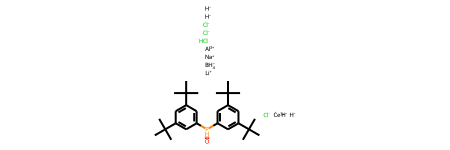

In [46]:
Chem.MolFromSmiles('CC(C)(C)c1cc([PH](=O)c2cc(C(C)(C)C)cc(C(C)(C)C)c2)cc(C(C)(C)C)c1.Cl.[Al+3].[BH4-].[Ce+3].[Cl-].[Cl-].[Cl-].[H-].[H-].[H-].[H-].[Li+].[Na+]')

In [10]:
ds

DatasetDict({
    train: Dataset({
        features: ['product', 'reactant'],
        num_rows: 855625
    })
    test: Dataset({
        features: ['product', 'reactant'],
        num_rows: 106952
    })
    validation: Dataset({
        features: ['product', 'reactant'],
        num_rows: 106952
    })
})

In [9]:
# train = pd.read_csv('../tcrp-test/transformer-chemical-reaction-prediciton/data/all_ord_reaction_uniq_canonicalized-train.csv')
# validation = pd.read_csv('../tcrp-test/transformer-chemical-reaction-prediciton/data/all_ord_reaction_uniq_canonicalized-valid.csv')
# test = pd.read_csv('../tcrp-test/transformer-chemical-reaction-prediciton/data/all_ord_reaction_uniq_canonicalized-test.csv')
from datasets import load_dataset
data_files = {"train": "../tcrp-test/transformer-chemical-reaction-prediciton/data/all_ord_reaction_uniq_canonicalized-train.csv", "test": "../tcrp-test/transformer-chemical-reaction-prediciton/data/all_ord_reaction_uniq_canonicalized-test.csv", "validation":"../tcrp-test/transformer-chemical-reaction-prediciton/data/all_ord_reaction_uniq_canonicalized-valid.csv"}
ds = load_dataset('csv', data_files=data_files)
ds.to_json("../tcrp-test/transformer-chemical-reaction-prediciton/data/ord_datasets.jsonl")

Using custom data configuration default-b2d5b87c6450700e


Extracting data files:   0%|          | 0/3 [00:00<?, ?it/s]

0 tables [00:00, ? tables/s]

0 tables [00:00, ? tables/s]

0 tables [00:00, ? tables/s]

Dataset csv downloaded and prepared to /home/sagawa/.cache/huggingface/datasets/csv/default-b2d5b87c6450700e/0.0.0/652c3096f041ee27b04d2232d41f10547a8fecda3e284a79a0ec4053c916ef7a. Subsequent calls will reuse this data.


  0%|          | 0/3 [00:00<?, ?it/s]

AttributeError: 'DatasetDict' object has no attribute 'to_json'

In [6]:
from huggingface_hub import notebook_login

notebook_login()

Login successful
Your token has been saved to /home/sagawa/.huggingface/token
Authenticated through git-credential store but this isn't the helper defined on your machine.
You might have to re-authenticate when pushing to the Hugging Face Hub. Run the following command in your terminal in case you want to set this credential helper as the default

git config --global credential.helper store


In [7]:
from huggingface_hub import create_repo

repo_url = create_repo(name="ord-uniq-canonicalized", repo_type="dataset")
repo_url

/home/sagawa/anaconda3/lib/python3.9/site-packages/huggingface_hub/hf_api.py:79: FutureWarning: `name` and `organization` input arguments are deprecated and will be removed in v0.8. Pass `repo_id` instead.
  warnings.warn(


'https://huggingface.co/datasets/sagawa/ord-uniq-canonicalized'

In [11]:
ds.push_to_hub(repo_id="ord-uniq-canonicalized")

Pushing split train to the Hub.


Pushing dataset shards to the dataset hub:   0%|          | 0/1 [00:00<?, ?it/s]

Pushing split test to the Hub.


Pushing dataset shards to the dataset hub:   0%|          | 0/1 [00:00<?, ?it/s]

Pushing split validation to the Hub.


Pushing dataset shards to the dataset hub:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
data_files = {"train": "../tcrp-test/transformer-chemical-reaction-prediciton/data/pubchem-10m-canonicalized-train.csv", "validation":"../tcrp-test/transformer-chemical-reaction-prediciton/data/pubchem-10m-canonicalized-valid.csv"}
ds = load_dataset('csv', data_files=data_files)
ds

Using custom data configuration default-ae5678ec841ec48f
Reusing dataset csv (/home/sagawa/.cache/huggingface/datasets/csv/default-ae5678ec841ec48f/0.0.0/652c3096f041ee27b04d2232d41f10547a8fecda3e284a79a0ec4053c916ef7a)


  0%|          | 0/2 [00:00<?, ?it/s]

DatasetDict({
    train: Dataset({
        features: ['smiles'],
        num_rows: 8999964
    })
    validation: Dataset({
        features: ['smiles'],
        num_rows: 999996
    })
})

In [18]:
repo_url = create_repo(name="pubchem-10m-canonicalized", repo_type="dataset")
repo_url

/home/sagawa/anaconda3/lib/python3.9/site-packages/huggingface_hub/hf_api.py:79: FutureWarning: `name` and `organization` input arguments are deprecated and will be removed in v0.8. Pass `repo_id` instead.
  warnings.warn(


'https://huggingface.co/datasets/sagawa/pubchem-10m-canonicalized'

In [19]:
ds.push_to_hub(repo_id="pubchem-10m-canonicalized")

Pushing split train to the Hub.


Pushing dataset shards to the dataset hub:   0%|          | 0/1 [00:00<?, ?it/s]

Pushing split validation to the Hub.


Pushing dataset shards to the dataset hub:   0%|          | 0/1 [00:00<?, ?it/s]

In [35]:
train = pd.read_csv("../tcrp-test/transformer-chemical-reaction-prediciton/data/ZINC-canonicalized-train.csv")
train = train.rename(columns={'text':'smiles'}).drop(['Unnamed: 0'], axis=1)
train.to_csv("../tcrp-test/transformer-chemical-reaction-prediciton/data/ZINC-canonicalized-train.csv", index=False)
valid = pd.read_csv("../tcrp-test/transformer-chemical-reaction-prediciton/data/ZINC-canonicalized-valid.csv")
valid = valid.rename(columns={'text':'smiles'}).drop(['Unnamed: 0'], axis=1)
valid.to_csv("../tcrp-test/transformer-chemical-reaction-prediciton/data/ZINC-canonicalized-valid.csv", index=False)


In [37]:
data_files = {"train": "../tcrp-test/transformer-chemical-reaction-prediciton/data/ZINC-canonicalized-train.csv", "validation":"../tcrp-test/transformer-chemical-reaction-prediciton/data/ZINC-canonicalized-valid.csv"}
ds = load_dataset('csv', data_files=data_files)
ds

Using custom data configuration default-681997cf8c885a68


Extracting data files:   0%|          | 0/2 [00:00<?, ?it/s]

0 tables [00:00, ? tables/s]

0 tables [00:00, ? tables/s]

Dataset csv downloaded and prepared to /home/sagawa/.cache/huggingface/datasets/csv/default-681997cf8c885a68/0.0.0/652c3096f041ee27b04d2232d41f10547a8fecda3e284a79a0ec4053c916ef7a. Subsequent calls will reuse this data.


  0%|          | 0/2 [00:00<?, ?it/s]

DatasetDict({
    train: Dataset({
        features: ['smiles'],
        num_rows: 20693269
    })
    validation: Dataset({
        features: ['smiles'],
        num_rows: 2299253
    })
})

In [38]:
repo_url = create_repo(name="ZINC-canonicalized", repo_type="dataset")
ds.push_to_hub(repo_id="ZINC-canonicalized")

/home/sagawa/anaconda3/lib/python3.9/site-packages/huggingface_hub/hf_api.py:79: FutureWarning: `name` and `organization` input arguments are deprecated and will be removed in v0.8. Pass `repo_id` instead.
  warnings.warn(
Pushing split train to the Hub.


Pushing dataset shards to the dataset hub:   0%|          | 0/3 [00:00<?, ?it/s]

Pushing split validation to the Hub.


Pushing dataset shards to the dataset hub:   0%|          | 0/1 [00:00<?, ?it/s]

In [39]:
ds = load_dataset('sagawa/pubchem-10m-canonicalized')
ds

Downloading:   0%|          | 0.00/801 [00:00<?, ?B/s]

Using custom data configuration sagawa--pubchem-10m-canonicalized-93982af44e6a1c55


Extracting data files:   0%|          | 0/2 [00:00<?, ?it/s]

0 tables [00:00, ? tables/s]

0 tables [00:00, ? tables/s]

Dataset parquet downloaded and prepared to /home/sagawa/.cache/huggingface/datasets/sagawa___parquet/sagawa--pubchem-10m-canonicalized-93982af44e6a1c55/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec. Subsequent calls will reuse this data.


  0%|          | 0/2 [00:00<?, ?it/s]

DatasetDict({
    validation: Dataset({
        features: ['smiles'],
        num_rows: 999996
    })
    train: Dataset({
        features: ['smiles'],
        num_rows: 8999964
    })
})

In [37]:
dataset

DatasetDict({
    validation: Dataset({
        features: ['product', 'reactant'],
        num_rows: 106952
    })
    test: Dataset({
        features: ['product', 'reactant'],
        num_rows: 106952
    })
    train: Dataset({
        features: ['product', 'reactant'],
        num_rows: 855625
    })
})

In [39]:
dataset = load_dataset('sagawa/ord-uniq-canonicalized')
import datasets
if CFG.multitask:
    dataset['train'] = datasets.Dataset.from_dict({'product':['Reactants:'+i for i in dataset['train']['product']]+['Product:'+i for i in dataset['train']['reactant']], 'reactant': dataset['train']['reactant']+dataset['train']['product']})
else:
    dataset['train'] = datasets.Dataset.from_dict({'product':['Reactants:'+i for i in dataset['train']['product']], 'reactant': dataset['train']['reactant']})
dataset['validation'] = datasets.Dataset.from_dict({'product':['Reactants:'+i for i in dataset['validation']['product']], 'reactant': dataset['validation']['reactant']})
dataset['test'] = datasets.Dataset.from_dict({'product':['Reactants:'+i for i in dataset['test']['product']], 'reactant': dataset['test']['reactant']})
dataset

Using custom data configuration sagawa--ord-uniq-canonicalized-f35c5642581b76c5
Reusing dataset parquet (/home/sagawa/.cache/huggingface/datasets/sagawa___parquet/sagawa--ord-uniq-canonicalized-f35c5642581b76c5/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec)


  0%|          | 0/3 [00:00<?, ?it/s]

DatasetDict({
    validation: Dataset({
        features: ['product', 'reactant'],
        num_rows: 106952
    })
    test: Dataset({
        features: ['product', 'reactant'],
        num_rows: 106952
    })
    train: Dataset({
        features: ['product', 'reactant'],
        num_rows: 1711250
    })
})

In [44]:
dataset['test']['product'][:100]

['Reactant:Cc1ccc(F)cc1-c1ccc2c(Br)c(N)ncc2c1',
 'Reactant:Cc1cc(Cl)nnc1NN',
 'Reactant:CCOC(=O)CC(C)c1ccc(F)cc1',
 'Reactant:Cc1cc(Nc2nc(Nc3ccccc3S(=O)(=O)C(C)C)c3c(C)n[nH]c3n2)c(OC(C)C)cc1C1CCN(C)CC1',
 'Reactant:CC(C)(C)OC(=O)N1CC[C@@H](N2C(=O)S/C(=C\\c3ccc4c(cnn4Cc4ccc(Cl)cc4C(F)(F)F)c3)C2=O)[C@H](F)C1',
 'Reactant:CCOC(=O)/C=C(\\N)C(F)(F)F',
 'Reactant:Nc1ncnn2c(C3CCN(C4CC4)CC3)cc(-c3ccc4cn(Cc5ccccc5)nc4c3)c12',
 'Reactant:O=C1CSc2cc(NCc3cccc(OCc4ccc5ccccc5n4)c3)ccc2N1',
 'Reactant:O=C(Nc1ccc(OC(=O)N2CCC(O)CC2)nc1)c1ccc(Cl)cc1',
 'Reactant:O=C(Nc1cccc(Oc2ccnc3[nH]c(=O)[nH]c23)c1)Nc1cc(C(F)(F)F)ccc1F',
 'Reactant:O=C1C=C(O)CC(c2ccc3c(c2)CCC3)C1',
 'Reactant:c1ccc2c(c1)Oc1cc(-c3nnn[nH]3)ccc1N2C1CCN(Cc2ncc[nH]2)CC1',
 'Reactant:COc1cc(-c2nc(O)c3ccccc3n2)cc(OC)c1OC',
 'Reactant:O=C(Cc1nc(N2CCOCC2)c(F)c(=O)[nH]1)N1c2ccccc2CC1CO',
 'Reactant:CC1=C2C=C(C(C)(C)C)C=C2C(C)(C)C1',
 'Reactant:CN1CCC(NC(=O)CNC(=O)c2cc([N+](=O)[O-])c(Sc3c(Cl)cncc3Cl)s2)CC1',
 'Reactant:CCOC(=O)c1cc2c(-c3ccccn3)

In [13]:
tokenizer.add_special_tokens({'additional_special_tokens':tokenizer.additional_special_tokens + ['Product', 'Reactants']})
tokenizer

PreTrainedTokenizerFast(name_or_path='sagawa/ZINC-t5', vocab_size=121, model_max_len=1000000000000000019884624838656, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'eos_token': '</s>', 'unk_token': '<unk>', 'pad_token': '<pad>', 'additional_special_tokens': ['<extra_id_0>', '<extra_id_1>', '<extra_id_2>', '<extra_id_3>', '<extra_id_4>', '<extra_id_5>', '<extra_id_6>', '<extra_id_7>', '<extra_id_8>', '<extra_id_9>', '<extra_id_10>', '<extra_id_11>', '<extra_id_12>', '<extra_id_13>', '<extra_id_14>', '<extra_id_15>', '<extra_id_16>', '<extra_id_17>', '<extra_id_18>', '<extra_id_19>', '<extra_id_20>', '<extra_id_21>', '<extra_id_22>', '<extra_id_23>', '<extra_id_24>', '<extra_id_25>', '<extra_id_26>', '<extra_id_27>', '<extra_id_28>', '<extra_id_29>', '<extra_id_30>', '<extra_id_31>', '<extra_id_32>', '<extra_id_33>', '<extra_id_34>', '<extra_id_35>', '<extra_id_36>', '<extra_id_37>', '<extra_id_38>', '<extra_id_39>', '<extra_id_40>', '<extra_id_41>', '<extr

In [ ]:
{'additional_special_tokens': ['[C1]','[C2]','[C3]','[C4]']}

In [3]:
df = pd.read_csv('../all_ord_reaction_uniq_with_attr_v3.tsv')
df = df[~df['PRODUCT'].isna()]
for col in ['CATALYST', 'REACTANT', 'REAGENT', 'SOLVENT', 'INTERNAL_STANDARD', 'NoData','PRODUCT', 'YIELD', 'TEMP']:
    df[col] = df[col].fillna(' ')
df['input'] = 'REACTANT:' + df['REACTANT']  + 'CATALYST:' + df['CATALYST'] + 'REAGENT:' + df['REAGENT'] + 'SOLVENT:' + df['SOLVENT'] + 'NoData:' + df['NoData']

/tmp/ipykernel_1464/1215727890.py:1: DtypeWarning: Columns (0,1,2,3,4,5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('../all_ord_reaction_uniq_with_attr_v3.tsv')
/tmp/ipykernel_1464/1215727890.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].fillna(' ')
/tmp/ipykernel_1464/1215727890.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['input'] = 'REACTANT:' + df['REACTANT']  + 'CATALYST:' + df['CATALYST'] + 'REAGENT:' + df['REAGENT'] +

In [35]:
lens = df['input'].apply(lambda x: len(x))
df = df[lens <= 512]
train, test = train_test_split(df, test_size=int(len(all)*0.1))
train, valid = train_test_split(train, test_size=int(len(all)*0.1))
train.to_csv('multi-input-train.csv', index=False)
valid.to_csv('multi-input-valid.csv', index=False)
test.to_csv('multi-input-test.csv', index=False)

In [10]:
from collections import Counter
counter = Counter()
for l in df['len']:
    counter[l] += 1
counter

Counter({313: 126,
         314: 141,
         339: 36,
         325: 62,
         318: 89,
         298: 268,
         306: 215,
         307: 197,
         312: 97,
         310: 144,
         324: 86,
         315: 93,
         104: 35801,
         111: 33557,
         124: 25655,
         100: 35761,
         107: 35541,
         120: 28068,
         110: 34186,
         117: 31091,
         130: 21377,
         114: 31926,
         121: 27730,
         134: 18516,
         128: 22585,
         141: 14942,
         106: 35725,
         113: 33036,
         126: 24081,
         116: 31744,
         123: 26573,
         136: 17538,
         127: 23670,
         140: 15104,
         147: 11749,
         137: 17120,
         133: 19406,
         143: 13655,
         154: 9148,
         129: 22096,
         149: 11069,
         125: 25371,
         132: 20146,
         145: 12661,
         135: 18132,
         142: 14186,
         155: 8666,
         139: 15577,
         146: 12309,
   

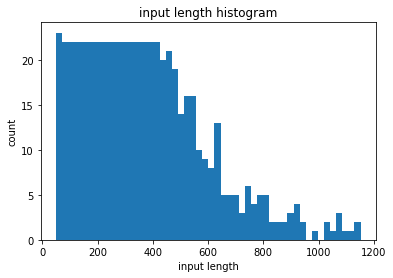

In [22]:
import matplotlib.pyplot as plt
fig = plt.hist(counter, bins=50)
plt.xlabel('input length')
plt.ylabel('count')
plt.title('input length histogram')
plt.savefig('multiinput-length-histogram.png')

,CATALYST,REACTANT,REAGENT,SOLVENT,INTERNAL_STANDARD,NoData,PRODUCT,YIELD,TEMP,input,len
28189,,CC(=O)S[C@@H]1CC2=CC(=O)C=C[C@]2(C)[C@H]2CC[C@...,,,,,CC(C)CN=C1C(c2ccccc2)=C(c2ccccc2)C(c2ccccc2)=C...,,,REACTANT:CC(=O)S[C@@H]1CC2=CC(=O)C=C[C@]2(C)[C...,1076
28194,,CC(C)C(C(=O)OC(C#N)c1cccc(Oc2ccccc2)c1)c1ccc(C...,,,,,CC(C)CN=C1C(c2ccccc2)=C(c2ccccc2)C(c2ccccc2)=C...,,,REACTANT:CC(C)C(C(=O)OC(C#N)c1cccc(Oc2ccccc2)c...,1152
28198,,C=C1/C(=C\C=C2/CCC[C@@]3(C)[C@H]2CC[C@@H]3[C@H...,,,,,CC(C)CN=C1C(c2ccccc2)=C(c2ccccc2)C(c2ccccc2)=C...,,,REACTANT:C=C1/C(=C\C=C2/CCC[C@@]3(C)[C@H]2CC[C...,1093
909023,,CC(C)=CO[Si](C)(C)C.CC1=C(/C=C/C(C)=C/C=C/C(C)...,,,,,CCOC(=O)c1cccc(-c2cn(-c3ccc(F)c(F)c3)nc2C(=O)O...,,,REACTANT:CC(C)=CO[Si](C)(C)C.CC1=C(/C=C/C(C)=C...,1137
1309960,,Cc1c(C)c(S(=O)(=O)NC(=N)NCCC[C@H](NC(=O)OCC2c3...,,,,,O=C(O)c1cccc(Cl)c1,,,REACTANT:Cc1c(C)c(S(=O)(=O)NC(=N)NCCC[C@H](NC(...,1037
1347420,,Cc1c(C)c(S(=O)(=O)NC(=N)NCCC[C@H](NC(=O)OCC2c3...,,,,,O=C(O)c1cccc(Cl)c1,,,REACTANT:Cc1c(C)c(S(=O)(=O)NC(=N)NCCC[C@H](NC(...,1037
1354904,,CC(Nc1nc(NC2(C(F)(F)F)CC2)c2nc(-c3ccc(F)cc3)cc...,,,,,O=C(O)c1cccc(Cl)c1,,,REACTANT:CC(Nc1nc(NC2(C(F)(F)F)CC2)c2nc(-c3ccc...,1084
1376301,,CC(=O)N[C@H]1CC[C@H]2[C@@H]3CC[C@H]4C[C@H](O)C...,,,,,O=C(O)c1cccc(Cl)c1,,,REACTANT:CC(=O)N[C@H]1CC[C@H]2[C@@H]3CC[C@H]4C...,1060
1566825,,CC(=O)S[C@@H]1CC2=CC(=O)C=C[C@]2(C)[C@H]2CC[C@...,,,,,CCCCCCCC/C=C\CCCCCCCC(=O)O,,,REACTANT:CC(=O)S[C@@H]1CC2=CC(=O)C=C[C@]2(C)[C...,1076
1566832,,C=C1/C(=C\C=C2/CCC[C@@]3(C)[C@H]2CC[C@@H]3[C@H...,,,,,CCCCCCCC/C=C\CCCCCCCC(=O)O,,,REACTANT:C=C1/C(=C\C=C2/CCC[C@@]3(C)[C@H]2CC[C...,1093


In [2]:
df = pd.read_csv('../all_ord_reaction_uniq_with_attr_v3.tsv')
df = df[~df['YIELD'].isna()]
for col in ['CATALYST', 'REACTANT', 'REAGENT', 'SOLVENT', 'INTERNAL_STANDARD', 'NoData','PRODUCT', 'YIELD', 'TEMP']:
    df[col] = df[col].fillna(' ')
# df['input'] = 'REACTANT:' + df['REACTANT'] + 'PRODUCT:' + df['PRODUCT'] + 'CATALYST:' + df['CATALYST'] + 'REAGENT:' + df['REAGENT'] + 'SOLVENT:' + df['SOLVENT'] + 'NoData:' + df['NoData']
df['input'] = 'REACTANT:' + df['REACTANT'] + 'PRODUCT:' + df['PRODUCT'] + 'CATALYST:' + df['CATALYST']
from collections import Counter
df['len'] = df['input'].apply(lambda x: len(x))
counter = Counter()
for l in df['len']:
    counter[l] += 1
counter

/tmp/ipykernel_16647/3848426775.py:1: DtypeWarning: Columns (0,1,2,3,4,5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('../all_ord_reaction_uniq_with_attr_v3.tsv')
/tmp/ipykernel_16647/3848426775.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].fillna(' ')


Counter({308: 90,
         309: 102,
         334: 30,
         320: 72,
         313: 76,
         293: 181,
         301: 122,
         302: 113,
         307: 119,
         305: 129,
         319: 66,
         310: 94,
         80: 1929,
         76: 1288,
         86: 3181,
         90: 4184,
         97: 5727,
         82: 2173,
         92: 4607,
         96: 5528,
         103: 7127,
         93: 4996,
         89: 3836,
         99: 6397,
         110: 8010,
         105: 7230,
         101: 6796,
         111: 8387,
         115: 8572,
         122: 8372,
         153: 5091,
         155: 4991,
         151: 5373,
         181: 2395,
         162: 4331,
         177: 2633,
         159: 4443,
         175: 2937,
         161: 4146,
         148: 5919,
         158: 4748,
         176: 2586,
         149: 5707,
         173: 3050,
         57: 63,
         45: 1,
         102: 6820,
         95: 5524,
         147: 5775,
         142: 6785,
         83: 2529,
         133: 7596

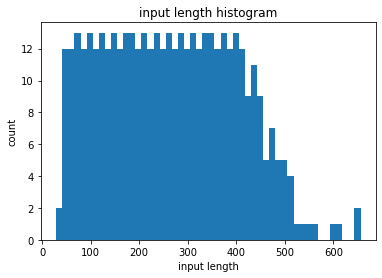

In [43]:
import matplotlib.pyplot as plt
fig = plt.hist(counter, bins=50)
plt.xlabel('input length')
plt.ylabel('count')
plt.title('input length histogram')
plt.savefig('regression-length-histogram.png')

In [3]:
df = pd.read_csv('../all_ord_reaction_uniq_with_attr_v1.tsv')
df

,ord-cf0d04017ede4c8aab8a15119c53e57b\tCATALYST:CC(C)(C)c1ccn2->[Ir+]34(<-n5cc(C(F)(F)F)ccc5-c5c(F)cc(F)cc53)(<-n3cc(C(F)(F)F)ccc3-c3c(F)cc(F)cc34)<-n3ccc(C(C)(C)C)cc3-c2c1.CATALYST:CC(C)(C)c1ccnc(-c2cc(C(C)(C)C)ccn2)c1.CATALYST:COCCOC.CATALYST:Cl[Ni]Cl.CATALYST:F[P-](F)(F)(F)(F)F.REACTANT:CC(=O)c1ccc(Br)cc1.REACTANT:O=C(O)C1CCCN1C(=O)OCc1ccccc1.REAGENT:O=C([O-])[O-].REAGENT:[Cs+].SOLVENT:CN(C)C=O\tPRODUCT:CC(=O)c1ccc(C2CCCN2C(=O)OCc2ccccc2)cc1\tYIELD:93.TEMP:23.0
0,ord-153de2a96e07484e93d525d81f966789\tCATALYST...
1,ord-5a3239d982264f8c8dc20d57d17e3036\tCATALYST...
2,ord-fb9150450d964b1e8515a67a635523f7\tCATALYST...
3,ord-8c8d5cbe7313457197480b73e68c5e45\tCATALYST...
4,ord-0b453c3805b0490c9fffb6fb51128e7a\tCATALYST...
...,...
2268538,ord-0268d1ee492743858a6799545f0d65f7\tREACTANT...
2268539,ord-7ea6e371bb9f43caa73101847641686e\tREACTANT...
2268540,ord-3587837cf13444079728d4f63d0bbb2f\tREACTANT...
2268541,ord-22d7ccff61cd42a3a9406a20b5ce5c00\tCATALYST...


In [1]:
class CFG():
    data_path = '../all_ord_reaction_uniq_with_attr_v3.csv'
    pretrained_model_name_or_path = 'sagawa/ZINC-t5'
    model = 't5'
    epochs = 10
    lr = 2e-5
    batch_size = 1
    max_len = 10
    weight_decay = 0.01
    evaluation_strategy = 'epoch'
    save_strategy = 'epoch'
    logging_strategy = 'epoch'
    save_total_limit = 1
    fp16 = False
    disable_tqdm = True
    seed = 42
    debug = True
    
    
    
import os
os.environ["CUDA_VISIBLE_DEVICES"]="0"
import gc
import random
import itertools
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
import torch
import tokenizers
import transformers
from transformers import AutoTokenizer, EncoderDecoderModel, DataCollatorForSeq2Seq, AutoModelForSeq2SeqLM, Seq2SeqTrainingArguments, Seq2SeqTrainer
import datasets
from datasets import load_dataset, load_metric, Dataset, DatasetDict
import sentencepiece
import argparse
from sklearn.model_selection import train_test_split
from datasets.utils.logging import disable_progress_bar
disable_progress_bar()


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def seed_everything(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
seed_everything(seed=CFG.seed)  
    

df = pd.read_csv(CFG.data_path)
df = df[~df['PRODUCT'].isna()]
for col in ['CATALYST', 'REACTANT', 'REAGENT', 'SOLVENT', 'INTERNAL_STANDARD', 'NoData','PRODUCT', 'YIELD', 'TEMP']:
    df[col] = df[col].fillna(' ')
df['TEMP'] = df['TEMP'].apply(lambda x: str(x))


# reactantとcatalyst========================================================================
print(len(df), flush=True)
df = df[df['REACTANT'] != ' ']
print(len(df), flush=True)
df = df[['REACTANT', 'PRODUCT', 'CATALYST']].drop_duplicates().reset_index(drop=True)
print(len(df), flush=True)
df = df.iloc[df[['REACTANT', 'CATALYST']].drop_duplicates().index].reset_index(drop=True)
print(len(df), flush=True)
df['input'] = 'REACTANT:' + df['REACTANT'] + 'CATALYST:' + df['CATALYST'] 
# ========================================================================

lens = df['input'].apply(lambda x: len(x))
df = df[lens <= 512]

train, test = train_test_split(df, test_size=int(len(df)*0.1))
train, valid = train_test_split(train, test_size=int(len(df)*0.1))


if CFG.debug:
    train = train[:int(len(train)/4000)].reset_index(drop=True)
    valid = valid[:int(len(valid)/4000)].reset_index(drop=True)
    
    
# train[['input', 'PRODUCT']].to_csv('../../multi-input-train.csv', index=False)
# valid[['input', 'PRODUCT']].to_csv('../../multi-input-valid.csv', index=False)
# test[['input', 'PRODUCT']].to_csv('../../multi-input-test.csv', index=False)

dataset = DatasetDict({'train': Dataset.from_pandas(train[['input', 'PRODUCT']]), 'validation': Dataset.from_pandas(valid[['input', 'PRODUCT']])})


def preprocess_function(examples):
    inputs = examples['input']
    targets = examples['PRODUCT']
    model_inputs = tokenizer(inputs, max_length=CFG.max_len, truncation=True)
    labels = tokenizer(targets, max_length=CFG.max_len, truncation=True)
    model_inputs['labels'] = labels['input_ids']
    return model_inputs

def compute_metrics(eval_preds):
    metric = load_metric('sacrebleu')
    preds, labels = eval_preds
    if isinstance(preds, tuple):
        preds = preds[0]

    decoded_preds = tokenizer.batch_decode(preds, skip_special_tokens=True)

    labels = np.where(labels != -100, labels, tokenizer.pad_token_id)
    decoded_labels = tokenizer.batch_decode(labels, skip_special_tokens=True)

    decoded_preds = [pred.strip() for pred in decoded_preds]
    decoded_labels = [[label.strip()] for label in decoded_labels]

    result = metric.compute(predictions=decoded_preds, references=decoded_labels)
    return {'bleu': result['score']}


#load tokenizer
try: # load pretrained tokenizer from local directory
    tokenizer = AutoTokenizer.from_pretrained(os.path.abspath(CFG.pretrained_model_name_or_path), return_tensors='pt')
except: # load pretrained tokenizer from huggingface model hub
    tokenizer = AutoTokenizer.from_pretrained(CFG.pretrained_model_name_or_path, return_tensors='pt')
tokenizer.add_tokens('.')
tokenizer.add_special_tokens({'additional_special_tokens': tokenizer.additional_special_tokens + ['CATALYST:', 'REACTANT:', 'REAGENT:', 'SOLVENT:', 'NoData:','PRODUCT:']})


#load model
if CFG.model == 't5':
    try: # load pretrained model from local directory
        model = AutoModelForSeq2SeqLM.from_pretrained(os.path.abspath(CFG.pretrained_model_name_or_path), from_flax=True)
    except: # load pretrained model from huggingface model hub
        model = AutoModelForSeq2SeqLM.from_pretrained(CFG.pretrained_model_name_or_path, from_flax=True)
    model.resize_token_embeddings(len(tokenizer))
elif CFG.model == 'deberta':
    try: # load pretrained model from local directory
        model = EncoderDecoderModel.from_encoder_decoder_pretrained(os.path.abspath(CFG.pretrained_model_name_or_path), 'roberta-large')
    except: # load pretrained model from huggingface model hub
        model = EncoderDecoderModel.from_encoder_decoder_pretrained(os.path.abspath(CFG.pretrained_model_name_or_path), 'roberta-large')
    model.encoder.resize_token_embeddings(len(tokenizer))
    model.decoder.resize_token_embeddings(len(tokenizer))
    config_encoder = model.config.encoder
    config_decoder = model.config.decoder
    config_decoder.is_decoder = True
    config_decoder.add_cross_attention = True
    model.config.decoder_start_token_id = tokenizer.bos_token_id
    model.config.pad_token_id = tokenizer.pad_token_id

tokenized_datasets = dataset.map(
    preprocess_function,
    batched=True,
    remove_columns=dataset['train'].column_names,
    load_from_cache_file=False
)

data_collator = DataCollatorForSeq2Seq(tokenizer, model=model)

args = Seq2SeqTrainingArguments(
    CFG.model,
    evaluation_strategy=CFG.evaluation_strategy,
    save_strategy=CFG.save_strategy,
    learning_rate=CFG.lr,
    per_device_train_batch_size=CFG.batch_size,
    per_device_eval_batch_size=CFG.batch_size,
    weight_decay=CFG.weight_decay,
    save_total_limit=CFG.save_total_limit,
    num_train_epochs=CFG.epochs,
    predict_with_generate=True,
    fp16=CFG.fp16,
    disable_tqdm=CFG.disable_tqdm,
    push_to_hub=False,
    load_best_model_at_end=True
)

trainer = Seq2SeqTrainer(
    model,
    args,
    train_dataset=tokenized_datasets['train'],
    eval_dataset=tokenized_datasets['validation'],
    data_collator=data_collator,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics,
)

trainer.train()

# trainer.save_model('./best_model')



2267917
1788879
1555357
1051927


All Flax model weights were used when initializing T5ForConditionalGeneration.

Some weights of T5ForConditionalGeneration were not initialized from the Flax model and are newly initialized: ['encoder.embed_tokens.weight', 'decoder.embed_tokens.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
***** Running training *****
  Num examples = 210
  Num Epochs = 10
  Instantaneous batch size per device = 1
  Total train batch size (w. parallel, distributed & accumulation) = 1
  Gradient Accumulation steps = 1
  Total optimization steps = 2100
***** Running Evaluation *****
  Num examples = 26
  Batch size = 1
Saving model checkpoint to t5/checkpoint-210
Configuration saved in t5/checkpoint-210/config.json


{'eval_loss': 0.9729129076004028, 'eval_bleu': 16.112552265823812, 'eval_runtime': 5.0262, 'eval_samples_per_second': 5.173, 'eval_steps_per_second': 5.173, 'epoch': 1.0}


Model weights saved in t5/checkpoint-210/pytorch_model.bin
tokenizer config file saved in t5/checkpoint-210/tokenizer_config.json
Special tokens file saved in t5/checkpoint-210/special_tokens_map.json
***** Running Evaluation *****
  Num examples = 26
  Batch size = 1
Saving model checkpoint to t5/checkpoint-420
Configuration saved in t5/checkpoint-420/config.json


{'eval_loss': 0.6760507822036743, 'eval_bleu': 3.468846226903845, 'eval_runtime': 4.9664, 'eval_samples_per_second': 5.235, 'eval_steps_per_second': 5.235, 'epoch': 2.0}


Model weights saved in t5/checkpoint-420/pytorch_model.bin
tokenizer config file saved in t5/checkpoint-420/tokenizer_config.json
Special tokens file saved in t5/checkpoint-420/special_tokens_map.json
Deleting older checkpoint [t5/checkpoint-210] due to args.save_total_limit


{'loss': 1.5045, 'learning_rate': 1.523809523809524e-05, 'epoch': 2.38}


***** Running Evaluation *****
  Num examples = 26
  Batch size = 1


KeyboardInterrupt: 

In [2]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="0"
import gc
import random
import itertools
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
import tokenizers
import transformers
from transformers import AutoTokenizer, AutoConfig, AutoModel, T5EncoderModel, get_linear_schedule_with_warmup
import datasets
from datasets import load_dataset, load_metric
import sentencepiece
import argparse
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
import torch.nn as nn
from torch.optim import AdamW
import pickle
import time
import math
from sklearn.preprocessing import MinMaxScaler
from datasets.utils.logging import disable_progress_bar
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
disable_progress_bar()

class CFG():
    data_path='all_ord_reaction_uniq_with_attr_v3.tsv'
    pretrained_model_name_or_path = 'sagawa/ZINC-t5'
    model_name_or_path = None
    debug = True
    epochs = 5
    lr = 2e-5
    batch_size = 5
    max_len = 512
    weight_decay = 0.01
    seed = 42
    num_workers = 4
    fc_dropout = 0.1
    eps = 1e-6
    max_grad_norm=1000
    gradient_accumulation_steps=3
    num_warmup_steps=0
    batch_scheduler=True
    print_freq=100
    use_apex=False
    output_dir = './'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

OUTPUT_DIR = CFG.output_dir
if not os.path.exists(OUTPUT_DIR):
    os.makedirs(OUTPUT_DIR)

def seed_everything(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
seed_everything(seed=CFG.seed)  
    

df = pd.read_csv(CFG.data_path).drop_duplicates().reset_index(drop=True)
df = df[~df['YIELD'].isna()].reset_index(drop=True)
df['YIELD'] = df['YIELD'].clip(0, 100)/100
df = df[~(df['REACTANT'].isna() | df['PRODUCT'].isna())]
for col in ['CATALYST', 'REACTANT', 'REAGENT', 'SOLVENT', 'INTERNAL_STANDARD', 'NoData','PRODUCT']:
    df[col] = df[col].fillna(' ')
    
df['input'] = 'REACTANT:' + df['REACTANT'] + 'PRODUCT:' + df['PRODUCT'] + 'CATALYST:' + df['CATALYST'] + 'REAGENT:' + df['REAGENT']
df = df[['input', 'YIELD']].drop_duplicates().reset_index(drop=True)

lens = df['input'].apply(lambda x: len(x))
# remove data that have too long inputs
df = df[lens <= 512].reset_index(drop=True)

train_ds, test_ds = train_test_split(df, test_size=int(len(df)*0.1))
train_ds, valid_ds = train_test_split(train_ds, test_size=int(len(df)*0.1))
train_ds.to_csv('regression-input-train.csv', index=False)
valid_ds.to_csv('regression-input-valid.csv', index=False)
test_ds.to_csv('regression-input-test.csv', index=False)

if CFG.debug:
    train_ds = train_ds[:int(len(train_ds)/4)].reset_index(drop=True)
    valid_ds = valid_ds[:int(len(valid_ds)/4)].reset_index(drop=True)
        
    
def get_logger(filename=OUTPUT_DIR+'train'):
    from logging import getLogger, INFO, StreamHandler, FileHandler, Formatter
    logger = getLogger(__name__)
    logger.setLevel(INFO)
    handler1 = StreamHandler()
    handler1.setFormatter(Formatter("%(message)s"))
    handler2 = FileHandler(filename=f"{filename}.log")
    handler2.setFormatter(Formatter("%(message)s"))
    logger.addHandler(handler1)
    logger.addHandler(handler2)
    return logger

LOGGER = get_logger()

#load tokenizer
try: # load pretrained tokenizer from local directory
    tokenizer = AutoTokenizer.from_pretrained(os.path.abspath(CFG.pretrained_model_name_or_path), return_tensors='pt')
except: # load pretrained tokenizer from huggingface model hub
    tokenizer = AutoTokenizer.from_pretrained(CFG.pretrained_model_name_or_path, return_tensors='pt')
tokenizer.add_tokens('.')
# tokenizer.add_special_tokens({'additional_special_tokens': tokenizer.additional_special_tokens + ['CATALYST:', 'REACTANT:', 'REAGENT:', 'SOLVENT:', 'NoData:','PRODUCT:']})
tokenizer.add_special_tokens({'additional_special_tokens': tokenizer.additional_special_tokens + ['REACTANT:', 'PRODUCT:', 'CATALYST:', 'REAGENT:']})
tokenizer.save_pretrained(OUTPUT_DIR+'tokenizer/')
CFG.tokenizer = tokenizer
def prepare_input(cfg, text):
    inputs = cfg.tokenizer(text, add_special_tokens=True, max_length=CFG.max_len, padding='max_length', return_offsets_mapping=False, truncation=True, return_attention_mask=True)
    for k, v in inputs.items():
        inputs[k] = torch.tensor(v, dtype=torch.long)
    
    return inputs


class TrainDataset(Dataset):
    def __init__(self, cfg, df):
        self.cfg = cfg
        self.inputs = df['input'].values
        self.labels = df['YIELD'].values
        
    def __len__(self):
        return len(self.labels)
    
    def __getitem__(self, item):
        inputs = prepare_input(self.cfg, self.inputs[item])
        label = torch.tensor(self.labels[item], dtype=torch.float)
        
        return inputs, label
    
       
class RegressionModel(nn.Module):
    def __init__(self, cfg, config_path=None, pretrained=False):
        super().__init__()
        self.cfg = cfg
        if config_path is None:
            self.config = AutoConfig.from_pretrained(cfg.pretrained_model_name_or_path, output_hidden_states=True)
        else:
            self.config = torch.load(config_path)
        if pretrained:
            if 't5' in cfg.pretrained_model_name_or_path:
                self.model = T5EncoderModel.from_pretrained(CFG.pretrained_model_name_or_path)
            else:
                self.model = AutoModel.from_pretrained(CFG.pretrained_model_name_or_path)
        else:
            if 't5' in cfg.model_name_or_path:
                self.model = T5EncoderModel.from_pretrained('sagawa/ZINC-t5')
            else:
                self.model = AutoModel.from_config(self.config)
        self.model.resize_token_embeddings(len(cfg.tokenizer))
        self.fc_dropout1 = nn.Dropout(cfg.fc_dropout)
        self.fc1 = nn.Linear(self.config.hidden_size, self.config.hidden_size)
        self.fc_dropout2 = nn.Dropout(cfg.fc_dropout)
        self.fc2 = nn.Linear(self.config.hidden_size, 1)
        
    def forward(self, inputs):
        outputs = self.model(**inputs)
        last_hidden_states = outputs[0]
        output = self.fc1(self.fc_dropout1(last_hidden_states)[:, 0, :].view(-1, self.config.hidden_size))
        output = self.fc2(self.fc_dropout2(output))
        return output
    
    
    
class AverageMeter(object):
    def __init__(self):
        self.reset()
        
    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0
        
    def update(self, val, n=1):
        self.val = val
        self.sum += val*n
        self.count += n
        self.avg = self.sum/self.count
        

def asMinutes(s):
    m = math.floor(s/60)
    s -= m*60
    return '%dm %ds' % (m, s)


def timeSince(since, percent):
    now = time.time()
    s = now - since
    es = s/(percent)
    rs = es - s
    return '%s (remain %s)' % (asMinutes(s), asMinutes(rs))


def train_fn(train_loader, model, criterion, optimizer, epoch, scheduler, device):
    model.train()
    scaler = torch.cuda.amp.GradScaler(enabled=CFG.use_apex)
    losses = AverageMeter()
    start = end = time.time()
    global_step = 0
    for step, (inputs, labels) in enumerate(train_loader):
        for k, v in inputs.items():
            inputs[k] = v.to(device)
        labels = labels.to(device)
        batch_size = labels.size(0)
        with torch.cuda.amp.autocast(enabled=CFG.use_apex):
            y_preds = model(inputs)
        loss = criterion(y_preds.view(-1, 1), labels.view(-1, 1))
        if CFG.gradient_accumulation_steps > 1:
            loss = loss/CFG.gradient_accumulation_steps
        losses.update(loss.item(), batch_size)
        scaler.scale(loss).backward()
        grad_norm = torch.nn.utils.clip_grad_norm_(model.parameters(), CFG.max_grad_norm)
        if (step + 1) % CFG.gradient_accumulation_steps == 0:
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()
            global_step += 1
            if CFG.batch_scheduler:
                scheduler.step()
        end = time.time()
        if step % CFG.print_freq == 0 or step == (len(train_loader)-1):
            print('Epoch: [{0}][{1}/{2}] '
                  'Elapsed {remain:s} '
                  'Loss: {loss.val:.4f}({loss.avg:.4f}) '
                  'Grad: {grad_norm:.4f}  '
                  'LR: {lr:.8f}  '
                  .format(epoch+1, step, len(train_loader), 
                          remain=timeSince(start, float(step+1)/len(train_loader)),
                          loss=losses,
                          grad_norm=grad_norm,
                          lr=scheduler.get_lr()[0]), flush=True)
    return losses.avg


def valid_fn(valid_loader, model, criterion, device):
    losses = AverageMeter()
    model.eval()
    start = end = time.time()
    label_list = []
    pred_list = []
    for step, (inputs, labels) in enumerate(valid_loader):
        for k, v in inputs.items():
            inputs[k] = v.to(device)
        with torch.no_grad():
            y_preds = model(inputs)
        label_list += labels.tolist()
        pred_list += y_preds.tolist()
        end = time.time()
        if step % CFG.print_freq == 0 or step == (len(valid_loader)-1):
            print('EVAL: [{0}/{1}] '
                  'Elapsed {remain:s} '
                  'RMSE Loss: {loss:.4f} '
                  'r2 score: {r2_score:.4f} '
                  .format(step, len(valid_loader),
                          loss=mean_squared_error(label_list, pred_list, squared=False),
                          remain=timeSince(start, float(step+1)/len(valid_loader)),
                          r2_score=r2_score(label_list, pred_list)))
    return mean_squared_error(label_list, pred_list), r2_score(label_list, pred_list)
    
def inference_fn(test_loader, model, device):
    preds = []
    model.eval()
    model.to(device)
    tk0 = tqdm(test_loader, total=len(test_loader))
    for inputs in tk0:
        for k, v in inputs.items():
            inputs[k] = v.to(device)
        with torch.no_grad():
            y_preds = model(inputs)
        preds.append(y_preds.to('cpu').numpy())
    predictions = np.concatenate(preds)
    return predictions


def train_loop(train_ds, valid_ds):
    
    train_dataset = TrainDataset(CFG, train_ds)
    valid_dataset = TrainDataset(CFG, valid_ds)
    valid_labels = valid_ds['YIELD'].values
    
    train_loader = DataLoader(train_dataset, batch_size=CFG.batch_size, shuffle=True, num_workers=CFG.num_workers, pin_memory=True, drop_last=True)
    valid_loader = DataLoader(valid_dataset, batch_size=CFG.batch_size, shuffle=False, num_workers=CFG.num_workers, pin_memory=True, drop_last=False)
    
    model = RegressionModel(CFG, config_path=None, pretrained=True)
    torch.save(model.config, OUTPUT_DIR+'config.pth')
    model.to(device)
    
    def get_optimizer_params(model, encoder_lr, decoder_lr, weight_decay=0.0):
        param_optimizer = list(model.named_parameters())
        no_decay = ['bias', 'LayerNorm.bias', 'LayerNorm.weight']
        optimizer_parameters = [
            {'params': [p for n, p in model.model.named_parameters() if not any(nd in n for nd in no_decay)], 'lr': encoder_lr, 'weight_decay': weight_decay},
            {'params': [p for n, p in model.model.named_parameters() if any(nd in n for nd in no_decay)], 'lr': encoder_lr, 'weight_decay': 0.0},
            {'params': [p for n, p in model.named_parameters() if 'model' not in n], 'lr': decoder_lr, 'weight_decay': 0.0}
        ]
        return optimizer_parameters
    
    optimizer_parameters = get_optimizer_params(model, encoder_lr=CFG.lr, decoder_lr=CFG.lr, weight_decay=CFG.weight_decay)
    optimizer = AdamW(optimizer_parameters, lr=CFG.lr, eps=CFG.eps, betas=(0.9, 0.999))
    
    num_train_steps = int(len(train_ds)/CFG.batch_size*CFG.epochs)
    scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=CFG.num_warmup_steps, num_training_steps=num_train_steps)
    
    criterion = nn.MSELoss(reduction='mean')
    best_loss = float('inf')
    es_count = 0
    
    for epoch in range(CFG.epochs):
        start_time = time.time()

        avg_loss = train_fn(train_loader, model, criterion, optimizer, epoch, scheduler, device)
        val_loss, val_r2_score = valid_fn(valid_loader, model, criterion, device)
        
        elapsed = time.time() - start_time

        LOGGER.info(f'Epoch {epoch+1} - avg_train_loss: {avg_loss:.4f}  val_rmse_loss: {val_loss:.4f}  val_r2_score: {val_r2_score:.4f}  time: {elapsed:.0f}s')
    
        if val_loss < best_loss:
            es_count = 0
            best_loss = val_loss
            LOGGER.info(f'Epoch {epoch+1} - Save Lowest Loss: {best_loss:.4f} Model')
            torch.save(model.state_dict(), OUTPUT_DIR+f"{CFG.pretrained_model_name_or_path.split('/')[-1]}_best.pth")
            
        else:
            es_count += 1
            if es_count >= 5:
                print('early_stopping')
    
    torch.cuda.empty_cache()
    gc.collect()

            
if __name__ == '__main__':
    train_loop(train_ds, valid_ds)
        
 

Some weights of the model checkpoint at sagawa/ZINC-t5 were not used when initializing T5EncoderModel: ['decoder.block.0.layer.0.SelfAttention.o.weight', 'decoder.block.7.layer.1.EncDecAttention.q.weight', 'decoder.block.10.layer.1.EncDecAttention.q.weight', 'decoder.block.8.layer.2.layer_norm.weight', 'decoder.block.7.layer.2.DenseReluDense.wi_0.weight', 'decoder.block.6.layer.2.layer_norm.weight', 'decoder.block.11.layer.0.SelfAttention.q.weight', 'decoder.block.3.layer.0.SelfAttention.k.weight', 'decoder.block.10.layer.2.DenseReluDense.wo.weight', 'decoder.block.6.layer.1.layer_norm.weight', 'decoder.block.11.layer.2.DenseReluDense.wi_1.weight', 'decoder.block.3.layer.2.DenseReluDense.wi_1.weight', 'decoder.block.4.layer.2.DenseReluDense.wi_1.weight', 'decoder.block.10.layer.2.DenseReluDense.wi_0.weight', 'decoder.block.2.layer.2.layer_norm.weight', 'decoder.block.9.layer.2.DenseReluDense.wi_1.weight', 'decoder.block.4.layer.0.SelfAttention.q.weight', 'decoder.block.9.layer.2.layer_

Epoch: [1][0/121] Elapsed 0m 0s (remain 0m 44s) Loss: 0.0145(0.0145) Grad: 0.4901  LR: 0.00002000  
Epoch: [1][100/121] Elapsed 0m 6s (remain 0m 1s) Loss: 0.0142(0.0584) Grad: 0.6175  LR: 0.00001891  
Epoch: [1][120/121] Elapsed 0m 7s (remain 0m 0s) Loss: 0.0218(0.0516) Grad: 0.7152  LR: 0.00001868  
EVAL: [0/15] Elapsed 0m 0s (remain 0m 3s) RMSE Loss: 0.1162 r2 score: nan 
EVAL: [14/15] Elapsed 0m 0s (remain 0m 0s) RMSE Loss: 0.2390 r2 score: -0.2692 


Epoch 1 - avg_train_loss: 0.0516  val_rmse_loss: 0.0571  val_r2_score: -0.2692  time: 8s
Epoch 1 - Save Lowest Loss: 0.0571 Model


Epoch: [2][0/121] Elapsed 0m 0s (remain 0m 39s) Loss: 0.0200(0.0200) Grad: 1.3159  LR: 0.00001868  


KeyboardInterrupt: 

In [1]:
!nvidia-smi

Sun Nov 20 11:20:34 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 470.42.01    CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  On   | 00000000:19:00.0 Off |                  N/A |
| 31%   36C    P8     3W / 250W |    567MiB / 11019MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  NVIDIA GeForce ...  On   | 00000000:1A:00.0 Off |                  N/A |
| 57%   

In [13]:
dataset = DatasetDict({'train': Dataset.from_pandas(train[['input', 'PRODUCT']]), 'validation': Dataset.from_pandas(valid[['input', 'PRODUCT']])})

In [14]:
dataset

DatasetDict({
    train: Dataset({
        features: ['input', 'PRODUCT'],
        num_rows: 841422
    })
    validation: Dataset({
        features: ['input', 'PRODUCT'],
        num_rows: 105177
    })
})

In [2]:
import os
import gc
import random
import itertools
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
import torch
import tokenizers
import transformers
from transformers import AutoTokenizer, EncoderDecoderModel, DataCollatorForSeq2Seq, AutoModelForSeq2SeqLM, Seq2SeqTrainingArguments, Seq2SeqTrainer
import datasets
from datasets import load_dataset, load_metric, Dataset, DatasetDict
import sentencepiece
import argparse
from sklearn.model_selection import train_test_split
from datasets.utils.logging import disable_progress_bar
disable_progress_bar()
df = pd.read_csv('../all_ord_reaction_uniq_with_attr_v3.tsv')
df = df[~df['PRODUCT'].isna()]
for col in ['CATALYST', 'REACTANT', 'REAGENT', 'SOLVENT', 'INTERNAL_STANDARD', 'NoData','PRODUCT', 'YIELD', 'TEMP']:
    df[col] = df[col].fillna(' ')
df['TEMP'] = df['TEMP'].apply(lambda x: str(x))


# reactantとcatalyst========================================================================
print(len(df), flush=True)
df = df[df['REACTANT'] != ' ']
print(len(df), flush=True)
df = df[['REACTANT', 'PRODUCT', 'CATALYST', 'REAGENT', 'SOLVENT']].drop_duplicates().reset_index(drop=True)
print(len(df), flush=True)
df = df.iloc[df[['REACTANT', 'CATALYST', 'REAGENT', 'SOLVENT']].drop_duplicates().index].reset_index(drop=True)
print(len(df), flush=True)

def clean(row):
    row = row.replace('. ', '').replace(' .', '').replace('  ', ' ')
    return row
df['REAGENT'] = df['CATALYST'] + '.' + df['REAGENT'] + '.' + df['SOLVENT']
df['REAGENT'] = df['REAGENT'].apply(lambda x: clean(x))
from rdkit import Chem
def canonicalize(mol):
    mol = Chem.MolToSmiles(Chem.MolFromSmiles(mol),True)
    return mol
df['REAGENT'] = df['REAGENT'].apply(lambda x: canonicalize(x) if x != ' ' else ' ')


df['input'] = 'REACTANT:' + df['REACTANT'] + 'REAGENT:' + df['REAGENT']
# ========================================================================

lens = df['input'].apply(lambda x: len(x))
df = df[lens <= 512]

train, test = train_test_split(df, test_size=int(len(df)*0.1))
train, valid = train_test_split(train, test_size=int(len(df)*0.1))


    

2267917
1788879
1572873
1074313


[21:03:58] WARNING: not removing hydrogen atom without neighbors
[21:03:58] WARNING: not removing hydrogen atom without neighbors
[21:03:58] WARNING: not removing hydrogen atom without neighbors
[21:03:58] WARNING: not removing hydrogen atom without neighbors
[21:03:58] WARNING: not removing hydrogen atom without neighbors
[21:03:58] WARNING: not removing hydrogen atom without neighbors
[21:03:58] WARNING: not removing hydrogen atom without neighbors
[21:03:59] WARNING: not removing hydrogen atom without neighbors
[21:03:59] WARNING: not removing hydrogen atom without neighbors
[21:03:59] WARNING: not removing hydrogen atom without neighbors
[21:04:00] WARNING: not removing hydrogen atom without neighbors
[21:04:00] WARNING: not removing hydrogen atom without neighbors
[21:04:00] WARNING: not removing hydrogen atom without neighbors
[21:04:00] WARNING: not removing hydrogen atom without neighbors
[21:04:00] WARNING: not removing hydrogen atom without neighbors
[21:04:00] WARNING: not r

[21:04:37] WARNING: not removing hydrogen atom without neighbors
[21:04:37] WARNING: not removing hydrogen atom without neighbors
[21:04:37] WARNING: not removing hydrogen atom without neighbors
[21:04:37] WARNING: not removing hydrogen atom without neighbors
[21:04:37] WARNING: not removing hydrogen atom without neighbors
[21:04:37] WARNING: not removing hydrogen atom without neighbors
[21:04:37] WARNING: not removing hydrogen atom without neighbors
[21:04:37] WARNING: not removing hydrogen atom without neighbors
[21:04:37] WARNING: not removing hydrogen atom without neighbors
[21:04:38] WARNING: not removing hydrogen atom without neighbors
[21:04:38] WARNING: not removing hydrogen atom without neighbors
[21:04:38] WARNING: not removing hydrogen atom without neighbors
[21:04:39] WARNING: not removing hydrogen atom without neighbors
[21:04:39] WARNING: not removing hydrogen atom without neighbors
[21:04:40] WARNING: not removing hydrogen atom without neighbors
[21:04:40] WARNING: not r

NameError: name 'CFG' is not defined

In [3]:



nodata = pd.read_csv('/data2/sagawa/transformer-chemical-reaction-prediciton/compound-classification/reconstructed.csv')
nodata['input'] = 'REACTANT:' + nodata['REACTANT'] + 'REAGENT:' + nodata['REAGENT']
train = pd.concat([train[['input', 'PRODUCT']], nodata[['input', 'PRODUCT']]]).reset_index(drop=True)



In [8]:
valid = valid.reset_index(drop=True)
dataset = DatasetDict({'train': Dataset.from_pandas(train[['input', 'PRODUCT']]), 'validation': Dataset.from_pandas(valid[['input', 'PRODUCT']])})
dataset

DatasetDict({
    train: Dataset({
        features: ['input', 'PRODUCT'],
        num_rows: 1338363
    })
    validation: Dataset({
        features: ['input', 'PRODUCT'],
        num_rows: 107416
    })
})

In [15]:
nodata = nodata[~nodata['REACTANT'].isna()]
nodata

,REAGENT,REACTANT,PRODUCT,input
0,C1CCOC1.CC(C)C[Mg+].[Cl-],CON(C)C(=O)c1ccc(O)nc1,CC(C)CC(=O)c1ccc(O)nc1,REACTANT:CON(C)C(=O)c1ccc(O)nc1REAGENT:C1CCOC1...
1,CN.O,O=C(O)c1ccc(Cl)c([N+](=O)[O-])c1,CNc1ccc(C(=O)O)cc1[N+](=O)[O-],REACTANT:O=C(O)c1ccc(Cl)c([N+](=O)[O-])c1REAGE...
2,O=CO,CCn1cc(C(=O)O)c(=O)c2cc(F)c(-c3ccc(N)cc3)cc21,CCn1cc(C(=O)O)c(=O)c2cc(F)c(-c3ccc(NC=O)cc3)cc21,REACTANT:CCn1cc(C(=O)O)c(=O)c2cc(F)c(-c3ccc(N)...
3,ClCCl.c1ccncc1,CC(C)=C(Cl)N(C)C.COCC(C)Oc1cc(Oc2cnc(C(=O)N3CC...,COCC(C)Oc1cc(Oc2cnc(C(=O)N3CCC3)cn2)cc(C(=O)Nc...,REACTANT:CC(C)=C(Cl)N(C)C.COCC(C)Oc1cc(Oc2cnc(...
4,NaN,Clc1cc2c(Cl)nc(-c3ccncc3)nc2s1.NCc1ccc(Cl)c(Cl)c1,Clc1cc2c(NCc3ccc(Cl)c(Cl)c3)nc(-c3ccncc3)nc2s1,NaN
...,...,...,...,...
479030,Cl.ClCCl,CCN1CC2OC2C1.CCOc1ccccc1O,CCOc1ccccc1OC1CN(CC)CC1O,REACTANT:CCN1CC2OC2C1.CCOc1ccccc1OREAGENT:Cl.C...
479031,CC(=O)O.CCOC(C)=O,CCOC(=O)C(=Cc1cccc(OCCc2ccc(OS(C)(=O)=O)cc2)c1...,CCOC(=O)C(Cc1cccc(OCCc2ccc(OS(C)(=O)=O)cc2)c1)OCC,REACTANT:CCOC(=O)C(=Cc1cccc(OCCc2ccc(OS(C)(=O)...
479032,O=C([O-])[O-].[K+].[K+],CCCCC1CCNCC1.Cc1ccc(S(=O)(=O)OCC(C)Cn2c(=O)sc3...,CCCCC1CCN(CC(C)Cn2c(=O)sc3ccccc32)CC1,REACTANT:CCCCC1CCNCC1.Cc1ccc(S(=O)(=O)OCC(C)Cn...
479033,CC(C)I.CN(C)C=O.O.[H-].[Na+],COC(=O)c1cc(Br)cc2[nH]ccc12,COC(=O)c1cc(Br)cc2c1ccn2C(C)C,REACTANT:COC(=O)c1cc(Br)cc2[nH]ccc12REAGENT:CC...


In [20]:
nodata['REACTANT'].isna()

0                                    CON(C)C(=O)c1ccc(O)nc1
1                          O=C(O)c1ccc(Cl)c([N+](=O)[O-])c1
2             CCn1cc(C(=O)O)c(=O)c2cc(F)c(-c3ccc(N)cc3)cc21
3         CC(C)=C(Cl)N(C)C.COCC(C)Oc1cc(Oc2cnc(C(=O)N3CC...
4         Clc1cc2c(Cl)nc(-c3ccncc3)nc2s1.NCc1ccc(Cl)c(Cl)c1
                                ...                        
479030                            CCN1CC2OC2C1.CCOc1ccccc1O
479031    CCOC(=O)C(=Cc1cccc(OCCc2ccc(OS(C)(=O)=O)cc2)c1...
479032    CCCCC1CCNCC1.Cc1ccc(S(=O)(=O)OCC(C)Cn2c(=O)sc3...
479033                          COC(=O)c1cc(Br)cc2[nH]ccc12
479034                              CC(C)(C)OC(=O)N1CCCC1CO
Name: REACTANT, Length: 464978, dtype: object

35517